**HW3 sunflower**

註:copilot說應該使用"tf.keras.preprocessing.image_dataset_from_directory"

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import os
import numpy as np

# 設定圖片大小
figsize = 32
# 潛在維度
latent_dim = 3

In [2]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[]

#### 確認TF版本

In [3]:
print(tf.__version__)

2.14.0


---

Found 15740 files belonging to 1 classes.


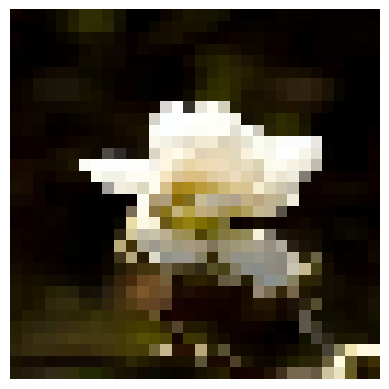

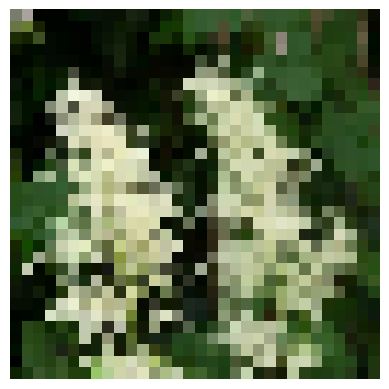

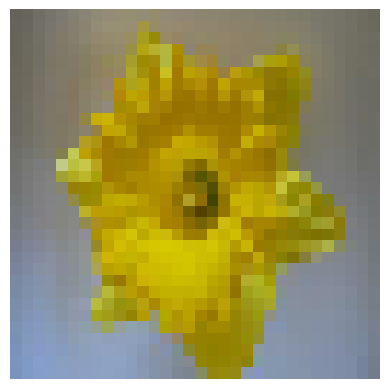

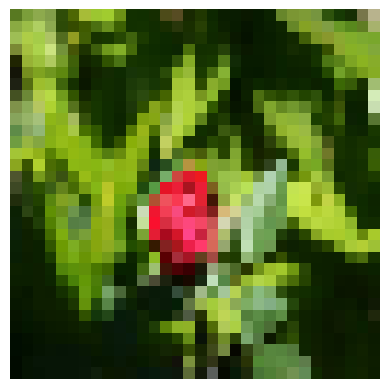

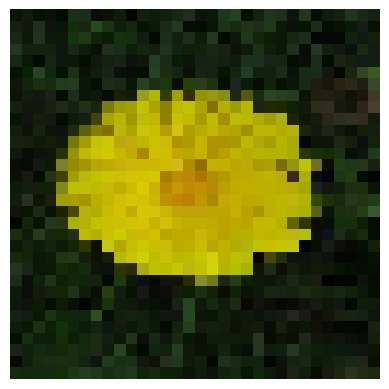

In [4]:
import glob

# 獲取所有子資料夾路徑
subfolders = glob.glob("./dataset/dataset_flowers/*/")
class_names = [folder.rstrip("/") for folder in subfolders]

figsize = 32

# 從文件夾中載入數據集
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "./dataset/dataset_flowers", label_mode=None, seed=123, image_size=(figsize, figsize), batch_size=32,
    class_names=class_names
)

# 正規化數據
dataset = dataset.map(lambda x: x/255.0)

# 顯示五張數據集中的圖片
num_images_to_display = 5
for i, x in enumerate(dataset):
    plt.axis("off")
    plt.imshow((x.numpy() * 255).astype("int32")[0])
    plt.show()

    if i == num_images_to_display - 1:
        break


***

## Part 1 GAN:

#### task(1)
* latent_dim = 10
* epochs = 100 
* show the training history

In [23]:
# 定義生成器
def make_generator_model(latent_dim):
    model = keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256) # 注意：batch size 沒有限制

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)

    return model

# 定義判別器
def make_discriminator_model():
    model = keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

# 定義損失函數
cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# 定義優化器
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

# 定義訓練步驟
@tf.function
def train_step(images, generator, discriminator, latent_dim):
    noise = tf.random.normal([images.shape[0], latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 定義訓練函數
def train(dataset, epochs, generator, discriminator, latent_dim):
    gen_loss_history = []
    disc_loss_history = []
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        gen_loss_sum = 0
        disc_loss_sum = 0
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch, generator, discriminator, latent_dim)
            gen_loss_sum += gen_loss
            disc_loss_sum += disc_loss
        gen_loss_history.append(gen_loss_sum / len(dataset))
        disc_loss_history.append(disc_loss_sum / len(dataset))
        print(f"Generator loss: {gen_loss_history[-1]}, Discriminator loss: {disc_loss_history[-1]}")
        # 每10個epoch顯示一次生成的圖片
        if (epoch + 1) % 10 == 0:
            display_image(generator, latent_dim) ##顯示圖片
    return gen_loss_history, disc_loss_history

# 定義顯示圖片的函數
def display_image(generator, latent_dim):
    noise = tf.random.normal(shape=(1, latent_dim), seed=1)
    generated_image = generator(noise, training=False)
    plt.imshow((generated_image[0, :, :, :] * 127.5 + 127.5) / 255.0)
    plt.axis('off')
    plt.show()

In [24]:

# 載入數據集 備註：僅有太陽花
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "./dataset/dataset_flowers/sunflower", label_mode=None, seed=123, image_size=(32, 32), batch_size=32
)
# 正規化數據
dataset = dataset.map(lambda x: x/255.0)


Found 1027 files belonging to 1 classes.


Epoch 1/2500
Generator loss: 0.5549561977386475, Discriminator loss: 1.1225175857543945
Epoch 2/2500
Generator loss: 0.6172190308570862, Discriminator loss: 1.2511218786239624
Epoch 3/2500
Generator loss: 0.9909285306930542, Discriminator loss: 0.9880475401878357
Epoch 4/2500
Generator loss: 1.3441990613937378, Discriminator loss: 0.8734447360038757
Epoch 5/2500
Generator loss: 1.4254781007766724, Discriminator loss: 0.7178091406822205
Epoch 6/2500
Generator loss: 1.1519784927368164, Discriminator loss: 1.0402379035949707
Epoch 7/2500
Generator loss: 1.0558745861053467, Discriminator loss: 1.1729804277420044
Epoch 8/2500
Generator loss: 1.5246175527572632, Discriminator loss: 0.7878096699714661
Epoch 9/2500
Generator loss: 1.4820281267166138, Discriminator loss: 0.7811374068260193
Epoch 10/2500
Generator loss: 1.6443997621536255, Discriminator loss: 0.7246951460838318


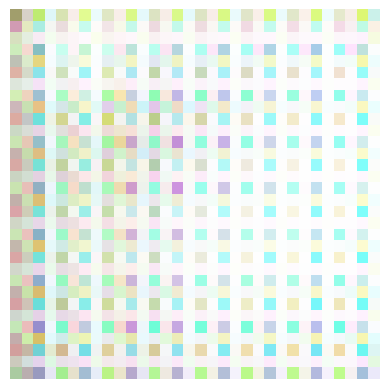

Epoch 11/2500
Generator loss: 1.367727279663086, Discriminator loss: 1.0432796478271484
Epoch 12/2500
Generator loss: 1.5093693733215332, Discriminator loss: 0.9817342758178711
Epoch 13/2500
Generator loss: 1.2677762508392334, Discriminator loss: 0.9508866667747498
Epoch 14/2500
Generator loss: 1.1321772336959839, Discriminator loss: 0.9361457824707031
Epoch 15/2500
Generator loss: 1.5461188554763794, Discriminator loss: 0.9682133793830872
Epoch 16/2500
Generator loss: 1.7135547399520874, Discriminator loss: 1.506421685218811
Epoch 17/2500
Generator loss: 1.7089568376541138, Discriminator loss: 0.8752894401550293
Epoch 18/2500
Generator loss: 1.7571943998336792, Discriminator loss: 0.6426480412483215
Epoch 19/2500
Generator loss: 1.2200772762298584, Discriminator loss: 1.2759929895401
Epoch 20/2500
Generator loss: 1.0026319026947021, Discriminator loss: 1.3707327842712402


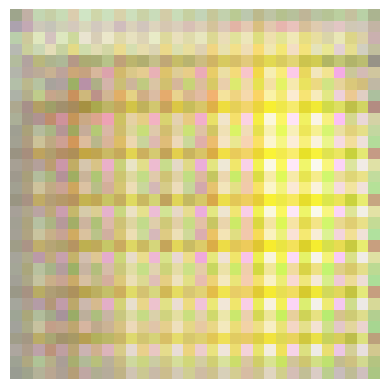

Epoch 21/2500
Generator loss: 1.2737321853637695, Discriminator loss: 1.0927590131759644
Epoch 22/2500
Generator loss: 1.7883474826812744, Discriminator loss: 0.9085712432861328
Epoch 23/2500
Generator loss: 0.9280921816825867, Discriminator loss: 1.5429822206497192
Epoch 24/2500
Generator loss: 1.630765676498413, Discriminator loss: 0.8250461220741272
Epoch 25/2500
Generator loss: 0.9504612684249878, Discriminator loss: 1.2223442792892456
Epoch 26/2500
Generator loss: 0.6534566879272461, Discriminator loss: 1.3912639617919922
Epoch 27/2500
Generator loss: 0.7582613229751587, Discriminator loss: 1.2737957239151
Epoch 28/2500
Generator loss: 0.8334792852401733, Discriminator loss: 1.2329950332641602
Epoch 29/2500
Generator loss: 0.682686984539032, Discriminator loss: 1.5865294933319092
Epoch 30/2500
Generator loss: 0.8267488479614258, Discriminator loss: 1.3659930229187012


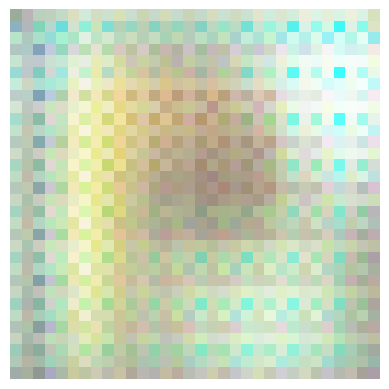

Epoch 31/2500
Generator loss: 0.9760499596595764, Discriminator loss: 1.182287573814392
Epoch 32/2500
Generator loss: 1.0453754663467407, Discriminator loss: 1.1739270687103271
Epoch 33/2500
Generator loss: 0.7749097347259521, Discriminator loss: 1.349940299987793
Epoch 34/2500
Generator loss: 0.7282479405403137, Discriminator loss: 1.3677066564559937
Epoch 35/2500
Generator loss: 0.7293047308921814, Discriminator loss: 1.356750726699829
Epoch 36/2500
Generator loss: 0.881744384765625, Discriminator loss: 1.2485332489013672
Epoch 37/2500
Generator loss: 0.756523609161377, Discriminator loss: 1.4518308639526367
Epoch 38/2500
Generator loss: 0.9242639541625977, Discriminator loss: 1.2058238983154297
Epoch 39/2500
Generator loss: 0.6589775681495667, Discriminator loss: 1.6031805276870728
Epoch 40/2500
Generator loss: 0.7455840706825256, Discriminator loss: 1.4458039999008179


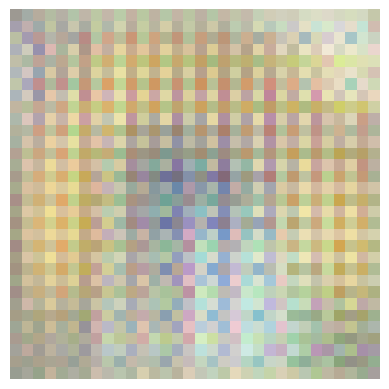

Epoch 41/2500
Generator loss: 1.2768994569778442, Discriminator loss: 0.8723995685577393
Epoch 42/2500
Generator loss: 0.9172495007514954, Discriminator loss: 1.3605436086654663
Epoch 43/2500
Generator loss: 1.0343990325927734, Discriminator loss: 1.135729193687439
Epoch 44/2500
Generator loss: 0.9611223340034485, Discriminator loss: 1.330189824104309
Epoch 45/2500
Generator loss: 0.8880246877670288, Discriminator loss: 1.2847486734390259
Epoch 46/2500
Generator loss: 0.7760669589042664, Discriminator loss: 1.2360224723815918
Epoch 47/2500
Generator loss: 0.9450143575668335, Discriminator loss: 1.2086762189865112
Epoch 48/2500
Generator loss: 1.171229362487793, Discriminator loss: 0.9753371477127075
Epoch 49/2500
Generator loss: 1.2282180786132812, Discriminator loss: 0.9743422269821167
Epoch 50/2500
Generator loss: 0.8957632184028625, Discriminator loss: 1.574942946434021


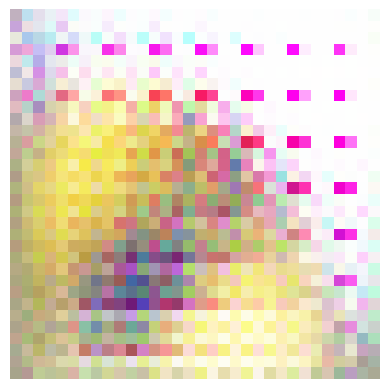

Epoch 51/2500
Generator loss: 1.2288256883621216, Discriminator loss: 1.0010285377502441
Epoch 52/2500
Generator loss: 0.8807743787765503, Discriminator loss: 1.3645708560943604
Epoch 53/2500
Generator loss: 0.8536185026168823, Discriminator loss: 1.312585473060608
Epoch 54/2500
Generator loss: 0.9002660512924194, Discriminator loss: 1.4613394737243652
Epoch 55/2500
Generator loss: 1.0977421998977661, Discriminator loss: 1.2040760517120361
Epoch 56/2500
Generator loss: 1.4189265966415405, Discriminator loss: 0.8641718029975891
Epoch 57/2500
Generator loss: 1.190717101097107, Discriminator loss: 1.153411626815796
Epoch 58/2500
Generator loss: 1.3684146404266357, Discriminator loss: 0.9939578771591187
Epoch 59/2500
Generator loss: 0.7388303279876709, Discriminator loss: 1.7354267835617065
Epoch 60/2500
Generator loss: 1.1381410360336304, Discriminator loss: 0.9791607856750488


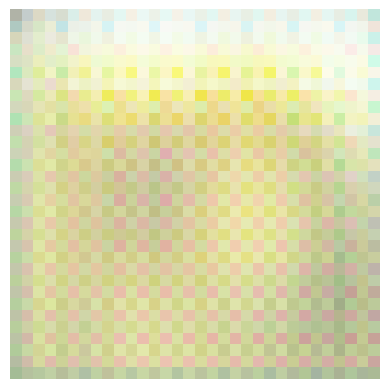

Epoch 61/2500
Generator loss: 0.6091530323028564, Discriminator loss: 1.5327110290527344
Epoch 62/2500
Generator loss: 0.6208512187004089, Discriminator loss: 1.4762217998504639
Epoch 63/2500
Generator loss: 0.6998280882835388, Discriminator loss: 1.3757514953613281
Epoch 64/2500
Generator loss: 0.9238430261611938, Discriminator loss: 1.1687201261520386
Epoch 65/2500
Generator loss: 0.9919371008872986, Discriminator loss: 1.1320637464523315
Epoch 66/2500
Generator loss: 1.0212008953094482, Discriminator loss: 1.225809931755066
Epoch 67/2500
Generator loss: 1.7296503782272339, Discriminator loss: 0.7667527794837952
Epoch 68/2500
Generator loss: 2.255282163619995, Discriminator loss: 0.801106870174408
Epoch 69/2500
Generator loss: 2.4095988273620605, Discriminator loss: 0.6788432002067566
Epoch 70/2500
Generator loss: 1.372970700263977, Discriminator loss: 1.0186630487442017


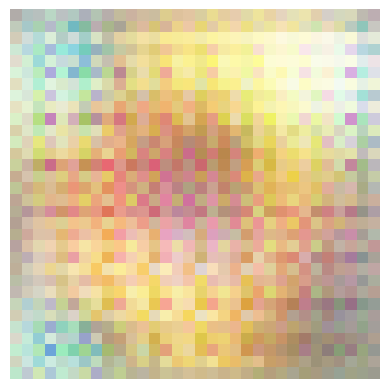

Epoch 71/2500
Generator loss: 1.1087818145751953, Discriminator loss: 1.2364630699157715
Epoch 72/2500
Generator loss: 0.8535966277122498, Discriminator loss: 1.571879506111145
Epoch 73/2500
Generator loss: 1.4993653297424316, Discriminator loss: 0.9184906482696533
Epoch 74/2500
Generator loss: 1.0259952545166016, Discriminator loss: 1.1359435319900513
Epoch 75/2500
Generator loss: 1.1487752199172974, Discriminator loss: 1.374226450920105
Epoch 76/2500
Generator loss: 1.377673625946045, Discriminator loss: 1.1568965911865234
Epoch 77/2500
Generator loss: 1.0970951318740845, Discriminator loss: 1.2607141733169556
Epoch 78/2500
Generator loss: 1.0222629308700562, Discriminator loss: 1.7233327627182007
Epoch 79/2500
Generator loss: 1.142075538635254, Discriminator loss: 1.1981887817382812
Epoch 80/2500
Generator loss: 1.0882375240325928, Discriminator loss: 1.2684754133224487


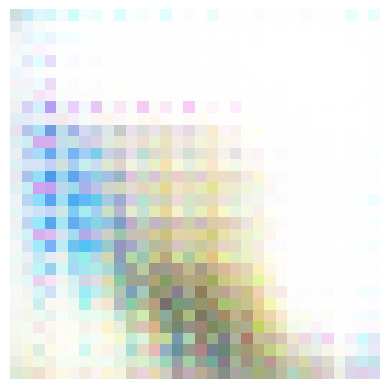

Epoch 81/2500
Generator loss: 0.7294645309448242, Discriminator loss: 1.5686681270599365
Epoch 82/2500
Generator loss: 1.0970677137374878, Discriminator loss: 1.1017768383026123
Epoch 83/2500
Generator loss: 0.7624152302742004, Discriminator loss: 1.6364035606384277
Epoch 84/2500
Generator loss: 1.0350803136825562, Discriminator loss: 1.2149931192398071
Epoch 85/2500
Generator loss: 1.07412588596344, Discriminator loss: 1.3095887899398804
Epoch 86/2500
Generator loss: 0.6956959366798401, Discriminator loss: 1.777047038078308
Epoch 87/2500
Generator loss: 0.8192886710166931, Discriminator loss: 1.350288987159729
Epoch 88/2500
Generator loss: 0.6824202537536621, Discriminator loss: 1.4342154264450073
Epoch 89/2500
Generator loss: 0.8770925998687744, Discriminator loss: 1.2949613332748413
Epoch 90/2500
Generator loss: 0.931023359298706, Discriminator loss: 1.4014025926589966


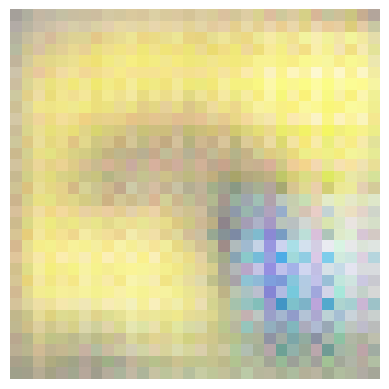

Epoch 91/2500
Generator loss: 0.7983437776565552, Discriminator loss: 1.445975422859192
Epoch 92/2500
Generator loss: 0.8747163414955139, Discriminator loss: 1.159317135810852
Epoch 93/2500
Generator loss: 0.9088432788848877, Discriminator loss: 1.1646229028701782
Epoch 94/2500
Generator loss: 0.6366357803344727, Discriminator loss: 1.7287384271621704
Epoch 95/2500
Generator loss: 0.7241525053977966, Discriminator loss: 1.517798900604248
Epoch 96/2500
Generator loss: 0.8095477223396301, Discriminator loss: 1.355096459388733
Epoch 97/2500
Generator loss: 0.9515553116798401, Discriminator loss: 1.1106269359588623
Epoch 98/2500
Generator loss: 0.7131299376487732, Discriminator loss: 1.4392921924591064
Epoch 99/2500
Generator loss: 0.7259042859077454, Discriminator loss: 1.4861937761306763
Epoch 100/2500
Generator loss: 0.9023104906082153, Discriminator loss: 1.2021071910858154


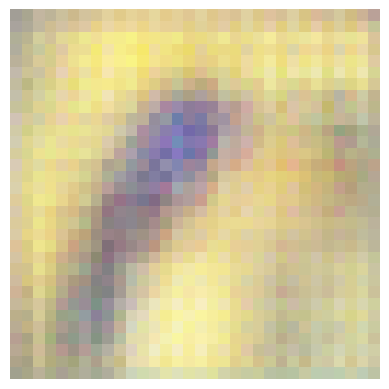

Epoch 101/2500
Generator loss: 0.7219566702842712, Discriminator loss: 1.501142978668213
Epoch 102/2500
Generator loss: 0.9088385701179504, Discriminator loss: 1.1362600326538086
Epoch 103/2500
Generator loss: 0.5965267419815063, Discriminator loss: 1.5991400480270386
Epoch 104/2500
Generator loss: 0.8064679503440857, Discriminator loss: 1.3435920476913452
Epoch 105/2500
Generator loss: 0.9072085022926331, Discriminator loss: 1.1714657545089722
Epoch 106/2500
Generator loss: 0.8046638369560242, Discriminator loss: 1.3544838428497314
Epoch 107/2500
Generator loss: 0.5666515231132507, Discriminator loss: 1.700459361076355
Epoch 108/2500
Generator loss: 0.9999396800994873, Discriminator loss: 1.0417170524597168
Epoch 109/2500
Generator loss: 0.7827682495117188, Discriminator loss: 1.4081454277038574
Epoch 110/2500
Generator loss: 0.7018349170684814, Discriminator loss: 1.5119500160217285


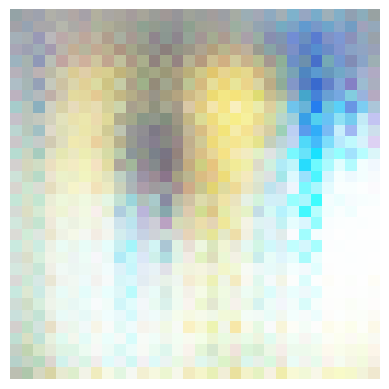

Epoch 111/2500
Generator loss: 0.9505349397659302, Discriminator loss: 1.0966882705688477
Epoch 112/2500
Generator loss: 0.7165020704269409, Discriminator loss: 1.3760676383972168
Epoch 113/2500
Generator loss: 0.6879428625106812, Discriminator loss: 1.3681315183639526
Epoch 114/2500
Generator loss: 0.7860682606697083, Discriminator loss: 1.32816481590271
Epoch 115/2500
Generator loss: 0.8268643617630005, Discriminator loss: 1.281388282775879
Epoch 116/2500
Generator loss: 0.8814292550086975, Discriminator loss: 1.2779635190963745
Epoch 117/2500
Generator loss: 0.7475202679634094, Discriminator loss: 1.5474879741668701
Epoch 118/2500
Generator loss: 0.8210098147392273, Discriminator loss: 1.283736228942871
Epoch 119/2500
Generator loss: 0.9098358154296875, Discriminator loss: 1.2226481437683105
Epoch 120/2500
Generator loss: 0.8290746212005615, Discriminator loss: 1.380685806274414


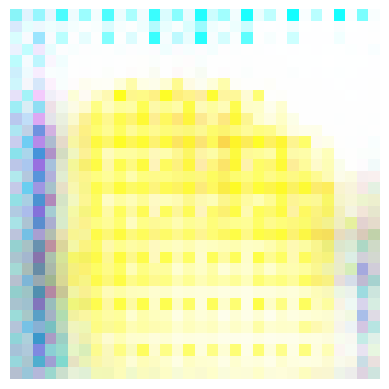

Epoch 121/2500
Generator loss: 0.9032149910926819, Discriminator loss: 1.2239460945129395
Epoch 122/2500
Generator loss: 0.7750645279884338, Discriminator loss: 1.3857640027999878
Epoch 123/2500
Generator loss: 0.9761611223220825, Discriminator loss: 1.2854119539260864
Epoch 124/2500
Generator loss: 0.8536146879196167, Discriminator loss: 1.4195911884307861
Epoch 125/2500
Generator loss: 0.8127679824829102, Discriminator loss: 1.4381498098373413
Epoch 126/2500
Generator loss: 0.9960296154022217, Discriminator loss: 1.1222397089004517
Epoch 127/2500
Generator loss: 0.7638416886329651, Discriminator loss: 1.3876872062683105
Epoch 128/2500
Generator loss: 1.0003622770309448, Discriminator loss: 1.2794194221496582
Epoch 129/2500
Generator loss: 1.0136778354644775, Discriminator loss: 1.3322505950927734
Epoch 130/2500
Generator loss: 0.8675006628036499, Discriminator loss: 1.2305235862731934


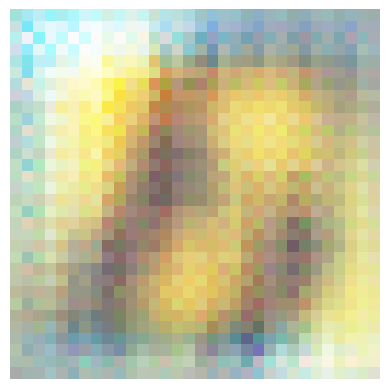

Epoch 131/2500
Generator loss: 0.9378092885017395, Discriminator loss: 1.130989909172058
Epoch 132/2500
Generator loss: 0.9619531631469727, Discriminator loss: 1.1528854370117188
Epoch 133/2500
Generator loss: 1.0177754163742065, Discriminator loss: 1.145160436630249
Epoch 134/2500
Generator loss: 0.7576904892921448, Discriminator loss: 1.527348518371582
Epoch 135/2500
Generator loss: 1.1552201509475708, Discriminator loss: 0.9834991097450256
Epoch 136/2500
Generator loss: 0.9168167114257812, Discriminator loss: 1.4914106130599976
Epoch 137/2500
Generator loss: 0.9933714270591736, Discriminator loss: 1.2156285047531128
Epoch 138/2500
Generator loss: 0.9283971786499023, Discriminator loss: 1.13600754737854
Epoch 139/2500
Generator loss: 1.0246350765228271, Discriminator loss: 0.9428592920303345
Epoch 140/2500
Generator loss: 0.7525997161865234, Discriminator loss: 1.3981693983078003


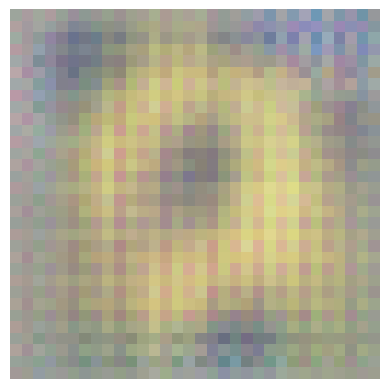

Epoch 141/2500
Generator loss: 0.8086335062980652, Discriminator loss: 1.3717918395996094
Epoch 142/2500
Generator loss: 0.9770218729972839, Discriminator loss: 1.2221707105636597
Epoch 143/2500
Generator loss: 1.221518635749817, Discriminator loss: 0.9714991450309753
Epoch 144/2500
Generator loss: 1.260773777961731, Discriminator loss: 1.0674771070480347
Epoch 145/2500
Generator loss: 1.0459253787994385, Discriminator loss: 1.2203730344772339
Epoch 146/2500
Generator loss: 0.9530871510505676, Discriminator loss: 1.2855603694915771
Epoch 147/2500
Generator loss: 0.9759647250175476, Discriminator loss: 1.5982342958450317
Epoch 148/2500
Generator loss: 0.8888325095176697, Discriminator loss: 1.3019737005233765
Epoch 149/2500
Generator loss: 1.0289287567138672, Discriminator loss: 1.0292893648147583
Epoch 150/2500
Generator loss: 0.8280146718025208, Discriminator loss: 1.2486952543258667


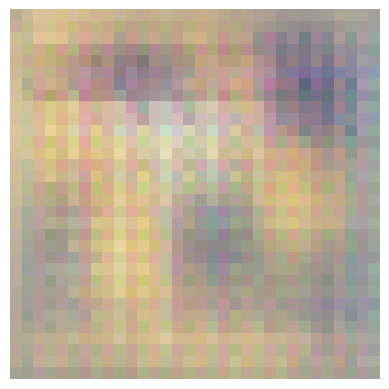

Epoch 151/2500
Generator loss: 0.787138819694519, Discriminator loss: 1.4103238582611084
Epoch 152/2500
Generator loss: 1.1448860168457031, Discriminator loss: 1.0563063621520996
Epoch 153/2500
Generator loss: 1.008243441581726, Discriminator loss: 1.213491678237915
Epoch 154/2500
Generator loss: 1.0762680768966675, Discriminator loss: 1.3523025512695312
Epoch 155/2500
Generator loss: 0.6682804226875305, Discriminator loss: 1.840401530265808
Epoch 156/2500
Generator loss: 1.3911916017532349, Discriminator loss: 0.7658352255821228
Epoch 157/2500
Generator loss: 1.1013033390045166, Discriminator loss: 1.1287403106689453
Epoch 158/2500
Generator loss: 1.056745171546936, Discriminator loss: 1.213427186012268
Epoch 159/2500
Generator loss: 0.8451610207557678, Discriminator loss: 1.5056568384170532
Epoch 160/2500
Generator loss: 0.8475520610809326, Discriminator loss: 1.3511396646499634


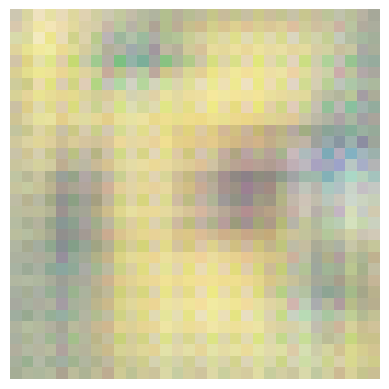

Epoch 161/2500
Generator loss: 0.9149365425109863, Discriminator loss: 1.1809892654418945
Epoch 162/2500
Generator loss: 0.7917947769165039, Discriminator loss: 1.3464442491531372
Epoch 163/2500
Generator loss: 1.0409748554229736, Discriminator loss: 1.099745273590088
Epoch 164/2500
Generator loss: 0.713409960269928, Discriminator loss: 1.671837329864502
Epoch 165/2500
Generator loss: 1.0737552642822266, Discriminator loss: 1.1705749034881592
Epoch 166/2500
Generator loss: 1.2360111474990845, Discriminator loss: 1.1431678533554077
Epoch 167/2500
Generator loss: 0.7922002077102661, Discriminator loss: 1.4845951795578003
Epoch 168/2500
Generator loss: 1.1300722360610962, Discriminator loss: 1.034792184829712
Epoch 169/2500
Generator loss: 1.0409340858459473, Discriminator loss: 1.2690701484680176
Epoch 170/2500
Generator loss: 0.9195585250854492, Discriminator loss: 1.416515827178955


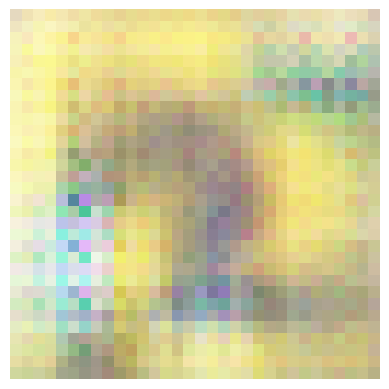

Epoch 171/2500
Generator loss: 0.8652957677841187, Discriminator loss: 1.3992369174957275
Epoch 172/2500
Generator loss: 0.8599565029144287, Discriminator loss: 1.361633062362671
Epoch 173/2500
Generator loss: 0.9176620841026306, Discriminator loss: 1.1901196241378784
Epoch 174/2500
Generator loss: 0.8334736824035645, Discriminator loss: 1.3624365329742432
Epoch 175/2500
Generator loss: 0.9948288798332214, Discriminator loss: 1.1907066106796265
Epoch 176/2500
Generator loss: 0.8885223865509033, Discriminator loss: 1.2808513641357422
Epoch 177/2500
Generator loss: 0.929485559463501, Discriminator loss: 1.258330225944519
Epoch 178/2500
Generator loss: 1.0076401233673096, Discriminator loss: 1.1448262929916382
Epoch 179/2500
Generator loss: 0.9792627096176147, Discriminator loss: 1.152307152748108
Epoch 180/2500
Generator loss: 0.8516491055488586, Discriminator loss: 1.5145258903503418


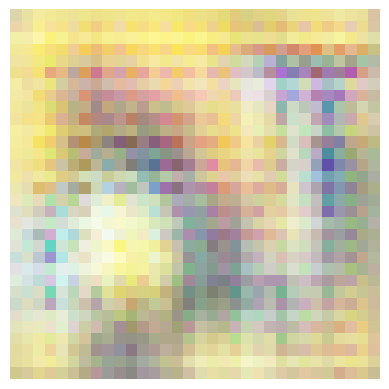

Epoch 181/2500
Generator loss: 0.8999816179275513, Discriminator loss: 1.4510023593902588
Epoch 182/2500
Generator loss: 0.9946446418762207, Discriminator loss: 1.2562224864959717
Epoch 183/2500
Generator loss: 0.8474310040473938, Discriminator loss: 1.4287925958633423
Epoch 184/2500
Generator loss: 0.9217118620872498, Discriminator loss: 1.2720695734024048
Epoch 185/2500
Generator loss: 1.1499419212341309, Discriminator loss: 0.9738701581954956
Epoch 186/2500
Generator loss: 1.011296033859253, Discriminator loss: 1.2043704986572266
Epoch 187/2500
Generator loss: 1.068368911743164, Discriminator loss: 1.2333049774169922
Epoch 188/2500
Generator loss: 0.8640629053115845, Discriminator loss: 1.484384536743164
Epoch 189/2500
Generator loss: 1.1486326456069946, Discriminator loss: 1.0504118204116821
Epoch 190/2500
Generator loss: 0.7877624034881592, Discriminator loss: 1.4996873140335083


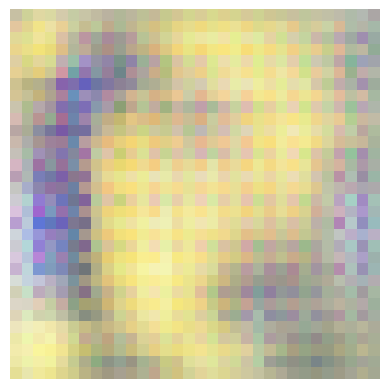

Epoch 191/2500
Generator loss: 0.8269732594490051, Discriminator loss: 1.3272931575775146
Epoch 192/2500
Generator loss: 1.0454254150390625, Discriminator loss: 1.1324669122695923
Epoch 193/2500
Generator loss: 1.086923360824585, Discriminator loss: 1.0674084424972534
Epoch 194/2500
Generator loss: 0.9153777956962585, Discriminator loss: 1.355641484260559
Epoch 195/2500
Generator loss: 1.2852383852005005, Discriminator loss: 0.9975343346595764
Epoch 196/2500
Generator loss: 1.029707431793213, Discriminator loss: 1.2444283962249756
Epoch 197/2500
Generator loss: 0.753631055355072, Discriminator loss: 1.6465758085250854
Epoch 198/2500
Generator loss: 0.9840087890625, Discriminator loss: 1.1638023853302002
Epoch 199/2500
Generator loss: 0.9597300291061401, Discriminator loss: 1.0443533658981323
Epoch 200/2500
Generator loss: 0.7951340675354004, Discriminator loss: 1.2571048736572266


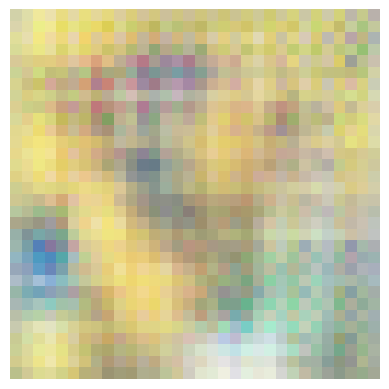

Epoch 201/2500
Generator loss: 0.8264135122299194, Discriminator loss: 1.2563434839248657
Epoch 202/2500
Generator loss: 0.837162435054779, Discriminator loss: 1.3066556453704834
Epoch 203/2500
Generator loss: 0.8378530144691467, Discriminator loss: 1.2910621166229248
Epoch 204/2500
Generator loss: 0.9613571763038635, Discriminator loss: 1.3662642240524292
Epoch 205/2500
Generator loss: 0.8007797598838806, Discriminator loss: 1.6595083475112915
Epoch 206/2500
Generator loss: 1.1922056674957275, Discriminator loss: 1.0200440883636475
Epoch 207/2500
Generator loss: 1.0671874284744263, Discriminator loss: 1.1925100088119507
Epoch 208/2500
Generator loss: 1.2227731943130493, Discriminator loss: 0.9678691625595093
Epoch 209/2500
Generator loss: 0.9372076392173767, Discriminator loss: 1.1558237075805664
Epoch 210/2500
Generator loss: 0.9351123571395874, Discriminator loss: 1.3458510637283325


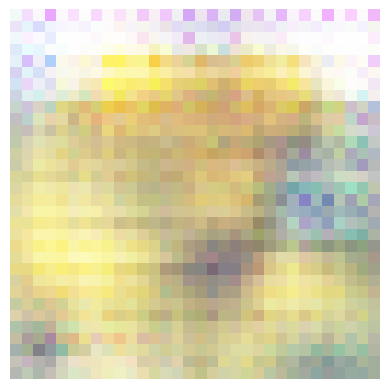

Epoch 211/2500
Generator loss: 0.96015864610672, Discriminator loss: 1.1982977390289307
Epoch 212/2500
Generator loss: 0.6800870895385742, Discriminator loss: 1.596533179283142
Epoch 213/2500
Generator loss: 0.8831081390380859, Discriminator loss: 1.248677372932434
Epoch 214/2500
Generator loss: 0.7097169756889343, Discriminator loss: 1.4884777069091797
Epoch 215/2500
Generator loss: 0.837845504283905, Discriminator loss: 1.2933659553527832
Epoch 216/2500
Generator loss: 0.849384605884552, Discriminator loss: 1.2303732633590698
Epoch 217/2500
Generator loss: 0.8314546942710876, Discriminator loss: 1.2934964895248413
Epoch 218/2500
Generator loss: 0.858892560005188, Discriminator loss: 1.3264039754867554
Epoch 219/2500
Generator loss: 1.0843994617462158, Discriminator loss: 1.149393081665039
Epoch 220/2500
Generator loss: 0.9386729001998901, Discriminator loss: 1.474382996559143


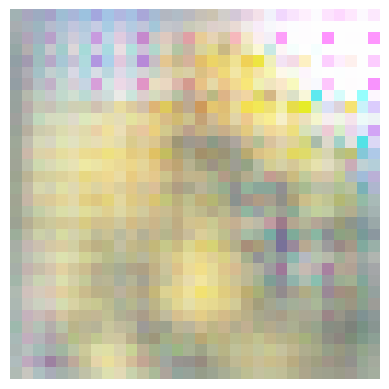

Epoch 221/2500
Generator loss: 1.1914366483688354, Discriminator loss: 0.9595426917076111
Epoch 222/2500
Generator loss: 0.815455436706543, Discriminator loss: 1.4353891611099243
Epoch 223/2500
Generator loss: 0.7975930571556091, Discriminator loss: 1.4073562622070312
Epoch 224/2500
Generator loss: 0.8269984722137451, Discriminator loss: 1.2965716123580933
Epoch 225/2500
Generator loss: 0.7798081636428833, Discriminator loss: 1.371117353439331
Epoch 226/2500
Generator loss: 0.8446080684661865, Discriminator loss: 1.295188069343567
Epoch 227/2500
Generator loss: 0.8052789568901062, Discriminator loss: 1.4485888481140137
Epoch 228/2500
Generator loss: 0.9453410506248474, Discriminator loss: 1.3148837089538574
Epoch 229/2500
Generator loss: 0.9093363285064697, Discriminator loss: 1.3193265199661255
Epoch 230/2500
Generator loss: 0.9146459102630615, Discriminator loss: 1.248741626739502


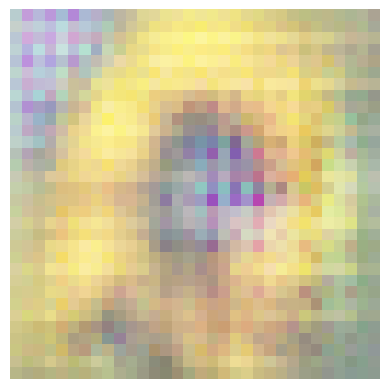

Epoch 231/2500
Generator loss: 0.8123299479484558, Discriminator loss: 1.3389332294464111
Epoch 232/2500
Generator loss: 1.0050617456436157, Discriminator loss: 1.1159453392028809
Epoch 233/2500
Generator loss: 0.6889968514442444, Discriminator loss: 1.5525206327438354
Epoch 234/2500
Generator loss: 0.9689249396324158, Discriminator loss: 1.187745451927185
Epoch 235/2500
Generator loss: 0.8305585384368896, Discriminator loss: 1.2688002586364746
Epoch 236/2500
Generator loss: 0.7914620041847229, Discriminator loss: 1.2781752347946167
Epoch 237/2500
Generator loss: 0.8090002536773682, Discriminator loss: 1.3034093379974365
Epoch 238/2500
Generator loss: 0.8592945337295532, Discriminator loss: 1.433648705482483
Epoch 239/2500
Generator loss: 0.8289082646369934, Discriminator loss: 1.4399240016937256
Epoch 240/2500
Generator loss: 0.9126484990119934, Discriminator loss: 1.2662208080291748


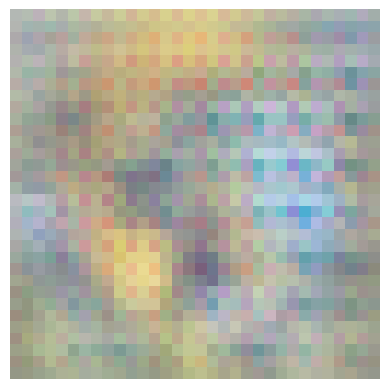

Epoch 241/2500
Generator loss: 1.1267304420471191, Discriminator loss: 1.0289214849472046
Epoch 242/2500
Generator loss: 0.7338711619377136, Discriminator loss: 1.5777901411056519
Epoch 243/2500
Generator loss: 0.9071649312973022, Discriminator loss: 1.2517226934432983
Epoch 244/2500
Generator loss: 0.8085696697235107, Discriminator loss: 1.3440959453582764
Epoch 245/2500
Generator loss: 0.8022662401199341, Discriminator loss: 1.2964073419570923
Epoch 246/2500
Generator loss: 0.6752952933311462, Discriminator loss: 1.4826242923736572
Epoch 247/2500
Generator loss: 0.8506296277046204, Discriminator loss: 1.243445634841919
Epoch 248/2500
Generator loss: 0.923872709274292, Discriminator loss: 1.2887613773345947
Epoch 249/2500
Generator loss: 0.8045318126678467, Discriminator loss: 1.4604268074035645
Epoch 250/2500
Generator loss: 0.9729874134063721, Discriminator loss: 1.1862789392471313


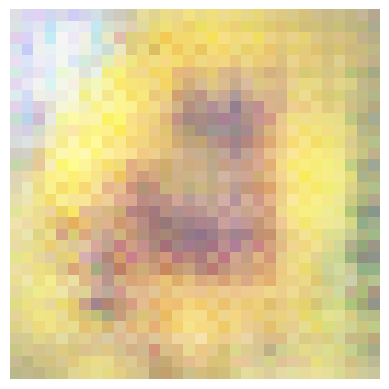

Epoch 251/2500
Generator loss: 0.804627537727356, Discriminator loss: 1.3833128213882446
Epoch 252/2500
Generator loss: 0.9301078915596008, Discriminator loss: 1.1902477741241455
Epoch 253/2500
Generator loss: 0.8627293109893799, Discriminator loss: 1.2826673984527588
Epoch 254/2500
Generator loss: 0.9064425826072693, Discriminator loss: 1.2755550146102905
Epoch 255/2500
Generator loss: 0.7308065891265869, Discriminator loss: 1.4927314519882202
Epoch 256/2500
Generator loss: 0.93116295337677, Discriminator loss: 1.1948158740997314
Epoch 257/2500
Generator loss: 0.9930955171585083, Discriminator loss: 1.1258448362350464
Epoch 258/2500
Generator loss: 0.8357048034667969, Discriminator loss: 1.4011142253875732
Epoch 259/2500
Generator loss: 0.8728276491165161, Discriminator loss: 1.3645055294036865
Epoch 260/2500
Generator loss: 0.915995180606842, Discriminator loss: 1.2042639255523682


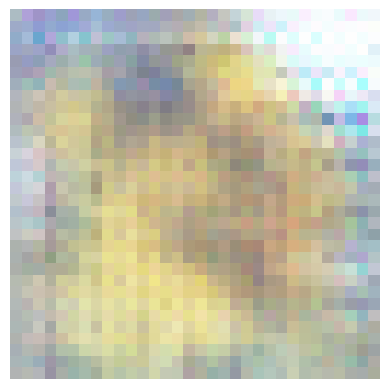

Epoch 261/2500
Generator loss: 1.0114213228225708, Discriminator loss: 1.0734879970550537
Epoch 262/2500
Generator loss: 1.008876085281372, Discriminator loss: 1.1343283653259277
Epoch 263/2500
Generator loss: 0.9635066390037537, Discriminator loss: 1.2157520055770874
Epoch 264/2500
Generator loss: 0.7532001733779907, Discriminator loss: 1.4219493865966797
Epoch 265/2500
Generator loss: 0.9531551003456116, Discriminator loss: 1.1072561740875244
Epoch 266/2500
Generator loss: 0.6984490156173706, Discriminator loss: 1.4351259469985962
Epoch 267/2500
Generator loss: 0.8202264904975891, Discriminator loss: 1.2986466884613037
Epoch 268/2500
Generator loss: 0.8473610877990723, Discriminator loss: 1.2996875047683716
Epoch 269/2500
Generator loss: 0.8882071375846863, Discriminator loss: 1.3082592487335205
Epoch 270/2500
Generator loss: 1.1294541358947754, Discriminator loss: 1.0224055051803589


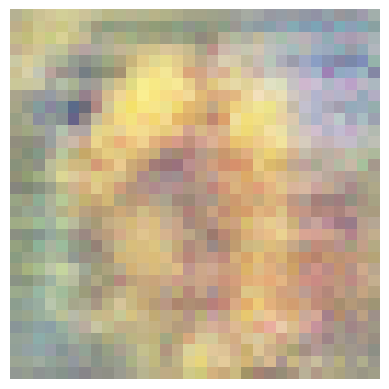

Epoch 271/2500
Generator loss: 0.8000802397727966, Discriminator loss: 1.6687506437301636
Epoch 272/2500
Generator loss: 0.9629071354866028, Discriminator loss: 1.3477691411972046
Epoch 273/2500
Generator loss: 0.9153331518173218, Discriminator loss: 1.2828539609909058
Epoch 274/2500
Generator loss: 1.0101081132888794, Discriminator loss: 1.1165841817855835
Epoch 275/2500
Generator loss: 0.8399359583854675, Discriminator loss: 1.280400276184082
Epoch 276/2500
Generator loss: 0.8135536909103394, Discriminator loss: 1.3549214601516724
Epoch 277/2500
Generator loss: 0.9327060580253601, Discriminator loss: 1.2738869190216064
Epoch 278/2500
Generator loss: 0.7352185845375061, Discriminator loss: 1.5005474090576172
Epoch 279/2500
Generator loss: 0.962946355342865, Discriminator loss: 1.201997995376587
Epoch 280/2500
Generator loss: 0.7248411178588867, Discriminator loss: 1.4501057863235474


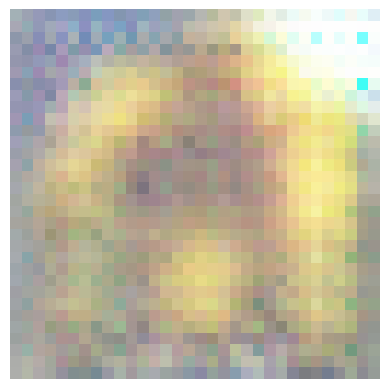

Epoch 281/2500
Generator loss: 0.8008915185928345, Discriminator loss: 1.3039547204971313
Epoch 282/2500
Generator loss: 0.7805865406990051, Discriminator loss: 1.3126543760299683
Epoch 283/2500
Generator loss: 0.8821955919265747, Discriminator loss: 1.2142133712768555
Epoch 284/2500
Generator loss: 1.0071462392807007, Discriminator loss: 1.2282260656356812
Epoch 285/2500
Generator loss: 1.071991205215454, Discriminator loss: 1.2179871797561646
Epoch 286/2500
Generator loss: 0.9538911581039429, Discriminator loss: 1.235537052154541
Epoch 287/2500
Generator loss: 0.8486509323120117, Discriminator loss: 1.27938711643219
Epoch 288/2500
Generator loss: 0.8171371221542358, Discriminator loss: 1.28010094165802
Epoch 289/2500
Generator loss: 0.8114753365516663, Discriminator loss: 1.2529491186141968
Epoch 290/2500
Generator loss: 0.8606061935424805, Discriminator loss: 1.2869892120361328


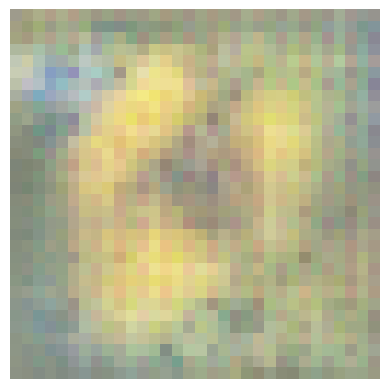

Epoch 291/2500
Generator loss: 0.8814843893051147, Discriminator loss: 1.3428469896316528
Epoch 292/2500
Generator loss: 0.9016613960266113, Discriminator loss: 1.3891611099243164
Epoch 293/2500
Generator loss: 1.2304919958114624, Discriminator loss: 0.9988347887992859
Epoch 294/2500
Generator loss: 1.0105931758880615, Discriminator loss: 1.2468112707138062
Epoch 295/2500
Generator loss: 1.010471224784851, Discriminator loss: 1.1897449493408203
Epoch 296/2500
Generator loss: 0.8830981254577637, Discriminator loss: 1.4982444047927856
Epoch 297/2500
Generator loss: 0.7163693308830261, Discriminator loss: 1.5732959508895874
Epoch 298/2500
Generator loss: 0.9524473547935486, Discriminator loss: 1.1530959606170654
Epoch 299/2500
Generator loss: 0.7778288722038269, Discriminator loss: 1.3707023859024048
Epoch 300/2500
Generator loss: 0.898992121219635, Discriminator loss: 1.2572705745697021


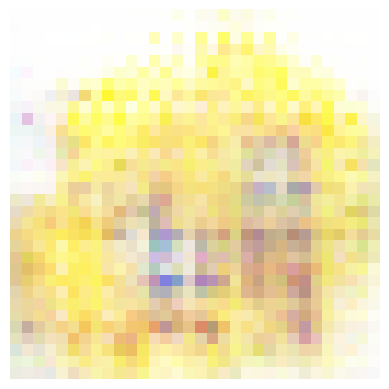

Epoch 301/2500
Generator loss: 0.8682092428207397, Discriminator loss: 1.3660706281661987
Epoch 302/2500
Generator loss: 1.119947075843811, Discriminator loss: 1.0197619199752808
Epoch 303/2500
Generator loss: 0.8947537541389465, Discriminator loss: 1.2556148767471313
Epoch 304/2500
Generator loss: 0.8611502647399902, Discriminator loss: 1.2083005905151367
Epoch 305/2500
Generator loss: 0.8229460716247559, Discriminator loss: 1.233378529548645
Epoch 306/2500
Generator loss: 0.7288538217544556, Discriminator loss: 1.4429668188095093
Epoch 307/2500
Generator loss: 0.9020138382911682, Discriminator loss: 1.2632339000701904
Epoch 308/2500
Generator loss: 0.7903786301612854, Discriminator loss: 1.3575749397277832
Epoch 309/2500
Generator loss: 0.8382160663604736, Discriminator loss: 1.3294382095336914
Epoch 310/2500
Generator loss: 0.9120287895202637, Discriminator loss: 1.272379994392395


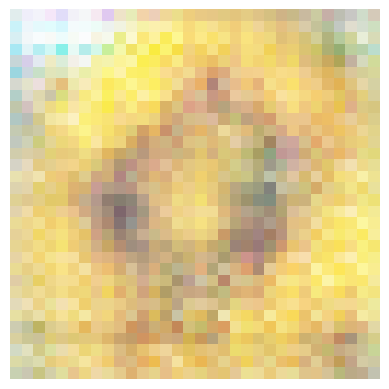

Epoch 311/2500
Generator loss: 0.9732053279876709, Discriminator loss: 1.3773705959320068
Epoch 312/2500
Generator loss: 1.2067638635635376, Discriminator loss: 1.0505620241165161
Epoch 313/2500
Generator loss: 0.8541333079338074, Discriminator loss: 1.41846764087677
Epoch 314/2500
Generator loss: 0.7625921964645386, Discriminator loss: 1.4607172012329102
Epoch 315/2500
Generator loss: 0.8228504061698914, Discriminator loss: 1.273978352546692
Epoch 316/2500
Generator loss: 0.7750983834266663, Discriminator loss: 1.3332266807556152
Epoch 317/2500
Generator loss: 0.791720986366272, Discriminator loss: 1.339844822883606
Epoch 318/2500
Generator loss: 0.9017650485038757, Discriminator loss: 1.3323272466659546
Epoch 319/2500
Generator loss: 0.9764776229858398, Discriminator loss: 1.2069894075393677
Epoch 320/2500
Generator loss: 0.9040640592575073, Discriminator loss: 1.1678485870361328


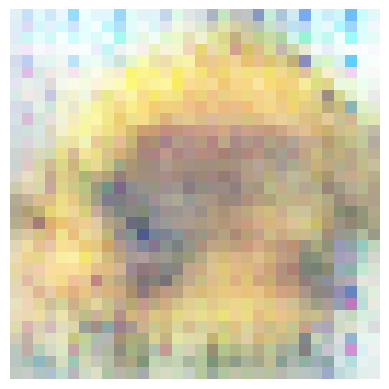

Epoch 321/2500
Generator loss: 0.8170711398124695, Discriminator loss: 1.346713662147522
Epoch 322/2500
Generator loss: 1.0137323141098022, Discriminator loss: 1.2926576137542725
Epoch 323/2500
Generator loss: 0.9137333035469055, Discriminator loss: 1.4083172082901
Epoch 324/2500
Generator loss: 0.9183187484741211, Discriminator loss: 1.289264440536499
Epoch 325/2500
Generator loss: 0.9281075596809387, Discriminator loss: 1.2364330291748047
Epoch 326/2500
Generator loss: 0.7182585597038269, Discriminator loss: 1.4611749649047852
Epoch 327/2500
Generator loss: 1.1284486055374146, Discriminator loss: 0.9208085536956787
Epoch 328/2500
Generator loss: 0.7860788702964783, Discriminator loss: 1.4719520807266235
Epoch 329/2500
Generator loss: 0.801998496055603, Discriminator loss: 1.427551031112671
Epoch 330/2500
Generator loss: 0.9307569861412048, Discriminator loss: 1.1836177110671997


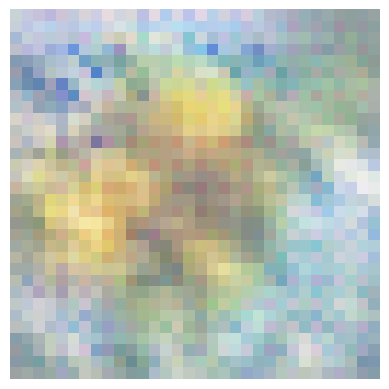

Epoch 331/2500
Generator loss: 0.9497007131576538, Discriminator loss: 1.1901425123214722
Epoch 332/2500
Generator loss: 0.8915606737136841, Discriminator loss: 1.319254755973816
Epoch 333/2500
Generator loss: 0.7863765954971313, Discriminator loss: 1.447075366973877
Epoch 334/2500
Generator loss: 1.1199309825897217, Discriminator loss: 0.9214068651199341
Epoch 335/2500
Generator loss: 0.7575238943099976, Discriminator loss: 1.4418818950653076
Epoch 336/2500
Generator loss: 1.0495699644088745, Discriminator loss: 1.1649574041366577
Epoch 337/2500
Generator loss: 0.9119219779968262, Discriminator loss: 1.3945729732513428
Epoch 338/2500
Generator loss: 1.0089820623397827, Discriminator loss: 1.1935323476791382
Epoch 339/2500
Generator loss: 0.8236796259880066, Discriminator loss: 1.3215328454971313
Epoch 340/2500
Generator loss: 0.877727746963501, Discriminator loss: 1.3316320180892944


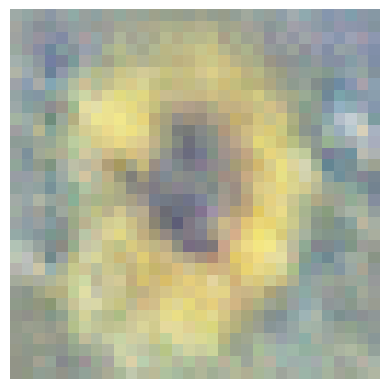

Epoch 341/2500
Generator loss: 0.7396472096443176, Discriminator loss: 1.4870859384536743
Epoch 342/2500
Generator loss: 0.8880526423454285, Discriminator loss: 1.146847128868103
Epoch 343/2500
Generator loss: 0.867413341999054, Discriminator loss: 1.2369318008422852
Epoch 344/2500
Generator loss: 0.805280327796936, Discriminator loss: 1.4205398559570312
Epoch 345/2500
Generator loss: 0.8822751045227051, Discriminator loss: 1.3743282556533813
Epoch 346/2500
Generator loss: 0.868556022644043, Discriminator loss: 1.3158767223358154
Epoch 347/2500
Generator loss: 0.8856937885284424, Discriminator loss: 1.2649579048156738
Epoch 348/2500
Generator loss: 0.7064894437789917, Discriminator loss: 1.4801603555679321
Epoch 349/2500
Generator loss: 0.9925890564918518, Discriminator loss: 1.1571837663650513
Epoch 350/2500
Generator loss: 1.004001498222351, Discriminator loss: 1.2417389154434204


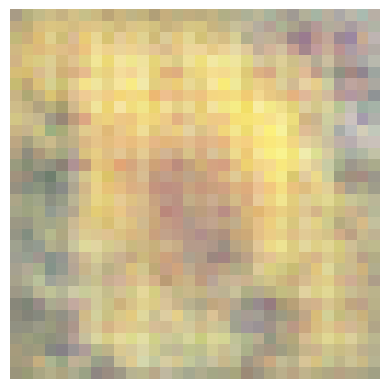

Epoch 351/2500
Generator loss: 1.0447524785995483, Discriminator loss: 1.2308101654052734
Epoch 352/2500
Generator loss: 0.95511794090271, Discriminator loss: 1.2096558809280396
Epoch 353/2500
Generator loss: 0.7978973984718323, Discriminator loss: 1.396403193473816
Epoch 354/2500
Generator loss: 0.8150116205215454, Discriminator loss: 1.3114545345306396
Epoch 355/2500
Generator loss: 0.9264334440231323, Discriminator loss: 1.337110996246338
Epoch 356/2500
Generator loss: 1.3330614566802979, Discriminator loss: 0.9581655263900757
Epoch 357/2500
Generator loss: 0.9023075699806213, Discriminator loss: 1.429971694946289
Epoch 358/2500
Generator loss: 0.8264362215995789, Discriminator loss: 1.2952555418014526
Epoch 359/2500
Generator loss: 0.7839017510414124, Discriminator loss: 1.3468166589736938
Epoch 360/2500
Generator loss: 0.7766539454460144, Discriminator loss: 1.3708240985870361


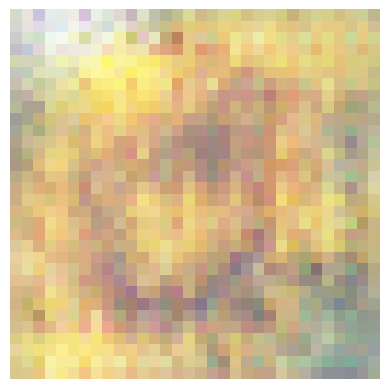

Epoch 361/2500
Generator loss: 0.8907074928283691, Discriminator loss: 1.2178359031677246
Epoch 362/2500
Generator loss: 0.8190974593162537, Discriminator loss: 1.3709707260131836
Epoch 363/2500
Generator loss: 0.8610057234764099, Discriminator loss: 1.3405590057373047
Epoch 364/2500
Generator loss: 0.8686324954032898, Discriminator loss: 1.2861700057983398
Epoch 365/2500
Generator loss: 0.8343281149864197, Discriminator loss: 1.3196399211883545
Epoch 366/2500
Generator loss: 0.8188840746879578, Discriminator loss: 1.2706767320632935
Epoch 367/2500
Generator loss: 0.8123817443847656, Discriminator loss: 1.384198546409607
Epoch 368/2500
Generator loss: 0.8426069617271423, Discriminator loss: 1.3575701713562012
Epoch 369/2500
Generator loss: 0.8997172117233276, Discriminator loss: 1.2322286367416382
Epoch 370/2500
Generator loss: 0.8371165990829468, Discriminator loss: 1.2722364664077759


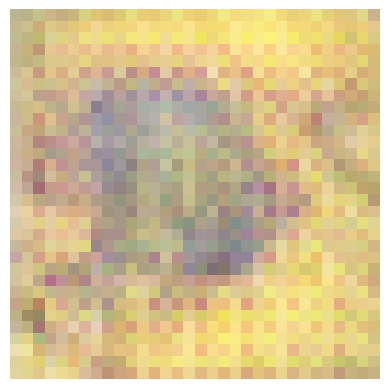

Epoch 371/2500
Generator loss: 0.9120962619781494, Discriminator loss: 1.261466145515442
Epoch 372/2500
Generator loss: 0.7915645837783813, Discriminator loss: 1.538288950920105
Epoch 373/2500
Generator loss: 0.8573635220527649, Discriminator loss: 1.3614140748977661
Epoch 374/2500
Generator loss: 1.0120787620544434, Discriminator loss: 1.115418791770935
Epoch 375/2500
Generator loss: 0.8370497822761536, Discriminator loss: 1.2821850776672363
Epoch 376/2500
Generator loss: 0.8689531087875366, Discriminator loss: 1.264962911605835
Epoch 377/2500
Generator loss: 0.7983725666999817, Discriminator loss: 1.4192403554916382
Epoch 378/2500
Generator loss: 0.9566064476966858, Discriminator loss: 1.2238601446151733
Epoch 379/2500
Generator loss: 0.9409886002540588, Discriminator loss: 1.3521374464035034
Epoch 380/2500
Generator loss: 1.0658119916915894, Discriminator loss: 1.072633147239685


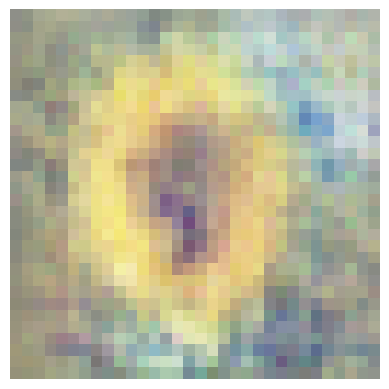

Epoch 381/2500
Generator loss: 0.818369448184967, Discriminator loss: 1.316906213760376
Epoch 382/2500
Generator loss: 0.9682420492172241, Discriminator loss: 1.0944324731826782
Epoch 383/2500
Generator loss: 0.703347384929657, Discriminator loss: 1.5840182304382324
Epoch 384/2500
Generator loss: 0.8609709143638611, Discriminator loss: 1.3002902269363403
Epoch 385/2500
Generator loss: 0.9392823576927185, Discriminator loss: 1.2541232109069824
Epoch 386/2500
Generator loss: 0.8316181302070618, Discriminator loss: 1.44297456741333
Epoch 387/2500
Generator loss: 1.0071784257888794, Discriminator loss: 1.201440691947937
Epoch 388/2500
Generator loss: 0.8393257260322571, Discriminator loss: 1.417043685913086
Epoch 389/2500
Generator loss: 0.8950051665306091, Discriminator loss: 1.3083906173706055
Epoch 390/2500
Generator loss: 0.9167865514755249, Discriminator loss: 1.238337755203247


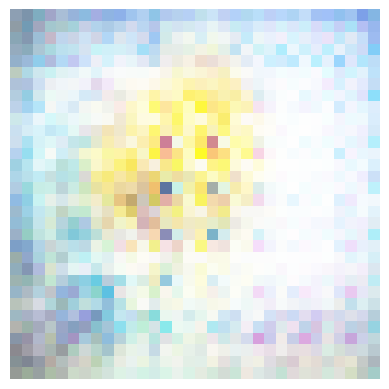

Epoch 391/2500
Generator loss: 0.952712893486023, Discriminator loss: 1.187570333480835
Epoch 392/2500
Generator loss: 0.7027039527893066, Discriminator loss: 1.5240042209625244
Epoch 393/2500
Generator loss: 0.9087005853652954, Discriminator loss: 1.212965726852417
Epoch 394/2500
Generator loss: 0.7027996182441711, Discriminator loss: 1.4368462562561035
Epoch 395/2500
Generator loss: 0.769965410232544, Discriminator loss: 1.34720778465271
Epoch 396/2500
Generator loss: 0.9020664095878601, Discriminator loss: 1.2083975076675415
Epoch 397/2500
Generator loss: 0.7354425191879272, Discriminator loss: 1.5457594394683838
Epoch 398/2500
Generator loss: 0.9551655054092407, Discriminator loss: 1.164205551147461
Epoch 399/2500
Generator loss: 0.8298757672309875, Discriminator loss: 1.319713830947876
Epoch 400/2500
Generator loss: 0.8732089996337891, Discriminator loss: 1.1709767580032349


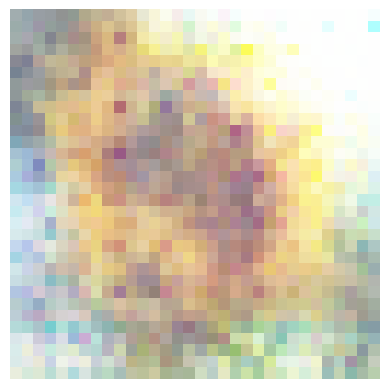

Epoch 401/2500
Generator loss: 0.7246967554092407, Discriminator loss: 1.4444159269332886
Epoch 402/2500
Generator loss: 0.7653486132621765, Discriminator loss: 1.4861775636672974
Epoch 403/2500
Generator loss: 1.0446358919143677, Discriminator loss: 1.1110433340072632
Epoch 404/2500
Generator loss: 0.9709994196891785, Discriminator loss: 1.2267091274261475
Epoch 405/2500
Generator loss: 0.8027109503746033, Discriminator loss: 1.4697223901748657
Epoch 406/2500
Generator loss: 0.9048906564712524, Discriminator loss: 1.1988413333892822
Epoch 407/2500
Generator loss: 0.6496453285217285, Discriminator loss: 1.540167212486267
Epoch 408/2500
Generator loss: 0.8025906682014465, Discriminator loss: 1.2824056148529053
Epoch 409/2500
Generator loss: 0.7233683466911316, Discriminator loss: 1.565319299697876
Epoch 410/2500
Generator loss: 0.8908830881118774, Discriminator loss: 1.2429847717285156


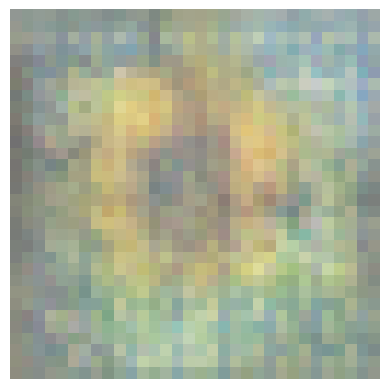

Epoch 411/2500
Generator loss: 0.857360303401947, Discriminator loss: 1.2960784435272217
Epoch 412/2500
Generator loss: 0.9412015080451965, Discriminator loss: 1.1177213191986084
Epoch 413/2500
Generator loss: 0.8652045130729675, Discriminator loss: 1.2790443897247314
Epoch 414/2500
Generator loss: 0.853971004486084, Discriminator loss: 1.3751857280731201
Epoch 415/2500
Generator loss: 1.0127919912338257, Discriminator loss: 1.1800161600112915
Epoch 416/2500
Generator loss: 0.7414926290512085, Discriminator loss: 1.5089633464813232
Epoch 417/2500
Generator loss: 0.8430367112159729, Discriminator loss: 1.3153108358383179
Epoch 418/2500
Generator loss: 0.8679255247116089, Discriminator loss: 1.2998018264770508
Epoch 419/2500
Generator loss: 0.913133442401886, Discriminator loss: 1.3057103157043457
Epoch 420/2500
Generator loss: 0.8635786175727844, Discriminator loss: 1.3746557235717773


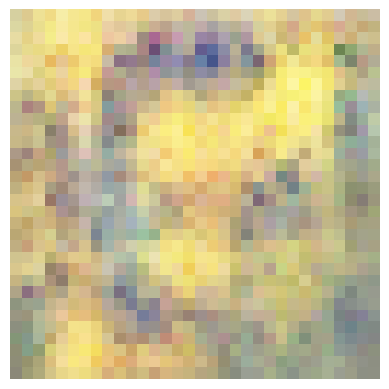

Epoch 421/2500
Generator loss: 1.0747222900390625, Discriminator loss: 1.0610324144363403
Epoch 422/2500
Generator loss: 0.8600618839263916, Discriminator loss: 1.3403112888336182
Epoch 423/2500
Generator loss: 1.0880961418151855, Discriminator loss: 1.1811985969543457
Epoch 424/2500
Generator loss: 0.9443090558052063, Discriminator loss: 1.3600101470947266
Epoch 425/2500
Generator loss: 0.996649980545044, Discriminator loss: 1.2168011665344238
Epoch 426/2500
Generator loss: 0.8292696475982666, Discriminator loss: 1.2580796480178833
Epoch 427/2500
Generator loss: 0.817415177822113, Discriminator loss: 1.29347562789917
Epoch 428/2500
Generator loss: 0.9198654890060425, Discriminator loss: 1.2917252779006958
Epoch 429/2500
Generator loss: 0.8361402750015259, Discriminator loss: 1.5399069786071777
Epoch 430/2500
Generator loss: 1.03163480758667, Discriminator loss: 1.1219381093978882


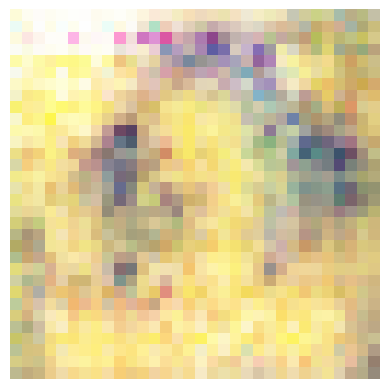

Epoch 431/2500
Generator loss: 0.9273987412452698, Discriminator loss: 1.1553956270217896
Epoch 432/2500
Generator loss: 0.8742358088493347, Discriminator loss: 1.2799005508422852
Epoch 433/2500
Generator loss: 0.7928373217582703, Discriminator loss: 1.425732970237732
Epoch 434/2500
Generator loss: 0.9049528241157532, Discriminator loss: 1.330689549446106
Epoch 435/2500
Generator loss: 1.0519286394119263, Discriminator loss: 1.161355972290039
Epoch 436/2500
Generator loss: 0.7970365881919861, Discriminator loss: 1.4502829313278198
Epoch 437/2500
Generator loss: 1.13040030002594, Discriminator loss: 0.9698426127433777
Epoch 438/2500
Generator loss: 0.7014586925506592, Discriminator loss: 1.5682315826416016
Epoch 439/2500
Generator loss: 0.7766509056091309, Discriminator loss: 1.3413376808166504
Epoch 440/2500
Generator loss: 1.0753626823425293, Discriminator loss: 1.0231131315231323


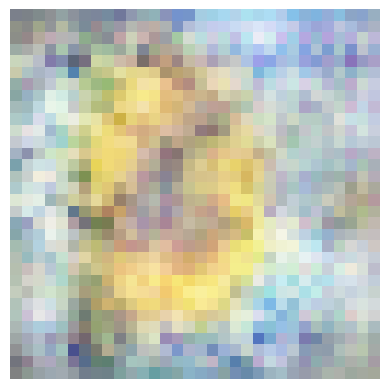

Epoch 441/2500
Generator loss: 0.86542809009552, Discriminator loss: 1.4411194324493408
Epoch 442/2500
Generator loss: 0.9086037278175354, Discriminator loss: 1.3969331979751587
Epoch 443/2500
Generator loss: 1.0100761651992798, Discriminator loss: 1.2863385677337646
Epoch 444/2500
Generator loss: 1.0151362419128418, Discriminator loss: 1.27371084690094
Epoch 445/2500
Generator loss: 0.9664733409881592, Discriminator loss: 1.2127259969711304
Epoch 446/2500
Generator loss: 0.8842649459838867, Discriminator loss: 1.3059316873550415
Epoch 447/2500
Generator loss: 0.8132187724113464, Discriminator loss: 1.3081166744232178
Epoch 448/2500
Generator loss: 0.8981425762176514, Discriminator loss: 1.2639309167861938
Epoch 449/2500
Generator loss: 0.7868157029151917, Discriminator loss: 1.3174411058425903
Epoch 450/2500
Generator loss: 0.7873279452323914, Discriminator loss: 1.4056334495544434


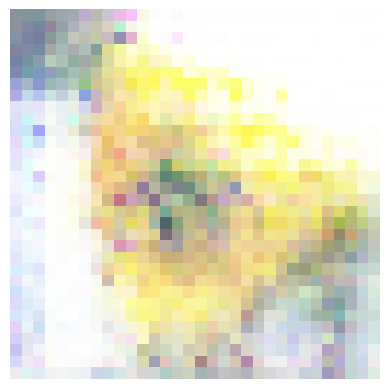

Epoch 451/2500
Generator loss: 0.7507314682006836, Discriminator loss: 1.4553437232971191
Epoch 452/2500
Generator loss: 0.8085864782333374, Discriminator loss: 1.324723482131958
Epoch 453/2500
Generator loss: 0.9377536177635193, Discriminator loss: 1.320482850074768
Epoch 454/2500
Generator loss: 0.9107454419136047, Discriminator loss: 1.288411021232605
Epoch 455/2500
Generator loss: 0.9167695045471191, Discriminator loss: 1.2095595598220825
Epoch 456/2500
Generator loss: 0.8599526286125183, Discriminator loss: 1.3638380765914917
Epoch 457/2500
Generator loss: 0.9637266397476196, Discriminator loss: 1.19839346408844
Epoch 458/2500
Generator loss: 0.8636342287063599, Discriminator loss: 1.3725789785385132
Epoch 459/2500
Generator loss: 0.7795790433883667, Discriminator loss: 1.441554069519043
Epoch 460/2500
Generator loss: 0.7528740763664246, Discriminator loss: 1.3936553001403809


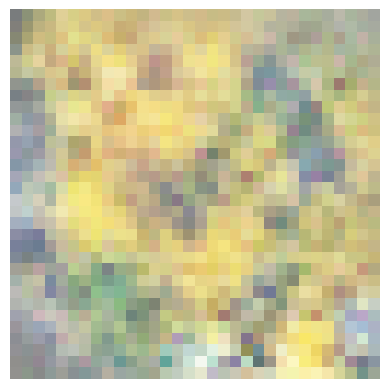

Epoch 461/2500
Generator loss: 0.8655284643173218, Discriminator loss: 1.2202733755111694
Epoch 462/2500
Generator loss: 1.0332083702087402, Discriminator loss: 1.0948548316955566
Epoch 463/2500
Generator loss: 0.8564558625221252, Discriminator loss: 1.4281721115112305
Epoch 464/2500
Generator loss: 0.8649182915687561, Discriminator loss: 1.4094946384429932
Epoch 465/2500
Generator loss: 0.8860303163528442, Discriminator loss: 1.2883011102676392
Epoch 466/2500
Generator loss: 0.9297783970832825, Discriminator loss: 1.2182759046554565
Epoch 467/2500
Generator loss: 0.8501038551330566, Discriminator loss: 1.3011424541473389
Epoch 468/2500
Generator loss: 0.8304821252822876, Discriminator loss: 1.2839081287384033
Epoch 469/2500
Generator loss: 0.828830361366272, Discriminator loss: 1.266455054283142
Epoch 470/2500
Generator loss: 0.7636611461639404, Discriminator loss: 1.3731974363327026


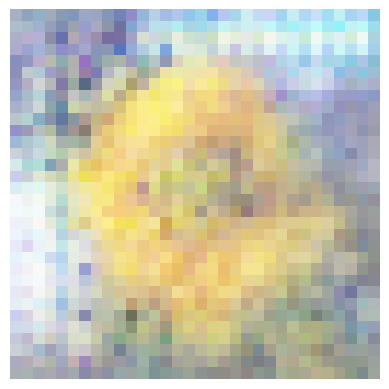

Epoch 471/2500
Generator loss: 0.8760307431221008, Discriminator loss: 1.2944226264953613
Epoch 472/2500
Generator loss: 0.8576066493988037, Discriminator loss: 1.2978181838989258
Epoch 473/2500
Generator loss: 0.8275559544563293, Discriminator loss: 1.3446074724197388
Epoch 474/2500
Generator loss: 0.8842904567718506, Discriminator loss: 1.3214695453643799
Epoch 475/2500
Generator loss: 0.8644649386405945, Discriminator loss: 1.2850557565689087
Epoch 476/2500
Generator loss: 0.7658713459968567, Discriminator loss: 1.446202039718628
Epoch 477/2500
Generator loss: 0.8217678666114807, Discriminator loss: 1.344683051109314
Epoch 478/2500
Generator loss: 0.8302125930786133, Discriminator loss: 1.2789925336837769
Epoch 479/2500
Generator loss: 0.7403572797775269, Discriminator loss: 1.43135404586792
Epoch 480/2500
Generator loss: 0.8095899224281311, Discriminator loss: 1.3164212703704834


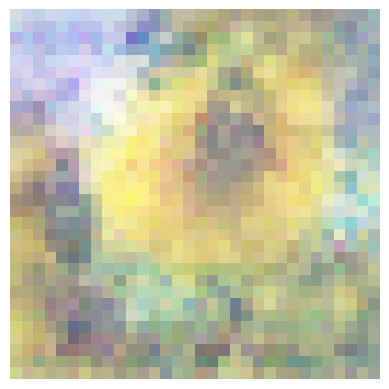

Epoch 481/2500
Generator loss: 0.8459652066230774, Discriminator loss: 1.3122321367263794
Epoch 482/2500
Generator loss: 0.9259790778160095, Discriminator loss: 1.2070057392120361
Epoch 483/2500
Generator loss: 0.8555711507797241, Discriminator loss: 1.2517061233520508
Epoch 484/2500
Generator loss: 0.8750737309455872, Discriminator loss: 1.1980221271514893
Epoch 485/2500
Generator loss: 0.8320813179016113, Discriminator loss: 1.245416283607483
Epoch 486/2500
Generator loss: 0.8237181305885315, Discriminator loss: 1.3947288990020752
Epoch 487/2500
Generator loss: 1.004841923713684, Discriminator loss: 1.1679972410202026
Epoch 488/2500
Generator loss: 0.8502233624458313, Discriminator loss: 1.3850347995758057
Epoch 489/2500
Generator loss: 0.7959086298942566, Discriminator loss: 1.322041392326355
Epoch 490/2500
Generator loss: 0.7472559809684753, Discriminator loss: 1.3421927690505981


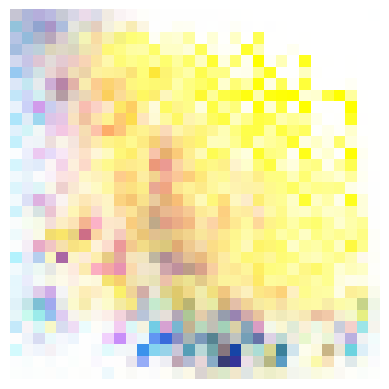

Epoch 491/2500
Generator loss: 0.8486247658729553, Discriminator loss: 1.3426631689071655
Epoch 492/2500
Generator loss: 0.8383329510688782, Discriminator loss: 1.3327043056488037
Epoch 493/2500
Generator loss: 0.7609859704971313, Discriminator loss: 1.4233219623565674
Epoch 494/2500
Generator loss: 0.815239429473877, Discriminator loss: 1.3771796226501465
Epoch 495/2500
Generator loss: 0.8941466808319092, Discriminator loss: 1.2602384090423584
Epoch 496/2500
Generator loss: 0.9486449360847473, Discriminator loss: 1.2288659811019897
Epoch 497/2500
Generator loss: 1.0244468450546265, Discriminator loss: 1.1242499351501465
Epoch 498/2500
Generator loss: 0.9563742280006409, Discriminator loss: 1.0649877786636353
Epoch 499/2500
Generator loss: 0.7523269057273865, Discriminator loss: 1.4297758340835571
Epoch 500/2500
Generator loss: 0.8606579303741455, Discriminator loss: 1.3299343585968018


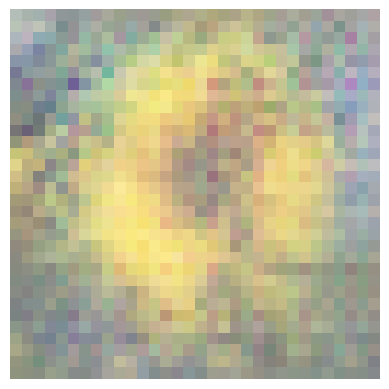

Epoch 501/2500
Generator loss: 0.8468971252441406, Discriminator loss: 1.2914162874221802
Epoch 502/2500
Generator loss: 0.897259533405304, Discriminator loss: 1.2798566818237305
Epoch 503/2500
Generator loss: 0.8347749710083008, Discriminator loss: 1.3319885730743408
Epoch 504/2500
Generator loss: 0.9967711567878723, Discriminator loss: 1.1792346239089966
Epoch 505/2500
Generator loss: 0.9182047247886658, Discriminator loss: 1.352440595626831
Epoch 506/2500
Generator loss: 0.9641880393028259, Discriminator loss: 1.1978927850723267
Epoch 507/2500
Generator loss: 0.9782639741897583, Discriminator loss: 1.1772441864013672
Epoch 508/2500
Generator loss: 0.7052504420280457, Discriminator loss: 1.6056323051452637
Epoch 509/2500
Generator loss: 0.8814235329627991, Discriminator loss: 1.3815268278121948
Epoch 510/2500
Generator loss: 0.9573574066162109, Discriminator loss: 1.1696898937225342


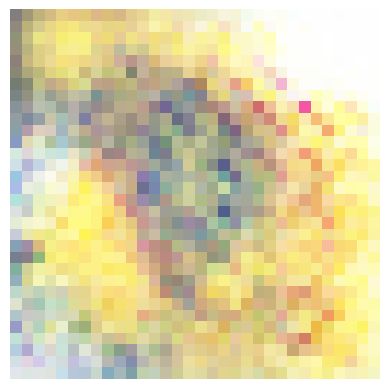

Epoch 511/2500
Generator loss: 0.8251498341560364, Discriminator loss: 1.338622808456421
Epoch 512/2500
Generator loss: 0.8851878643035889, Discriminator loss: 1.24467134475708
Epoch 513/2500
Generator loss: 0.9383388161659241, Discriminator loss: 1.2541314363479614
Epoch 514/2500
Generator loss: 0.732799768447876, Discriminator loss: 1.5738214254379272
Epoch 515/2500
Generator loss: 1.0457478761672974, Discriminator loss: 1.1101619005203247
Epoch 516/2500
Generator loss: 0.7998620867729187, Discriminator loss: 1.3533011674880981
Epoch 517/2500
Generator loss: 0.8690822720527649, Discriminator loss: 1.2877814769744873
Epoch 518/2500
Generator loss: 0.7691278457641602, Discriminator loss: 1.3301140069961548
Epoch 519/2500
Generator loss: 0.7468010783195496, Discriminator loss: 1.3357809782028198
Epoch 520/2500
Generator loss: 0.8241730332374573, Discriminator loss: 1.3336905241012573


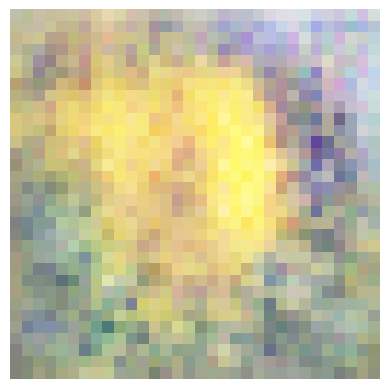

Epoch 521/2500
Generator loss: 0.854839026927948, Discriminator loss: 1.3649691343307495
Epoch 522/2500
Generator loss: 1.0076171159744263, Discriminator loss: 1.1691913604736328
Epoch 523/2500
Generator loss: 0.9610527157783508, Discriminator loss: 1.280582308769226
Epoch 524/2500
Generator loss: 1.0414894819259644, Discriminator loss: 1.1375449895858765
Epoch 525/2500
Generator loss: 0.8871108889579773, Discriminator loss: 1.2853753566741943
Epoch 526/2500
Generator loss: 0.8778548836708069, Discriminator loss: 1.3280396461486816
Epoch 527/2500
Generator loss: 0.8050464987754822, Discriminator loss: 1.432865858078003
Epoch 528/2500
Generator loss: 1.0399845838546753, Discriminator loss: 1.078345537185669
Epoch 529/2500
Generator loss: 0.9402228593826294, Discriminator loss: 1.161562204360962
Epoch 530/2500
Generator loss: 0.8773183822631836, Discriminator loss: 1.272890329360962


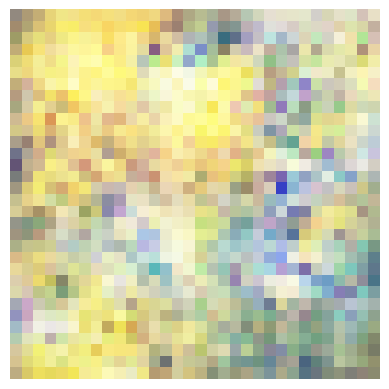

Epoch 531/2500
Generator loss: 0.7003026604652405, Discriminator loss: 1.6847279071807861
Epoch 532/2500
Generator loss: 0.9580603241920471, Discriminator loss: 1.1706581115722656
Epoch 533/2500
Generator loss: 0.7572388052940369, Discriminator loss: 1.4452701807022095
Epoch 534/2500
Generator loss: 0.8000134825706482, Discriminator loss: 1.3150395154953003
Epoch 535/2500
Generator loss: 0.9276735782623291, Discriminator loss: 1.1729390621185303
Epoch 536/2500
Generator loss: 1.0619158744812012, Discriminator loss: 1.091054081916809
Epoch 537/2500
Generator loss: 0.9043997526168823, Discriminator loss: 1.341353178024292
Epoch 538/2500
Generator loss: 0.9102946519851685, Discriminator loss: 1.2697324752807617
Epoch 539/2500
Generator loss: 0.8321266770362854, Discriminator loss: 1.3212826251983643
Epoch 540/2500
Generator loss: 0.9011147618293762, Discriminator loss: 1.2195285558700562


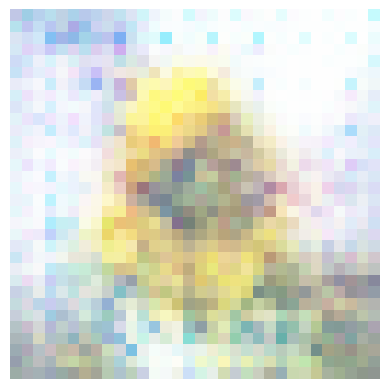

Epoch 541/2500
Generator loss: 0.8168270587921143, Discriminator loss: 1.354627251625061
Epoch 542/2500
Generator loss: 0.7675336599349976, Discriminator loss: 1.5213407278060913
Epoch 543/2500
Generator loss: 0.9035220742225647, Discriminator loss: 1.2607955932617188
Epoch 544/2500
Generator loss: 0.8555317521095276, Discriminator loss: 1.2544389963150024
Epoch 545/2500
Generator loss: 0.8787760734558105, Discriminator loss: 1.2612316608428955
Epoch 546/2500
Generator loss: 1.0433416366577148, Discriminator loss: 1.1075514554977417
Epoch 547/2500
Generator loss: 0.8047170042991638, Discriminator loss: 1.551078200340271
Epoch 548/2500
Generator loss: 1.0546165704727173, Discriminator loss: 1.0962238311767578
Epoch 549/2500
Generator loss: 0.7223181128501892, Discriminator loss: 1.4568777084350586
Epoch 550/2500
Generator loss: 0.8926140666007996, Discriminator loss: 1.2296135425567627


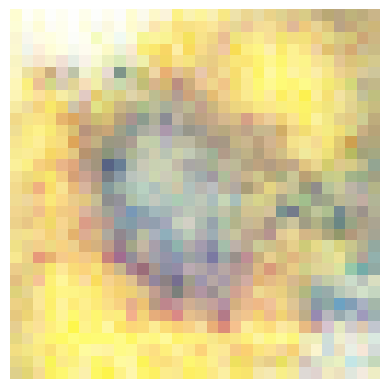

Epoch 551/2500
Generator loss: 0.862288236618042, Discriminator loss: 1.386710286140442
Epoch 552/2500
Generator loss: 0.798823356628418, Discriminator loss: 1.368347406387329
Epoch 553/2500
Generator loss: 1.0438264608383179, Discriminator loss: 1.0346490144729614
Epoch 554/2500
Generator loss: 0.7659464478492737, Discriminator loss: 1.407418966293335
Epoch 555/2500
Generator loss: 0.8450303077697754, Discriminator loss: 1.2502292394638062
Epoch 556/2500
Generator loss: 1.0198343992233276, Discriminator loss: 1.1715694665908813
Epoch 557/2500
Generator loss: 0.9219905138015747, Discriminator loss: 1.3540972471237183
Epoch 558/2500
Generator loss: 1.008989930152893, Discriminator loss: 1.14763605594635
Epoch 559/2500
Generator loss: 0.8240397572517395, Discriminator loss: 1.3525400161743164
Epoch 560/2500
Generator loss: 0.8410530090332031, Discriminator loss: 1.4093002080917358


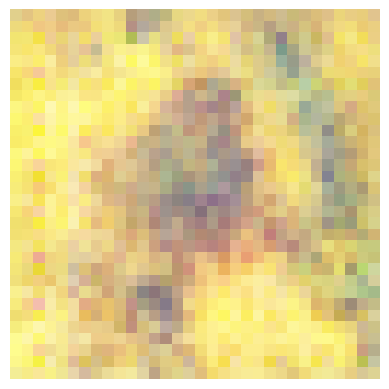

Epoch 561/2500
Generator loss: 1.1205307245254517, Discriminator loss: 0.9971019625663757
Epoch 562/2500
Generator loss: 0.6471720337867737, Discriminator loss: 1.569716453552246
Epoch 563/2500
Generator loss: 0.9199211001396179, Discriminator loss: 1.1487884521484375
Epoch 564/2500
Generator loss: 0.8962320685386658, Discriminator loss: 1.2363988161087036
Epoch 565/2500
Generator loss: 0.886742889881134, Discriminator loss: 1.2681924104690552
Epoch 566/2500
Generator loss: 0.8131974339485168, Discriminator loss: 1.342921495437622
Epoch 567/2500
Generator loss: 0.9006362557411194, Discriminator loss: 1.2252130508422852
Epoch 568/2500
Generator loss: 0.7747449278831482, Discriminator loss: 1.3765757083892822
Epoch 569/2500
Generator loss: 0.9206761717796326, Discriminator loss: 1.1758824586868286
Epoch 570/2500
Generator loss: 0.8265354037284851, Discriminator loss: 1.4251059293746948


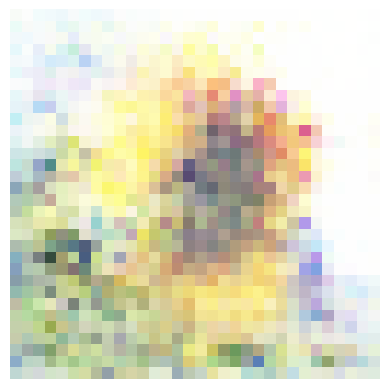

Epoch 571/2500
Generator loss: 0.7794218063354492, Discriminator loss: 1.3999660015106201
Epoch 572/2500
Generator loss: 1.0607249736785889, Discriminator loss: 1.1364452838897705
Epoch 573/2500
Generator loss: 0.9583827257156372, Discriminator loss: 1.3479832410812378
Epoch 574/2500
Generator loss: 0.9364308714866638, Discriminator loss: 1.3084580898284912
Epoch 575/2500
Generator loss: 0.8440549373626709, Discriminator loss: 1.3135199546813965
Epoch 576/2500
Generator loss: 0.9056142568588257, Discriminator loss: 1.1905814409255981
Epoch 577/2500
Generator loss: 0.8600680232048035, Discriminator loss: 1.3271023035049438
Epoch 578/2500
Generator loss: 0.768669605255127, Discriminator loss: 1.4281255006790161
Epoch 579/2500
Generator loss: 0.8569803833961487, Discriminator loss: 1.2812539339065552
Epoch 580/2500
Generator loss: 1.060760498046875, Discriminator loss: 1.0367658138275146


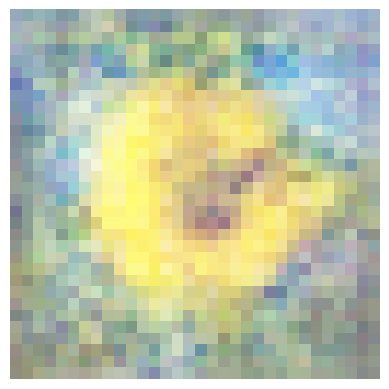

Epoch 581/2500
Generator loss: 0.7442240715026855, Discriminator loss: 1.4939736127853394
Epoch 582/2500
Generator loss: 0.8091496229171753, Discriminator loss: 1.3567215204238892
Epoch 583/2500
Generator loss: 0.9723115563392639, Discriminator loss: 1.1016855239868164
Epoch 584/2500
Generator loss: 0.9737945199012756, Discriminator loss: 1.2276699542999268
Epoch 585/2500
Generator loss: 1.0049093961715698, Discriminator loss: 1.2076263427734375
Epoch 586/2500
Generator loss: 1.0049113035202026, Discriminator loss: 1.2129013538360596
Epoch 587/2500
Generator loss: 1.0999360084533691, Discriminator loss: 1.1526206731796265
Epoch 588/2500
Generator loss: 0.8825989961624146, Discriminator loss: 1.3763443231582642
Epoch 589/2500
Generator loss: 0.8507006168365479, Discriminator loss: 1.2366911172866821
Epoch 590/2500
Generator loss: 0.9284021258354187, Discriminator loss: 1.1797609329223633


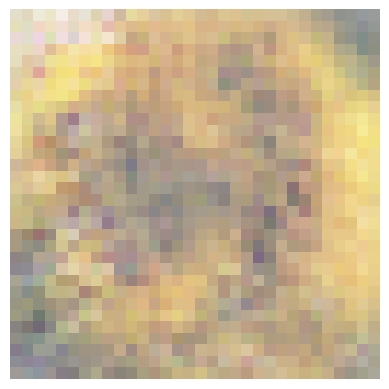

Epoch 591/2500
Generator loss: 0.8089348673820496, Discriminator loss: 1.374541163444519
Epoch 592/2500
Generator loss: 0.9334278702735901, Discriminator loss: 1.2353496551513672
Epoch 593/2500
Generator loss: 0.9569531083106995, Discriminator loss: 1.2084100246429443
Epoch 594/2500
Generator loss: 0.8667311668395996, Discriminator loss: 1.3863075971603394
Epoch 595/2500
Generator loss: 1.1069903373718262, Discriminator loss: 1.0979114770889282
Epoch 596/2500
Generator loss: 0.9477784037590027, Discriminator loss: 1.2816354036331177
Epoch 597/2500
Generator loss: 0.8416898250579834, Discriminator loss: 1.4639159440994263
Epoch 598/2500
Generator loss: 0.8985504508018494, Discriminator loss: 1.4323437213897705
Epoch 599/2500
Generator loss: 0.8750309348106384, Discriminator loss: 1.3183276653289795
Epoch 600/2500
Generator loss: 0.7939846515655518, Discriminator loss: 1.4291588068008423


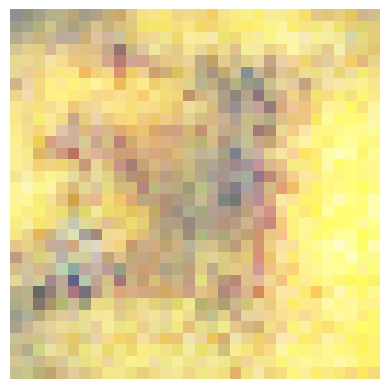

Epoch 601/2500
Generator loss: 0.9350086450576782, Discriminator loss: 1.1994187831878662
Epoch 602/2500
Generator loss: 0.8224068284034729, Discriminator loss: 1.3855364322662354
Epoch 603/2500
Generator loss: 0.9272181987762451, Discriminator loss: 1.2231833934783936
Epoch 604/2500
Generator loss: 1.0328545570373535, Discriminator loss: 1.1254860162734985
Epoch 605/2500
Generator loss: 1.0134226083755493, Discriminator loss: 1.2419075965881348
Epoch 606/2500
Generator loss: 1.0780490636825562, Discriminator loss: 1.1066553592681885
Epoch 607/2500
Generator loss: 0.9134981632232666, Discriminator loss: 1.3680744171142578
Epoch 608/2500
Generator loss: 0.8616400957107544, Discriminator loss: 1.2597004175186157
Epoch 609/2500
Generator loss: 0.9057349562644958, Discriminator loss: 1.2274532318115234
Epoch 610/2500
Generator loss: 0.771794319152832, Discriminator loss: 1.43113374710083


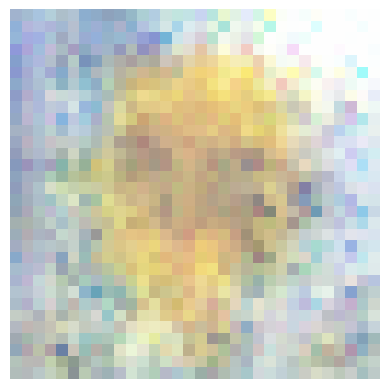

Epoch 611/2500
Generator loss: 0.9888609647750854, Discriminator loss: 1.1811482906341553
Epoch 612/2500
Generator loss: 0.8186220526695251, Discriminator loss: 1.3697795867919922
Epoch 613/2500
Generator loss: 0.9378505945205688, Discriminator loss: 1.1520992517471313
Epoch 614/2500
Generator loss: 0.8951941728591919, Discriminator loss: 1.278645634651184
Epoch 615/2500
Generator loss: 0.9403665661811829, Discriminator loss: 1.2482738494873047
Epoch 616/2500
Generator loss: 0.8296537399291992, Discriminator loss: 1.3779503107070923
Epoch 617/2500
Generator loss: 0.834017276763916, Discriminator loss: 1.3380844593048096
Epoch 618/2500
Generator loss: 0.9459969997406006, Discriminator loss: 1.2361828088760376
Epoch 619/2500
Generator loss: 0.8164205551147461, Discriminator loss: 1.4357662200927734
Epoch 620/2500
Generator loss: 0.9427555203437805, Discriminator loss: 1.2581478357315063


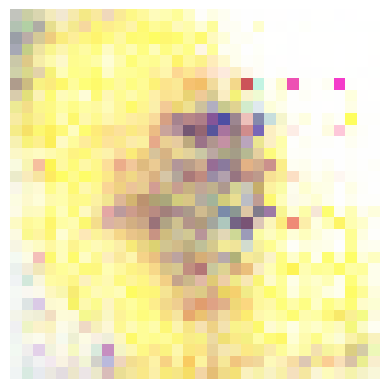

Epoch 621/2500
Generator loss: 0.9242383241653442, Discriminator loss: 1.2386826276779175
Epoch 622/2500
Generator loss: 0.945982813835144, Discriminator loss: 1.1974155902862549
Epoch 623/2500
Generator loss: 0.8665240406990051, Discriminator loss: 1.1995649337768555
Epoch 624/2500
Generator loss: 0.896555483341217, Discriminator loss: 1.1949596405029297
Epoch 625/2500
Generator loss: 1.0246745347976685, Discriminator loss: 1.1269969940185547
Epoch 626/2500
Generator loss: 0.899508535861969, Discriminator loss: 1.325408935546875
Epoch 627/2500
Generator loss: 1.1143349409103394, Discriminator loss: 1.1443538665771484
Epoch 628/2500
Generator loss: 0.9499072432518005, Discriminator loss: 1.3037605285644531
Epoch 629/2500
Generator loss: 0.9324867725372314, Discriminator loss: 1.293914794921875
Epoch 630/2500
Generator loss: 0.8810364603996277, Discriminator loss: 1.2663462162017822


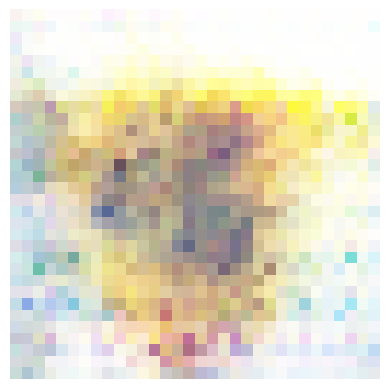

Epoch 631/2500
Generator loss: 1.00718092918396, Discriminator loss: 1.208547592163086
Epoch 632/2500
Generator loss: 0.7744603157043457, Discriminator loss: 1.4495741128921509
Epoch 633/2500
Generator loss: 0.9129320383071899, Discriminator loss: 1.274591326713562
Epoch 634/2500
Generator loss: 0.8307034969329834, Discriminator loss: 1.3746532201766968
Epoch 635/2500
Generator loss: 0.8355055451393127, Discriminator loss: 1.3127965927124023
Epoch 636/2500
Generator loss: 1.093652367591858, Discriminator loss: 1.0433119535446167
Epoch 637/2500
Generator loss: 1.0370348691940308, Discriminator loss: 1.1441185474395752
Epoch 638/2500
Generator loss: 0.9462919235229492, Discriminator loss: 1.2060062885284424
Epoch 639/2500
Generator loss: 0.8787887096405029, Discriminator loss: 1.2741976976394653
Epoch 640/2500
Generator loss: 0.9240050315856934, Discriminator loss: 1.2072809934616089


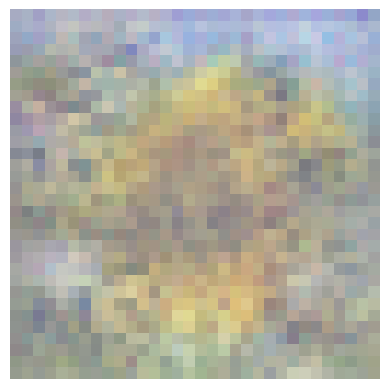

Epoch 641/2500
Generator loss: 0.8465407490730286, Discriminator loss: 1.3015530109405518
Epoch 642/2500
Generator loss: 0.9561699628829956, Discriminator loss: 1.2036025524139404
Epoch 643/2500
Generator loss: 0.9733821749687195, Discriminator loss: 1.1921665668487549
Epoch 644/2500
Generator loss: 0.8911989331245422, Discriminator loss: 1.272515892982483
Epoch 645/2500
Generator loss: 1.0025006532669067, Discriminator loss: 1.1474817991256714
Epoch 646/2500
Generator loss: 1.1278594732284546, Discriminator loss: 1.105161428451538
Epoch 647/2500
Generator loss: 0.8879712820053101, Discriminator loss: 1.3110424280166626
Epoch 648/2500
Generator loss: 0.8526208996772766, Discriminator loss: 1.3112106323242188
Epoch 649/2500
Generator loss: 0.8200653195381165, Discriminator loss: 1.32052743434906
Epoch 650/2500
Generator loss: 0.9186670780181885, Discriminator loss: 1.244927167892456


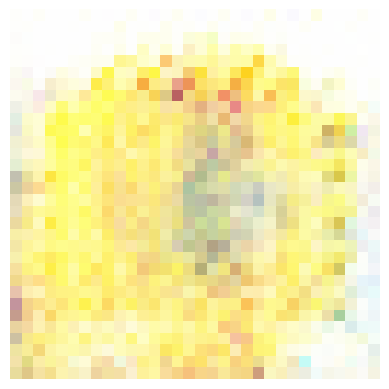

Epoch 651/2500
Generator loss: 0.7557826638221741, Discriminator loss: 1.474824070930481
Epoch 652/2500
Generator loss: 0.9486761093139648, Discriminator loss: 1.1800285577774048
Epoch 653/2500
Generator loss: 1.0018407106399536, Discriminator loss: 1.1735411882400513
Epoch 654/2500
Generator loss: 0.9773430228233337, Discriminator loss: 1.201406478881836
Epoch 655/2500
Generator loss: 0.8870849013328552, Discriminator loss: 1.3112212419509888
Epoch 656/2500
Generator loss: 0.9631944298744202, Discriminator loss: 1.2143715620040894
Epoch 657/2500
Generator loss: 0.9231975674629211, Discriminator loss: 1.2849295139312744
Epoch 658/2500
Generator loss: 1.139051914215088, Discriminator loss: 1.0849376916885376
Epoch 659/2500
Generator loss: 0.8011669516563416, Discriminator loss: 1.4420924186706543
Epoch 660/2500
Generator loss: 1.004787802696228, Discriminator loss: 1.1137820482254028


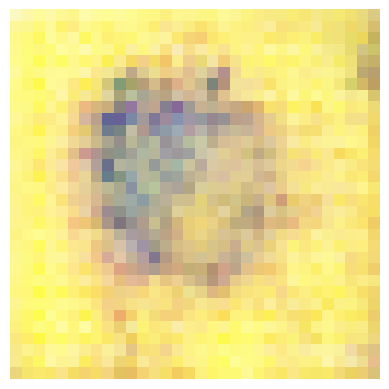

Epoch 661/2500
Generator loss: 1.0305372476577759, Discriminator loss: 1.1691017150878906
Epoch 662/2500
Generator loss: 0.935350775718689, Discriminator loss: 1.3133684396743774
Epoch 663/2500
Generator loss: 1.1005116701126099, Discriminator loss: 1.122882604598999
Epoch 664/2500
Generator loss: 0.9489024877548218, Discriminator loss: 1.230866551399231
Epoch 665/2500
Generator loss: 1.0420674085617065, Discriminator loss: 1.111161231994629
Epoch 666/2500
Generator loss: 0.9488844275474548, Discriminator loss: 1.2922269105911255
Epoch 667/2500
Generator loss: 1.0162097215652466, Discriminator loss: 1.1898791790008545
Epoch 668/2500
Generator loss: 0.9189491868019104, Discriminator loss: 1.267725944519043
Epoch 669/2500
Generator loss: 1.0060261487960815, Discriminator loss: 1.1291786432266235
Epoch 670/2500
Generator loss: 0.9178762435913086, Discriminator loss: 1.2943458557128906


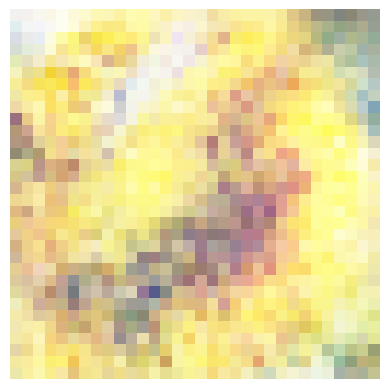

Epoch 671/2500
Generator loss: 0.959290623664856, Discriminator loss: 1.2077195644378662
Epoch 672/2500
Generator loss: 0.9642620086669922, Discriminator loss: 1.2725294828414917
Epoch 673/2500
Generator loss: 1.0752981901168823, Discriminator loss: 1.0983012914657593
Epoch 674/2500
Generator loss: 0.7299785017967224, Discriminator loss: 1.584712028503418
Epoch 675/2500
Generator loss: 0.8979020118713379, Discriminator loss: 1.269785761833191
Epoch 676/2500
Generator loss: 1.0439995527267456, Discriminator loss: 1.0934646129608154
Epoch 677/2500
Generator loss: 0.8566362857818604, Discriminator loss: 1.2840088605880737
Epoch 678/2500
Generator loss: 0.9848652482032776, Discriminator loss: 1.193349003791809
Epoch 679/2500
Generator loss: 0.8657967448234558, Discriminator loss: 1.395634651184082
Epoch 680/2500
Generator loss: 1.1786398887634277, Discriminator loss: 1.0332753658294678


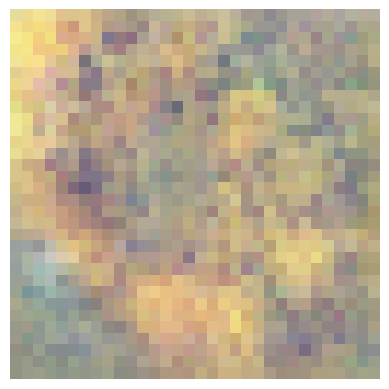

Epoch 681/2500
Generator loss: 0.9377279877662659, Discriminator loss: 1.3385268449783325
Epoch 682/2500
Generator loss: 0.9521272778511047, Discriminator loss: 1.2970070838928223
Epoch 683/2500
Generator loss: 1.0008721351623535, Discriminator loss: 1.2397313117980957
Epoch 684/2500
Generator loss: 0.8273838758468628, Discriminator loss: 1.3337174654006958
Epoch 685/2500
Generator loss: 0.959945797920227, Discriminator loss: 1.202504277229309
Epoch 686/2500
Generator loss: 0.9794230461120605, Discriminator loss: 1.168135404586792
Epoch 687/2500
Generator loss: 0.9198544025421143, Discriminator loss: 1.3004963397979736
Epoch 688/2500
Generator loss: 1.0222867727279663, Discriminator loss: 1.1832213401794434
Epoch 689/2500
Generator loss: 1.0350871086120605, Discriminator loss: 1.2600440979003906
Epoch 690/2500
Generator loss: 0.9685481786727905, Discriminator loss: 1.2480583190917969


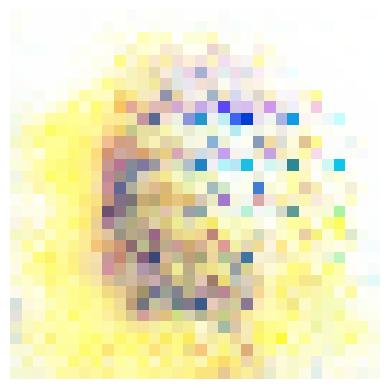

Epoch 691/2500
Generator loss: 1.0390759706497192, Discriminator loss: 1.1134560108184814
Epoch 692/2500
Generator loss: 0.868815004825592, Discriminator loss: 1.2563865184783936
Epoch 693/2500
Generator loss: 0.8277521133422852, Discriminator loss: 1.3178929090499878
Epoch 694/2500
Generator loss: 0.8840126395225525, Discriminator loss: 1.253151774406433
Epoch 695/2500
Generator loss: 0.9160953760147095, Discriminator loss: 1.277261734008789
Epoch 696/2500
Generator loss: 0.752659797668457, Discriminator loss: 1.465309739112854
Epoch 697/2500
Generator loss: 1.0161542892456055, Discriminator loss: 1.0565085411071777
Epoch 698/2500
Generator loss: 0.8705231547355652, Discriminator loss: 1.296669840812683
Epoch 699/2500
Generator loss: 1.017229437828064, Discriminator loss: 1.1382708549499512
Epoch 700/2500
Generator loss: 0.8725954294204712, Discriminator loss: 1.353420376777649


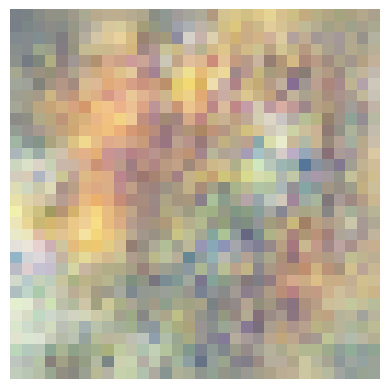

Epoch 701/2500
Generator loss: 1.025992751121521, Discriminator loss: 1.1902031898498535
Epoch 702/2500
Generator loss: 1.013035774230957, Discriminator loss: 1.2220964431762695
Epoch 703/2500
Generator loss: 0.9118416905403137, Discriminator loss: 1.2775851488113403
Epoch 704/2500
Generator loss: 0.9294623136520386, Discriminator loss: 1.2079881429672241
Epoch 705/2500
Generator loss: 0.8376803398132324, Discriminator loss: 1.3055956363677979
Epoch 706/2500
Generator loss: 0.9765910506248474, Discriminator loss: 1.091321349143982
Epoch 707/2500
Generator loss: 0.8239445686340332, Discriminator loss: 1.4009805917739868
Epoch 708/2500
Generator loss: 0.9888089299201965, Discriminator loss: 1.1265456676483154
Epoch 709/2500
Generator loss: 0.8921336531639099, Discriminator loss: 1.3363285064697266
Epoch 710/2500
Generator loss: 0.9713432788848877, Discriminator loss: 1.2154351472854614


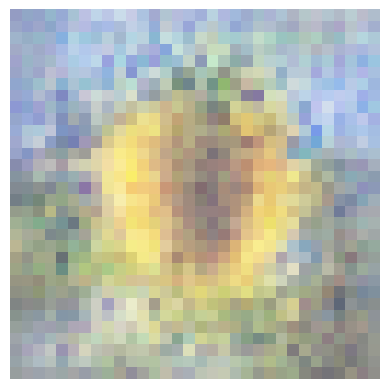

Epoch 711/2500
Generator loss: 1.0003325939178467, Discriminator loss: 1.1882096529006958
Epoch 712/2500
Generator loss: 1.0534076690673828, Discriminator loss: 1.2810622453689575
Epoch 713/2500
Generator loss: 1.1870501041412354, Discriminator loss: 1.040589451789856
Epoch 714/2500
Generator loss: 0.8243648409843445, Discriminator loss: 1.463324785232544
Epoch 715/2500
Generator loss: 0.962611198425293, Discriminator loss: 1.24100661277771
Epoch 716/2500
Generator loss: 0.8356650471687317, Discriminator loss: 1.3251203298568726
Epoch 717/2500
Generator loss: 0.9064439535140991, Discriminator loss: 1.1837797164916992
Epoch 718/2500
Generator loss: 0.8947336077690125, Discriminator loss: 1.2264975309371948
Epoch 719/2500
Generator loss: 0.9251211285591125, Discriminator loss: 1.2361550331115723
Epoch 720/2500
Generator loss: 0.9913001656532288, Discriminator loss: 1.2334957122802734


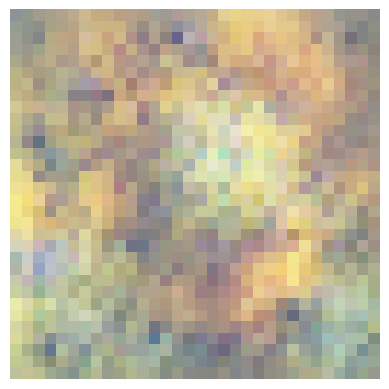

Epoch 721/2500
Generator loss: 0.9451533555984497, Discriminator loss: 1.2682298421859741
Epoch 722/2500
Generator loss: 0.973712682723999, Discriminator loss: 1.17634117603302
Epoch 723/2500
Generator loss: 0.9080034494400024, Discriminator loss: 1.2671737670898438
Epoch 724/2500
Generator loss: 1.03465735912323, Discriminator loss: 1.1555999517440796
Epoch 725/2500
Generator loss: 0.8628557324409485, Discriminator loss: 1.3234502077102661
Epoch 726/2500
Generator loss: 0.9627581238746643, Discriminator loss: 1.1766762733459473
Epoch 727/2500
Generator loss: 0.7885242700576782, Discriminator loss: 1.4204427003860474
Epoch 728/2500
Generator loss: 1.0192440748214722, Discriminator loss: 1.156511664390564
Epoch 729/2500
Generator loss: 0.9312372207641602, Discriminator loss: 1.2793205976486206
Epoch 730/2500
Generator loss: 1.0728505849838257, Discriminator loss: 1.1070151329040527


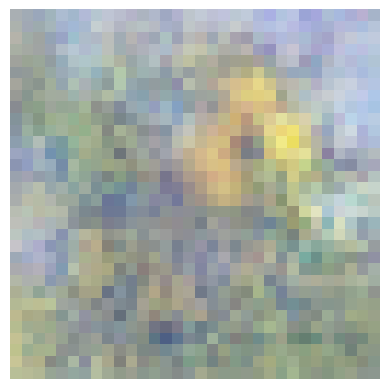

Epoch 731/2500
Generator loss: 0.8157343864440918, Discriminator loss: 1.3674461841583252
Epoch 732/2500
Generator loss: 0.9928118586540222, Discriminator loss: 1.147025465965271
Epoch 733/2500
Generator loss: 0.7831661105155945, Discriminator loss: 1.4582990407943726
Epoch 734/2500
Generator loss: 0.9410874843597412, Discriminator loss: 1.2605457305908203
Epoch 735/2500
Generator loss: 0.9467846155166626, Discriminator loss: 1.2057254314422607
Epoch 736/2500
Generator loss: 0.7874624133110046, Discriminator loss: 1.3955018520355225
Epoch 737/2500
Generator loss: 0.9398523569107056, Discriminator loss: 1.1926287412643433
Epoch 738/2500
Generator loss: 0.9347243309020996, Discriminator loss: 1.2456847429275513
Epoch 739/2500
Generator loss: 0.9130735993385315, Discriminator loss: 1.3401838541030884
Epoch 740/2500
Generator loss: 0.998859167098999, Discriminator loss: 1.1998870372772217


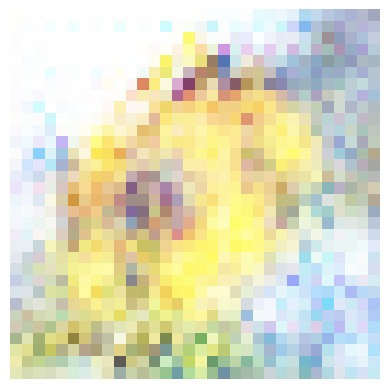

Epoch 741/2500
Generator loss: 1.0120649337768555, Discriminator loss: 1.1625168323516846
Epoch 742/2500
Generator loss: 1.129576325416565, Discriminator loss: 1.0710761547088623
Epoch 743/2500
Generator loss: 0.8379006385803223, Discriminator loss: 1.366376519203186
Epoch 744/2500
Generator loss: 0.8847522735595703, Discriminator loss: 1.2222949266433716
Epoch 745/2500
Generator loss: 0.85498046875, Discriminator loss: 1.3207732439041138
Epoch 746/2500
Generator loss: 0.9380895495414734, Discriminator loss: 1.273337960243225
Epoch 747/2500
Generator loss: 0.9309685826301575, Discriminator loss: 1.2104885578155518
Epoch 748/2500
Generator loss: 1.0687471628189087, Discriminator loss: 1.0729092359542847
Epoch 749/2500
Generator loss: 0.8437027335166931, Discriminator loss: 1.3980258703231812
Epoch 750/2500
Generator loss: 1.1590595245361328, Discriminator loss: 1.0419222116470337


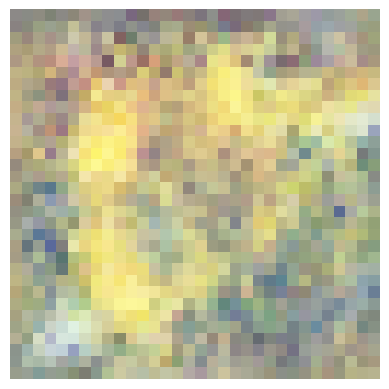

Epoch 751/2500
Generator loss: 0.9796251058578491, Discriminator loss: 1.2326194047927856
Epoch 752/2500
Generator loss: 1.0187103748321533, Discriminator loss: 1.200058937072754
Epoch 753/2500
Generator loss: 0.9846158027648926, Discriminator loss: 1.1390405893325806
Epoch 754/2500
Generator loss: 0.7902409434318542, Discriminator loss: 1.3831576108932495
Epoch 755/2500
Generator loss: 0.9352189302444458, Discriminator loss: 1.1968845129013062
Epoch 756/2500
Generator loss: 0.8804093599319458, Discriminator loss: 1.2526966333389282
Epoch 757/2500
Generator loss: 1.0503121614456177, Discriminator loss: 1.0613861083984375
Epoch 758/2500
Generator loss: 0.8304228186607361, Discriminator loss: 1.4325982332229614
Epoch 759/2500
Generator loss: 0.9451518654823303, Discriminator loss: 1.212341547012329
Epoch 760/2500
Generator loss: 0.9763974547386169, Discriminator loss: 1.2100696563720703


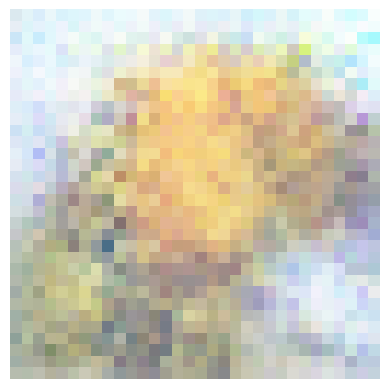

Epoch 761/2500
Generator loss: 0.9389910101890564, Discriminator loss: 1.3600685596466064
Epoch 762/2500
Generator loss: 0.9315495491027832, Discriminator loss: 1.2855359315872192
Epoch 763/2500
Generator loss: 0.9129971861839294, Discriminator loss: 1.2946572303771973
Epoch 764/2500
Generator loss: 0.8778828382492065, Discriminator loss: 1.251249074935913
Epoch 765/2500
Generator loss: 1.0381298065185547, Discriminator loss: 1.0927780866622925
Epoch 766/2500
Generator loss: 0.8588876724243164, Discriminator loss: 1.342987298965454
Epoch 767/2500
Generator loss: 1.1096267700195312, Discriminator loss: 1.0916004180908203
Epoch 768/2500
Generator loss: 1.0500798225402832, Discriminator loss: 1.2030364274978638
Epoch 769/2500
Generator loss: 0.8687622547149658, Discriminator loss: 1.414400339126587
Epoch 770/2500
Generator loss: 1.202987790107727, Discriminator loss: 0.9826854467391968


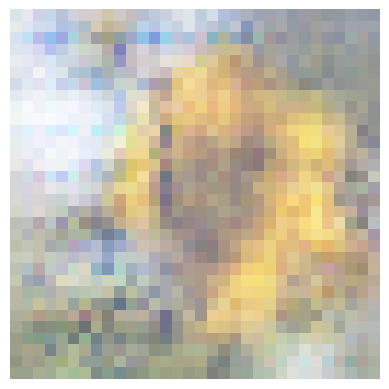

Epoch 771/2500
Generator loss: 0.8515834808349609, Discriminator loss: 1.342188835144043
Epoch 772/2500
Generator loss: 1.0592607259750366, Discriminator loss: 1.1469041109085083
Epoch 773/2500
Generator loss: 1.044748067855835, Discriminator loss: 1.1552716493606567
Epoch 774/2500
Generator loss: 0.8836777210235596, Discriminator loss: 1.3307331800460815
Epoch 775/2500
Generator loss: 0.8219531178474426, Discriminator loss: 1.3539819717407227
Epoch 776/2500
Generator loss: 1.020113468170166, Discriminator loss: 1.1431256532669067
Epoch 777/2500
Generator loss: 0.8864623308181763, Discriminator loss: 1.314210295677185
Epoch 778/2500
Generator loss: 1.2264420986175537, Discriminator loss: 0.9321235418319702
Epoch 779/2500
Generator loss: 0.9205690026283264, Discriminator loss: 1.3739802837371826
Epoch 780/2500
Generator loss: 1.1298660039901733, Discriminator loss: 1.0848793983459473


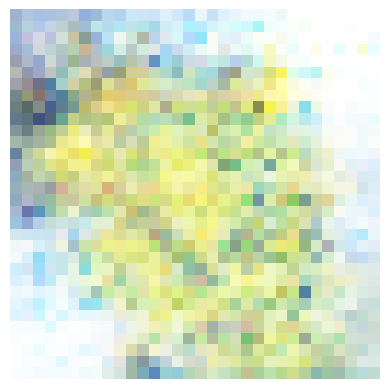

Epoch 781/2500
Generator loss: 1.038166880607605, Discriminator loss: 1.2241863012313843
Epoch 782/2500
Generator loss: 1.0212918519973755, Discriminator loss: 1.2241543531417847
Epoch 783/2500
Generator loss: 0.917368471622467, Discriminator loss: 1.2395970821380615
Epoch 784/2500
Generator loss: 0.9180222749710083, Discriminator loss: 1.1925983428955078
Epoch 785/2500
Generator loss: 0.9487249851226807, Discriminator loss: 1.161428451538086
Epoch 786/2500
Generator loss: 0.7783613204956055, Discriminator loss: 1.4806427955627441
Epoch 787/2500
Generator loss: 1.032768964767456, Discriminator loss: 1.1084753274917603
Epoch 788/2500
Generator loss: 0.9840288758277893, Discriminator loss: 1.1941359043121338
Epoch 789/2500
Generator loss: 1.0117957592010498, Discriminator loss: 1.1197084188461304
Epoch 790/2500
Generator loss: 0.915067732334137, Discriminator loss: 1.2521369457244873


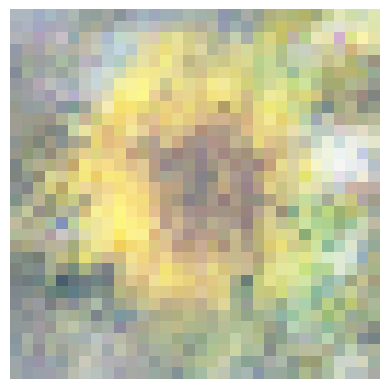

Epoch 791/2500
Generator loss: 0.9618508219718933, Discriminator loss: 1.1495888233184814
Epoch 792/2500
Generator loss: 0.9457141757011414, Discriminator loss: 1.1953749656677246
Epoch 793/2500
Generator loss: 0.8271995782852173, Discriminator loss: 1.4073352813720703
Epoch 794/2500
Generator loss: 0.9413089156150818, Discriminator loss: 1.1912235021591187
Epoch 795/2500
Generator loss: 0.9336687922477722, Discriminator loss: 1.1921378374099731
Epoch 796/2500
Generator loss: 0.9216288924217224, Discriminator loss: 1.2447326183319092
Epoch 797/2500
Generator loss: 0.9876355528831482, Discriminator loss: 1.1856861114501953
Epoch 798/2500
Generator loss: 1.0424461364746094, Discriminator loss: 1.1450879573822021
Epoch 799/2500
Generator loss: 0.8390448093414307, Discriminator loss: 1.4407087564468384
Epoch 800/2500
Generator loss: 0.9745020866394043, Discriminator loss: 1.1213347911834717


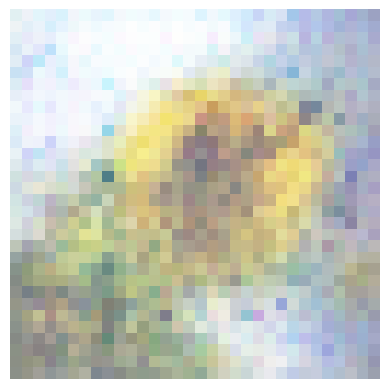

Epoch 801/2500
Generator loss: 0.9172314405441284, Discriminator loss: 1.222452163696289
Epoch 802/2500
Generator loss: 0.8845118284225464, Discriminator loss: 1.273350477218628
Epoch 803/2500
Generator loss: 0.9505575299263, Discriminator loss: 1.1788758039474487
Epoch 804/2500
Generator loss: 1.0342384576797485, Discriminator loss: 1.094605565071106
Epoch 805/2500
Generator loss: 1.0050983428955078, Discriminator loss: 1.1692075729370117
Epoch 806/2500
Generator loss: 1.036189317703247, Discriminator loss: 1.1477208137512207
Epoch 807/2500
Generator loss: 1.1425045728683472, Discriminator loss: 1.0656229257583618
Epoch 808/2500
Generator loss: 0.9966268539428711, Discriminator loss: 1.224647045135498
Epoch 809/2500
Generator loss: 0.8838860392570496, Discriminator loss: 1.3054604530334473
Epoch 810/2500
Generator loss: 0.9276959896087646, Discriminator loss: 1.2936615943908691


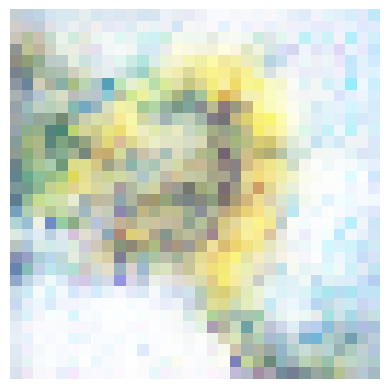

Epoch 811/2500
Generator loss: 0.874771773815155, Discriminator loss: 1.3111870288848877
Epoch 812/2500
Generator loss: 1.0380971431732178, Discriminator loss: 1.1227023601531982
Epoch 813/2500
Generator loss: 1.1036301851272583, Discriminator loss: 1.0321766138076782
Epoch 814/2500
Generator loss: 1.1411880254745483, Discriminator loss: 1.0491385459899902
Epoch 815/2500
Generator loss: 0.8405243754386902, Discriminator loss: 1.5277584791183472
Epoch 816/2500
Generator loss: 1.148193597793579, Discriminator loss: 1.0131937265396118
Epoch 817/2500
Generator loss: 0.8861368298530579, Discriminator loss: 1.3103604316711426
Epoch 818/2500
Generator loss: 0.89284747838974, Discriminator loss: 1.254212737083435
Epoch 819/2500
Generator loss: 1.0848257541656494, Discriminator loss: 1.0786242485046387
Epoch 820/2500
Generator loss: 0.8926406502723694, Discriminator loss: 1.2609906196594238


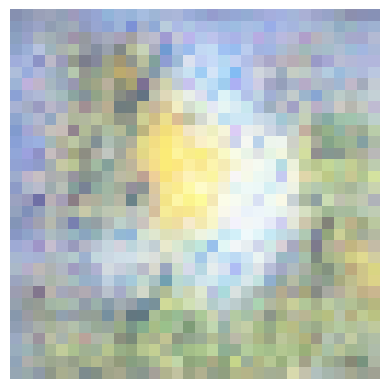

Epoch 821/2500
Generator loss: 0.9604907035827637, Discriminator loss: 1.229738712310791
Epoch 822/2500
Generator loss: 1.157940149307251, Discriminator loss: 0.9892416000366211
Epoch 823/2500
Generator loss: 0.9959271550178528, Discriminator loss: 1.171278715133667
Epoch 824/2500
Generator loss: 1.0272037982940674, Discriminator loss: 1.2050766944885254
Epoch 825/2500
Generator loss: 0.9663959741592407, Discriminator loss: 1.2294957637786865
Epoch 826/2500
Generator loss: 0.8938995003700256, Discriminator loss: 1.2876332998275757
Epoch 827/2500
Generator loss: 1.0173707008361816, Discriminator loss: 1.1452356576919556
Epoch 828/2500
Generator loss: 1.0216747522354126, Discriminator loss: 1.1878869533538818
Epoch 829/2500
Generator loss: 0.8941865563392639, Discriminator loss: 1.33236825466156
Epoch 830/2500
Generator loss: 1.0859687328338623, Discriminator loss: 1.0950695276260376


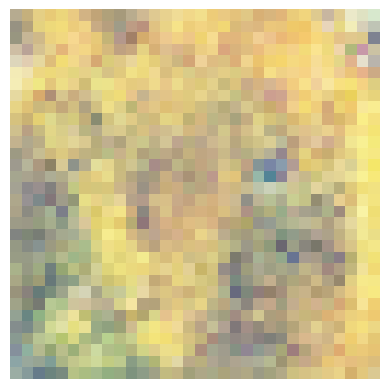

Epoch 831/2500
Generator loss: 0.8329731225967407, Discriminator loss: 1.4175866842269897
Epoch 832/2500
Generator loss: 0.8913203477859497, Discriminator loss: 1.271459937095642
Epoch 833/2500
Generator loss: 1.0811119079589844, Discriminator loss: 1.0069100856781006
Epoch 834/2500
Generator loss: 0.856611430644989, Discriminator loss: 1.3277628421783447
Epoch 835/2500
Generator loss: 0.9208322763442993, Discriminator loss: 1.2177674770355225
Epoch 836/2500
Generator loss: 1.1315933465957642, Discriminator loss: 1.0636860132217407
Epoch 837/2500
Generator loss: 0.8064332604408264, Discriminator loss: 1.550613522529602
Epoch 838/2500
Generator loss: 1.1469135284423828, Discriminator loss: 1.0452167987823486
Epoch 839/2500
Generator loss: 0.9037734270095825, Discriminator loss: 1.4474672079086304
Epoch 840/2500
Generator loss: 0.9970763325691223, Discriminator loss: 1.164489984512329


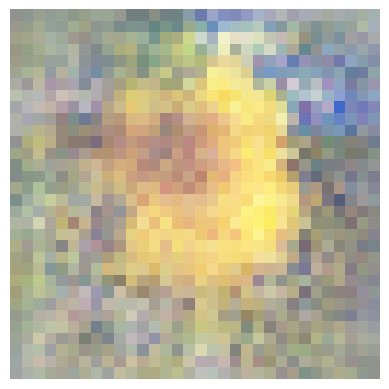

Epoch 841/2500
Generator loss: 1.1242914199829102, Discriminator loss: 1.0063982009887695
Epoch 842/2500
Generator loss: 0.8956906199455261, Discriminator loss: 1.2934870719909668
Epoch 843/2500
Generator loss: 0.9708990454673767, Discriminator loss: 1.201920986175537
Epoch 844/2500
Generator loss: 0.9841939806938171, Discriminator loss: 1.2590543031692505
Epoch 845/2500
Generator loss: 0.8454170227050781, Discriminator loss: 1.3948085308074951
Epoch 846/2500
Generator loss: 0.9972617626190186, Discriminator loss: 1.166070580482483
Epoch 847/2500
Generator loss: 1.0860605239868164, Discriminator loss: 1.0406335592269897
Epoch 848/2500
Generator loss: 0.9761249423027039, Discriminator loss: 1.33047354221344
Epoch 849/2500
Generator loss: 1.0235334634780884, Discriminator loss: 1.1330548524856567
Epoch 850/2500
Generator loss: 0.9507822394371033, Discriminator loss: 1.2283791303634644


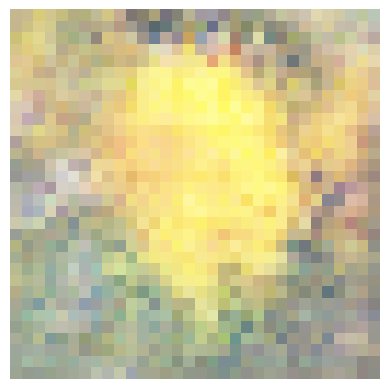

Epoch 851/2500
Generator loss: 1.0131118297576904, Discriminator loss: 1.15639066696167
Epoch 852/2500
Generator loss: 1.040388822555542, Discriminator loss: 1.152408242225647
Epoch 853/2500
Generator loss: 1.0322728157043457, Discriminator loss: 1.154762864112854
Epoch 854/2500
Generator loss: 1.1002439260482788, Discriminator loss: 1.1915760040283203
Epoch 855/2500
Generator loss: 0.9244197607040405, Discriminator loss: 1.4377269744873047
Epoch 856/2500
Generator loss: 1.366868019104004, Discriminator loss: 0.8673385381698608
Epoch 857/2500
Generator loss: 0.9689817428588867, Discriminator loss: 1.1868469715118408
Epoch 858/2500
Generator loss: 0.9290202856063843, Discriminator loss: 1.1988391876220703
Epoch 859/2500
Generator loss: 0.8212246894836426, Discriminator loss: 1.453836441040039
Epoch 860/2500
Generator loss: 1.0132851600646973, Discriminator loss: 1.1098605394363403


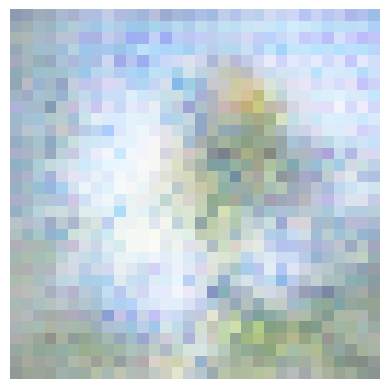

Epoch 861/2500
Generator loss: 0.937383234500885, Discriminator loss: 1.2128678560256958
Epoch 862/2500
Generator loss: 0.9574891328811646, Discriminator loss: 1.2132502794265747
Epoch 863/2500
Generator loss: 0.9568085074424744, Discriminator loss: 1.266635537147522
Epoch 864/2500
Generator loss: 1.0803524255752563, Discriminator loss: 1.1196959018707275
Epoch 865/2500
Generator loss: 0.9964251518249512, Discriminator loss: 1.1727298498153687
Epoch 866/2500
Generator loss: 0.9745422005653381, Discriminator loss: 1.1952228546142578
Epoch 867/2500
Generator loss: 0.9930508732795715, Discriminator loss: 1.1746069192886353
Epoch 868/2500
Generator loss: 0.9270703792572021, Discriminator loss: 1.260345697402954
Epoch 869/2500
Generator loss: 1.0192766189575195, Discriminator loss: 1.0782229900360107
Epoch 870/2500
Generator loss: 0.9959917068481445, Discriminator loss: 1.1586257219314575


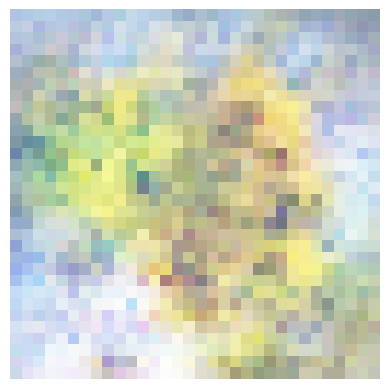

Epoch 871/2500
Generator loss: 1.0043771266937256, Discriminator loss: 1.1874706745147705
Epoch 872/2500
Generator loss: 1.0899937152862549, Discriminator loss: 1.1211042404174805
Epoch 873/2500
Generator loss: 0.8633924126625061, Discriminator loss: 1.334193229675293
Epoch 874/2500
Generator loss: 0.9669914245605469, Discriminator loss: 1.2727800607681274
Epoch 875/2500
Generator loss: 1.0889049768447876, Discriminator loss: 1.0525580644607544
Epoch 876/2500
Generator loss: 1.0944938659667969, Discriminator loss: 1.0623351335525513
Epoch 877/2500
Generator loss: 1.0724210739135742, Discriminator loss: 1.124443531036377
Epoch 878/2500
Generator loss: 0.9694991707801819, Discriminator loss: 1.2181155681610107
Epoch 879/2500
Generator loss: 1.088509440422058, Discriminator loss: 1.0927621126174927
Epoch 880/2500
Generator loss: 1.000073790550232, Discriminator loss: 1.2015777826309204


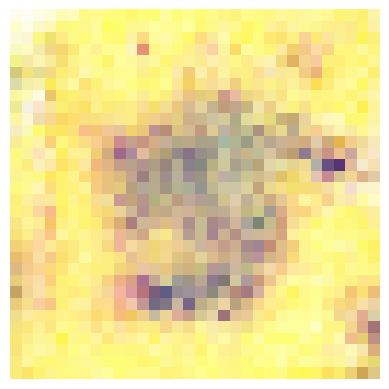

Epoch 881/2500
Generator loss: 0.9480416178703308, Discriminator loss: 1.2870596647262573
Epoch 882/2500
Generator loss: 0.9201928377151489, Discriminator loss: 1.281341552734375
Epoch 883/2500
Generator loss: 0.9682459235191345, Discriminator loss: 1.2043429613113403
Epoch 884/2500
Generator loss: 1.0680134296417236, Discriminator loss: 1.0455515384674072
Epoch 885/2500
Generator loss: 0.9491785168647766, Discriminator loss: 1.2182408571243286
Epoch 886/2500
Generator loss: 1.0819122791290283, Discriminator loss: 1.1007307767868042
Epoch 887/2500
Generator loss: 1.022736668586731, Discriminator loss: 1.1734933853149414
Epoch 888/2500
Generator loss: 0.9577884674072266, Discriminator loss: 1.3229196071624756
Epoch 889/2500
Generator loss: 1.017378807067871, Discriminator loss: 1.1718894243240356
Epoch 890/2500
Generator loss: 0.981943666934967, Discriminator loss: 1.2258408069610596


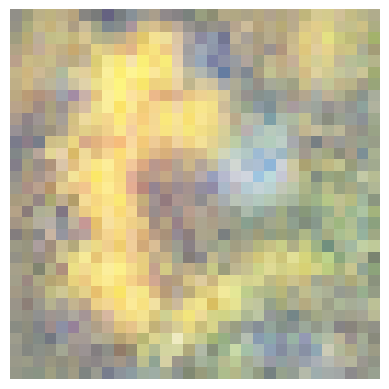

Epoch 891/2500
Generator loss: 1.0856481790542603, Discriminator loss: 1.1464011669158936
Epoch 892/2500
Generator loss: 1.0206549167633057, Discriminator loss: 1.1517181396484375
Epoch 893/2500
Generator loss: 1.069953203201294, Discriminator loss: 1.0792980194091797
Epoch 894/2500
Generator loss: 1.0173448324203491, Discriminator loss: 1.1740068197250366
Epoch 895/2500
Generator loss: 1.0186752080917358, Discriminator loss: 1.2080488204956055
Epoch 896/2500
Generator loss: 1.0427954196929932, Discriminator loss: 1.1442151069641113
Epoch 897/2500
Generator loss: 0.951657235622406, Discriminator loss: 1.3050116300582886
Epoch 898/2500
Generator loss: 0.9570392370223999, Discriminator loss: 1.283828616142273
Epoch 899/2500
Generator loss: 0.9473987221717834, Discriminator loss: 1.2014812231063843
Epoch 900/2500
Generator loss: 1.1463505029678345, Discriminator loss: 1.0068293809890747


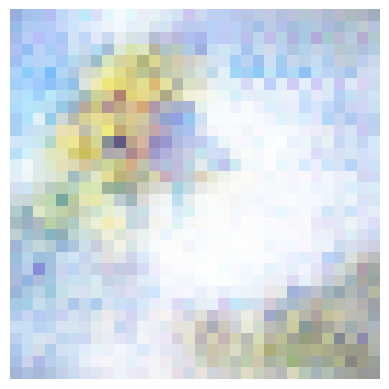

Epoch 901/2500
Generator loss: 0.9487989544868469, Discriminator loss: 1.2762353420257568
Epoch 902/2500
Generator loss: 1.0334606170654297, Discriminator loss: 1.1407283544540405
Epoch 903/2500
Generator loss: 0.9306460618972778, Discriminator loss: 1.272402286529541
Epoch 904/2500
Generator loss: 1.127868413925171, Discriminator loss: 0.9978530406951904
Epoch 905/2500
Generator loss: 1.0521214008331299, Discriminator loss: 1.1940746307373047
Epoch 906/2500
Generator loss: 1.1195515394210815, Discriminator loss: 1.1044483184814453
Epoch 907/2500
Generator loss: 0.9840887784957886, Discriminator loss: 1.2353284358978271
Epoch 908/2500
Generator loss: 1.1580535173416138, Discriminator loss: 1.0437777042388916
Epoch 909/2500
Generator loss: 0.9934338927268982, Discriminator loss: 1.2896174192428589
Epoch 910/2500
Generator loss: 0.9522550106048584, Discriminator loss: 1.2265632152557373


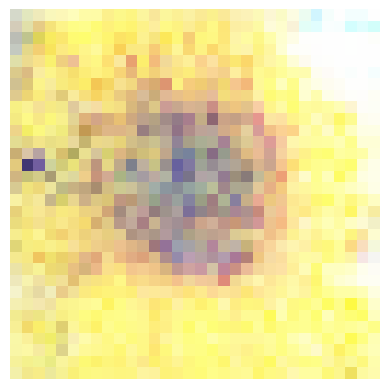

Epoch 911/2500
Generator loss: 0.9376140832901001, Discriminator loss: 1.2281821966171265
Epoch 912/2500
Generator loss: 0.9821566939353943, Discriminator loss: 1.2049461603164673
Epoch 913/2500
Generator loss: 0.9874869585037231, Discriminator loss: 1.1565042734146118
Epoch 914/2500
Generator loss: 1.0919013023376465, Discriminator loss: 1.0127956867218018
Epoch 915/2500
Generator loss: 1.0336796045303345, Discriminator loss: 1.1265119314193726
Epoch 916/2500
Generator loss: 0.9885358214378357, Discriminator loss: 1.2165354490280151
Epoch 917/2500
Generator loss: 1.0669770240783691, Discriminator loss: 1.1353049278259277
Epoch 918/2500
Generator loss: 0.9679716229438782, Discriminator loss: 1.2977931499481201
Epoch 919/2500
Generator loss: 1.1266087293624878, Discriminator loss: 1.0393835306167603
Epoch 920/2500
Generator loss: 0.9336528182029724, Discriminator loss: 1.2529371976852417


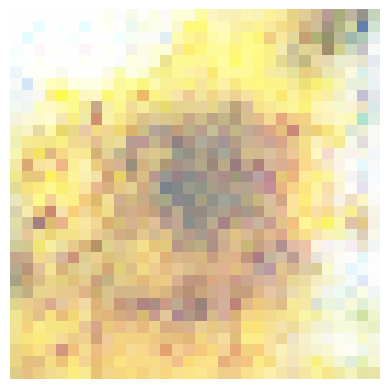

Epoch 921/2500
Generator loss: 0.9854047298431396, Discriminator loss: 1.110665202140808
Epoch 922/2500
Generator loss: 1.0714924335479736, Discriminator loss: 1.0870527029037476
Epoch 923/2500
Generator loss: 0.9847461581230164, Discriminator loss: 1.2319910526275635
Epoch 924/2500
Generator loss: 1.0717519521713257, Discriminator loss: 1.0415059328079224
Epoch 925/2500
Generator loss: 1.0444302558898926, Discriminator loss: 1.1473424434661865
Epoch 926/2500
Generator loss: 1.115572452545166, Discriminator loss: 1.105179786682129
Epoch 927/2500
Generator loss: 0.8922799825668335, Discriminator loss: 1.3286882638931274
Epoch 928/2500
Generator loss: 1.0668212175369263, Discriminator loss: 1.1245615482330322
Epoch 929/2500
Generator loss: 1.0053236484527588, Discriminator loss: 1.2184052467346191
Epoch 930/2500
Generator loss: 1.0443583726882935, Discriminator loss: 1.179931640625


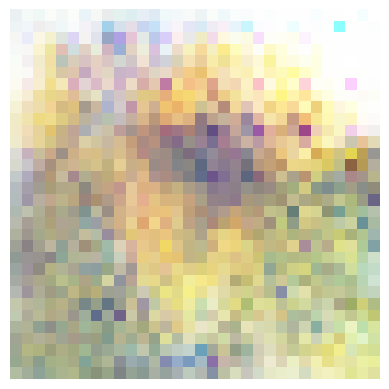

Epoch 931/2500
Generator loss: 0.9950751066207886, Discriminator loss: 1.1672852039337158
Epoch 932/2500
Generator loss: 1.0287166833877563, Discriminator loss: 1.1120514869689941
Epoch 933/2500
Generator loss: 1.0920672416687012, Discriminator loss: 1.1294021606445312
Epoch 934/2500
Generator loss: 1.1085022687911987, Discriminator loss: 1.1961960792541504
Epoch 935/2500
Generator loss: 1.2079914808273315, Discriminator loss: 1.0941014289855957
Epoch 936/2500
Generator loss: 1.25602126121521, Discriminator loss: 1.1018799543380737
Epoch 937/2500
Generator loss: 1.2037694454193115, Discriminator loss: 1.036111831665039
Epoch 938/2500
Generator loss: 0.8818936944007874, Discriminator loss: 1.4001691341400146
Epoch 939/2500
Generator loss: 1.0300161838531494, Discriminator loss: 1.1480629444122314
Epoch 940/2500
Generator loss: 0.9404503107070923, Discriminator loss: 1.242844820022583


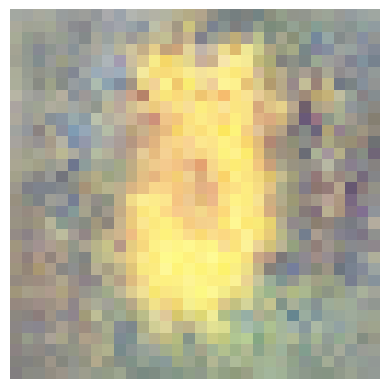

Epoch 941/2500
Generator loss: 1.0941126346588135, Discriminator loss: 1.0198215246200562
Epoch 942/2500
Generator loss: 0.9744912385940552, Discriminator loss: 1.1719154119491577
Epoch 943/2500
Generator loss: 1.0390489101409912, Discriminator loss: 1.1662687063217163
Epoch 944/2500
Generator loss: 1.1346468925476074, Discriminator loss: 1.0777316093444824
Epoch 945/2500
Generator loss: 1.0052199363708496, Discriminator loss: 1.2015962600708008
Epoch 946/2500
Generator loss: 1.0530917644500732, Discriminator loss: 1.0898082256317139
Epoch 947/2500
Generator loss: 0.975212812423706, Discriminator loss: 1.189215898513794
Epoch 948/2500
Generator loss: 0.919696033000946, Discriminator loss: 1.3053994178771973
Epoch 949/2500
Generator loss: 1.0811057090759277, Discriminator loss: 1.0438510179519653
Epoch 950/2500
Generator loss: 0.9856384992599487, Discriminator loss: 1.1728407144546509


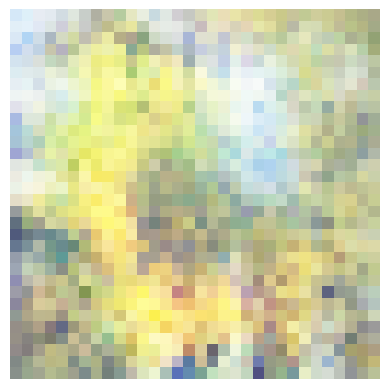

Epoch 951/2500
Generator loss: 1.064844012260437, Discriminator loss: 1.116581916809082
Epoch 952/2500
Generator loss: 1.0663498640060425, Discriminator loss: 1.1435467004776
Epoch 953/2500
Generator loss: 1.0064268112182617, Discriminator loss: 1.1816924810409546
Epoch 954/2500
Generator loss: 1.0715203285217285, Discriminator loss: 1.0990391969680786
Epoch 955/2500
Generator loss: 1.0247071981430054, Discriminator loss: 1.122611165046692
Epoch 956/2500
Generator loss: 0.8884486556053162, Discriminator loss: 1.3180675506591797
Epoch 957/2500
Generator loss: 1.1498171091079712, Discriminator loss: 1.0136866569519043
Epoch 958/2500
Generator loss: 1.0718170404434204, Discriminator loss: 1.1028780937194824
Epoch 959/2500
Generator loss: 0.9654730558395386, Discriminator loss: 1.23736572265625
Epoch 960/2500
Generator loss: 1.1568660736083984, Discriminator loss: 1.117074728012085


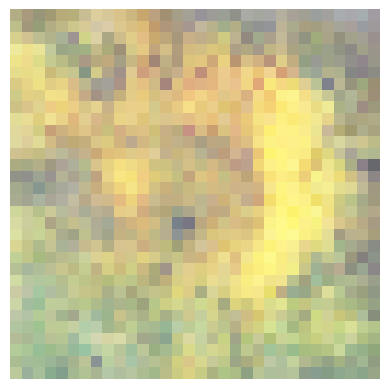

Epoch 961/2500
Generator loss: 0.9832684993743896, Discriminator loss: 1.2311345338821411
Epoch 962/2500
Generator loss: 0.9950302839279175, Discriminator loss: 1.1192870140075684
Epoch 963/2500
Generator loss: 1.1272109746932983, Discriminator loss: 1.060235857963562
Epoch 964/2500
Generator loss: 1.0351864099502563, Discriminator loss: 1.2263308763504028
Epoch 965/2500
Generator loss: 1.154043197631836, Discriminator loss: 1.0649092197418213
Epoch 966/2500
Generator loss: 1.10916268825531, Discriminator loss: 1.1236869096755981
Epoch 967/2500
Generator loss: 1.1718991994857788, Discriminator loss: 0.9916572570800781
Epoch 968/2500
Generator loss: 1.202135682106018, Discriminator loss: 1.1152454614639282
Epoch 969/2500
Generator loss: 1.0005712509155273, Discriminator loss: 1.3915878534317017
Epoch 970/2500
Generator loss: 0.8910421133041382, Discriminator loss: 1.3675756454467773


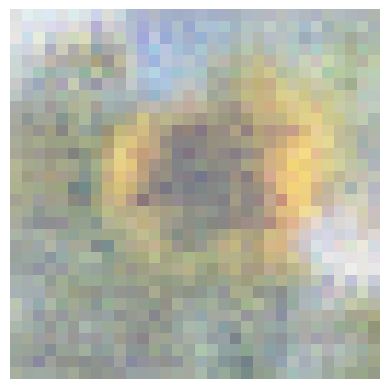

Epoch 971/2500
Generator loss: 1.1570438146591187, Discriminator loss: 1.0162105560302734
Epoch 972/2500
Generator loss: 1.014872431755066, Discriminator loss: 1.1845773458480835
Epoch 973/2500
Generator loss: 1.0583194494247437, Discriminator loss: 1.1502466201782227
Epoch 974/2500
Generator loss: 1.0768669843673706, Discriminator loss: 1.1984589099884033
Epoch 975/2500
Generator loss: 1.2675992250442505, Discriminator loss: 0.9188396334648132
Epoch 976/2500
Generator loss: 1.0696971416473389, Discriminator loss: 1.1492136716842651
Epoch 977/2500
Generator loss: 1.0550415515899658, Discriminator loss: 1.1749897003173828
Epoch 978/2500
Generator loss: 1.0070792436599731, Discriminator loss: 1.172616958618164
Epoch 979/2500
Generator loss: 1.0301024913787842, Discriminator loss: 1.168044090270996
Epoch 980/2500
Generator loss: 1.3284766674041748, Discriminator loss: 0.9806481599807739


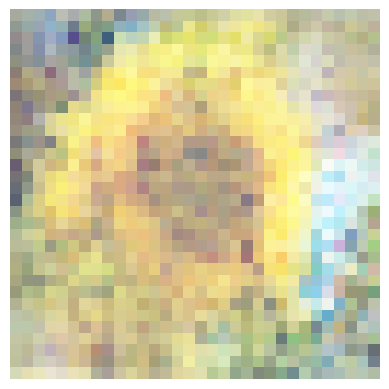

Epoch 981/2500
Generator loss: 1.0085418224334717, Discriminator loss: 1.2867810726165771
Epoch 982/2500
Generator loss: 1.0808782577514648, Discriminator loss: 1.0993232727050781
Epoch 983/2500
Generator loss: 1.1056336164474487, Discriminator loss: 1.0570597648620605
Epoch 984/2500
Generator loss: 1.012183666229248, Discriminator loss: 1.184354543685913
Epoch 985/2500
Generator loss: 1.0776057243347168, Discriminator loss: 1.2095297574996948
Epoch 986/2500
Generator loss: 1.0412746667861938, Discriminator loss: 1.1197937726974487
Epoch 987/2500
Generator loss: 0.8869909048080444, Discriminator loss: 1.3595333099365234
Epoch 988/2500
Generator loss: 1.340358018875122, Discriminator loss: 0.8819754123687744
Epoch 989/2500
Generator loss: 0.9891267418861389, Discriminator loss: 1.2574752569198608
Epoch 990/2500
Generator loss: 1.080694317817688, Discriminator loss: 1.168171763420105


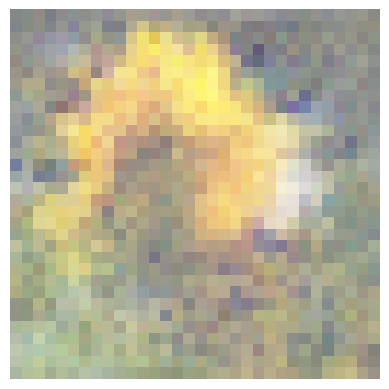

Epoch 991/2500
Generator loss: 1.112663745880127, Discriminator loss: 1.1154162883758545
Epoch 992/2500
Generator loss: 0.9965713024139404, Discriminator loss: 1.2392253875732422
Epoch 993/2500
Generator loss: 1.2017279863357544, Discriminator loss: 1.0023142099380493
Epoch 994/2500
Generator loss: 1.0694903135299683, Discriminator loss: 1.1388435363769531
Epoch 995/2500
Generator loss: 0.9838202595710754, Discriminator loss: 1.2209097146987915
Epoch 996/2500
Generator loss: 0.9836931228637695, Discriminator loss: 1.1608543395996094
Epoch 997/2500
Generator loss: 1.1228618621826172, Discriminator loss: 1.195385456085205
Epoch 998/2500
Generator loss: 1.0313267707824707, Discriminator loss: 1.2067561149597168
Epoch 999/2500
Generator loss: 1.0063592195510864, Discriminator loss: 1.1367220878601074
Epoch 1000/2500
Generator loss: 1.0698108673095703, Discriminator loss: 1.1124114990234375


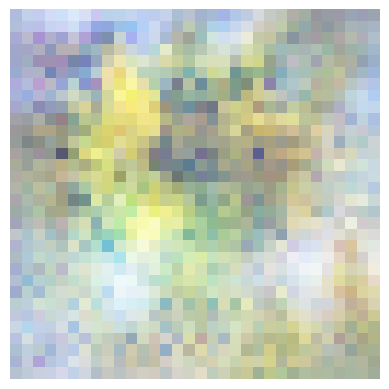

Epoch 1001/2500
Generator loss: 1.0863090753555298, Discriminator loss: 1.1120702028274536
Epoch 1002/2500
Generator loss: 1.1023277044296265, Discriminator loss: 1.0958807468414307
Epoch 1003/2500
Generator loss: 0.8669350147247314, Discriminator loss: 1.402686357498169
Epoch 1004/2500
Generator loss: 1.196725606918335, Discriminator loss: 1.0107940435409546
Epoch 1005/2500
Generator loss: 1.0612478256225586, Discriminator loss: 1.0817055702209473
Epoch 1006/2500
Generator loss: 0.9865313172340393, Discriminator loss: 1.2152808904647827
Epoch 1007/2500
Generator loss: 1.0434136390686035, Discriminator loss: 1.1620349884033203
Epoch 1008/2500
Generator loss: 1.0575400590896606, Discriminator loss: 1.1657549142837524
Epoch 1009/2500
Generator loss: 1.127177357673645, Discriminator loss: 1.1501412391662598
Epoch 1010/2500
Generator loss: 1.0293885469436646, Discriminator loss: 1.1733787059783936


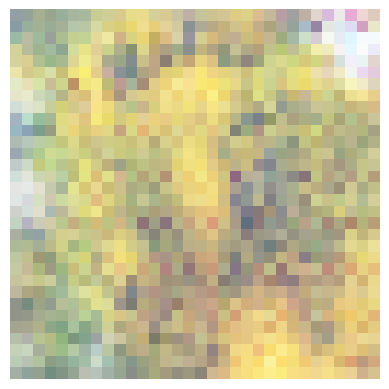

Epoch 1011/2500
Generator loss: 1.078772783279419, Discriminator loss: 1.1121007204055786
Epoch 1012/2500
Generator loss: 1.121659755706787, Discriminator loss: 1.037221908569336
Epoch 1013/2500
Generator loss: 0.9595557451248169, Discriminator loss: 1.2332141399383545
Epoch 1014/2500
Generator loss: 0.9826256632804871, Discriminator loss: 1.2461551427841187
Epoch 1015/2500
Generator loss: 1.1484601497650146, Discriminator loss: 1.1057919263839722
Epoch 1016/2500
Generator loss: 0.9813263416290283, Discriminator loss: 1.2912571430206299
Epoch 1017/2500
Generator loss: 1.0831539630889893, Discriminator loss: 1.0633968114852905
Epoch 1018/2500
Generator loss: 1.070159912109375, Discriminator loss: 1.1249549388885498
Epoch 1019/2500
Generator loss: 1.1097465753555298, Discriminator loss: 1.0567048788070679
Epoch 1020/2500
Generator loss: 1.02017343044281, Discriminator loss: 1.2685240507125854


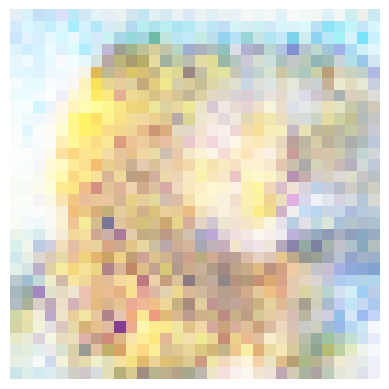

Epoch 1021/2500
Generator loss: 0.9683949947357178, Discriminator loss: 1.239719033241272
Epoch 1022/2500
Generator loss: 1.028180718421936, Discriminator loss: 1.1675127744674683
Epoch 1023/2500
Generator loss: 1.0013917684555054, Discriminator loss: 1.160035252571106
Epoch 1024/2500
Generator loss: 1.040994644165039, Discriminator loss: 1.1784801483154297
Epoch 1025/2500
Generator loss: 1.0528125762939453, Discriminator loss: 1.2340495586395264
Epoch 1026/2500
Generator loss: 1.037166714668274, Discriminator loss: 1.1206488609313965
Epoch 1027/2500
Generator loss: 1.0388164520263672, Discriminator loss: 1.1529927253723145
Epoch 1028/2500
Generator loss: 1.057799220085144, Discriminator loss: 1.1175616979599
Epoch 1029/2500
Generator loss: 0.9438173174858093, Discriminator loss: 1.2401920557022095
Epoch 1030/2500
Generator loss: 1.0217052698135376, Discriminator loss: 1.1665736436843872


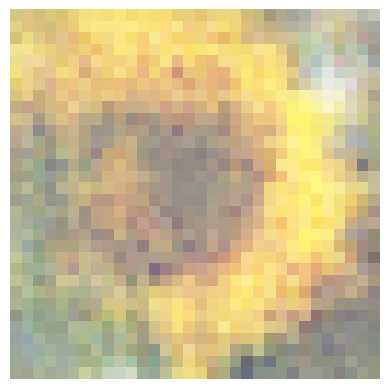

Epoch 1031/2500
Generator loss: 1.0234483480453491, Discriminator loss: 1.2440632581710815
Epoch 1032/2500
Generator loss: 1.0178910493850708, Discriminator loss: 1.126721739768982
Epoch 1033/2500
Generator loss: 0.9606793522834778, Discriminator loss: 1.248481035232544
Epoch 1034/2500
Generator loss: 1.0608084201812744, Discriminator loss: 1.1344245672225952
Epoch 1035/2500
Generator loss: 1.0393521785736084, Discriminator loss: 1.1215277910232544
Epoch 1036/2500
Generator loss: 0.9641392230987549, Discriminator loss: 1.2420063018798828
Epoch 1037/2500
Generator loss: 1.0659258365631104, Discriminator loss: 1.1052732467651367
Epoch 1038/2500
Generator loss: 1.0333070755004883, Discriminator loss: 1.1566805839538574
Epoch 1039/2500
Generator loss: 0.9981508851051331, Discriminator loss: 1.1658498048782349
Epoch 1040/2500
Generator loss: 1.007622241973877, Discriminator loss: 1.1481178998947144


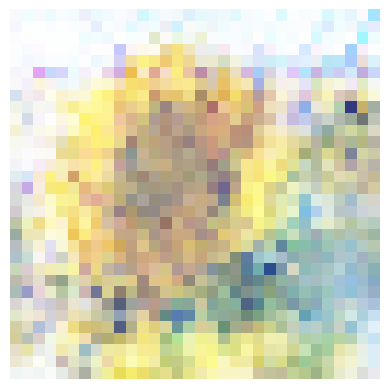

Epoch 1041/2500
Generator loss: 1.088937759399414, Discriminator loss: 1.1002579927444458
Epoch 1042/2500
Generator loss: 0.922878623008728, Discriminator loss: 1.293287992477417
Epoch 1043/2500
Generator loss: 1.0450519323349, Discriminator loss: 1.073755145072937
Epoch 1044/2500
Generator loss: 1.0499356985092163, Discriminator loss: 1.1259335279464722
Epoch 1045/2500
Generator loss: 1.0503820180892944, Discriminator loss: 1.2590175867080688
Epoch 1046/2500
Generator loss: 1.0295218229293823, Discriminator loss: 1.172341227531433
Epoch 1047/2500
Generator loss: 1.0154026746749878, Discriminator loss: 1.1583348512649536
Epoch 1048/2500
Generator loss: 0.9225277900695801, Discriminator loss: 1.2579528093338013
Epoch 1049/2500
Generator loss: 0.992792546749115, Discriminator loss: 1.1650193929672241
Epoch 1050/2500
Generator loss: 1.056605577468872, Discriminator loss: 1.1421058177947998


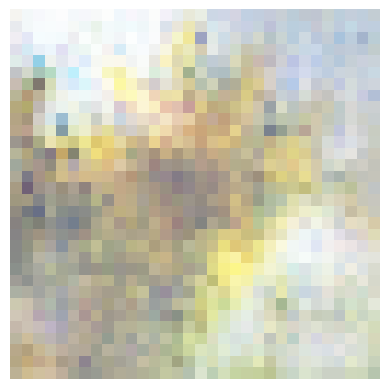

Epoch 1051/2500
Generator loss: 1.0700855255126953, Discriminator loss: 1.1299831867218018
Epoch 1052/2500
Generator loss: 1.0062669515609741, Discriminator loss: 1.2963522672653198
Epoch 1053/2500
Generator loss: 1.0906943082809448, Discriminator loss: 1.1133177280426025
Epoch 1054/2500
Generator loss: 1.1157712936401367, Discriminator loss: 1.0643184185028076
Epoch 1055/2500
Generator loss: 0.9244729280471802, Discriminator loss: 1.2841517925262451
Epoch 1056/2500
Generator loss: 1.0856144428253174, Discriminator loss: 1.119337797164917
Epoch 1057/2500
Generator loss: 1.0365495681762695, Discriminator loss: 1.15435791015625
Epoch 1058/2500
Generator loss: 1.0440044403076172, Discriminator loss: 1.1052393913269043
Epoch 1059/2500
Generator loss: 0.9744910001754761, Discriminator loss: 1.2598789930343628
Epoch 1060/2500
Generator loss: 1.1322420835494995, Discriminator loss: 1.0985076427459717


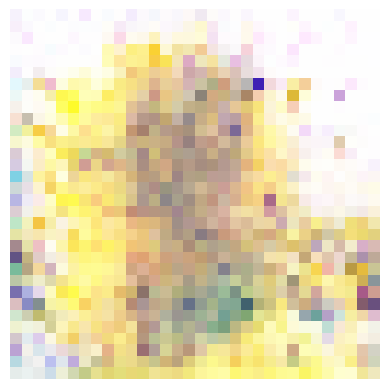

Epoch 1061/2500
Generator loss: 1.020463228225708, Discriminator loss: 1.167358160018921
Epoch 1062/2500
Generator loss: 0.9804192781448364, Discriminator loss: 1.1839395761489868
Epoch 1063/2500
Generator loss: 0.9268625974655151, Discriminator loss: 1.2483047246932983
Epoch 1064/2500
Generator loss: 1.0419285297393799, Discriminator loss: 1.1099557876586914
Epoch 1065/2500
Generator loss: 0.9747495055198669, Discriminator loss: 1.2187244892120361
Epoch 1066/2500
Generator loss: 0.9583606719970703, Discriminator loss: 1.2616674900054932
Epoch 1067/2500
Generator loss: 1.0195372104644775, Discriminator loss: 1.145790457725525
Epoch 1068/2500
Generator loss: 1.024580478668213, Discriminator loss: 1.1569734811782837
Epoch 1069/2500
Generator loss: 0.9446834325790405, Discriminator loss: 1.244577169418335
Epoch 1070/2500
Generator loss: 0.9808904528617859, Discriminator loss: 1.2108619213104248


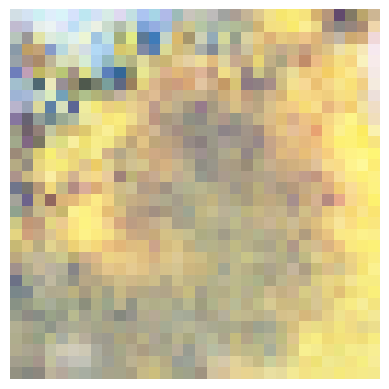

Epoch 1071/2500
Generator loss: 1.0695538520812988, Discriminator loss: 1.0804095268249512
Epoch 1072/2500
Generator loss: 1.039964199066162, Discriminator loss: 1.1911779642105103
Epoch 1073/2500
Generator loss: 1.0320494174957275, Discriminator loss: 1.1148698329925537
Epoch 1074/2500
Generator loss: 0.8758037686347961, Discriminator loss: 1.3529917001724243
Epoch 1075/2500
Generator loss: 1.043296456336975, Discriminator loss: 1.1352460384368896
Epoch 1076/2500
Generator loss: 1.0103731155395508, Discriminator loss: 1.1473852396011353
Epoch 1077/2500
Generator loss: 1.0070538520812988, Discriminator loss: 1.1322245597839355
Epoch 1078/2500
Generator loss: 0.9443999528884888, Discriminator loss: 1.280760407447815
Epoch 1079/2500
Generator loss: 0.9687044620513916, Discriminator loss: 1.2685235738754272
Epoch 1080/2500
Generator loss: 1.06635582447052, Discriminator loss: 1.1446117162704468


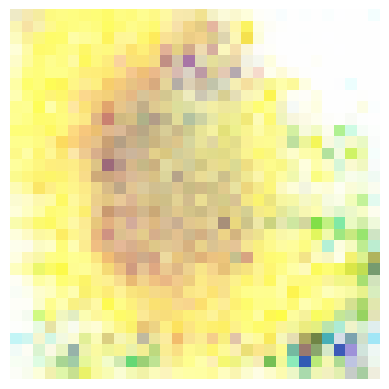

Epoch 1081/2500
Generator loss: 1.0009185075759888, Discriminator loss: 1.1613430976867676
Epoch 1082/2500
Generator loss: 1.1404681205749512, Discriminator loss: 1.109854817390442
Epoch 1083/2500
Generator loss: 0.9750280380249023, Discriminator loss: 1.220030665397644
Epoch 1084/2500
Generator loss: 1.0679833889007568, Discriminator loss: 1.1497548818588257
Epoch 1085/2500
Generator loss: 0.9845719933509827, Discriminator loss: 1.2459274530410767
Epoch 1086/2500
Generator loss: 1.110244631767273, Discriminator loss: 1.062363862991333
Epoch 1087/2500
Generator loss: 0.9652727842330933, Discriminator loss: 1.2305774688720703
Epoch 1088/2500
Generator loss: 0.9761493802070618, Discriminator loss: 1.165669322013855
Epoch 1089/2500
Generator loss: 1.1241720914840698, Discriminator loss: 1.0852159261703491
Epoch 1090/2500
Generator loss: 0.9971922636032104, Discriminator loss: 1.295369029045105


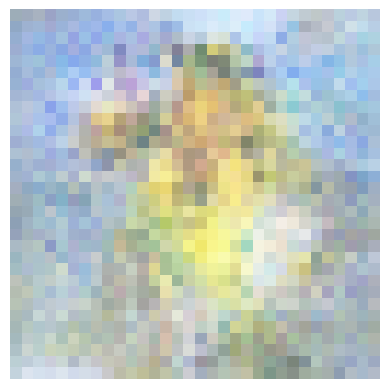

Epoch 1091/2500
Generator loss: 0.9903221130371094, Discriminator loss: 1.1662752628326416
Epoch 1092/2500
Generator loss: 1.0123625993728638, Discriminator loss: 1.178389310836792
Epoch 1093/2500
Generator loss: 1.0681946277618408, Discriminator loss: 1.1697478294372559
Epoch 1094/2500
Generator loss: 1.0805721282958984, Discriminator loss: 1.090230941772461
Epoch 1095/2500
Generator loss: 1.119130253791809, Discriminator loss: 1.1026278734207153
Epoch 1096/2500
Generator loss: 1.1283888816833496, Discriminator loss: 1.1217615604400635
Epoch 1097/2500
Generator loss: 1.2386599779129028, Discriminator loss: 1.0209230184555054
Epoch 1098/2500
Generator loss: 0.9767636656761169, Discriminator loss: 1.2737892866134644
Epoch 1099/2500
Generator loss: 1.0183871984481812, Discriminator loss: 1.2376657724380493
Epoch 1100/2500
Generator loss: 0.9549605250358582, Discriminator loss: 1.216781497001648


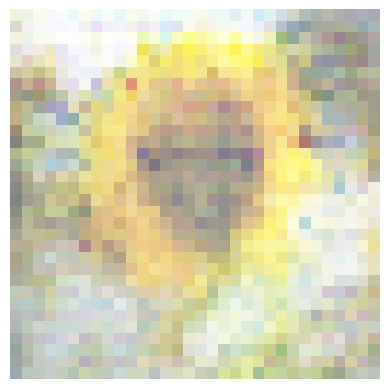

Epoch 1101/2500
Generator loss: 1.1112217903137207, Discriminator loss: 1.081898808479309
Epoch 1102/2500
Generator loss: 1.1754252910614014, Discriminator loss: 1.0766723155975342
Epoch 1103/2500
Generator loss: 1.0493172407150269, Discriminator loss: 1.253129005432129
Epoch 1104/2500
Generator loss: 1.2073529958724976, Discriminator loss: 0.9929839372634888
Epoch 1105/2500
Generator loss: 1.0949969291687012, Discriminator loss: 1.0638225078582764
Epoch 1106/2500
Generator loss: 0.9391111731529236, Discriminator loss: 1.3225252628326416
Epoch 1107/2500
Generator loss: 1.0264081954956055, Discriminator loss: 1.1499038934707642
Epoch 1108/2500
Generator loss: 1.1528695821762085, Discriminator loss: 1.0338531732559204
Epoch 1109/2500
Generator loss: 0.8524777293205261, Discriminator loss: 1.4208157062530518
Epoch 1110/2500
Generator loss: 1.1676006317138672, Discriminator loss: 0.9935007691383362


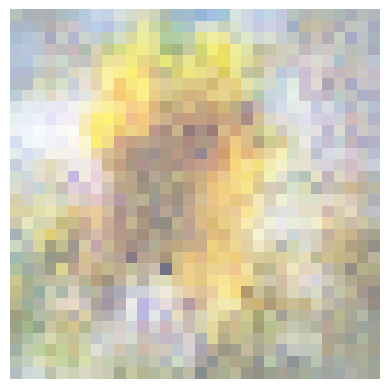

Epoch 1111/2500
Generator loss: 0.9562898278236389, Discriminator loss: 1.2594621181488037
Epoch 1112/2500
Generator loss: 1.2113763093948364, Discriminator loss: 1.0361615419387817
Epoch 1113/2500
Generator loss: 1.0619372129440308, Discriminator loss: 1.1864455938339233
Epoch 1114/2500
Generator loss: 1.1782106161117554, Discriminator loss: 1.030182957649231
Epoch 1115/2500
Generator loss: 1.1481926441192627, Discriminator loss: 1.1150795221328735
Epoch 1116/2500
Generator loss: 1.0828499794006348, Discriminator loss: 1.1416195631027222
Epoch 1117/2500
Generator loss: 1.0835185050964355, Discriminator loss: 1.1293115615844727
Epoch 1118/2500
Generator loss: 1.0559170246124268, Discriminator loss: 1.1021137237548828
Epoch 1119/2500
Generator loss: 0.9756118059158325, Discriminator loss: 1.2212480306625366
Epoch 1120/2500
Generator loss: 1.3140326738357544, Discriminator loss: 0.9319412112236023


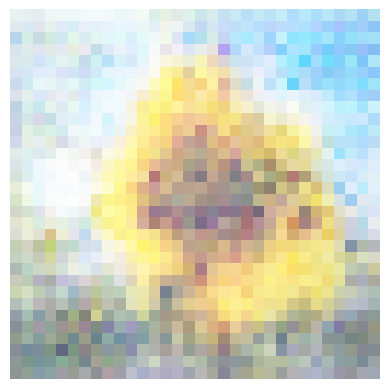

Epoch 1121/2500
Generator loss: 1.0030810832977295, Discriminator loss: 1.3708099126815796
Epoch 1122/2500
Generator loss: 1.0721397399902344, Discriminator loss: 1.2807379961013794
Epoch 1123/2500
Generator loss: 1.3429111242294312, Discriminator loss: 0.9477123022079468
Epoch 1124/2500
Generator loss: 1.2036038637161255, Discriminator loss: 1.0879361629486084
Epoch 1125/2500
Generator loss: 1.0840352773666382, Discriminator loss: 1.1188102960586548
Epoch 1126/2500
Generator loss: 0.990763783454895, Discriminator loss: 1.2402485609054565
Epoch 1127/2500
Generator loss: 1.1288015842437744, Discriminator loss: 1.0813195705413818
Epoch 1128/2500
Generator loss: 0.9626143574714661, Discriminator loss: 1.2649086713790894
Epoch 1129/2500
Generator loss: 1.1043286323547363, Discriminator loss: 1.145193338394165
Epoch 1130/2500
Generator loss: 1.0765069723129272, Discriminator loss: 1.0677483081817627


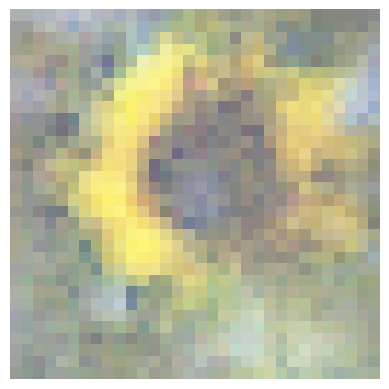

Epoch 1131/2500
Generator loss: 1.056250810623169, Discriminator loss: 1.1060683727264404
Epoch 1132/2500
Generator loss: 1.1554815769195557, Discriminator loss: 1.0525691509246826
Epoch 1133/2500
Generator loss: 0.9151568412780762, Discriminator loss: 1.376261830329895
Epoch 1134/2500
Generator loss: 1.1895924806594849, Discriminator loss: 1.0184060335159302
Epoch 1135/2500
Generator loss: 1.0460004806518555, Discriminator loss: 1.1541563272476196
Epoch 1136/2500
Generator loss: 1.0987619161605835, Discriminator loss: 1.1017117500305176
Epoch 1137/2500
Generator loss: 1.0316181182861328, Discriminator loss: 1.2287997007369995
Epoch 1138/2500
Generator loss: 1.0712281465530396, Discriminator loss: 1.1402294635772705
Epoch 1139/2500
Generator loss: 1.1190661191940308, Discriminator loss: 1.1175405979156494
Epoch 1140/2500
Generator loss: 0.9906020760536194, Discriminator loss: 1.210180401802063


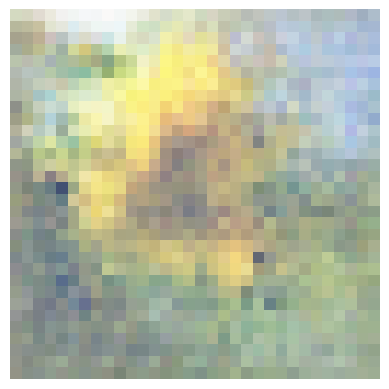

Epoch 1141/2500
Generator loss: 1.1007567644119263, Discriminator loss: 1.1023317575454712
Epoch 1142/2500
Generator loss: 1.0580748319625854, Discriminator loss: 1.1596282720565796
Epoch 1143/2500
Generator loss: 1.0543156862258911, Discriminator loss: 1.1111247539520264
Epoch 1144/2500
Generator loss: 1.0285135507583618, Discriminator loss: 1.1401289701461792
Epoch 1145/2500
Generator loss: 1.0675384998321533, Discriminator loss: 1.1573666334152222
Epoch 1146/2500
Generator loss: 1.0625265836715698, Discriminator loss: 1.1022233963012695
Epoch 1147/2500
Generator loss: 0.9870476126670837, Discriminator loss: 1.22412109375
Epoch 1148/2500
Generator loss: 1.1275522708892822, Discriminator loss: 1.0705666542053223
Epoch 1149/2500
Generator loss: 1.0240622758865356, Discriminator loss: 1.113311529159546
Epoch 1150/2500
Generator loss: 0.9036679267883301, Discriminator loss: 1.272799015045166


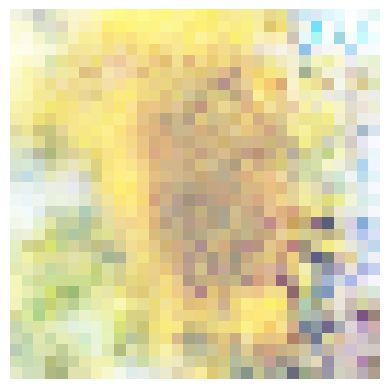

Epoch 1151/2500
Generator loss: 1.0614854097366333, Discriminator loss: 1.1024116277694702
Epoch 1152/2500
Generator loss: 1.0391732454299927, Discriminator loss: 1.1987589597702026
Epoch 1153/2500
Generator loss: 1.0858675241470337, Discriminator loss: 1.0998485088348389
Epoch 1154/2500
Generator loss: 1.0863637924194336, Discriminator loss: 1.1434919834136963
Epoch 1155/2500
Generator loss: 1.0790469646453857, Discriminator loss: 1.1026999950408936
Epoch 1156/2500
Generator loss: 0.969019889831543, Discriminator loss: 1.2452458143234253
Epoch 1157/2500
Generator loss: 1.1058076620101929, Discriminator loss: 1.0341744422912598
Epoch 1158/2500
Generator loss: 0.9440958499908447, Discriminator loss: 1.2653555870056152
Epoch 1159/2500
Generator loss: 1.1457648277282715, Discriminator loss: 1.1038868427276611
Epoch 1160/2500
Generator loss: 1.0347567796707153, Discriminator loss: 1.2202383279800415


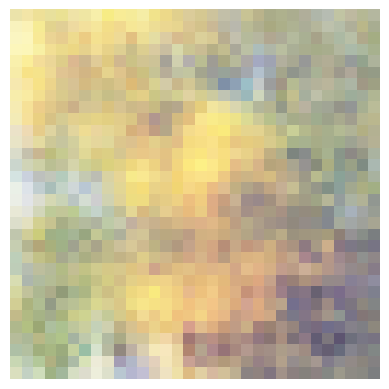

Epoch 1161/2500
Generator loss: 1.0153836011886597, Discriminator loss: 1.1096564531326294
Epoch 1162/2500
Generator loss: 0.9694065451622009, Discriminator loss: 1.1888620853424072
Epoch 1163/2500
Generator loss: 1.0794340372085571, Discriminator loss: 1.1163711547851562
Epoch 1164/2500
Generator loss: 0.94475919008255, Discriminator loss: 1.277016043663025
Epoch 1165/2500
Generator loss: 1.0930005311965942, Discriminator loss: 1.086706280708313
Epoch 1166/2500
Generator loss: 1.127731204032898, Discriminator loss: 1.076366662979126
Epoch 1167/2500
Generator loss: 1.0239014625549316, Discriminator loss: 1.1717385053634644
Epoch 1168/2500
Generator loss: 1.0146499872207642, Discriminator loss: 1.1941273212432861
Epoch 1169/2500
Generator loss: 1.1151677370071411, Discriminator loss: 1.0802161693572998
Epoch 1170/2500
Generator loss: 0.9780501127243042, Discriminator loss: 1.2060109376907349


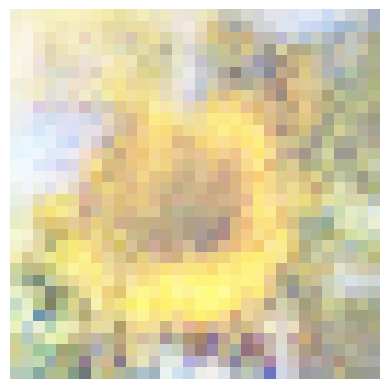

Epoch 1171/2500
Generator loss: 1.0320302248001099, Discriminator loss: 1.1606923341751099
Epoch 1172/2500
Generator loss: 1.0101909637451172, Discriminator loss: 1.195967197418213
Epoch 1173/2500
Generator loss: 1.062798023223877, Discriminator loss: 1.125120759010315
Epoch 1174/2500
Generator loss: 1.00260329246521, Discriminator loss: 1.2213581800460815
Epoch 1175/2500
Generator loss: 1.0498946905136108, Discriminator loss: 1.1492104530334473
Epoch 1176/2500
Generator loss: 1.0677698850631714, Discriminator loss: 1.0603342056274414
Epoch 1177/2500
Generator loss: 1.0595606565475464, Discriminator loss: 1.1022546291351318
Epoch 1178/2500
Generator loss: 0.997884213924408, Discriminator loss: 1.2204104661941528
Epoch 1179/2500
Generator loss: 1.139418125152588, Discriminator loss: 1.0630086660385132
Epoch 1180/2500
Generator loss: 1.0260950326919556, Discriminator loss: 1.2313213348388672


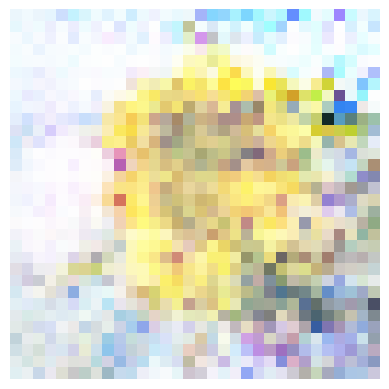

Epoch 1181/2500
Generator loss: 1.0451346635818481, Discriminator loss: 1.1977674961090088
Epoch 1182/2500
Generator loss: 1.0413779020309448, Discriminator loss: 1.105835199356079
Epoch 1183/2500
Generator loss: 1.0378831624984741, Discriminator loss: 1.1045113801956177
Epoch 1184/2500
Generator loss: 1.013919711112976, Discriminator loss: 1.125316858291626
Epoch 1185/2500
Generator loss: 0.9956220984458923, Discriminator loss: 1.228251338005066
Epoch 1186/2500
Generator loss: 1.1154050827026367, Discriminator loss: 1.0674774646759033
Epoch 1187/2500
Generator loss: 1.0126376152038574, Discriminator loss: 1.1782664060592651
Epoch 1188/2500
Generator loss: 1.0678764581680298, Discriminator loss: 1.0956307649612427
Epoch 1189/2500
Generator loss: 1.019654393196106, Discriminator loss: 1.1509872674942017
Epoch 1190/2500
Generator loss: 1.0595778226852417, Discriminator loss: 1.113448977470398


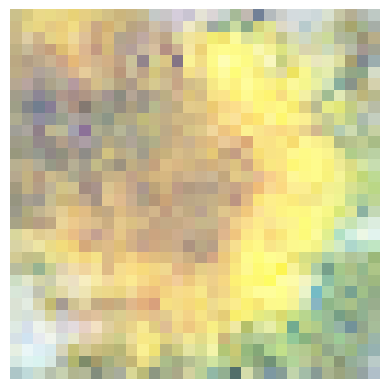

Epoch 1191/2500
Generator loss: 0.9785565733909607, Discriminator loss: 1.148432970046997
Epoch 1192/2500
Generator loss: 1.0711113214492798, Discriminator loss: 1.139533519744873
Epoch 1193/2500
Generator loss: 1.0344032049179077, Discriminator loss: 1.179677128791809
Epoch 1194/2500
Generator loss: 1.074726939201355, Discriminator loss: 1.138319969177246
Epoch 1195/2500
Generator loss: 1.0722483396530151, Discriminator loss: 1.1504467725753784
Epoch 1196/2500
Generator loss: 0.9853628873825073, Discriminator loss: 1.1866633892059326
Epoch 1197/2500
Generator loss: 1.1201467514038086, Discriminator loss: 1.1134867668151855
Epoch 1198/2500
Generator loss: 0.9922993779182434, Discriminator loss: 1.2298524379730225
Epoch 1199/2500
Generator loss: 1.015874981880188, Discriminator loss: 1.1463947296142578
Epoch 1200/2500
Generator loss: 0.9315460324287415, Discriminator loss: 1.2585035562515259


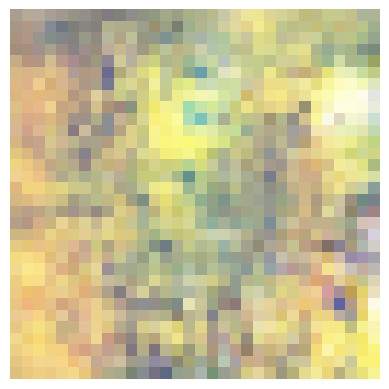

Epoch 1201/2500
Generator loss: 1.0409014225006104, Discriminator loss: 1.1150364875793457
Epoch 1202/2500
Generator loss: 1.0596187114715576, Discriminator loss: 1.0912104845046997
Epoch 1203/2500
Generator loss: 1.0246230363845825, Discriminator loss: 1.112308144569397
Epoch 1204/2500
Generator loss: 1.1214262247085571, Discriminator loss: 1.1139047145843506
Epoch 1205/2500
Generator loss: 0.9624981880187988, Discriminator loss: 1.3264861106872559
Epoch 1206/2500
Generator loss: 1.1676980257034302, Discriminator loss: 1.0228134393692017
Epoch 1207/2500
Generator loss: 1.048606276512146, Discriminator loss: 1.1272672414779663
Epoch 1208/2500
Generator loss: 1.1478952169418335, Discriminator loss: 1.0371519327163696
Epoch 1209/2500
Generator loss: 1.065663456916809, Discriminator loss: 1.1443393230438232
Epoch 1210/2500
Generator loss: 1.0877331495285034, Discriminator loss: 1.0812534093856812


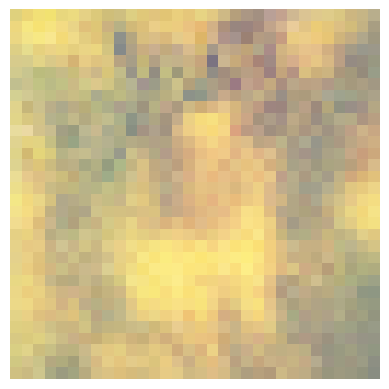

Epoch 1211/2500
Generator loss: 1.043131947517395, Discriminator loss: 1.2039554119110107
Epoch 1212/2500
Generator loss: 1.1431910991668701, Discriminator loss: 1.0690500736236572
Epoch 1213/2500
Generator loss: 1.0457148551940918, Discriminator loss: 1.1609381437301636
Epoch 1214/2500
Generator loss: 1.1013017892837524, Discriminator loss: 1.0916301012039185
Epoch 1215/2500
Generator loss: 1.1190211772918701, Discriminator loss: 1.1210111379623413
Epoch 1216/2500
Generator loss: 1.0095220804214478, Discriminator loss: 1.273461937904358
Epoch 1217/2500
Generator loss: 1.116384744644165, Discriminator loss: 1.0385743379592896
Epoch 1218/2500
Generator loss: 1.0171526670455933, Discriminator loss: 1.2590874433517456
Epoch 1219/2500
Generator loss: 1.2454785108566284, Discriminator loss: 0.9695383310317993
Epoch 1220/2500
Generator loss: 1.0878291130065918, Discriminator loss: 1.1569690704345703


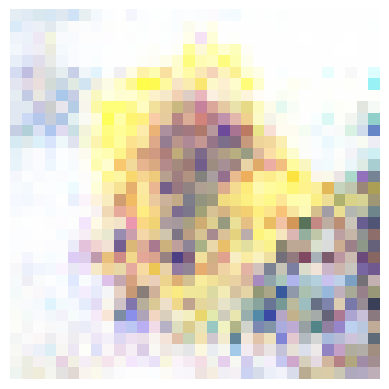

Epoch 1221/2500
Generator loss: 1.2031595706939697, Discriminator loss: 1.0447202920913696
Epoch 1222/2500
Generator loss: 0.9922316670417786, Discriminator loss: 1.2382816076278687
Epoch 1223/2500
Generator loss: 1.2027853727340698, Discriminator loss: 1.1015212535858154
Epoch 1224/2500
Generator loss: 1.0543920993804932, Discriminator loss: 1.168542742729187
Epoch 1225/2500
Generator loss: 1.1671197414398193, Discriminator loss: 1.0135310888290405
Epoch 1226/2500
Generator loss: 0.9959118962287903, Discriminator loss: 1.2749978303909302
Epoch 1227/2500
Generator loss: 1.1999642848968506, Discriminator loss: 1.0373997688293457
Epoch 1228/2500
Generator loss: 1.145181655883789, Discriminator loss: 1.1245418787002563
Epoch 1229/2500
Generator loss: 1.165649652481079, Discriminator loss: 1.0802747011184692
Epoch 1230/2500
Generator loss: 1.2662181854248047, Discriminator loss: 1.1014574766159058


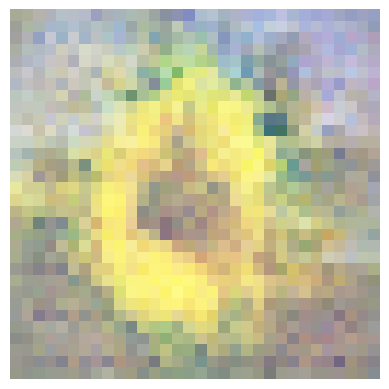

Epoch 1231/2500
Generator loss: 1.359063744544983, Discriminator loss: 0.9436253309249878
Epoch 1232/2500
Generator loss: 1.1707464456558228, Discriminator loss: 1.1972026824951172
Epoch 1233/2500
Generator loss: 1.0865488052368164, Discriminator loss: 1.259751796722412
Epoch 1234/2500
Generator loss: 1.163913369178772, Discriminator loss: 1.1751536130905151
Epoch 1235/2500
Generator loss: 1.2011984586715698, Discriminator loss: 1.0582083463668823
Epoch 1236/2500
Generator loss: 1.0806491374969482, Discriminator loss: 1.1278440952301025
Epoch 1237/2500
Generator loss: 1.0956320762634277, Discriminator loss: 1.08572256565094
Epoch 1238/2500
Generator loss: 1.08378005027771, Discriminator loss: 1.1294125318527222
Epoch 1239/2500
Generator loss: 1.3016796112060547, Discriminator loss: 0.9945904016494751
Epoch 1240/2500
Generator loss: 1.0109996795654297, Discriminator loss: 1.350474238395691


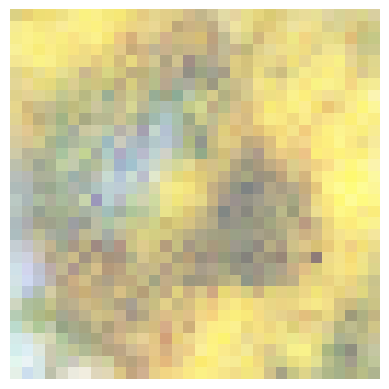

Epoch 1241/2500
Generator loss: 1.1725562810897827, Discriminator loss: 1.1206468343734741
Epoch 1242/2500
Generator loss: 1.0712244510650635, Discriminator loss: 1.1332402229309082
Epoch 1243/2500
Generator loss: 1.0548115968704224, Discriminator loss: 1.1296905279159546
Epoch 1244/2500
Generator loss: 1.1731369495391846, Discriminator loss: 1.0751913785934448
Epoch 1245/2500
Generator loss: 1.1240888833999634, Discriminator loss: 1.0880600214004517
Epoch 1246/2500
Generator loss: 1.125563144683838, Discriminator loss: 1.0795438289642334
Epoch 1247/2500
Generator loss: 1.0333791971206665, Discriminator loss: 1.217536211013794
Epoch 1248/2500
Generator loss: 1.1879613399505615, Discriminator loss: 1.0592331886291504
Epoch 1249/2500
Generator loss: 0.991143524646759, Discriminator loss: 1.209512710571289
Epoch 1250/2500
Generator loss: 0.9951109290122986, Discriminator loss: 1.2296130657196045


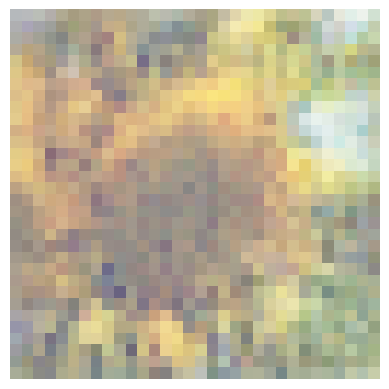

Epoch 1251/2500
Generator loss: 1.0974445343017578, Discriminator loss: 1.1013329029083252
Epoch 1252/2500
Generator loss: 1.1472384929656982, Discriminator loss: 1.0598068237304688
Epoch 1253/2500
Generator loss: 1.1074533462524414, Discriminator loss: 1.070757269859314
Epoch 1254/2500
Generator loss: 1.0453344583511353, Discriminator loss: 1.1459691524505615
Epoch 1255/2500
Generator loss: 1.038590669631958, Discriminator loss: 1.170314073562622
Epoch 1256/2500
Generator loss: 1.141120433807373, Discriminator loss: 1.0518178939819336
Epoch 1257/2500
Generator loss: 1.0246728658676147, Discriminator loss: 1.2266207933425903
Epoch 1258/2500
Generator loss: 1.1388038396835327, Discriminator loss: 1.0019702911376953
Epoch 1259/2500
Generator loss: 0.9658848643302917, Discriminator loss: 1.306849479675293
Epoch 1260/2500
Generator loss: 1.1085542440414429, Discriminator loss: 1.0302351713180542


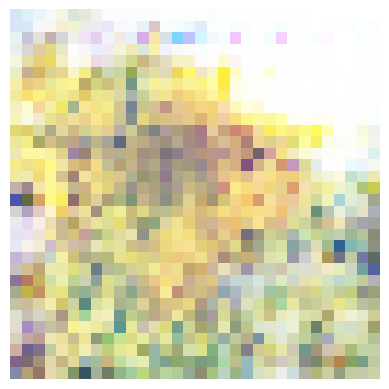

Epoch 1261/2500
Generator loss: 1.0416553020477295, Discriminator loss: 1.165963888168335
Epoch 1262/2500
Generator loss: 1.1163372993469238, Discriminator loss: 1.0375003814697266
Epoch 1263/2500
Generator loss: 0.9505246877670288, Discriminator loss: 1.2739447355270386
Epoch 1264/2500
Generator loss: 1.0865609645843506, Discriminator loss: 1.0642255544662476
Epoch 1265/2500
Generator loss: 1.0986924171447754, Discriminator loss: 1.152289867401123
Epoch 1266/2500
Generator loss: 1.1055177450180054, Discriminator loss: 1.067409873008728
Epoch 1267/2500
Generator loss: 1.032925009727478, Discriminator loss: 1.18812894821167
Epoch 1268/2500
Generator loss: 1.1103460788726807, Discriminator loss: 1.0742706060409546
Epoch 1269/2500
Generator loss: 1.0480551719665527, Discriminator loss: 1.2106214761734009
Epoch 1270/2500
Generator loss: 1.2074024677276611, Discriminator loss: 0.9731053709983826


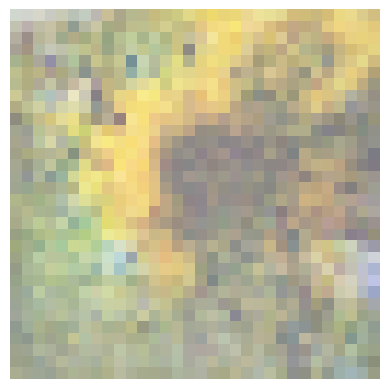

Epoch 1271/2500
Generator loss: 0.9738982319831848, Discriminator loss: 1.237933874130249
Epoch 1272/2500
Generator loss: 1.1208747625350952, Discriminator loss: 1.114267110824585
Epoch 1273/2500
Generator loss: 1.0349059104919434, Discriminator loss: 1.1835271120071411
Epoch 1274/2500
Generator loss: 1.0361135005950928, Discriminator loss: 1.09721040725708
Epoch 1275/2500
Generator loss: 0.9981993436813354, Discriminator loss: 1.186672329902649
Epoch 1276/2500
Generator loss: 1.0424913167953491, Discriminator loss: 1.1789923906326294
Epoch 1277/2500
Generator loss: 1.0917152166366577, Discriminator loss: 1.129530906677246
Epoch 1278/2500
Generator loss: 1.1015194654464722, Discriminator loss: 1.0998258590698242
Epoch 1279/2500
Generator loss: 1.0545471906661987, Discriminator loss: 1.1343576908111572
Epoch 1280/2500
Generator loss: 1.0307785272598267, Discriminator loss: 1.1460480690002441


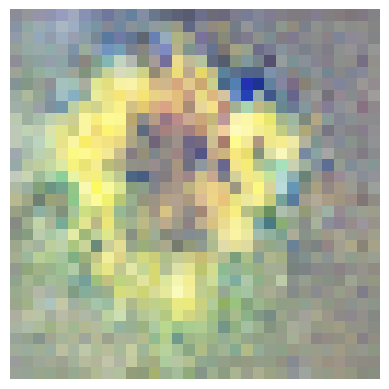

Epoch 1281/2500
Generator loss: 1.0890156030654907, Discriminator loss: 1.1399599313735962
Epoch 1282/2500
Generator loss: 1.0594613552093506, Discriminator loss: 1.2152607440948486
Epoch 1283/2500
Generator loss: 1.0697044134140015, Discriminator loss: 1.1191396713256836
Epoch 1284/2500
Generator loss: 1.1062321662902832, Discriminator loss: 1.089385747909546
Epoch 1285/2500
Generator loss: 1.0440735816955566, Discriminator loss: 1.1834144592285156
Epoch 1286/2500
Generator loss: 0.9599732756614685, Discriminator loss: 1.2482370138168335
Epoch 1287/2500
Generator loss: 1.1605855226516724, Discriminator loss: 1.0408869981765747
Epoch 1288/2500
Generator loss: 0.9793915152549744, Discriminator loss: 1.2623341083526611
Epoch 1289/2500
Generator loss: 1.1376159191131592, Discriminator loss: 1.0939574241638184
Epoch 1290/2500
Generator loss: 1.0240893363952637, Discriminator loss: 1.1701606512069702


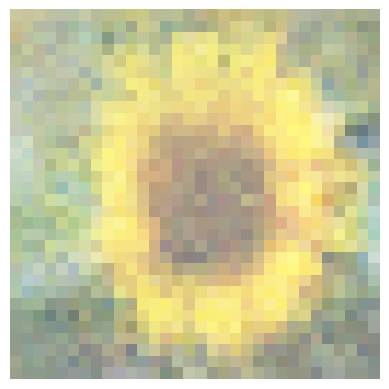

Epoch 1291/2500
Generator loss: 1.0373320579528809, Discriminator loss: 1.1515262126922607
Epoch 1292/2500
Generator loss: 0.9778689742088318, Discriminator loss: 1.1777726411819458
Epoch 1293/2500
Generator loss: 1.0363025665283203, Discriminator loss: 1.1194056272506714
Epoch 1294/2500
Generator loss: 1.0840705633163452, Discriminator loss: 1.0982669591903687
Epoch 1295/2500
Generator loss: 1.0745435953140259, Discriminator loss: 1.122851014137268
Epoch 1296/2500
Generator loss: 1.0486972332000732, Discriminator loss: 1.1162182092666626
Epoch 1297/2500
Generator loss: 0.9763551354408264, Discriminator loss: 1.2519088983535767
Epoch 1298/2500
Generator loss: 1.0543369054794312, Discriminator loss: 1.1611171960830688
Epoch 1299/2500
Generator loss: 0.9666923880577087, Discriminator loss: 1.22519052028656
Epoch 1300/2500
Generator loss: 1.1575713157653809, Discriminator loss: 1.060874342918396


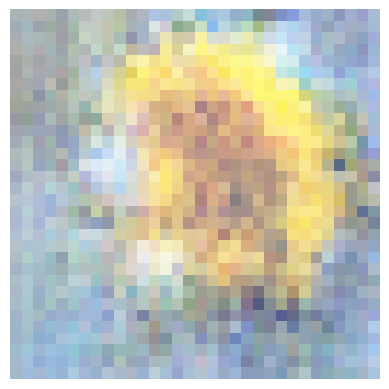

Epoch 1301/2500
Generator loss: 0.948467493057251, Discriminator loss: 1.2668626308441162
Epoch 1302/2500
Generator loss: 1.1187574863433838, Discriminator loss: 1.0182420015335083
Epoch 1303/2500
Generator loss: 1.0600640773773193, Discriminator loss: 1.15951669216156
Epoch 1304/2500
Generator loss: 1.0904221534729004, Discriminator loss: 1.1643004417419434
Epoch 1305/2500
Generator loss: 1.073862075805664, Discriminator loss: 1.099189281463623
Epoch 1306/2500
Generator loss: 0.9367592930793762, Discriminator loss: 1.2790006399154663
Epoch 1307/2500
Generator loss: 1.1152667999267578, Discriminator loss: 1.1424548625946045
Epoch 1308/2500
Generator loss: 0.9466693997383118, Discriminator loss: 1.3143101930618286
Epoch 1309/2500
Generator loss: 1.0580053329467773, Discriminator loss: 1.1214278936386108
Epoch 1310/2500
Generator loss: 1.059922695159912, Discriminator loss: 1.1644327640533447


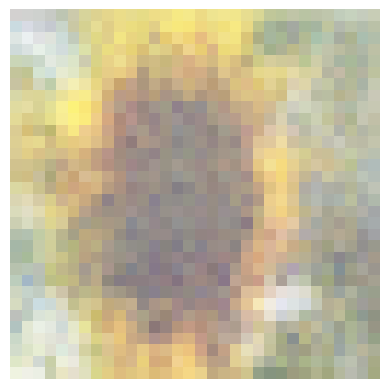

Epoch 1311/2500
Generator loss: 1.1517361402511597, Discriminator loss: 1.031501054763794
Epoch 1312/2500
Generator loss: 1.0766478776931763, Discriminator loss: 1.1723631620407104
Epoch 1313/2500
Generator loss: 1.0788065195083618, Discriminator loss: 1.141174554824829
Epoch 1314/2500
Generator loss: 1.12063467502594, Discriminator loss: 1.1437958478927612
Epoch 1315/2500
Generator loss: 1.0524033308029175, Discriminator loss: 1.2319397926330566
Epoch 1316/2500
Generator loss: 1.1261404752731323, Discriminator loss: 1.12333083152771
Epoch 1317/2500
Generator loss: 1.0340317487716675, Discriminator loss: 1.2113163471221924
Epoch 1318/2500
Generator loss: 1.2263545989990234, Discriminator loss: 0.975775420665741
Epoch 1319/2500
Generator loss: 0.98748779296875, Discriminator loss: 1.3074315786361694
Epoch 1320/2500
Generator loss: 1.156734585762024, Discriminator loss: 1.0019181966781616


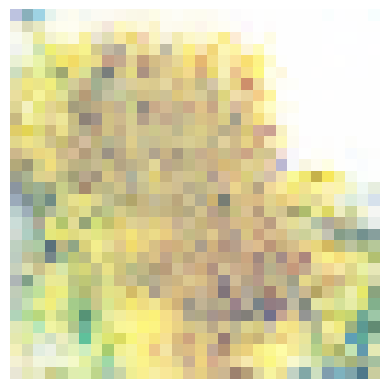

Epoch 1321/2500
Generator loss: 1.0340150594711304, Discriminator loss: 1.1757782697677612
Epoch 1322/2500
Generator loss: 1.1634886264801025, Discriminator loss: 1.0920580625534058
Epoch 1323/2500
Generator loss: 1.0991795063018799, Discriminator loss: 1.1247459650039673
Epoch 1324/2500
Generator loss: 1.0965594053268433, Discriminator loss: 1.0277996063232422
Epoch 1325/2500
Generator loss: 1.0113697052001953, Discriminator loss: 1.1608854532241821
Epoch 1326/2500
Generator loss: 1.1743850708007812, Discriminator loss: 1.1120967864990234
Epoch 1327/2500
Generator loss: 1.081397533416748, Discriminator loss: 1.182523250579834
Epoch 1328/2500
Generator loss: 1.0493454933166504, Discriminator loss: 1.1174499988555908
Epoch 1329/2500
Generator loss: 1.083282709121704, Discriminator loss: 1.1364657878875732
Epoch 1330/2500
Generator loss: 1.1179261207580566, Discriminator loss: 1.1801115274429321


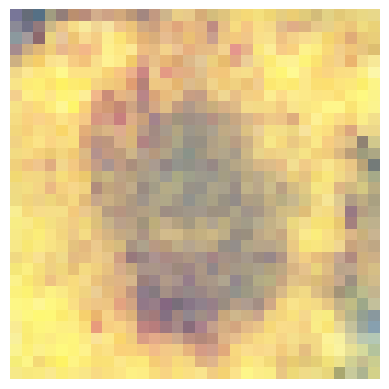

Epoch 1331/2500
Generator loss: 1.1813311576843262, Discriminator loss: 1.066496729850769
Epoch 1332/2500
Generator loss: 1.066652774810791, Discriminator loss: 1.1649186611175537
Epoch 1333/2500
Generator loss: 1.0351338386535645, Discriminator loss: 1.1691402196884155
Epoch 1334/2500
Generator loss: 1.0885416269302368, Discriminator loss: 1.1281192302703857
Epoch 1335/2500
Generator loss: 1.1417553424835205, Discriminator loss: 1.0483431816101074
Epoch 1336/2500
Generator loss: 1.0474402904510498, Discriminator loss: 1.1266013383865356
Epoch 1337/2500
Generator loss: 1.0224814414978027, Discriminator loss: 1.1824513673782349
Epoch 1338/2500
Generator loss: 1.0963493585586548, Discriminator loss: 1.0782331228256226
Epoch 1339/2500
Generator loss: 1.0533747673034668, Discriminator loss: 1.2376424074172974
Epoch 1340/2500
Generator loss: 1.1007174253463745, Discriminator loss: 1.0978853702545166


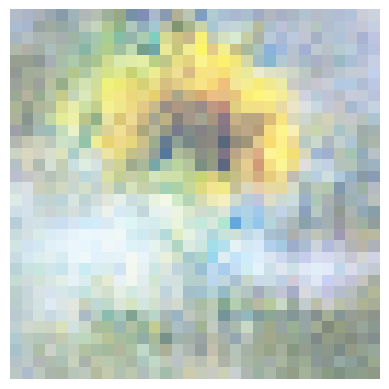

Epoch 1341/2500
Generator loss: 1.005154013633728, Discriminator loss: 1.1493282318115234
Epoch 1342/2500
Generator loss: 1.0274986028671265, Discriminator loss: 1.179534912109375
Epoch 1343/2500
Generator loss: 1.0755324363708496, Discriminator loss: 1.0707252025604248
Epoch 1344/2500
Generator loss: 1.1486670970916748, Discriminator loss: 1.126500129699707
Epoch 1345/2500
Generator loss: 1.0068151950836182, Discriminator loss: 1.192312240600586
Epoch 1346/2500
Generator loss: 1.079577088356018, Discriminator loss: 1.058130145072937
Epoch 1347/2500
Generator loss: 1.0136048793792725, Discriminator loss: 1.1618194580078125
Epoch 1348/2500
Generator loss: 1.1099828481674194, Discriminator loss: 1.1068907976150513
Epoch 1349/2500
Generator loss: 0.9972678422927856, Discriminator loss: 1.2119568586349487
Epoch 1350/2500
Generator loss: 1.1181279420852661, Discriminator loss: 1.064965844154358


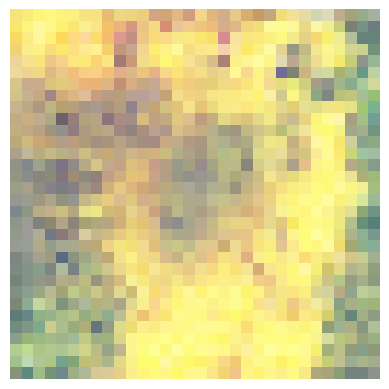

Epoch 1351/2500
Generator loss: 1.0266026258468628, Discriminator loss: 1.1250672340393066
Epoch 1352/2500
Generator loss: 1.0453464984893799, Discriminator loss: 1.120299220085144
Epoch 1353/2500
Generator loss: 1.068771243095398, Discriminator loss: 1.0920456647872925
Epoch 1354/2500
Generator loss: 1.1027650833129883, Discriminator loss: 1.0605932474136353
Epoch 1355/2500
Generator loss: 1.0463542938232422, Discriminator loss: 1.112411618232727
Epoch 1356/2500
Generator loss: 1.0136196613311768, Discriminator loss: 1.184823989868164
Epoch 1357/2500
Generator loss: 1.1274462938308716, Discriminator loss: 1.0711218118667603
Epoch 1358/2500
Generator loss: 1.04118812084198, Discriminator loss: 1.1701995134353638
Epoch 1359/2500
Generator loss: 1.0792676210403442, Discriminator loss: 1.0764660835266113
Epoch 1360/2500
Generator loss: 1.0784755945205688, Discriminator loss: 1.0981510877609253


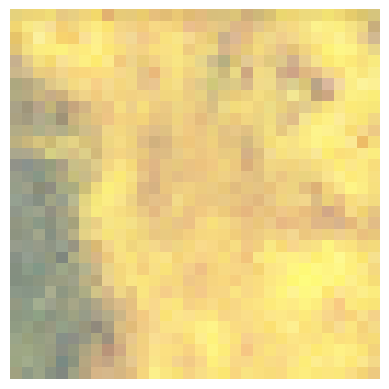

Epoch 1361/2500
Generator loss: 1.0761895179748535, Discriminator loss: 1.1788185834884644
Epoch 1362/2500
Generator loss: 1.0429048538208008, Discriminator loss: 1.1716244220733643
Epoch 1363/2500
Generator loss: 1.0154774188995361, Discriminator loss: 1.1915757656097412
Epoch 1364/2500
Generator loss: 1.0373841524124146, Discriminator loss: 1.1485893726348877
Epoch 1365/2500
Generator loss: 1.0446285009384155, Discriminator loss: 1.1441630125045776
Epoch 1366/2500
Generator loss: 0.9988359212875366, Discriminator loss: 1.1845649480819702
Epoch 1367/2500
Generator loss: 1.1322433948516846, Discriminator loss: 1.0393846035003662
Epoch 1368/2500
Generator loss: 1.0065912008285522, Discriminator loss: 1.2526202201843262
Epoch 1369/2500
Generator loss: 1.1405179500579834, Discriminator loss: 1.0626167058944702
Epoch 1370/2500
Generator loss: 1.0048295259475708, Discriminator loss: 1.2084909677505493


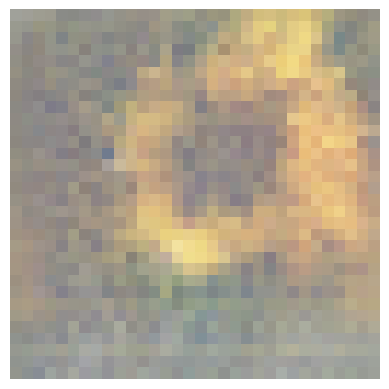

Epoch 1371/2500
Generator loss: 1.1972683668136597, Discriminator loss: 0.9866960644721985
Epoch 1372/2500
Generator loss: 1.0872821807861328, Discriminator loss: 1.0968348979949951
Epoch 1373/2500
Generator loss: 1.077271819114685, Discriminator loss: 1.1068488359451294
Epoch 1374/2500
Generator loss: 0.9934359192848206, Discriminator loss: 1.2103997468948364
Epoch 1375/2500
Generator loss: 1.079576015472412, Discriminator loss: 1.1458680629730225
Epoch 1376/2500
Generator loss: 1.054338812828064, Discriminator loss: 1.114528775215149
Epoch 1377/2500
Generator loss: 1.1005052328109741, Discriminator loss: 1.1232638359069824
Epoch 1378/2500
Generator loss: 1.158753752708435, Discriminator loss: 1.0595788955688477
Epoch 1379/2500
Generator loss: 1.0595605373382568, Discriminator loss: 1.1746244430541992
Epoch 1380/2500
Generator loss: 1.1938538551330566, Discriminator loss: 0.9783672094345093


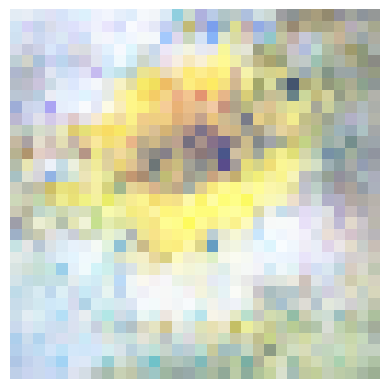

Epoch 1381/2500
Generator loss: 1.0714147090911865, Discriminator loss: 1.120734691619873
Epoch 1382/2500
Generator loss: 1.1154314279556274, Discriminator loss: 1.1466524600982666
Epoch 1383/2500
Generator loss: 1.1596488952636719, Discriminator loss: 1.0445445775985718
Epoch 1384/2500
Generator loss: 1.0115597248077393, Discriminator loss: 1.1845791339874268
Epoch 1385/2500
Generator loss: 1.1803772449493408, Discriminator loss: 1.0490665435791016
Epoch 1386/2500
Generator loss: 1.0432535409927368, Discriminator loss: 1.1446932554244995
Epoch 1387/2500
Generator loss: 1.052993655204773, Discriminator loss: 1.1921900510787964
Epoch 1388/2500
Generator loss: 1.191388726234436, Discriminator loss: 0.9985668063163757
Epoch 1389/2500
Generator loss: 1.1397103071212769, Discriminator loss: 1.1376280784606934
Epoch 1390/2500
Generator loss: 1.1356258392333984, Discriminator loss: 1.0997792482376099


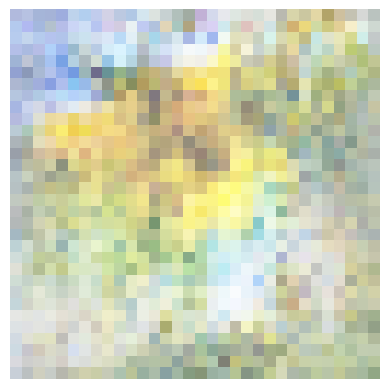

Epoch 1391/2500
Generator loss: 1.1019320487976074, Discriminator loss: 1.1029696464538574
Epoch 1392/2500
Generator loss: 1.186638593673706, Discriminator loss: 0.981319785118103
Epoch 1393/2500
Generator loss: 1.1691086292266846, Discriminator loss: 1.0232330560684204
Epoch 1394/2500
Generator loss: 1.0224790573120117, Discriminator loss: 1.1850441694259644
Epoch 1395/2500
Generator loss: 1.0628457069396973, Discriminator loss: 1.2236135005950928
Epoch 1396/2500
Generator loss: 1.136953353881836, Discriminator loss: 1.016873836517334
Epoch 1397/2500
Generator loss: 1.204661250114441, Discriminator loss: 0.9807184338569641
Epoch 1398/2500
Generator loss: 1.1256526708602905, Discriminator loss: 1.0943853855133057
Epoch 1399/2500
Generator loss: 1.1670016050338745, Discriminator loss: 1.1194331645965576
Epoch 1400/2500
Generator loss: 1.1869794130325317, Discriminator loss: 1.1063652038574219


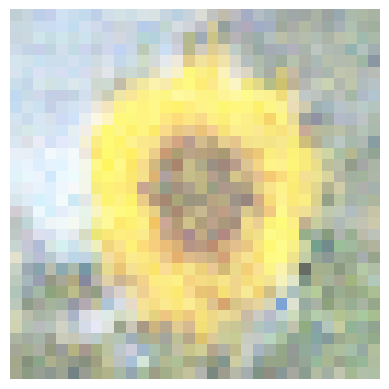

Epoch 1401/2500
Generator loss: 1.1860607862472534, Discriminator loss: 1.0572054386138916
Epoch 1402/2500
Generator loss: 1.1099716424942017, Discriminator loss: 1.123031735420227
Epoch 1403/2500
Generator loss: 1.383058786392212, Discriminator loss: 0.8767045140266418
Epoch 1404/2500
Generator loss: 1.2134567499160767, Discriminator loss: 1.0340181589126587
Epoch 1405/2500
Generator loss: 1.1707743406295776, Discriminator loss: 1.1218374967575073
Epoch 1406/2500
Generator loss: 1.0453205108642578, Discriminator loss: 1.198113203048706
Epoch 1407/2500
Generator loss: 1.2166563272476196, Discriminator loss: 1.0375584363937378
Epoch 1408/2500
Generator loss: 1.456014633178711, Discriminator loss: 0.7964606285095215
Epoch 1409/2500
Generator loss: 1.226812481880188, Discriminator loss: 1.1603971719741821
Epoch 1410/2500
Generator loss: 1.228922724723816, Discriminator loss: 1.0537632703781128


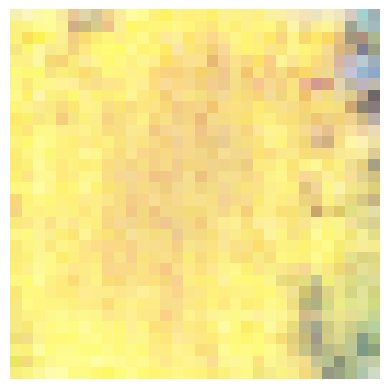

Epoch 1411/2500
Generator loss: 1.0985418558120728, Discriminator loss: 1.2382843494415283
Epoch 1412/2500
Generator loss: 1.2334526777267456, Discriminator loss: 0.9390630722045898
Epoch 1413/2500
Generator loss: 1.0971390008926392, Discriminator loss: 1.1126281023025513
Epoch 1414/2500
Generator loss: 1.2987147569656372, Discriminator loss: 0.9607406854629517
Epoch 1415/2500
Generator loss: 1.1159323453903198, Discriminator loss: 1.0956743955612183
Epoch 1416/2500
Generator loss: 1.3092856407165527, Discriminator loss: 0.9113215804100037
Epoch 1417/2500
Generator loss: 1.0690457820892334, Discriminator loss: 1.186545729637146
Epoch 1418/2500
Generator loss: 1.1240440607070923, Discriminator loss: 1.0951404571533203
Epoch 1419/2500
Generator loss: 1.0926337242126465, Discriminator loss: 1.1283150911331177
Epoch 1420/2500
Generator loss: 1.1484712362289429, Discriminator loss: 1.0264232158660889


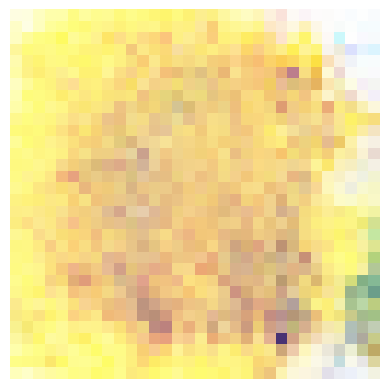

Epoch 1421/2500
Generator loss: 1.1167930364608765, Discriminator loss: 1.0477372407913208
Epoch 1422/2500
Generator loss: 1.1851673126220703, Discriminator loss: 1.026633381843567
Epoch 1423/2500
Generator loss: 0.9840434789657593, Discriminator loss: 1.1804088354110718
Epoch 1424/2500
Generator loss: 1.1177799701690674, Discriminator loss: 1.0556533336639404
Epoch 1425/2500
Generator loss: 1.0704805850982666, Discriminator loss: 1.1379693746566772
Epoch 1426/2500
Generator loss: 1.2254772186279297, Discriminator loss: 0.9775128364562988
Epoch 1427/2500
Generator loss: 1.05660080909729, Discriminator loss: 1.1670606136322021
Epoch 1428/2500
Generator loss: 1.1798686981201172, Discriminator loss: 0.998336672782898
Epoch 1429/2500
Generator loss: 1.046778917312622, Discriminator loss: 1.1734434366226196
Epoch 1430/2500
Generator loss: 1.1457009315490723, Discriminator loss: 1.0558583736419678


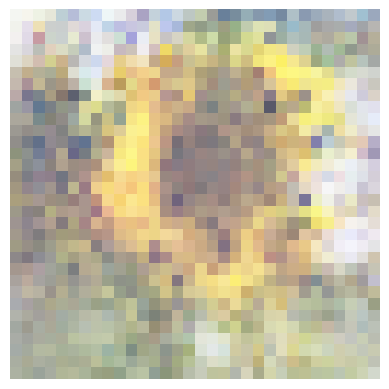

Epoch 1431/2500
Generator loss: 1.0386109352111816, Discriminator loss: 1.187494158744812
Epoch 1432/2500
Generator loss: 1.1216672658920288, Discriminator loss: 1.034261703491211
Epoch 1433/2500
Generator loss: 1.0424621105194092, Discriminator loss: 1.137777328491211
Epoch 1434/2500
Generator loss: 1.1028101444244385, Discriminator loss: 1.1092772483825684
Epoch 1435/2500
Generator loss: 1.083439588546753, Discriminator loss: 1.0872975587844849
Epoch 1436/2500
Generator loss: 1.0967994928359985, Discriminator loss: 1.0818432569503784
Epoch 1437/2500
Generator loss: 1.0771397352218628, Discriminator loss: 1.1473416090011597
Epoch 1438/2500
Generator loss: 1.136228084564209, Discriminator loss: 1.0993155241012573
Epoch 1439/2500
Generator loss: 1.0801397562026978, Discriminator loss: 1.1195021867752075
Epoch 1440/2500
Generator loss: 1.0699224472045898, Discriminator loss: 1.1256524324417114


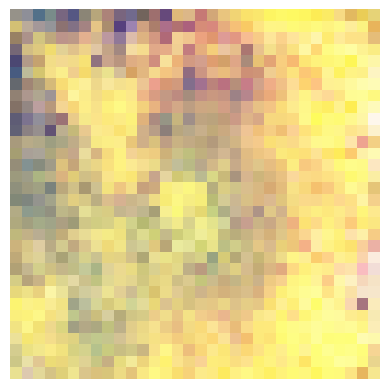

Epoch 1441/2500
Generator loss: 1.190268635749817, Discriminator loss: 1.0211522579193115
Epoch 1442/2500
Generator loss: 1.0300830602645874, Discriminator loss: 1.1606532335281372
Epoch 1443/2500
Generator loss: 1.1322602033615112, Discriminator loss: 1.0271553993225098
Epoch 1444/2500
Generator loss: 1.0490930080413818, Discriminator loss: 1.171797275543213
Epoch 1445/2500
Generator loss: 1.1419353485107422, Discriminator loss: 1.054598093032837
Epoch 1446/2500
Generator loss: 1.1150286197662354, Discriminator loss: 1.0876891613006592
Epoch 1447/2500
Generator loss: 1.0471727848052979, Discriminator loss: 1.129858374595642
Epoch 1448/2500
Generator loss: 1.1860445737838745, Discriminator loss: 1.0408525466918945
Epoch 1449/2500
Generator loss: 1.0401721000671387, Discriminator loss: 1.2310158014297485
Epoch 1450/2500
Generator loss: 1.0856311321258545, Discriminator loss: 1.0705205202102661


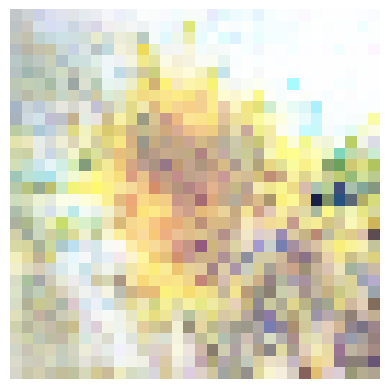

Epoch 1451/2500
Generator loss: 1.1548420190811157, Discriminator loss: 1.096285104751587
Epoch 1452/2500
Generator loss: 1.0150423049926758, Discriminator loss: 1.195029854774475
Epoch 1453/2500
Generator loss: 1.1217243671417236, Discriminator loss: 1.0230339765548706
Epoch 1454/2500
Generator loss: 1.0280462503433228, Discriminator loss: 1.1382603645324707
Epoch 1455/2500
Generator loss: 1.128013014793396, Discriminator loss: 1.1289342641830444
Epoch 1456/2500
Generator loss: 1.104761004447937, Discriminator loss: 1.1111876964569092
Epoch 1457/2500
Generator loss: 1.0472300052642822, Discriminator loss: 1.1609927415847778
Epoch 1458/2500
Generator loss: 1.161604881286621, Discriminator loss: 1.057849645614624
Epoch 1459/2500
Generator loss: 1.0677881240844727, Discriminator loss: 1.2007455825805664
Epoch 1460/2500
Generator loss: 1.1120660305023193, Discriminator loss: 1.033090353012085


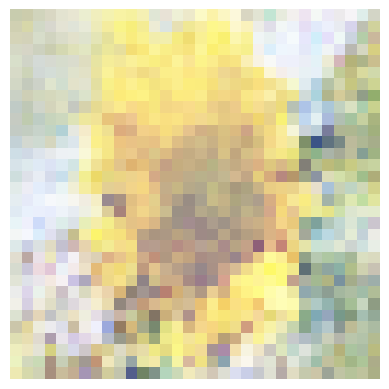

Epoch 1461/2500
Generator loss: 1.0205053091049194, Discriminator loss: 1.1630723476409912
Epoch 1462/2500
Generator loss: 1.0989763736724854, Discriminator loss: 1.1398552656173706
Epoch 1463/2500
Generator loss: 1.1381272077560425, Discriminator loss: 1.0359612703323364
Epoch 1464/2500
Generator loss: 1.0273640155792236, Discriminator loss: 1.118566632270813
Epoch 1465/2500
Generator loss: 1.1228351593017578, Discriminator loss: 1.1344693899154663
Epoch 1466/2500
Generator loss: 1.0157322883605957, Discriminator loss: 1.218808650970459
Epoch 1467/2500
Generator loss: 1.1455714702606201, Discriminator loss: 1.0017659664154053
Epoch 1468/2500
Generator loss: 1.085180401802063, Discriminator loss: 1.1260223388671875
Epoch 1469/2500
Generator loss: 1.0767563581466675, Discriminator loss: 1.18528151512146
Epoch 1470/2500
Generator loss: 1.0957189798355103, Discriminator loss: 1.1346564292907715


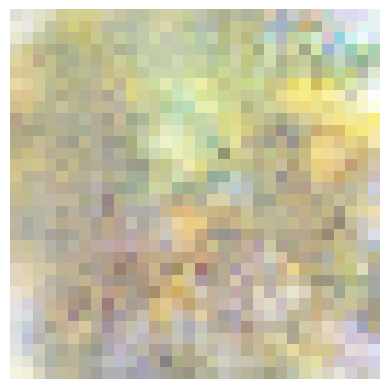

Epoch 1471/2500
Generator loss: 1.0126559734344482, Discriminator loss: 1.2192846536636353
Epoch 1472/2500
Generator loss: 1.232148289680481, Discriminator loss: 1.0747125148773193
Epoch 1473/2500
Generator loss: 1.0693891048431396, Discriminator loss: 1.1088283061981201
Epoch 1474/2500
Generator loss: 1.1395970582962036, Discriminator loss: 1.098639965057373
Epoch 1475/2500
Generator loss: 1.0722568035125732, Discriminator loss: 1.1619493961334229
Epoch 1476/2500
Generator loss: 1.0869377851486206, Discriminator loss: 1.1608136892318726
Epoch 1477/2500
Generator loss: 1.1974650621414185, Discriminator loss: 0.9853081107139587
Epoch 1478/2500
Generator loss: 1.0825858116149902, Discriminator loss: 1.1284176111221313
Epoch 1479/2500
Generator loss: 1.1797267198562622, Discriminator loss: 1.0890069007873535
Epoch 1480/2500
Generator loss: 1.1367956399917603, Discriminator loss: 1.0744988918304443


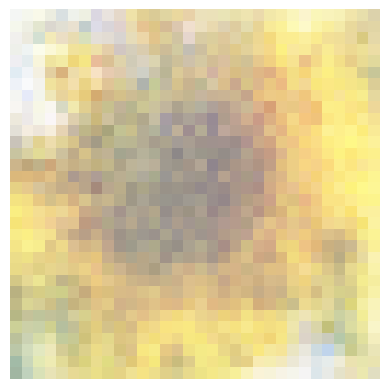

Epoch 1481/2500
Generator loss: 1.064407467842102, Discriminator loss: 1.1223139762878418
Epoch 1482/2500
Generator loss: 1.1096311807632446, Discriminator loss: 1.0781623125076294
Epoch 1483/2500
Generator loss: 1.0943156480789185, Discriminator loss: 1.1061525344848633
Epoch 1484/2500
Generator loss: 1.1676713228225708, Discriminator loss: 1.0304992198944092
Epoch 1485/2500
Generator loss: 1.0640721321105957, Discriminator loss: 1.1193517446517944
Epoch 1486/2500
Generator loss: 1.0741069316864014, Discriminator loss: 1.1407666206359863
Epoch 1487/2500
Generator loss: 1.1770731210708618, Discriminator loss: 1.0499300956726074
Epoch 1488/2500
Generator loss: 1.0217783451080322, Discriminator loss: 1.147956371307373
Epoch 1489/2500
Generator loss: 1.2971922159194946, Discriminator loss: 0.9601679444313049
Epoch 1490/2500
Generator loss: 1.0350232124328613, Discriminator loss: 1.2609786987304688


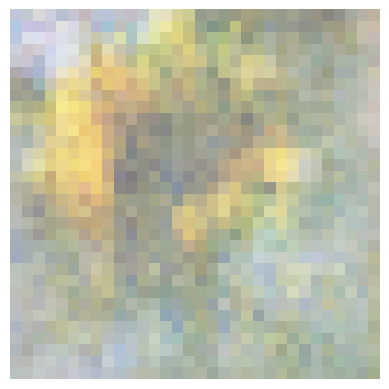

Epoch 1491/2500
Generator loss: 1.1624740362167358, Discriminator loss: 1.0027329921722412
Epoch 1492/2500
Generator loss: 1.1602129936218262, Discriminator loss: 1.046700119972229
Epoch 1493/2500
Generator loss: 1.0771992206573486, Discriminator loss: 1.1652401685714722
Epoch 1494/2500
Generator loss: 1.1668776273727417, Discriminator loss: 1.034977674484253
Epoch 1495/2500
Generator loss: 1.0798327922821045, Discriminator loss: 1.1673283576965332
Epoch 1496/2500
Generator loss: 1.2115025520324707, Discriminator loss: 1.0393667221069336
Epoch 1497/2500
Generator loss: 1.1300859451293945, Discriminator loss: 1.0803381204605103
Epoch 1498/2500
Generator loss: 1.1308305263519287, Discriminator loss: 1.1443400382995605
Epoch 1499/2500
Generator loss: 1.2313785552978516, Discriminator loss: 1.0394738912582397
Epoch 1500/2500
Generator loss: 1.1145459413528442, Discriminator loss: 1.1545552015304565


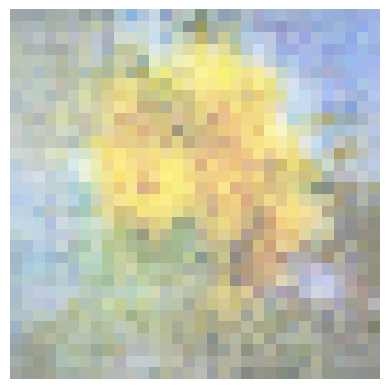

Epoch 1501/2500
Generator loss: 1.0922013521194458, Discriminator loss: 1.0810242891311646
Epoch 1502/2500
Generator loss: 1.0413312911987305, Discriminator loss: 1.1476644277572632
Epoch 1503/2500
Generator loss: 1.322980284690857, Discriminator loss: 0.9399508833885193
Epoch 1504/2500
Generator loss: 1.1433193683624268, Discriminator loss: 1.0596141815185547
Epoch 1505/2500
Generator loss: 1.1449434757232666, Discriminator loss: 1.1072807312011719
Epoch 1506/2500
Generator loss: 1.1405848264694214, Discriminator loss: 1.1169880628585815
Epoch 1507/2500
Generator loss: 1.189629077911377, Discriminator loss: 1.1752291917800903
Epoch 1508/2500
Generator loss: 1.1595757007598877, Discriminator loss: 1.0585978031158447
Epoch 1509/2500
Generator loss: 1.0756559371948242, Discriminator loss: 1.0820006132125854
Epoch 1510/2500
Generator loss: 1.1503595113754272, Discriminator loss: 1.0451356172561646


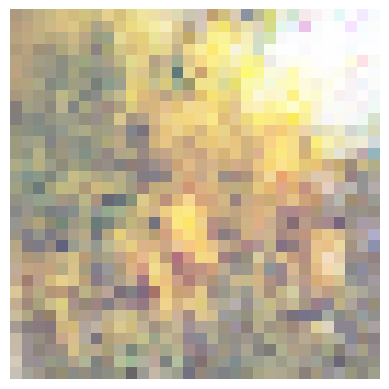

Epoch 1511/2500
Generator loss: 1.1825100183486938, Discriminator loss: 1.070862054824829
Epoch 1512/2500
Generator loss: 1.042702078819275, Discriminator loss: 1.1312233209609985
Epoch 1513/2500
Generator loss: 1.0990710258483887, Discriminator loss: 1.1343263387680054
Epoch 1514/2500
Generator loss: 1.2584502696990967, Discriminator loss: 0.9566898941993713
Epoch 1515/2500
Generator loss: 0.9550145268440247, Discriminator loss: 1.257475733757019
Epoch 1516/2500
Generator loss: 1.23275625705719, Discriminator loss: 0.9643686413764954
Epoch 1517/2500
Generator loss: 1.06330144405365, Discriminator loss: 1.1253087520599365
Epoch 1518/2500
Generator loss: 1.166660189628601, Discriminator loss: 1.10244882106781
Epoch 1519/2500
Generator loss: 1.0982000827789307, Discriminator loss: 1.0913245677947998
Epoch 1520/2500
Generator loss: 1.1251121759414673, Discriminator loss: 1.0887770652770996


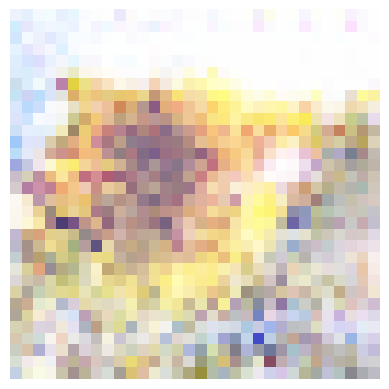

Epoch 1521/2500
Generator loss: 1.127834677696228, Discriminator loss: 1.0856419801712036
Epoch 1522/2500
Generator loss: 1.06458580493927, Discriminator loss: 1.188621997833252
Epoch 1523/2500
Generator loss: 1.1436489820480347, Discriminator loss: 0.995672881603241
Epoch 1524/2500
Generator loss: 1.1136387586593628, Discriminator loss: 1.1185704469680786
Epoch 1525/2500
Generator loss: 1.2611593008041382, Discriminator loss: 0.9781337976455688
Epoch 1526/2500
Generator loss: 1.0768530368804932, Discriminator loss: 1.1701958179473877
Epoch 1527/2500
Generator loss: 1.2252987623214722, Discriminator loss: 0.9611843228340149
Epoch 1528/2500
Generator loss: 1.0618045330047607, Discriminator loss: 1.188551664352417
Epoch 1529/2500
Generator loss: 1.0989187955856323, Discriminator loss: 1.0770305395126343
Epoch 1530/2500
Generator loss: 1.1020601987838745, Discriminator loss: 1.1077100038528442


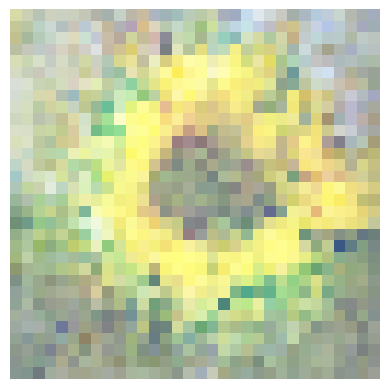

Epoch 1531/2500
Generator loss: 1.0610837936401367, Discriminator loss: 1.1197443008422852
Epoch 1532/2500
Generator loss: 1.1678439378738403, Discriminator loss: 1.172429084777832
Epoch 1533/2500
Generator loss: 1.1175776720046997, Discriminator loss: 1.1750812530517578
Epoch 1534/2500
Generator loss: 1.0895174741744995, Discriminator loss: 1.060091495513916
Epoch 1535/2500
Generator loss: 0.9995865225791931, Discriminator loss: 1.209693431854248
Epoch 1536/2500
Generator loss: 1.0864380598068237, Discriminator loss: 1.1133671998977661
Epoch 1537/2500
Generator loss: 1.0298032760620117, Discriminator loss: 1.1410893201828003
Epoch 1538/2500
Generator loss: 1.173685073852539, Discriminator loss: 1.0147873163223267
Epoch 1539/2500
Generator loss: 1.0288928747177124, Discriminator loss: 1.1787350177764893
Epoch 1540/2500
Generator loss: 1.1225577592849731, Discriminator loss: 1.0910896062850952


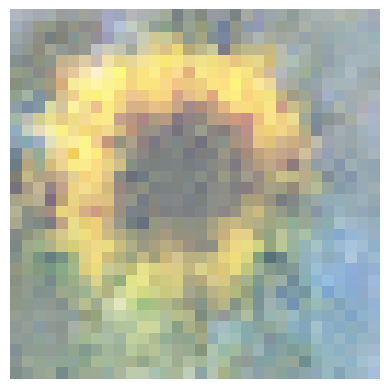

Epoch 1541/2500
Generator loss: 1.1127930879592896, Discriminator loss: 1.134656548500061
Epoch 1542/2500
Generator loss: 1.0666673183441162, Discriminator loss: 1.1099050045013428
Epoch 1543/2500
Generator loss: 1.1011759042739868, Discriminator loss: 1.1116516590118408
Epoch 1544/2500
Generator loss: 1.0314569473266602, Discriminator loss: 1.2418509721755981
Epoch 1545/2500
Generator loss: 1.1408358812332153, Discriminator loss: 1.0398871898651123
Epoch 1546/2500
Generator loss: 1.0082486867904663, Discriminator loss: 1.1876870393753052
Epoch 1547/2500
Generator loss: 1.1834588050842285, Discriminator loss: 1.1215440034866333
Epoch 1548/2500
Generator loss: 1.0395503044128418, Discriminator loss: 1.1562812328338623
Epoch 1549/2500
Generator loss: 1.136561393737793, Discriminator loss: 1.0725138187408447
Epoch 1550/2500
Generator loss: 1.1974214315414429, Discriminator loss: 1.0053236484527588


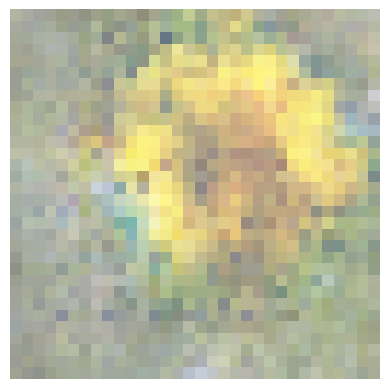

Epoch 1551/2500
Generator loss: 1.1163617372512817, Discriminator loss: 1.13792085647583
Epoch 1552/2500
Generator loss: 1.1208258867263794, Discriminator loss: 1.0735150575637817
Epoch 1553/2500
Generator loss: 1.0125212669372559, Discriminator loss: 1.2024890184402466
Epoch 1554/2500
Generator loss: 1.0542017221450806, Discriminator loss: 1.1523146629333496
Epoch 1555/2500
Generator loss: 1.1493353843688965, Discriminator loss: 1.0098114013671875
Epoch 1556/2500
Generator loss: 1.0889350175857544, Discriminator loss: 1.158571481704712
Epoch 1557/2500
Generator loss: 1.1018059253692627, Discriminator loss: 1.167034387588501
Epoch 1558/2500
Generator loss: 1.0922932624816895, Discriminator loss: 1.2076236009597778
Epoch 1559/2500
Generator loss: 1.081425428390503, Discriminator loss: 1.1077021360397339
Epoch 1560/2500
Generator loss: 1.1793389320373535, Discriminator loss: 1.0253262519836426


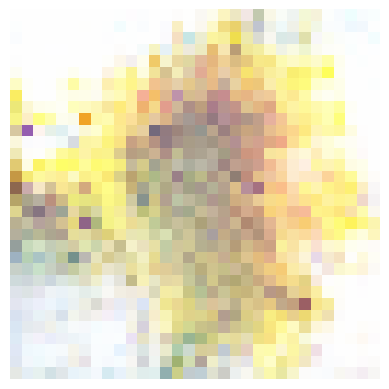

Epoch 1561/2500
Generator loss: 1.058127522468567, Discriminator loss: 1.235809087753296
Epoch 1562/2500
Generator loss: 1.0942516326904297, Discriminator loss: 1.094649076461792
Epoch 1563/2500
Generator loss: 1.064221739768982, Discriminator loss: 1.1714781522750854
Epoch 1564/2500
Generator loss: 1.1174676418304443, Discriminator loss: 1.1164401769638062
Epoch 1565/2500
Generator loss: 1.0971919298171997, Discriminator loss: 1.0716313123703003
Epoch 1566/2500
Generator loss: 1.0420031547546387, Discriminator loss: 1.1397969722747803
Epoch 1567/2500
Generator loss: 1.1002167463302612, Discriminator loss: 1.1821991205215454
Epoch 1568/2500
Generator loss: 1.2131084203720093, Discriminator loss: 0.9778391718864441
Epoch 1569/2500
Generator loss: 1.0598421096801758, Discriminator loss: 1.1460621356964111
Epoch 1570/2500
Generator loss: 1.1058870553970337, Discriminator loss: 1.1111866235733032


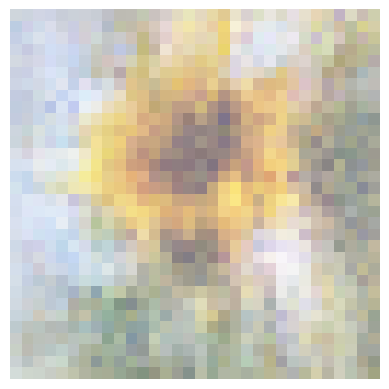

Epoch 1571/2500
Generator loss: 1.1175096035003662, Discriminator loss: 1.1275634765625
Epoch 1572/2500
Generator loss: 1.0060818195343018, Discriminator loss: 1.1871633529663086
Epoch 1573/2500
Generator loss: 1.1279833316802979, Discriminator loss: 1.1166154146194458
Epoch 1574/2500
Generator loss: 1.0861073732376099, Discriminator loss: 1.1237988471984863
Epoch 1575/2500
Generator loss: 1.053633451461792, Discriminator loss: 1.128170371055603
Epoch 1576/2500
Generator loss: 1.188262939453125, Discriminator loss: 1.0673365592956543
Epoch 1577/2500
Generator loss: 1.1378166675567627, Discriminator loss: 1.0742069482803345
Epoch 1578/2500
Generator loss: 1.0373263359069824, Discriminator loss: 1.199557900428772
Epoch 1579/2500
Generator loss: 1.2300617694854736, Discriminator loss: 0.9911274909973145
Epoch 1580/2500
Generator loss: 1.0847766399383545, Discriminator loss: 1.1209192276000977


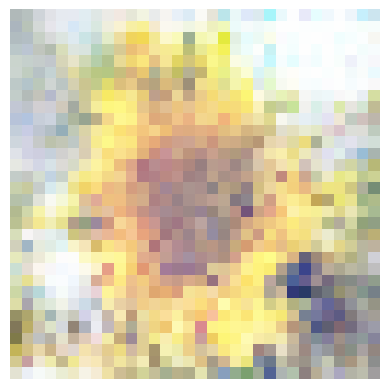

Epoch 1581/2500
Generator loss: 1.062580943107605, Discriminator loss: 1.1946098804473877
Epoch 1582/2500
Generator loss: 1.1923669576644897, Discriminator loss: 0.9614625573158264
Epoch 1583/2500
Generator loss: 1.06169855594635, Discriminator loss: 1.1925339698791504
Epoch 1584/2500
Generator loss: 1.1192216873168945, Discriminator loss: 1.1276613473892212
Epoch 1585/2500
Generator loss: 1.2097551822662354, Discriminator loss: 0.9980829358100891
Epoch 1586/2500
Generator loss: 1.0762542486190796, Discriminator loss: 1.1985305547714233
Epoch 1587/2500
Generator loss: 1.2249687910079956, Discriminator loss: 0.9708248376846313
Epoch 1588/2500
Generator loss: 1.1540733575820923, Discriminator loss: 1.0324857234954834
Epoch 1589/2500
Generator loss: 1.1128114461898804, Discriminator loss: 1.2101874351501465
Epoch 1590/2500
Generator loss: 1.1878321170806885, Discriminator loss: 1.061872959136963


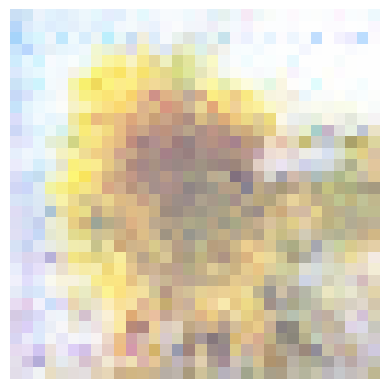

Epoch 1591/2500
Generator loss: 1.0089240074157715, Discriminator loss: 1.1829197406768799
Epoch 1592/2500
Generator loss: 1.130306601524353, Discriminator loss: 1.1047286987304688
Epoch 1593/2500
Generator loss: 1.2524962425231934, Discriminator loss: 0.9760026931762695
Epoch 1594/2500
Generator loss: 1.2052290439605713, Discriminator loss: 1.066786289215088
Epoch 1595/2500
Generator loss: 1.0768110752105713, Discriminator loss: 1.222909927368164
Epoch 1596/2500
Generator loss: 1.158908486366272, Discriminator loss: 1.0522500276565552
Epoch 1597/2500
Generator loss: 1.1676212549209595, Discriminator loss: 1.028325080871582
Epoch 1598/2500
Generator loss: 1.0341744422912598, Discriminator loss: 1.145573377609253
Epoch 1599/2500
Generator loss: 1.1923691034317017, Discriminator loss: 1.032867670059204
Epoch 1600/2500
Generator loss: 1.205273151397705, Discriminator loss: 1.0880383253097534


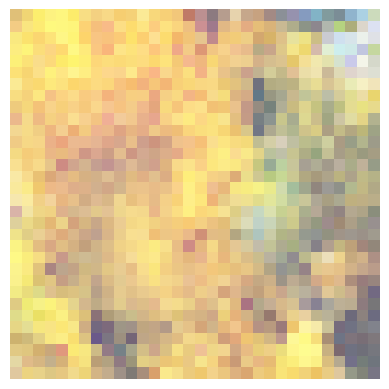

Epoch 1601/2500
Generator loss: 1.1618764400482178, Discriminator loss: 1.0963765382766724
Epoch 1602/2500
Generator loss: 1.2157785892486572, Discriminator loss: 1.0053602457046509
Epoch 1603/2500
Generator loss: 1.051201581954956, Discriminator loss: 1.188019037246704
Epoch 1604/2500
Generator loss: 1.1458121538162231, Discriminator loss: 1.0588701963424683
Epoch 1605/2500
Generator loss: 1.0655359029769897, Discriminator loss: 1.1463303565979004
Epoch 1606/2500
Generator loss: 1.2345622777938843, Discriminator loss: 0.9648949503898621
Epoch 1607/2500
Generator loss: 1.1277828216552734, Discriminator loss: 1.0901933908462524
Epoch 1608/2500
Generator loss: 1.158286213874817, Discriminator loss: 1.0618934631347656
Epoch 1609/2500
Generator loss: 1.038291096687317, Discriminator loss: 1.1710368394851685
Epoch 1610/2500
Generator loss: 1.1913983821868896, Discriminator loss: 1.0470207929611206


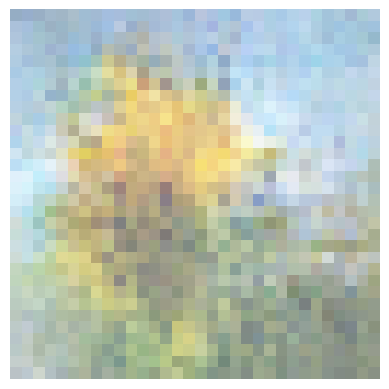

Epoch 1611/2500
Generator loss: 1.1527186632156372, Discriminator loss: 1.0047577619552612
Epoch 1612/2500
Generator loss: 1.0736647844314575, Discriminator loss: 1.128318190574646
Epoch 1613/2500
Generator loss: 1.1521984338760376, Discriminator loss: 1.039879560470581
Epoch 1614/2500
Generator loss: 1.1239389181137085, Discriminator loss: 1.1199499368667603
Epoch 1615/2500
Generator loss: 1.1186120510101318, Discriminator loss: 1.0722827911376953
Epoch 1616/2500
Generator loss: 1.1166554689407349, Discriminator loss: 1.168353796005249
Epoch 1617/2500
Generator loss: 1.1841121912002563, Discriminator loss: 1.024003505706787
Epoch 1618/2500
Generator loss: 1.131042718887329, Discriminator loss: 1.143697738647461
Epoch 1619/2500
Generator loss: 1.0312418937683105, Discriminator loss: 1.1800695657730103
Epoch 1620/2500
Generator loss: 1.2067818641662598, Discriminator loss: 0.9822080135345459


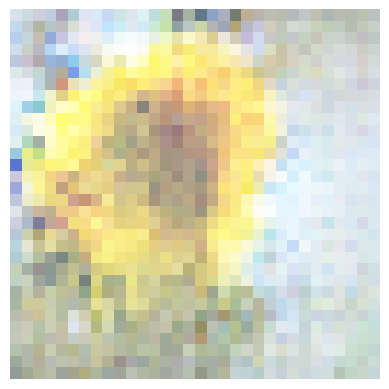

Epoch 1621/2500
Generator loss: 1.0834208726882935, Discriminator loss: 1.1152265071868896
Epoch 1622/2500
Generator loss: 1.15469491481781, Discriminator loss: 1.0880639553070068
Epoch 1623/2500
Generator loss: 1.1201465129852295, Discriminator loss: 1.1880747079849243
Epoch 1624/2500
Generator loss: 1.1316158771514893, Discriminator loss: 1.0631414651870728
Epoch 1625/2500
Generator loss: 1.125961422920227, Discriminator loss: 1.0826716423034668
Epoch 1626/2500
Generator loss: 1.0423415899276733, Discriminator loss: 1.1484699249267578
Epoch 1627/2500
Generator loss: 1.1526639461517334, Discriminator loss: 1.0095468759536743
Epoch 1628/2500
Generator loss: 1.1370643377304077, Discriminator loss: 1.1791388988494873
Epoch 1629/2500
Generator loss: 1.1590182781219482, Discriminator loss: 1.0192419290542603
Epoch 1630/2500
Generator loss: 1.017182469367981, Discriminator loss: 1.1954548358917236


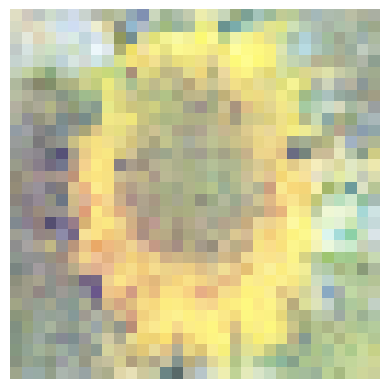

Epoch 1631/2500
Generator loss: 1.0891107320785522, Discriminator loss: 1.0983160734176636
Epoch 1632/2500
Generator loss: 1.1166073083877563, Discriminator loss: 1.1102405786514282
Epoch 1633/2500
Generator loss: 1.1169885396957397, Discriminator loss: 1.0785236358642578
Epoch 1634/2500
Generator loss: 1.1565080881118774, Discriminator loss: 1.0618617534637451
Epoch 1635/2500
Generator loss: 1.0256597995758057, Discriminator loss: 1.151076078414917
Epoch 1636/2500
Generator loss: 1.1395095586776733, Discriminator loss: 1.1114904880523682
Epoch 1637/2500
Generator loss: 1.124410629272461, Discriminator loss: 1.1116503477096558
Epoch 1638/2500
Generator loss: 1.0959690809249878, Discriminator loss: 1.0926570892333984
Epoch 1639/2500
Generator loss: 1.1043400764465332, Discriminator loss: 1.100356936454773
Epoch 1640/2500
Generator loss: 1.0547332763671875, Discriminator loss: 1.209391713142395


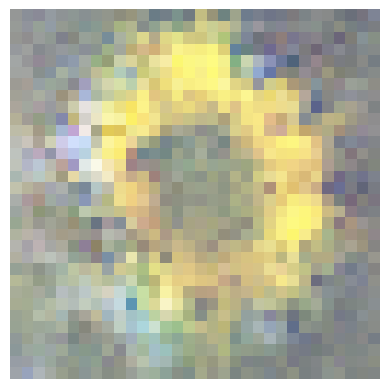

Epoch 1641/2500
Generator loss: 1.147759199142456, Discriminator loss: 1.0752888917922974
Epoch 1642/2500
Generator loss: 1.1468641757965088, Discriminator loss: 1.1163896322250366
Epoch 1643/2500
Generator loss: 1.0865811109542847, Discriminator loss: 1.1319559812545776
Epoch 1644/2500
Generator loss: 1.1430096626281738, Discriminator loss: 1.0777558088302612
Epoch 1645/2500
Generator loss: 1.0593730211257935, Discriminator loss: 1.2304142713546753
Epoch 1646/2500
Generator loss: 1.0952599048614502, Discriminator loss: 1.1376898288726807
Epoch 1647/2500
Generator loss: 1.1019563674926758, Discriminator loss: 1.0881962776184082
Epoch 1648/2500
Generator loss: 1.0567396879196167, Discriminator loss: 1.143105387687683
Epoch 1649/2500
Generator loss: 1.085010051727295, Discriminator loss: 1.0880967378616333
Epoch 1650/2500
Generator loss: 1.0779441595077515, Discriminator loss: 1.1073787212371826


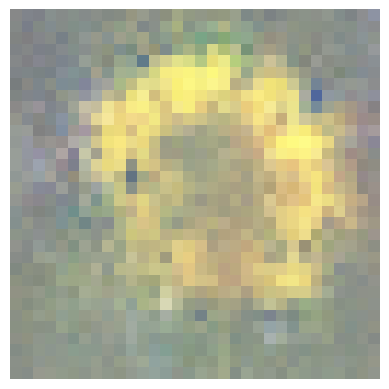

Epoch 1651/2500
Generator loss: 1.0658960342407227, Discriminator loss: 1.1077288389205933
Epoch 1652/2500
Generator loss: 1.0655266046524048, Discriminator loss: 1.127720594406128
Epoch 1653/2500
Generator loss: 1.011434555053711, Discriminator loss: 1.192251205444336
Epoch 1654/2500
Generator loss: 1.188937783241272, Discriminator loss: 1.0211260318756104
Epoch 1655/2500
Generator loss: 1.1285616159439087, Discriminator loss: 1.1278419494628906
Epoch 1656/2500
Generator loss: 1.039693832397461, Discriminator loss: 1.2001060247421265
Epoch 1657/2500
Generator loss: 1.1546573638916016, Discriminator loss: 1.07848060131073
Epoch 1658/2500
Generator loss: 1.1109129190444946, Discriminator loss: 1.148655891418457
Epoch 1659/2500
Generator loss: 1.0953961610794067, Discriminator loss: 1.1439199447631836
Epoch 1660/2500
Generator loss: 1.157250165939331, Discriminator loss: 1.0928088426589966


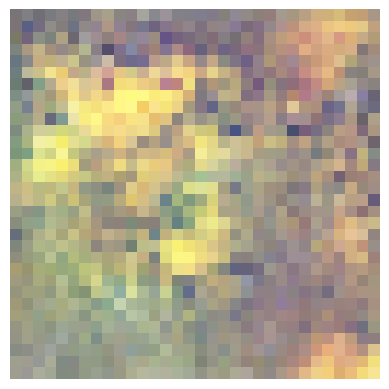

Epoch 1661/2500
Generator loss: 1.0880398750305176, Discriminator loss: 1.1420361995697021
Epoch 1662/2500
Generator loss: 1.0192770957946777, Discriminator loss: 1.177673101425171
Epoch 1663/2500
Generator loss: 1.1181777715682983, Discriminator loss: 1.0516997575759888
Epoch 1664/2500
Generator loss: 1.0636829137802124, Discriminator loss: 1.170637607574463
Epoch 1665/2500
Generator loss: 1.0994267463684082, Discriminator loss: 1.0832265615463257
Epoch 1666/2500
Generator loss: 1.1567593812942505, Discriminator loss: 1.0634760856628418
Epoch 1667/2500
Generator loss: 1.0859661102294922, Discriminator loss: 1.162381649017334
Epoch 1668/2500
Generator loss: 1.1091810464859009, Discriminator loss: 1.0967646837234497
Epoch 1669/2500
Generator loss: 1.0999681949615479, Discriminator loss: 1.1327815055847168
Epoch 1670/2500
Generator loss: 1.0391229391098022, Discriminator loss: 1.2508960962295532


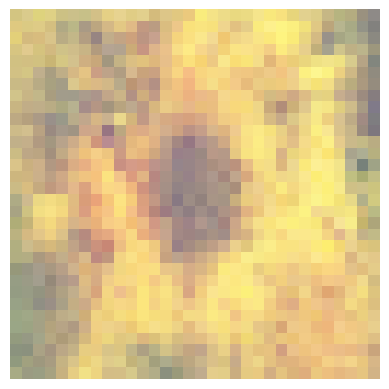

Epoch 1671/2500
Generator loss: 1.108554720878601, Discriminator loss: 1.092813491821289
Epoch 1672/2500
Generator loss: 1.1167328357696533, Discriminator loss: 1.0563079118728638
Epoch 1673/2500
Generator loss: 1.1209895610809326, Discriminator loss: 1.126045823097229
Epoch 1674/2500
Generator loss: 1.0618187189102173, Discriminator loss: 1.1175037622451782
Epoch 1675/2500
Generator loss: 1.1297484636306763, Discriminator loss: 1.1079307794570923
Epoch 1676/2500
Generator loss: 1.0870170593261719, Discriminator loss: 1.1753231287002563
Epoch 1677/2500
Generator loss: 1.1120009422302246, Discriminator loss: 1.0753822326660156
Epoch 1678/2500
Generator loss: 1.057538390159607, Discriminator loss: 1.1602586507797241
Epoch 1679/2500
Generator loss: 1.071427822113037, Discriminator loss: 1.1419099569320679
Epoch 1680/2500
Generator loss: 1.1091036796569824, Discriminator loss: 1.0460625886917114


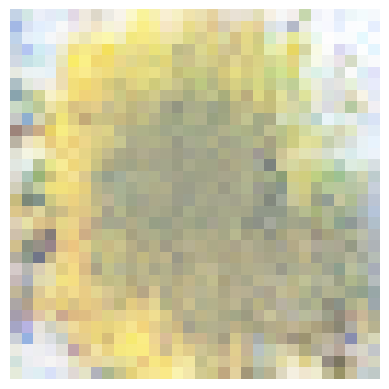

Epoch 1681/2500
Generator loss: 1.068665862083435, Discriminator loss: 1.1221200227737427
Epoch 1682/2500
Generator loss: 1.1562976837158203, Discriminator loss: 1.0477451086044312
Epoch 1683/2500
Generator loss: 1.142661213874817, Discriminator loss: 1.120732307434082
Epoch 1684/2500
Generator loss: 1.1025084257125854, Discriminator loss: 1.1314427852630615
Epoch 1685/2500
Generator loss: 1.0977733135223389, Discriminator loss: 1.1388319730758667
Epoch 1686/2500
Generator loss: 1.099747896194458, Discriminator loss: 1.1378957033157349
Epoch 1687/2500
Generator loss: 1.1109713315963745, Discriminator loss: 1.1175721883773804
Epoch 1688/2500
Generator loss: 1.131065845489502, Discriminator loss: 1.0986313819885254
Epoch 1689/2500
Generator loss: 1.178731918334961, Discriminator loss: 1.025445580482483
Epoch 1690/2500
Generator loss: 1.0113334655761719, Discriminator loss: 1.2058651447296143


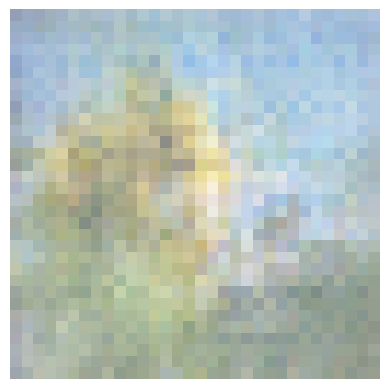

Epoch 1691/2500
Generator loss: 1.100936770439148, Discriminator loss: 1.0896844863891602
Epoch 1692/2500
Generator loss: 1.1678801774978638, Discriminator loss: 1.009994387626648
Epoch 1693/2500
Generator loss: 1.033400297164917, Discriminator loss: 1.1401174068450928
Epoch 1694/2500
Generator loss: 1.108730673789978, Discriminator loss: 1.1332727670669556
Epoch 1695/2500
Generator loss: 1.1501822471618652, Discriminator loss: 1.0332661867141724
Epoch 1696/2500
Generator loss: 1.079614281654358, Discriminator loss: 1.1182191371917725
Epoch 1697/2500
Generator loss: 1.127842664718628, Discriminator loss: 1.1180790662765503
Epoch 1698/2500
Generator loss: 1.0588380098342896, Discriminator loss: 1.1244522333145142
Epoch 1699/2500
Generator loss: 1.1142539978027344, Discriminator loss: 1.07518470287323
Epoch 1700/2500
Generator loss: 1.1329340934753418, Discriminator loss: 1.0804795026779175


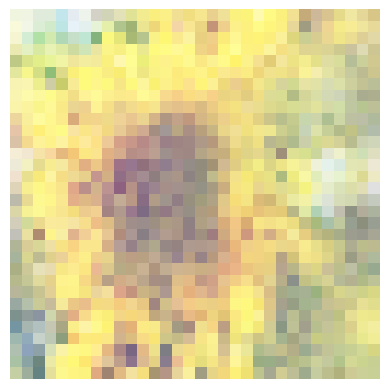

Epoch 1701/2500
Generator loss: 1.1078803539276123, Discriminator loss: 1.1269229650497437
Epoch 1702/2500
Generator loss: 1.1570008993148804, Discriminator loss: 1.0443905591964722
Epoch 1703/2500
Generator loss: 1.0641363859176636, Discriminator loss: 1.1851497888565063
Epoch 1704/2500
Generator loss: 1.0615497827529907, Discriminator loss: 1.1488065719604492
Epoch 1705/2500
Generator loss: 1.184831142425537, Discriminator loss: 1.045897126197815
Epoch 1706/2500
Generator loss: 1.0937639474868774, Discriminator loss: 1.1676661968231201
Epoch 1707/2500
Generator loss: 1.0840210914611816, Discriminator loss: 1.115416169166565
Epoch 1708/2500
Generator loss: 1.1854655742645264, Discriminator loss: 1.0333095788955688
Epoch 1709/2500
Generator loss: 1.0698347091674805, Discriminator loss: 1.1453293561935425
Epoch 1710/2500
Generator loss: 1.1297664642333984, Discriminator loss: 1.0665758848190308


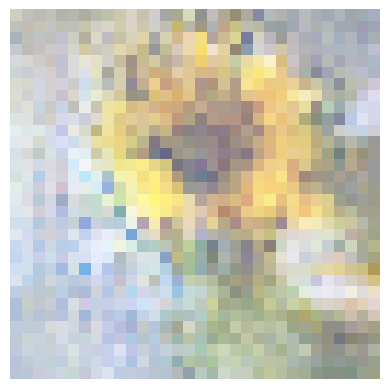

Epoch 1711/2500
Generator loss: 1.095758080482483, Discriminator loss: 1.0843147039413452
Epoch 1712/2500
Generator loss: 1.1060497760772705, Discriminator loss: 1.1128596067428589
Epoch 1713/2500
Generator loss: 1.1250170469284058, Discriminator loss: 1.1190773248672485
Epoch 1714/2500
Generator loss: 1.1740705966949463, Discriminator loss: 1.0338728427886963
Epoch 1715/2500
Generator loss: 1.0621905326843262, Discriminator loss: 1.1887799501419067
Epoch 1716/2500
Generator loss: 1.1577892303466797, Discriminator loss: 1.017064094543457
Epoch 1717/2500
Generator loss: 1.1570576429367065, Discriminator loss: 1.0424679517745972
Epoch 1718/2500
Generator loss: 1.0870705842971802, Discriminator loss: 1.156565546989441
Epoch 1719/2500
Generator loss: 1.2748478651046753, Discriminator loss: 0.9843538403511047
Epoch 1720/2500
Generator loss: 1.1038525104522705, Discriminator loss: 1.0865533351898193


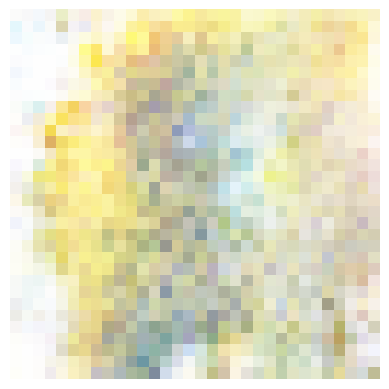

Epoch 1721/2500
Generator loss: 1.1904314756393433, Discriminator loss: 1.0657161474227905
Epoch 1722/2500
Generator loss: 1.178359866142273, Discriminator loss: 1.037405014038086
Epoch 1723/2500
Generator loss: 1.121011734008789, Discriminator loss: 1.13197660446167
Epoch 1724/2500
Generator loss: 1.160973310470581, Discriminator loss: 1.0593334436416626
Epoch 1725/2500
Generator loss: 1.2087064981460571, Discriminator loss: 1.0743341445922852
Epoch 1726/2500
Generator loss: 1.1581629514694214, Discriminator loss: 1.1268320083618164
Epoch 1727/2500
Generator loss: 1.2451846599578857, Discriminator loss: 1.0090529918670654
Epoch 1728/2500
Generator loss: 1.319135308265686, Discriminator loss: 1.0853867530822754
Epoch 1729/2500
Generator loss: 1.2281322479248047, Discriminator loss: 1.0600563287734985
Epoch 1730/2500
Generator loss: 1.188447117805481, Discriminator loss: 1.0907933712005615


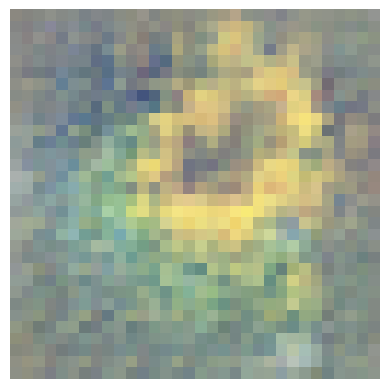

Epoch 1731/2500
Generator loss: 1.2125643491744995, Discriminator loss: 1.0261425971984863
Epoch 1732/2500
Generator loss: 1.193200707435608, Discriminator loss: 1.1277109384536743
Epoch 1733/2500
Generator loss: 1.1681443452835083, Discriminator loss: 0.9939747452735901
Epoch 1734/2500
Generator loss: 1.152767539024353, Discriminator loss: 1.106917142868042
Epoch 1735/2500
Generator loss: 1.258219599723816, Discriminator loss: 0.9795151948928833
Epoch 1736/2500
Generator loss: 1.2720301151275635, Discriminator loss: 1.0260405540466309
Epoch 1737/2500
Generator loss: 1.2392644882202148, Discriminator loss: 1.103304147720337
Epoch 1738/2500
Generator loss: 1.1647922992706299, Discriminator loss: 1.1729856729507446
Epoch 1739/2500
Generator loss: 1.1829562187194824, Discriminator loss: 1.0425368547439575
Epoch 1740/2500
Generator loss: 1.0994555950164795, Discriminator loss: 1.1200991868972778


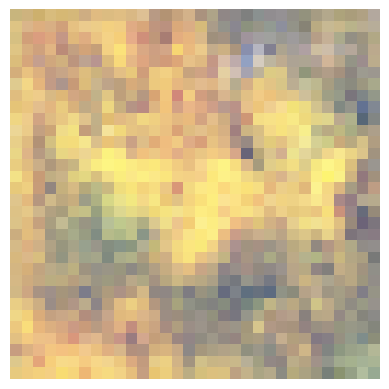

Epoch 1741/2500
Generator loss: 1.151249885559082, Discriminator loss: 1.0994431972503662
Epoch 1742/2500
Generator loss: 1.2631653547286987, Discriminator loss: 0.966110348701477
Epoch 1743/2500
Generator loss: 1.03933846950531, Discriminator loss: 1.2064939737319946
Epoch 1744/2500
Generator loss: 1.1246144771575928, Discriminator loss: 1.1092112064361572
Epoch 1745/2500
Generator loss: 1.2006160020828247, Discriminator loss: 1.0068087577819824
Epoch 1746/2500
Generator loss: 1.172892451286316, Discriminator loss: 1.0257352590560913
Epoch 1747/2500
Generator loss: 1.1215155124664307, Discriminator loss: 1.1040830612182617
Epoch 1748/2500
Generator loss: 1.157994031906128, Discriminator loss: 1.1125102043151855
Epoch 1749/2500
Generator loss: 1.1670464277267456, Discriminator loss: 1.0426709651947021
Epoch 1750/2500
Generator loss: 1.080924391746521, Discriminator loss: 1.1055926084518433


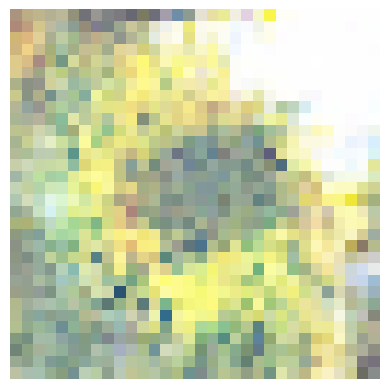

Epoch 1751/2500
Generator loss: 1.1801332235336304, Discriminator loss: 1.0187262296676636
Epoch 1752/2500
Generator loss: 1.0761433839797974, Discriminator loss: 1.1242165565490723
Epoch 1753/2500
Generator loss: 1.135503888130188, Discriminator loss: 1.128981351852417
Epoch 1754/2500
Generator loss: 1.1721595525741577, Discriminator loss: 1.0924406051635742
Epoch 1755/2500
Generator loss: 1.078352451324463, Discriminator loss: 1.1586928367614746
Epoch 1756/2500
Generator loss: 1.0939216613769531, Discriminator loss: 1.0753955841064453
Epoch 1757/2500
Generator loss: 1.088058352470398, Discriminator loss: 1.1003336906433105
Epoch 1758/2500
Generator loss: 1.1014618873596191, Discriminator loss: 1.0875474214553833
Epoch 1759/2500
Generator loss: 1.1201653480529785, Discriminator loss: 1.0915305614471436
Epoch 1760/2500
Generator loss: 1.0791964530944824, Discriminator loss: 1.1353955268859863


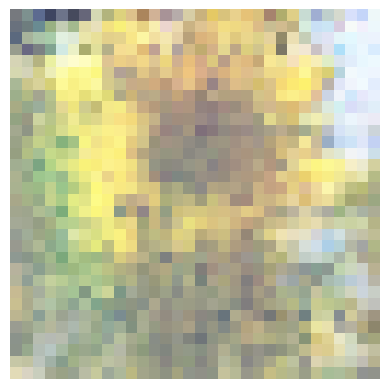

Epoch 1761/2500
Generator loss: 1.0925166606903076, Discriminator loss: 1.0992783308029175
Epoch 1762/2500
Generator loss: 1.05791437625885, Discriminator loss: 1.2066810131072998
Epoch 1763/2500
Generator loss: 1.1180353164672852, Discriminator loss: 1.0762511491775513
Epoch 1764/2500
Generator loss: 1.1262786388397217, Discriminator loss: 1.0557001829147339
Epoch 1765/2500
Generator loss: 1.0982513427734375, Discriminator loss: 1.1220533847808838
Epoch 1766/2500
Generator loss: 1.1624253988265991, Discriminator loss: 1.0546799898147583
Epoch 1767/2500
Generator loss: 1.1156173944473267, Discriminator loss: 1.0738602876663208
Epoch 1768/2500
Generator loss: 1.0670064687728882, Discriminator loss: 1.0991175174713135
Epoch 1769/2500
Generator loss: 1.1548575162887573, Discriminator loss: 1.11300528049469
Epoch 1770/2500
Generator loss: 1.0757927894592285, Discriminator loss: 1.1442949771881104


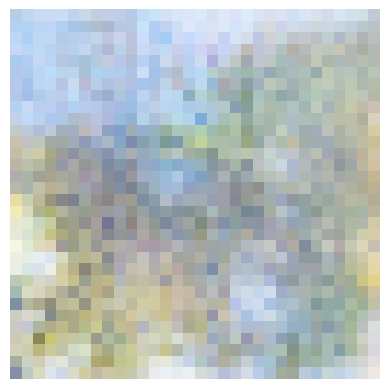

Epoch 1771/2500
Generator loss: 1.1026158332824707, Discriminator loss: 1.1353172063827515
Epoch 1772/2500
Generator loss: 1.1509392261505127, Discriminator loss: 1.0815411806106567
Epoch 1773/2500
Generator loss: 1.096023440361023, Discriminator loss: 1.1180764436721802
Epoch 1774/2500
Generator loss: 1.116260290145874, Discriminator loss: 1.0601022243499756
Epoch 1775/2500
Generator loss: 1.1088179349899292, Discriminator loss: 1.1003776788711548
Epoch 1776/2500
Generator loss: 1.0959464311599731, Discriminator loss: 1.110614538192749
Epoch 1777/2500
Generator loss: 1.1019492149353027, Discriminator loss: 1.101928949356079
Epoch 1778/2500
Generator loss: 1.1327686309814453, Discriminator loss: 1.1168160438537598
Epoch 1779/2500
Generator loss: 1.1018589735031128, Discriminator loss: 1.1420868635177612
Epoch 1780/2500
Generator loss: 1.1381878852844238, Discriminator loss: 1.037764549255371


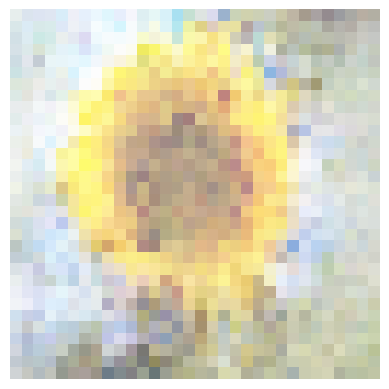

Epoch 1781/2500
Generator loss: 1.0627470016479492, Discriminator loss: 1.1981860399246216
Epoch 1782/2500
Generator loss: 1.1300972700119019, Discriminator loss: 1.087271809577942
Epoch 1783/2500
Generator loss: 1.1199413537979126, Discriminator loss: 1.1021442413330078
Epoch 1784/2500
Generator loss: 1.0479933023452759, Discriminator loss: 1.1707921028137207
Epoch 1785/2500
Generator loss: 1.1181098222732544, Discriminator loss: 1.0617772340774536
Epoch 1786/2500
Generator loss: 1.0770829916000366, Discriminator loss: 1.0762555599212646
Epoch 1787/2500
Generator loss: 1.087983250617981, Discriminator loss: 1.1329491138458252
Epoch 1788/2500
Generator loss: 1.1832023859024048, Discriminator loss: 1.005740761756897
Epoch 1789/2500
Generator loss: 1.0923264026641846, Discriminator loss: 1.116385817527771
Epoch 1790/2500
Generator loss: 1.0610921382904053, Discriminator loss: 1.1256576776504517


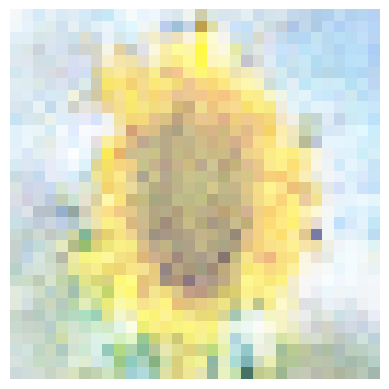

Epoch 1791/2500
Generator loss: 1.1146373748779297, Discriminator loss: 1.09658944606781
Epoch 1792/2500
Generator loss: 1.0935002565383911, Discriminator loss: 1.1484768390655518
Epoch 1793/2500
Generator loss: 1.0980358123779297, Discriminator loss: 1.112240195274353
Epoch 1794/2500
Generator loss: 1.0650688409805298, Discriminator loss: 1.1438448429107666
Epoch 1795/2500
Generator loss: 1.1242356300354004, Discriminator loss: 1.0892541408538818
Epoch 1796/2500
Generator loss: 1.115899682044983, Discriminator loss: 1.088411808013916
Epoch 1797/2500
Generator loss: 1.0588481426239014, Discriminator loss: 1.14876389503479
Epoch 1798/2500
Generator loss: 1.197129726409912, Discriminator loss: 1.04439115524292
Epoch 1799/2500
Generator loss: 1.1116926670074463, Discriminator loss: 1.0902643203735352
Epoch 1800/2500
Generator loss: 1.0673168897628784, Discriminator loss: 1.1399741172790527


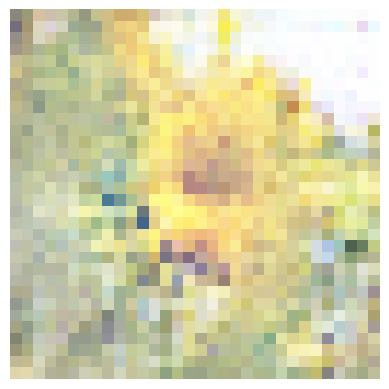

Epoch 1801/2500
Generator loss: 1.0655219554901123, Discriminator loss: 1.1593478918075562
Epoch 1802/2500
Generator loss: 1.2335110902786255, Discriminator loss: 0.9523375034332275
Epoch 1803/2500
Generator loss: 1.0491472482681274, Discriminator loss: 1.1402992010116577
Epoch 1804/2500
Generator loss: 1.117101788520813, Discriminator loss: 1.1708000898361206
Epoch 1805/2500
Generator loss: 1.1406677961349487, Discriminator loss: 1.0898855924606323
Epoch 1806/2500
Generator loss: 1.1913995742797852, Discriminator loss: 1.0283491611480713
Epoch 1807/2500
Generator loss: 1.0328298807144165, Discriminator loss: 1.1815706491470337
Epoch 1808/2500
Generator loss: 1.1640887260437012, Discriminator loss: 1.025280237197876
Epoch 1809/2500
Generator loss: 1.162958025932312, Discriminator loss: 1.1118766069412231
Epoch 1810/2500
Generator loss: 1.089444875717163, Discriminator loss: 1.1553388833999634


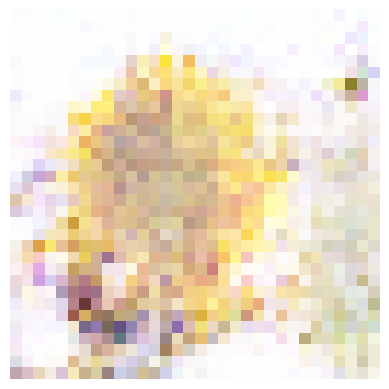

Epoch 1811/2500
Generator loss: 1.1576601266860962, Discriminator loss: 1.0292826890945435
Epoch 1812/2500
Generator loss: 1.1380152702331543, Discriminator loss: 1.0397869348526
Epoch 1813/2500
Generator loss: 1.1726418733596802, Discriminator loss: 1.0089763402938843
Epoch 1814/2500
Generator loss: 1.1266143321990967, Discriminator loss: 1.1252684593200684
Epoch 1815/2500
Generator loss: 1.140541672706604, Discriminator loss: 1.0567518472671509
Epoch 1816/2500
Generator loss: 1.155726671218872, Discriminator loss: 1.1483994722366333
Epoch 1817/2500
Generator loss: 1.2504935264587402, Discriminator loss: 0.9399276375770569
Epoch 1818/2500
Generator loss: 1.2221182584762573, Discriminator loss: 1.0385026931762695
Epoch 1819/2500
Generator loss: 1.0658255815505981, Discriminator loss: 1.2000590562820435
Epoch 1820/2500
Generator loss: 1.1605420112609863, Discriminator loss: 1.0250812768936157


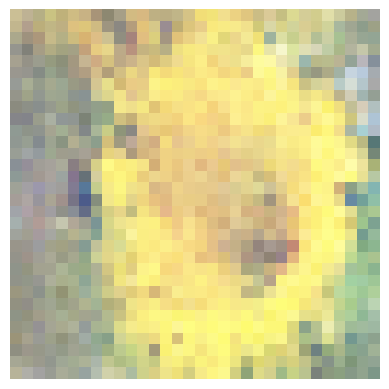

Epoch 1821/2500
Generator loss: 1.138027548789978, Discriminator loss: 1.0487618446350098
Epoch 1822/2500
Generator loss: 1.1294740438461304, Discriminator loss: 1.0708400011062622
Epoch 1823/2500
Generator loss: 1.245380163192749, Discriminator loss: 1.029252529144287
Epoch 1824/2500
Generator loss: 1.222327470779419, Discriminator loss: 1.0000141859054565
Epoch 1825/2500
Generator loss: 1.1248459815979004, Discriminator loss: 1.1739566326141357
Epoch 1826/2500
Generator loss: 1.1576118469238281, Discriminator loss: 1.0661364793777466
Epoch 1827/2500
Generator loss: 1.1878187656402588, Discriminator loss: 1.0008271932601929
Epoch 1828/2500
Generator loss: 1.1551584005355835, Discriminator loss: 1.08812415599823
Epoch 1829/2500
Generator loss: 1.1182054281234741, Discriminator loss: 1.128572702407837
Epoch 1830/2500
Generator loss: 1.141120195388794, Discriminator loss: 1.128544569015503


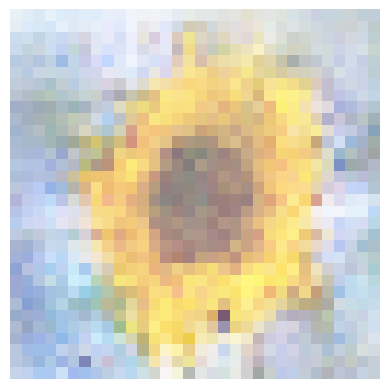

Epoch 1831/2500
Generator loss: 1.1365514993667603, Discriminator loss: 1.0842682123184204
Epoch 1832/2500
Generator loss: 1.1376113891601562, Discriminator loss: 1.0860916376113892
Epoch 1833/2500
Generator loss: 1.1235514879226685, Discriminator loss: 1.0586241483688354
Epoch 1834/2500
Generator loss: 1.1464635133743286, Discriminator loss: 1.0805130004882812
Epoch 1835/2500
Generator loss: 1.1262115240097046, Discriminator loss: 1.1151872873306274
Epoch 1836/2500
Generator loss: 1.1356784105300903, Discriminator loss: 1.0540839433670044
Epoch 1837/2500
Generator loss: 1.1359233856201172, Discriminator loss: 1.070736050605774
Epoch 1838/2500
Generator loss: 1.1126360893249512, Discriminator loss: 1.0527048110961914
Epoch 1839/2500
Generator loss: 1.123344898223877, Discriminator loss: 1.1157435178756714
Epoch 1840/2500
Generator loss: 1.0979328155517578, Discriminator loss: 1.1029702425003052


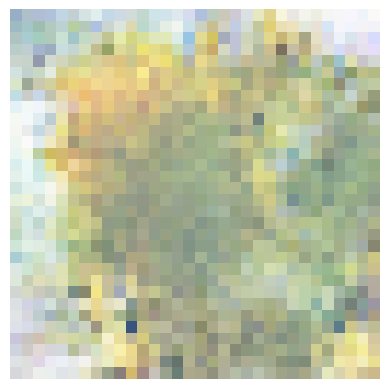

Epoch 1841/2500
Generator loss: 1.0793805122375488, Discriminator loss: 1.1537723541259766
Epoch 1842/2500
Generator loss: 1.1039844751358032, Discriminator loss: 1.1029140949249268
Epoch 1843/2500
Generator loss: 1.1571145057678223, Discriminator loss: 1.0920711755752563
Epoch 1844/2500
Generator loss: 1.0821988582611084, Discriminator loss: 1.140612006187439
Epoch 1845/2500
Generator loss: 1.1625860929489136, Discriminator loss: 1.1152422428131104
Epoch 1846/2500
Generator loss: 1.1000697612762451, Discriminator loss: 1.1139236688613892
Epoch 1847/2500
Generator loss: 1.1147050857543945, Discriminator loss: 1.1046438217163086
Epoch 1848/2500
Generator loss: 1.1194467544555664, Discriminator loss: 1.1151695251464844
Epoch 1849/2500
Generator loss: 1.071510910987854, Discriminator loss: 1.187540054321289
Epoch 1850/2500
Generator loss: 1.1675094366073608, Discriminator loss: 1.0547025203704834


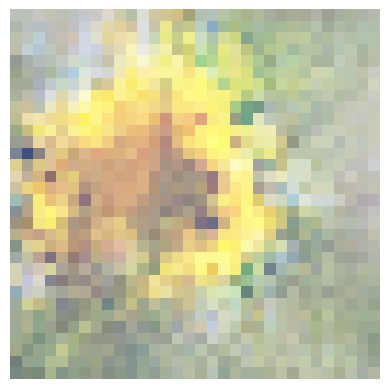

Epoch 1851/2500
Generator loss: 1.0822300910949707, Discriminator loss: 1.092443585395813
Epoch 1852/2500
Generator loss: 1.139350414276123, Discriminator loss: 1.11173677444458
Epoch 1853/2500
Generator loss: 1.1560214757919312, Discriminator loss: 1.1119548082351685
Epoch 1854/2500
Generator loss: 1.1089338064193726, Discriminator loss: 1.1205556392669678
Epoch 1855/2500
Generator loss: 1.1661696434020996, Discriminator loss: 1.0888011455535889
Epoch 1856/2500
Generator loss: 1.0510451793670654, Discriminator loss: 1.121947169303894
Epoch 1857/2500
Generator loss: 1.157505989074707, Discriminator loss: 1.056051254272461
Epoch 1858/2500
Generator loss: 1.1454143524169922, Discriminator loss: 1.0798165798187256
Epoch 1859/2500
Generator loss: 1.1579402685165405, Discriminator loss: 1.0869330167770386
Epoch 1860/2500
Generator loss: 1.1321499347686768, Discriminator loss: 1.0999354124069214


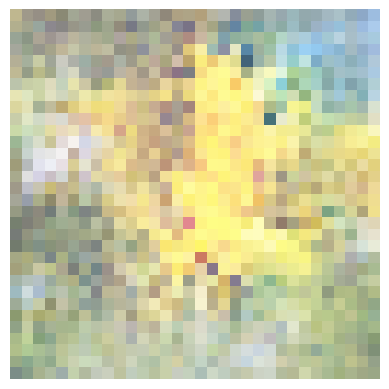

Epoch 1861/2500
Generator loss: 1.1155744791030884, Discriminator loss: 1.0423948764801025
Epoch 1862/2500
Generator loss: 1.1120206117630005, Discriminator loss: 1.0764949321746826
Epoch 1863/2500
Generator loss: 1.2247371673583984, Discriminator loss: 1.0938799381256104
Epoch 1864/2500
Generator loss: 1.0981451272964478, Discriminator loss: 1.164750099182129
Epoch 1865/2500
Generator loss: 1.1374428272247314, Discriminator loss: 1.1585402488708496
Epoch 1866/2500
Generator loss: 1.1028964519500732, Discriminator loss: 1.0833603143692017
Epoch 1867/2500
Generator loss: 1.1313450336456299, Discriminator loss: 1.0937036275863647
Epoch 1868/2500
Generator loss: 1.1382434368133545, Discriminator loss: 1.0921498537063599
Epoch 1869/2500
Generator loss: 1.1618064641952515, Discriminator loss: 1.1147665977478027
Epoch 1870/2500
Generator loss: 1.1051756143569946, Discriminator loss: 1.1619161367416382


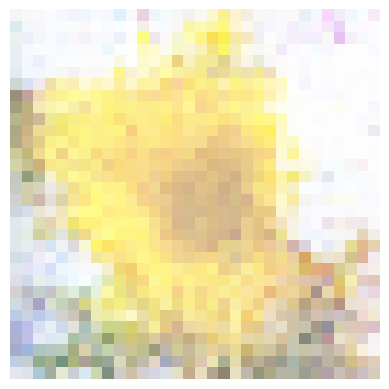

Epoch 1871/2500
Generator loss: 1.1553300619125366, Discriminator loss: 1.0023162364959717
Epoch 1872/2500
Generator loss: 1.123010277748108, Discriminator loss: 1.0963053703308105
Epoch 1873/2500
Generator loss: 1.1416280269622803, Discriminator loss: 1.0963984727859497
Epoch 1874/2500
Generator loss: 1.1110596656799316, Discriminator loss: 1.1457860469818115
Epoch 1875/2500
Generator loss: 1.1029540300369263, Discriminator loss: 1.1541521549224854
Epoch 1876/2500
Generator loss: 1.1246161460876465, Discriminator loss: 1.0580360889434814
Epoch 1877/2500
Generator loss: 1.0966441631317139, Discriminator loss: 1.108792781829834
Epoch 1878/2500
Generator loss: 1.1229519844055176, Discriminator loss: 1.079390525817871
Epoch 1879/2500
Generator loss: 1.14558744430542, Discriminator loss: 1.1542916297912598
Epoch 1880/2500
Generator loss: 1.1392160654067993, Discriminator loss: 1.0817466974258423


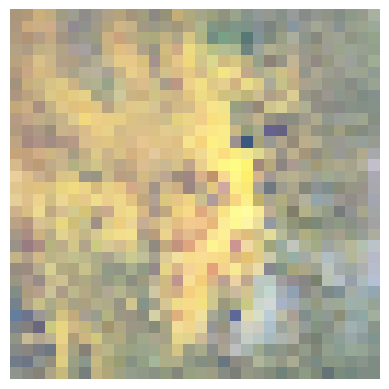

Epoch 1881/2500
Generator loss: 1.149576187133789, Discriminator loss: 1.0836511850357056
Epoch 1882/2500
Generator loss: 1.1495438814163208, Discriminator loss: 1.069538950920105
Epoch 1883/2500
Generator loss: 1.1190872192382812, Discriminator loss: 1.0678181648254395
Epoch 1884/2500
Generator loss: 1.0649055242538452, Discriminator loss: 1.149209976196289
Epoch 1885/2500
Generator loss: 1.097214698791504, Discriminator loss: 1.1502437591552734
Epoch 1886/2500
Generator loss: 1.1926665306091309, Discriminator loss: 1.0375818014144897
Epoch 1887/2500
Generator loss: 1.1483099460601807, Discriminator loss: 1.10121750831604
Epoch 1888/2500
Generator loss: 1.0795222520828247, Discriminator loss: 1.1370468139648438
Epoch 1889/2500
Generator loss: 1.1629321575164795, Discriminator loss: 1.092877984046936
Epoch 1890/2500
Generator loss: 1.0429818630218506, Discriminator loss: 1.193560242652893


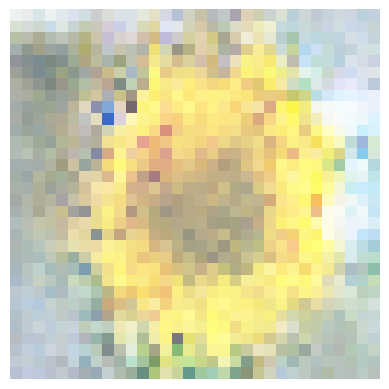

Epoch 1891/2500
Generator loss: 1.101705551147461, Discriminator loss: 1.0834773778915405
Epoch 1892/2500
Generator loss: 1.2138477563858032, Discriminator loss: 1.0302042961120605
Epoch 1893/2500
Generator loss: 1.057026743888855, Discriminator loss: 1.137054443359375
Epoch 1894/2500
Generator loss: 1.1094297170639038, Discriminator loss: 1.103739857673645
Epoch 1895/2500
Generator loss: 1.0844817161560059, Discriminator loss: 1.136278510093689
Epoch 1896/2500
Generator loss: 1.0938658714294434, Discriminator loss: 1.1101322174072266
Epoch 1897/2500
Generator loss: 1.1058779954910278, Discriminator loss: 1.0691828727722168
Epoch 1898/2500
Generator loss: 1.0867847204208374, Discriminator loss: 1.1175992488861084
Epoch 1899/2500
Generator loss: 1.093809723854065, Discriminator loss: 1.1294199228286743
Epoch 1900/2500
Generator loss: 1.0967581272125244, Discriminator loss: 1.1026511192321777


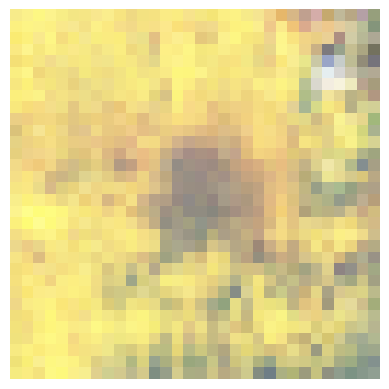

Epoch 1901/2500
Generator loss: 1.1245085000991821, Discriminator loss: 1.1494446992874146
Epoch 1902/2500
Generator loss: 1.088919758796692, Discriminator loss: 1.1211719512939453
Epoch 1903/2500
Generator loss: 1.1242268085479736, Discriminator loss: 1.0915858745574951
Epoch 1904/2500
Generator loss: 1.1220647096633911, Discriminator loss: 1.0752918720245361
Epoch 1905/2500
Generator loss: 1.080492377281189, Discriminator loss: 1.1463407278060913
Epoch 1906/2500
Generator loss: 1.1357707977294922, Discriminator loss: 1.113723874092102
Epoch 1907/2500
Generator loss: 1.0636296272277832, Discriminator loss: 1.134106993675232
Epoch 1908/2500
Generator loss: 1.1185640096664429, Discriminator loss: 1.1053239107131958
Epoch 1909/2500
Generator loss: 1.1274958848953247, Discriminator loss: 1.0861307382583618
Epoch 1910/2500
Generator loss: 1.0934362411499023, Discriminator loss: 1.103956937789917


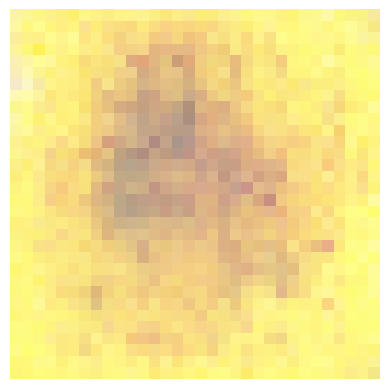

Epoch 1911/2500
Generator loss: 1.1277868747711182, Discriminator loss: 1.1092965602874756
Epoch 1912/2500
Generator loss: 1.1151013374328613, Discriminator loss: 1.0770918130874634
Epoch 1913/2500
Generator loss: 1.161271095275879, Discriminator loss: 1.0668059587478638
Epoch 1914/2500
Generator loss: 1.0946611166000366, Discriminator loss: 1.1347752809524536
Epoch 1915/2500
Generator loss: 1.183969259262085, Discriminator loss: 1.0726171731948853
Epoch 1916/2500
Generator loss: 1.1032623052597046, Discriminator loss: 1.0779873132705688
Epoch 1917/2500
Generator loss: 1.1165640354156494, Discriminator loss: 1.142605185508728
Epoch 1918/2500
Generator loss: 1.1307014226913452, Discriminator loss: 1.0973210334777832
Epoch 1919/2500
Generator loss: 1.1051355600357056, Discriminator loss: 1.1209467649459839
Epoch 1920/2500
Generator loss: 1.1047947406768799, Discriminator loss: 1.1022117137908936


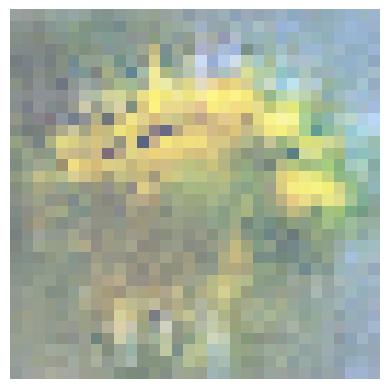

Epoch 1921/2500
Generator loss: 1.0778762102127075, Discriminator loss: 1.1052762269973755
Epoch 1922/2500
Generator loss: 1.106543779373169, Discriminator loss: 1.0989012718200684
Epoch 1923/2500
Generator loss: 1.1657718420028687, Discriminator loss: 1.0625388622283936
Epoch 1924/2500
Generator loss: 1.101441740989685, Discriminator loss: 1.0822081565856934
Epoch 1925/2500
Generator loss: 1.1395124197006226, Discriminator loss: 1.0787533521652222
Epoch 1926/2500
Generator loss: 1.126956820487976, Discriminator loss: 1.0849499702453613
Epoch 1927/2500
Generator loss: 1.0696065425872803, Discriminator loss: 1.1223357915878296
Epoch 1928/2500
Generator loss: 1.0914872884750366, Discriminator loss: 1.100075364112854
Epoch 1929/2500
Generator loss: 1.1083086729049683, Discriminator loss: 1.081599235534668
Epoch 1930/2500
Generator loss: 1.1316810846328735, Discriminator loss: 1.071131706237793


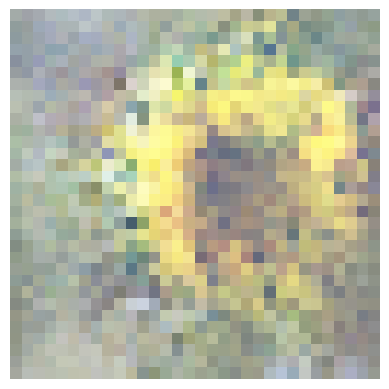

Epoch 1931/2500
Generator loss: 1.1369422674179077, Discriminator loss: 1.103872537612915
Epoch 1932/2500
Generator loss: 1.1836730241775513, Discriminator loss: 1.0591399669647217
Epoch 1933/2500
Generator loss: 1.0668127536773682, Discriminator loss: 1.0957988500595093
Epoch 1934/2500
Generator loss: 1.1788688898086548, Discriminator loss: 1.0900853872299194
Epoch 1935/2500
Generator loss: 1.0828077793121338, Discriminator loss: 1.1657613515853882
Epoch 1936/2500
Generator loss: 1.1898419857025146, Discriminator loss: 1.0224096775054932
Epoch 1937/2500
Generator loss: 1.1313823461532593, Discriminator loss: 1.0461493730545044
Epoch 1938/2500
Generator loss: 1.067384958267212, Discriminator loss: 1.181136965751648
Epoch 1939/2500
Generator loss: 1.2235039472579956, Discriminator loss: 1.0202773809432983
Epoch 1940/2500
Generator loss: 1.1672589778900146, Discriminator loss: 1.0655953884124756


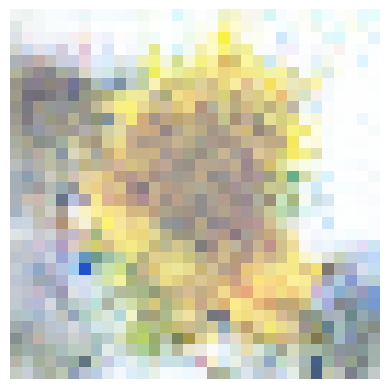

Epoch 1941/2500
Generator loss: 1.1376426219940186, Discriminator loss: 1.0886824131011963
Epoch 1942/2500
Generator loss: 1.0631605386734009, Discriminator loss: 1.1242352724075317
Epoch 1943/2500
Generator loss: 1.1678320169448853, Discriminator loss: 1.0457053184509277
Epoch 1944/2500
Generator loss: 1.2266149520874023, Discriminator loss: 1.0119754076004028
Epoch 1945/2500
Generator loss: 1.1860545873641968, Discriminator loss: 1.0133475065231323
Epoch 1946/2500
Generator loss: 1.2050501108169556, Discriminator loss: 1.069966197013855
Epoch 1947/2500
Generator loss: 1.2312971353530884, Discriminator loss: 1.027212142944336
Epoch 1948/2500
Generator loss: 1.1856672763824463, Discriminator loss: 1.1739615201950073
Epoch 1949/2500
Generator loss: 1.1003037691116333, Discriminator loss: 1.159615159034729
Epoch 1950/2500
Generator loss: 1.192341685295105, Discriminator loss: 0.9964686036109924


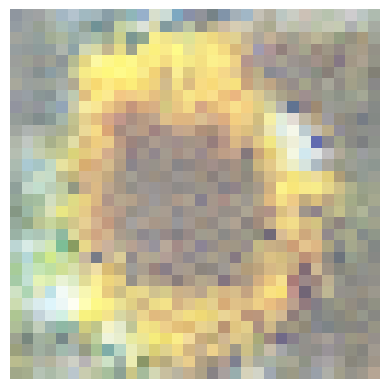

Epoch 1951/2500
Generator loss: 1.1702419519424438, Discriminator loss: 1.0372015237808228
Epoch 1952/2500
Generator loss: 1.1977568864822388, Discriminator loss: 1.0368549823760986
Epoch 1953/2500
Generator loss: 1.1261438131332397, Discriminator loss: 1.1135634183883667
Epoch 1954/2500
Generator loss: 1.1432782411575317, Discriminator loss: 1.1067209243774414
Epoch 1955/2500
Generator loss: 1.2125190496444702, Discriminator loss: 1.0087034702301025
Epoch 1956/2500
Generator loss: 1.139925479888916, Discriminator loss: 1.1277647018432617
Epoch 1957/2500
Generator loss: 1.13076651096344, Discriminator loss: 1.1245689392089844
Epoch 1958/2500
Generator loss: 1.1792137622833252, Discriminator loss: 1.0070788860321045
Epoch 1959/2500
Generator loss: 1.2182024717330933, Discriminator loss: 0.9812070727348328
Epoch 1960/2500
Generator loss: 1.1622287034988403, Discriminator loss: 1.034753441810608


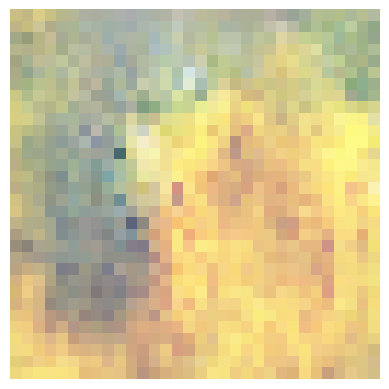

Epoch 1961/2500
Generator loss: 1.1263294219970703, Discriminator loss: 1.1436609029769897
Epoch 1962/2500
Generator loss: 1.185370922088623, Discriminator loss: 1.053995132446289
Epoch 1963/2500
Generator loss: 1.1797486543655396, Discriminator loss: 1.0392451286315918
Epoch 1964/2500
Generator loss: 1.155610203742981, Discriminator loss: 1.0574951171875
Epoch 1965/2500
Generator loss: 1.127441644668579, Discriminator loss: 1.0895414352416992
Epoch 1966/2500
Generator loss: 1.1253868341445923, Discriminator loss: 1.1161020994186401
Epoch 1967/2500
Generator loss: 1.1356141567230225, Discriminator loss: 1.080970287322998
Epoch 1968/2500
Generator loss: 1.251907229423523, Discriminator loss: 0.9984616637229919
Epoch 1969/2500
Generator loss: 1.1603705883026123, Discriminator loss: 1.0636920928955078
Epoch 1970/2500
Generator loss: 1.134475827217102, Discriminator loss: 1.102035403251648


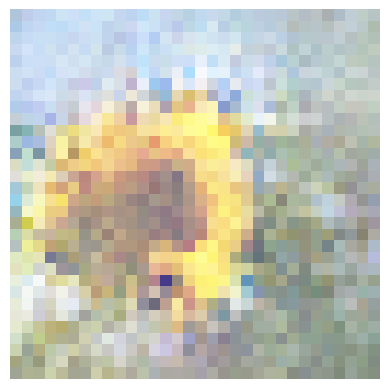

Epoch 1971/2500
Generator loss: 1.1366939544677734, Discriminator loss: 1.1059781312942505
Epoch 1972/2500
Generator loss: 1.1020946502685547, Discriminator loss: 1.0839563608169556
Epoch 1973/2500
Generator loss: 1.1786274909973145, Discriminator loss: 1.0848466157913208
Epoch 1974/2500
Generator loss: 1.1085643768310547, Discriminator loss: 1.1334972381591797
Epoch 1975/2500
Generator loss: 1.1669574975967407, Discriminator loss: 1.0264486074447632
Epoch 1976/2500
Generator loss: 1.0973849296569824, Discriminator loss: 1.1154992580413818
Epoch 1977/2500
Generator loss: 1.176727533340454, Discriminator loss: 1.0635772943496704
Epoch 1978/2500
Generator loss: 1.1402254104614258, Discriminator loss: 1.0790371894836426
Epoch 1979/2500
Generator loss: 1.184488296508789, Discriminator loss: 1.0930073261260986
Epoch 1980/2500
Generator loss: 1.1621800661087036, Discriminator loss: 1.0092756748199463


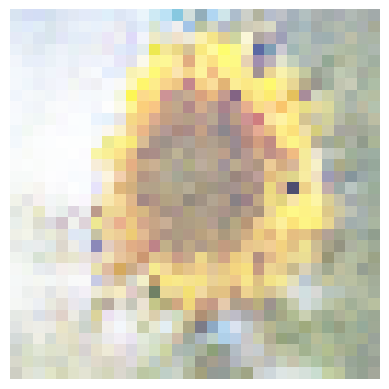

Epoch 1981/2500
Generator loss: 1.0690624713897705, Discriminator loss: 1.1546465158462524
Epoch 1982/2500
Generator loss: 1.1667824983596802, Discriminator loss: 1.0418052673339844
Epoch 1983/2500
Generator loss: 1.164860486984253, Discriminator loss: 1.042494535446167
Epoch 1984/2500
Generator loss: 1.1206023693084717, Discriminator loss: 1.136667251586914
Epoch 1985/2500
Generator loss: 1.1084709167480469, Discriminator loss: 1.1032432317733765
Epoch 1986/2500
Generator loss: 1.0919735431671143, Discriminator loss: 1.1134625673294067
Epoch 1987/2500
Generator loss: 1.199459433555603, Discriminator loss: 1.0140358209609985
Epoch 1988/2500
Generator loss: 1.209764003753662, Discriminator loss: 1.0470902919769287
Epoch 1989/2500
Generator loss: 1.1250282526016235, Discriminator loss: 1.128578543663025
Epoch 1990/2500
Generator loss: 1.1084365844726562, Discriminator loss: 1.1248431205749512


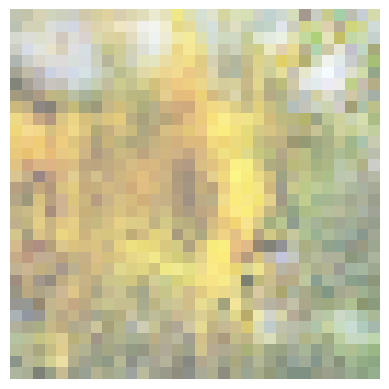

Epoch 1991/2500
Generator loss: 1.1300420761108398, Discriminator loss: 1.0659160614013672
Epoch 1992/2500
Generator loss: 1.2631752490997314, Discriminator loss: 1.0003048181533813
Epoch 1993/2500
Generator loss: 1.177603006362915, Discriminator loss: 1.0516276359558105
Epoch 1994/2500
Generator loss: 1.1320141553878784, Discriminator loss: 1.14554762840271
Epoch 1995/2500
Generator loss: 1.1466374397277832, Discriminator loss: 1.1055241823196411
Epoch 1996/2500
Generator loss: 1.202106237411499, Discriminator loss: 1.0093697309494019
Epoch 1997/2500
Generator loss: 1.114767074584961, Discriminator loss: 1.1498231887817383
Epoch 1998/2500
Generator loss: 1.1661193370819092, Discriminator loss: 1.0790650844573975
Epoch 1999/2500
Generator loss: 1.1112759113311768, Discriminator loss: 1.0987112522125244
Epoch 2000/2500
Generator loss: 1.166670799255371, Discriminator loss: 1.1187800168991089


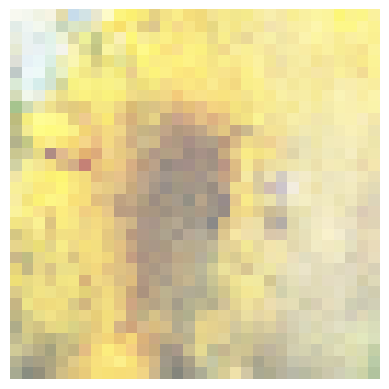

Epoch 2001/2500
Generator loss: 1.1745139360427856, Discriminator loss: 1.039101481437683
Epoch 2002/2500
Generator loss: 1.170649528503418, Discriminator loss: 1.0351929664611816
Epoch 2003/2500
Generator loss: 1.17991042137146, Discriminator loss: 1.0412349700927734
Epoch 2004/2500
Generator loss: 1.1447185277938843, Discriminator loss: 1.1021101474761963
Epoch 2005/2500
Generator loss: 1.1452000141143799, Discriminator loss: 1.1045951843261719
Epoch 2006/2500
Generator loss: 1.1323429346084595, Discriminator loss: 1.075608730316162
Epoch 2007/2500
Generator loss: 1.1430330276489258, Discriminator loss: 1.0797240734100342
Epoch 2008/2500
Generator loss: 1.1783148050308228, Discriminator loss: 1.0523278713226318
Epoch 2009/2500
Generator loss: 1.0895802974700928, Discriminator loss: 1.1226860284805298
Epoch 2010/2500
Generator loss: 1.1258423328399658, Discriminator loss: 1.0767141580581665


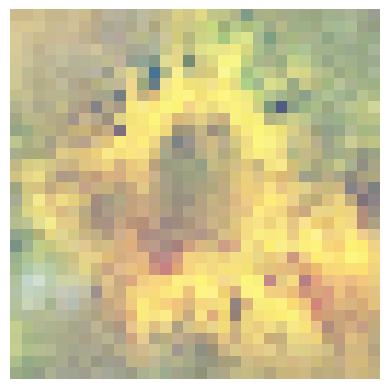

Epoch 2011/2500
Generator loss: 1.1520341634750366, Discriminator loss: 1.086836576461792
Epoch 2012/2500
Generator loss: 1.200782299041748, Discriminator loss: 1.017463207244873
Epoch 2013/2500
Generator loss: 1.1000369787216187, Discriminator loss: 1.0990302562713623
Epoch 2014/2500
Generator loss: 1.1277190446853638, Discriminator loss: 1.164201259613037
Epoch 2015/2500
Generator loss: 1.1098887920379639, Discriminator loss: 1.1181800365447998
Epoch 2016/2500
Generator loss: 1.1639987230300903, Discriminator loss: 1.0997536182403564
Epoch 2017/2500
Generator loss: 1.1667653322219849, Discriminator loss: 1.021712064743042
Epoch 2018/2500
Generator loss: 1.100870966911316, Discriminator loss: 1.127514123916626
Epoch 2019/2500
Generator loss: 1.1045094728469849, Discriminator loss: 1.119375467300415
Epoch 2020/2500
Generator loss: 1.100822925567627, Discriminator loss: 1.0816197395324707


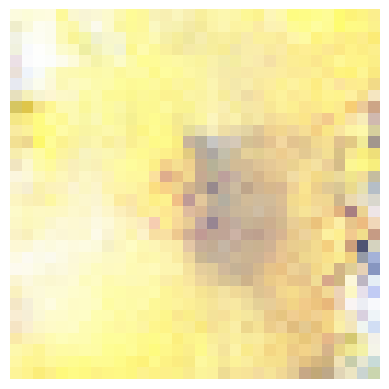

Epoch 2021/2500
Generator loss: 1.1590089797973633, Discriminator loss: 1.0845664739608765
Epoch 2022/2500
Generator loss: 1.1151103973388672, Discriminator loss: 1.0805809497833252
Epoch 2023/2500
Generator loss: 1.1382253170013428, Discriminator loss: 1.093582272529602
Epoch 2024/2500
Generator loss: 1.098375916481018, Discriminator loss: 1.106024980545044
Epoch 2025/2500
Generator loss: 1.2243351936340332, Discriminator loss: 1.0690021514892578
Epoch 2026/2500
Generator loss: 1.1238923072814941, Discriminator loss: 1.0890377759933472
Epoch 2027/2500
Generator loss: 1.1115802526474, Discriminator loss: 1.069330096244812
Epoch 2028/2500
Generator loss: 1.118854284286499, Discriminator loss: 1.1030417680740356
Epoch 2029/2500
Generator loss: 1.1303807497024536, Discriminator loss: 1.0933187007904053
Epoch 2030/2500
Generator loss: 1.1254796981811523, Discriminator loss: 1.0913053750991821


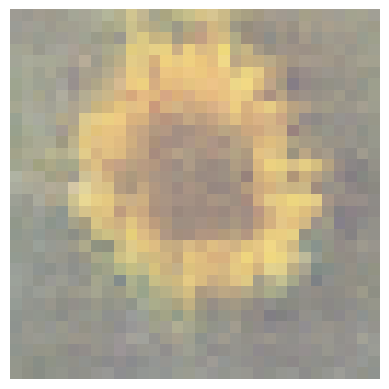

Epoch 2031/2500
Generator loss: 1.135231614112854, Discriminator loss: 1.0762298107147217
Epoch 2032/2500
Generator loss: 1.170748233795166, Discriminator loss: 1.0042871236801147
Epoch 2033/2500
Generator loss: 1.1947803497314453, Discriminator loss: 1.0835082530975342
Epoch 2034/2500
Generator loss: 1.1340150833129883, Discriminator loss: 1.1267809867858887
Epoch 2035/2500
Generator loss: 1.2048602104187012, Discriminator loss: 1.0845258235931396
Epoch 2036/2500
Generator loss: 1.1876485347747803, Discriminator loss: 1.070677399635315
Epoch 2037/2500
Generator loss: 1.1557910442352295, Discriminator loss: 1.080253005027771
Epoch 2038/2500
Generator loss: 1.1117011308670044, Discriminator loss: 1.0998492240905762
Epoch 2039/2500
Generator loss: 1.1675732135772705, Discriminator loss: 1.0802499055862427
Epoch 2040/2500
Generator loss: 1.1393505334854126, Discriminator loss: 1.0694599151611328


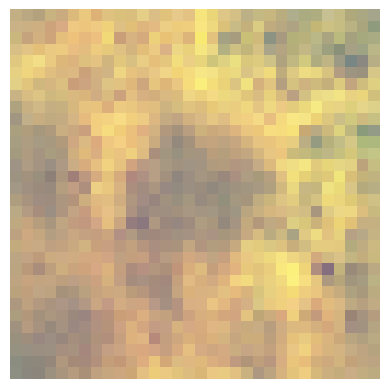

Epoch 2041/2500
Generator loss: 1.1300544738769531, Discriminator loss: 1.0276446342468262
Epoch 2042/2500
Generator loss: 1.173761010169983, Discriminator loss: 1.100776195526123
Epoch 2043/2500
Generator loss: 1.1036548614501953, Discriminator loss: 1.1066646575927734
Epoch 2044/2500
Generator loss: 1.276888370513916, Discriminator loss: 1.043478012084961
Epoch 2045/2500
Generator loss: 1.1236724853515625, Discriminator loss: 1.083621621131897
Epoch 2046/2500
Generator loss: 1.1080322265625, Discriminator loss: 1.128333568572998
Epoch 2047/2500
Generator loss: 1.180481195449829, Discriminator loss: 1.0588698387145996
Epoch 2048/2500
Generator loss: 1.1350362300872803, Discriminator loss: 1.0871684551239014
Epoch 2049/2500
Generator loss: 1.1424694061279297, Discriminator loss: 1.1009413003921509
Epoch 2050/2500
Generator loss: 1.1272289752960205, Discriminator loss: 1.0885212421417236


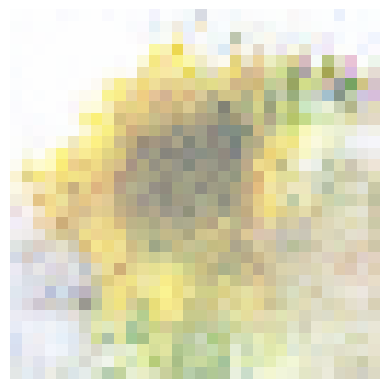

Epoch 2051/2500
Generator loss: 1.128316879272461, Discriminator loss: 1.0636188983917236
Epoch 2052/2500
Generator loss: 1.1515798568725586, Discriminator loss: 1.0464836359024048
Epoch 2053/2500
Generator loss: 1.1432710886001587, Discriminator loss: 1.114610195159912
Epoch 2054/2500
Generator loss: 1.1426150798797607, Discriminator loss: 1.0962222814559937
Epoch 2055/2500
Generator loss: 1.1252028942108154, Discriminator loss: 1.0880321264266968
Epoch 2056/2500
Generator loss: 1.1291073560714722, Discriminator loss: 1.0724886655807495
Epoch 2057/2500
Generator loss: 1.250510334968567, Discriminator loss: 1.0730020999908447
Epoch 2058/2500
Generator loss: 1.0848265886306763, Discriminator loss: 1.125549554824829
Epoch 2059/2500
Generator loss: 1.0946440696716309, Discriminator loss: 1.1150689125061035
Epoch 2060/2500
Generator loss: 1.1512672901153564, Discriminator loss: 1.0787490606307983


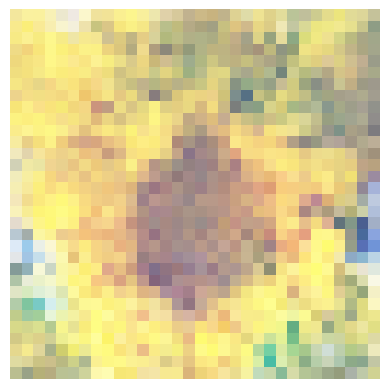

Epoch 2061/2500
Generator loss: 1.1714041233062744, Discriminator loss: 1.079244613647461
Epoch 2062/2500
Generator loss: 1.089807152748108, Discriminator loss: 1.0940736532211304
Epoch 2063/2500
Generator loss: 1.1533191204071045, Discriminator loss: 1.0710742473602295
Epoch 2064/2500
Generator loss: 1.1571459770202637, Discriminator loss: 1.059244990348816
Epoch 2065/2500
Generator loss: 1.150000810623169, Discriminator loss: 1.1087318658828735
Epoch 2066/2500
Generator loss: 1.1662483215332031, Discriminator loss: 1.09648597240448
Epoch 2067/2500
Generator loss: 1.189266324043274, Discriminator loss: 1.077714443206787
Epoch 2068/2500
Generator loss: 1.0889030694961548, Discriminator loss: 1.1403051614761353
Epoch 2069/2500
Generator loss: 1.1619248390197754, Discriminator loss: 1.0071830749511719
Epoch 2070/2500
Generator loss: 1.123808741569519, Discriminator loss: 1.0779918432235718


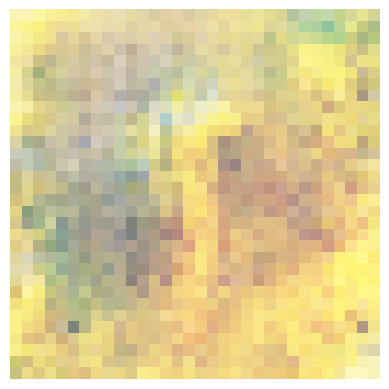

Epoch 2071/2500
Generator loss: 1.1489030122756958, Discriminator loss: 1.1059911251068115
Epoch 2072/2500
Generator loss: 1.210262656211853, Discriminator loss: 1.0342576503753662
Epoch 2073/2500
Generator loss: 1.0863558053970337, Discriminator loss: 1.127434492111206
Epoch 2074/2500
Generator loss: 1.1487746238708496, Discriminator loss: 1.1156387329101562
Epoch 2075/2500
Generator loss: 1.1821768283843994, Discriminator loss: 1.0254939794540405
Epoch 2076/2500
Generator loss: 1.138797402381897, Discriminator loss: 1.0757170915603638
Epoch 2077/2500
Generator loss: 1.1888279914855957, Discriminator loss: 1.0604982376098633
Epoch 2078/2500
Generator loss: 1.0962084531784058, Discriminator loss: 1.1303069591522217
Epoch 2079/2500
Generator loss: 1.180279016494751, Discriminator loss: 1.042441487312317
Epoch 2080/2500
Generator loss: 1.1512128114700317, Discriminator loss: 1.0594305992126465


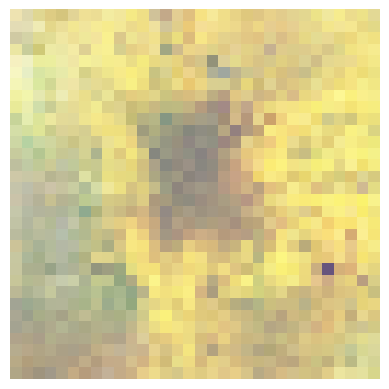

Epoch 2081/2500
Generator loss: 1.1632459163665771, Discriminator loss: 1.1153126955032349
Epoch 2082/2500
Generator loss: 1.219266414642334, Discriminator loss: 1.0767803192138672
Epoch 2083/2500
Generator loss: 1.136322259902954, Discriminator loss: 1.063955307006836
Epoch 2084/2500
Generator loss: 1.0978667736053467, Discriminator loss: 1.0819337368011475
Epoch 2085/2500
Generator loss: 1.1874358654022217, Discriminator loss: 1.0635110139846802
Epoch 2086/2500
Generator loss: 1.1292760372161865, Discriminator loss: 1.0853666067123413
Epoch 2087/2500
Generator loss: 1.1518100500106812, Discriminator loss: 1.0719131231307983
Epoch 2088/2500
Generator loss: 1.1156741380691528, Discriminator loss: 1.0812243223190308
Epoch 2089/2500
Generator loss: 1.0758254528045654, Discriminator loss: 1.1345115900039673
Epoch 2090/2500
Generator loss: 1.1576263904571533, Discriminator loss: 1.001205563545227


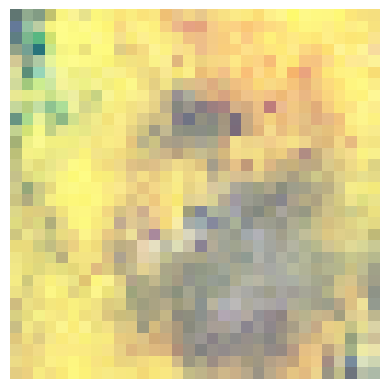

Epoch 2091/2500
Generator loss: 1.1140177249908447, Discriminator loss: 1.0791054964065552
Epoch 2092/2500
Generator loss: 1.1570593118667603, Discriminator loss: 1.0745500326156616
Epoch 2093/2500
Generator loss: 1.1583458185195923, Discriminator loss: 1.0720632076263428
Epoch 2094/2500
Generator loss: 1.1709233522415161, Discriminator loss: 1.0993701219558716
Epoch 2095/2500
Generator loss: 1.1306904554367065, Discriminator loss: 1.077071189880371
Epoch 2096/2500
Generator loss: 1.1695119142532349, Discriminator loss: 1.0815268754959106
Epoch 2097/2500
Generator loss: 1.1547354459762573, Discriminator loss: 1.0306241512298584
Epoch 2098/2500
Generator loss: 1.1492267847061157, Discriminator loss: 1.092369794845581
Epoch 2099/2500
Generator loss: 1.1633236408233643, Discriminator loss: 1.0839310884475708
Epoch 2100/2500
Generator loss: 1.1487170457839966, Discriminator loss: 1.0627878904342651


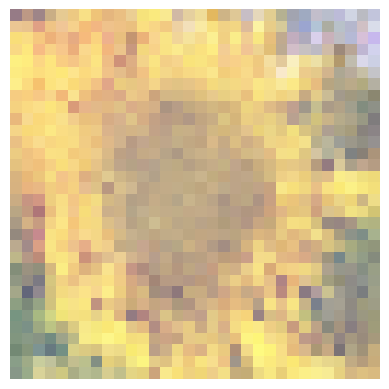

Epoch 2101/2500
Generator loss: 1.1616992950439453, Discriminator loss: 1.06930673122406
Epoch 2102/2500
Generator loss: 1.1954783201217651, Discriminator loss: 1.0760403871536255
Epoch 2103/2500
Generator loss: 1.194868803024292, Discriminator loss: 1.0705755949020386
Epoch 2104/2500
Generator loss: 1.1148298978805542, Discriminator loss: 1.1264532804489136
Epoch 2105/2500
Generator loss: 1.1935827732086182, Discriminator loss: 1.0419390201568604
Epoch 2106/2500
Generator loss: 1.1773000955581665, Discriminator loss: 1.0121898651123047
Epoch 2107/2500
Generator loss: 1.171975016593933, Discriminator loss: 1.1154239177703857
Epoch 2108/2500
Generator loss: 1.1604756116867065, Discriminator loss: 1.125936508178711
Epoch 2109/2500
Generator loss: 1.1597472429275513, Discriminator loss: 1.1358823776245117
Epoch 2110/2500
Generator loss: 1.1493690013885498, Discriminator loss: 1.078826665878296


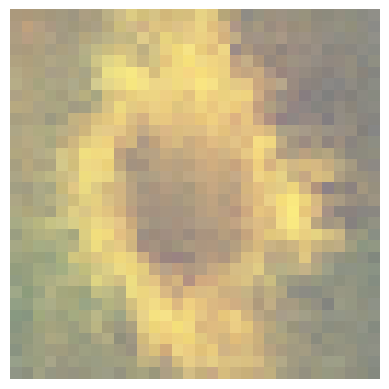

Epoch 2111/2500
Generator loss: 1.1738382577896118, Discriminator loss: 1.0858129262924194
Epoch 2112/2500
Generator loss: 1.118111491203308, Discriminator loss: 1.0447194576263428
Epoch 2113/2500
Generator loss: 1.1963105201721191, Discriminator loss: 1.0470600128173828
Epoch 2114/2500
Generator loss: 1.185750961303711, Discriminator loss: 1.0260002613067627
Epoch 2115/2500
Generator loss: 1.1468636989593506, Discriminator loss: 1.1373118162155151
Epoch 2116/2500
Generator loss: 1.160535454750061, Discriminator loss: 1.042452335357666
Epoch 2117/2500
Generator loss: 1.1344627141952515, Discriminator loss: 1.0942326784133911
Epoch 2118/2500
Generator loss: 1.2039308547973633, Discriminator loss: 1.0237704515457153
Epoch 2119/2500
Generator loss: 1.1810232400894165, Discriminator loss: 1.117332935333252
Epoch 2120/2500
Generator loss: 1.1284866333007812, Discriminator loss: 1.101369857788086


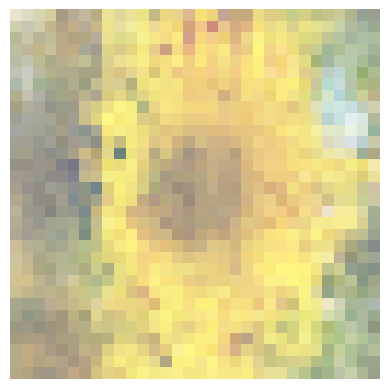

Epoch 2121/2500
Generator loss: 1.1157394647598267, Discriminator loss: 1.068787932395935
Epoch 2122/2500
Generator loss: 1.1772044897079468, Discriminator loss: 1.0399938821792603
Epoch 2123/2500
Generator loss: 1.1918590068817139, Discriminator loss: 1.0325311422348022
Epoch 2124/2500
Generator loss: 1.1645543575286865, Discriminator loss: 1.087033987045288
Epoch 2125/2500
Generator loss: 1.1385518312454224, Discriminator loss: 1.0983623266220093
Epoch 2126/2500
Generator loss: 1.1883025169372559, Discriminator loss: 1.0285228490829468
Epoch 2127/2500
Generator loss: 1.170274019241333, Discriminator loss: 1.0415834188461304
Epoch 2128/2500
Generator loss: 1.118011713027954, Discriminator loss: 1.130784511566162
Epoch 2129/2500
Generator loss: 1.1641113758087158, Discriminator loss: 1.077880620956421
Epoch 2130/2500
Generator loss: 1.231398344039917, Discriminator loss: 1.056493878364563


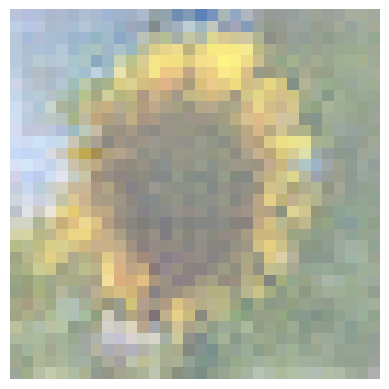

Epoch 2131/2500
Generator loss: 1.1547681093215942, Discriminator loss: 1.0816214084625244
Epoch 2132/2500
Generator loss: 1.1417882442474365, Discriminator loss: 1.0480728149414062
Epoch 2133/2500
Generator loss: 1.1788032054901123, Discriminator loss: 1.0391404628753662
Epoch 2134/2500
Generator loss: 1.1397056579589844, Discriminator loss: 1.0694708824157715
Epoch 2135/2500
Generator loss: 1.1817142963409424, Discriminator loss: 1.0295498371124268
Epoch 2136/2500
Generator loss: 1.1977115869522095, Discriminator loss: 1.0374927520751953
Epoch 2137/2500
Generator loss: 1.1063002347946167, Discriminator loss: 1.1167988777160645
Epoch 2138/2500
Generator loss: 1.1505190134048462, Discriminator loss: 1.0942472219467163
Epoch 2139/2500
Generator loss: 1.15501868724823, Discriminator loss: 1.0881576538085938
Epoch 2140/2500
Generator loss: 1.1996819972991943, Discriminator loss: 1.0497459173202515


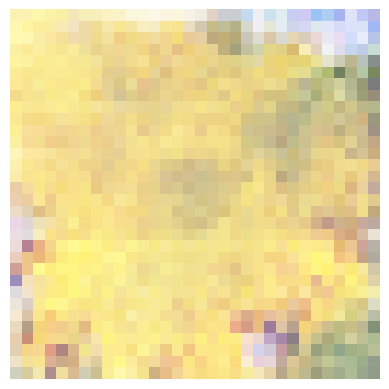

Epoch 2141/2500
Generator loss: 1.1999727487564087, Discriminator loss: 1.100264072418213
Epoch 2142/2500
Generator loss: 1.113240122795105, Discriminator loss: 1.2013177871704102
Epoch 2143/2500
Generator loss: 1.1959539651870728, Discriminator loss: 1.0979595184326172
Epoch 2144/2500
Generator loss: 1.188765525817871, Discriminator loss: 1.0254578590393066
Epoch 2145/2500
Generator loss: 1.1704400777816772, Discriminator loss: 1.1677221059799194
Epoch 2146/2500
Generator loss: 1.185302495956421, Discriminator loss: 1.0896921157836914
Epoch 2147/2500
Generator loss: 1.2082916498184204, Discriminator loss: 1.030202031135559
Epoch 2148/2500
Generator loss: 1.2468934059143066, Discriminator loss: 1.007320761680603
Epoch 2149/2500
Generator loss: 1.1819744110107422, Discriminator loss: 1.0718071460723877
Epoch 2150/2500
Generator loss: 1.2203706502914429, Discriminator loss: 1.0601707696914673


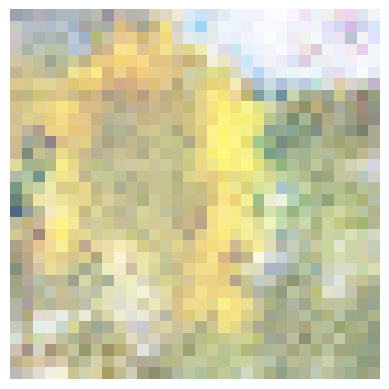

Epoch 2151/2500
Generator loss: 1.2143149375915527, Discriminator loss: 1.0227895975112915
Epoch 2152/2500
Generator loss: 1.1899418830871582, Discriminator loss: 1.0178792476654053
Epoch 2153/2500
Generator loss: 1.245607852935791, Discriminator loss: 0.9742255806922913
Epoch 2154/2500
Generator loss: 1.2375472784042358, Discriminator loss: 1.074729561805725
Epoch 2155/2500
Generator loss: 1.2152354717254639, Discriminator loss: 1.0600528717041016
Epoch 2156/2500
Generator loss: 1.186821699142456, Discriminator loss: 1.0473341941833496
Epoch 2157/2500
Generator loss: 1.157119631767273, Discriminator loss: 1.0368365049362183
Epoch 2158/2500
Generator loss: 1.2304359674453735, Discriminator loss: 1.0219420194625854
Epoch 2159/2500
Generator loss: 1.1082745790481567, Discriminator loss: 1.150478482246399
Epoch 2160/2500
Generator loss: 1.163648009300232, Discriminator loss: 1.0524424314498901


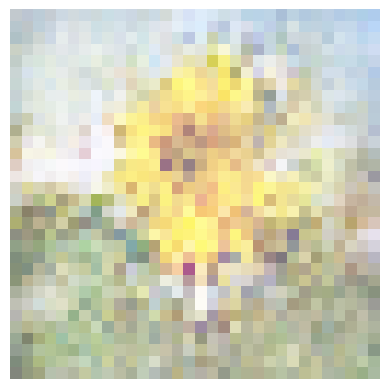

Epoch 2161/2500
Generator loss: 1.242514967918396, Discriminator loss: 0.9672405123710632
Epoch 2162/2500
Generator loss: 1.2012335062026978, Discriminator loss: 1.0356433391571045
Epoch 2163/2500
Generator loss: 1.1619809865951538, Discriminator loss: 1.075054407119751
Epoch 2164/2500
Generator loss: 1.2605719566345215, Discriminator loss: 0.9818313121795654
Epoch 2165/2500
Generator loss: 1.2137267589569092, Discriminator loss: 1.0329737663269043
Epoch 2166/2500
Generator loss: 1.2006405591964722, Discriminator loss: 1.076230525970459
Epoch 2167/2500
Generator loss: 1.1296261548995972, Discriminator loss: 1.0348573923110962
Epoch 2168/2500
Generator loss: 1.1758478879928589, Discriminator loss: 1.0594549179077148
Epoch 2169/2500
Generator loss: 1.2390955686569214, Discriminator loss: 0.9933429956436157
Epoch 2170/2500
Generator loss: 1.0978918075561523, Discriminator loss: 1.1357898712158203


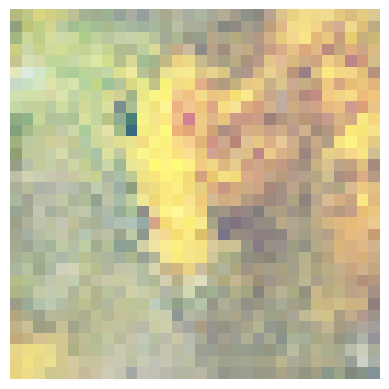

Epoch 2171/2500
Generator loss: 1.1319410800933838, Discriminator loss: 1.1107008457183838
Epoch 2172/2500
Generator loss: 1.2563297748565674, Discriminator loss: 0.9731011986732483
Epoch 2173/2500
Generator loss: 1.1670162677764893, Discriminator loss: 1.048426866531372
Epoch 2174/2500
Generator loss: 1.2343263626098633, Discriminator loss: 1.0045859813690186
Epoch 2175/2500
Generator loss: 1.1698246002197266, Discriminator loss: 1.0406265258789062
Epoch 2176/2500
Generator loss: 1.1665523052215576, Discriminator loss: 1.101603388786316
Epoch 2177/2500
Generator loss: 1.163399577140808, Discriminator loss: 1.0101797580718994
Epoch 2178/2500
Generator loss: 1.146907925605774, Discriminator loss: 1.1055582761764526
Epoch 2179/2500
Generator loss: 1.1103383302688599, Discriminator loss: 1.0815798044204712
Epoch 2180/2500
Generator loss: 1.1955571174621582, Discriminator loss: 1.0259301662445068


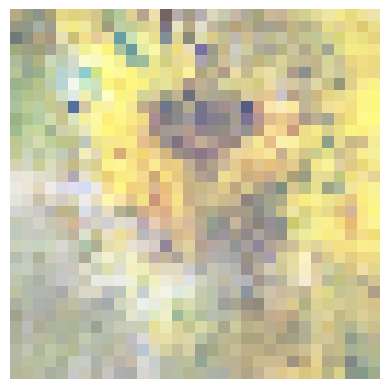

Epoch 2181/2500
Generator loss: 1.1975994110107422, Discriminator loss: 1.020442008972168
Epoch 2182/2500
Generator loss: 1.218948483467102, Discriminator loss: 1.0575975179672241
Epoch 2183/2500
Generator loss: 1.136556625366211, Discriminator loss: 1.0935546159744263
Epoch 2184/2500
Generator loss: 1.179866909980774, Discriminator loss: 1.0911078453063965
Epoch 2185/2500
Generator loss: 1.1673108339309692, Discriminator loss: 1.0498392581939697
Epoch 2186/2500
Generator loss: 1.2044365406036377, Discriminator loss: 1.014165997505188
Epoch 2187/2500
Generator loss: 1.2130188941955566, Discriminator loss: 1.1004210710525513
Epoch 2188/2500
Generator loss: 1.1560622453689575, Discriminator loss: 1.1068209409713745
Epoch 2189/2500
Generator loss: 1.1691837310791016, Discriminator loss: 1.0593663454055786
Epoch 2190/2500
Generator loss: 1.2252593040466309, Discriminator loss: 0.9864714741706848


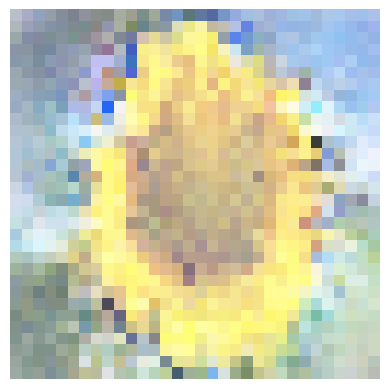

Epoch 2191/2500
Generator loss: 1.1978321075439453, Discriminator loss: 1.1625382900238037
Epoch 2192/2500
Generator loss: 1.1402506828308105, Discriminator loss: 1.0595448017120361
Epoch 2193/2500
Generator loss: 1.1654839515686035, Discriminator loss: 1.0920946598052979
Epoch 2194/2500
Generator loss: 1.2026987075805664, Discriminator loss: 1.0797979831695557
Epoch 2195/2500
Generator loss: 1.1644940376281738, Discriminator loss: 1.0472825765609741
Epoch 2196/2500
Generator loss: 1.0964049100875854, Discriminator loss: 1.1117479801177979
Epoch 2197/2500
Generator loss: 1.1985349655151367, Discriminator loss: 1.0762996673583984
Epoch 2198/2500
Generator loss: 1.2410216331481934, Discriminator loss: 1.0483758449554443
Epoch 2199/2500
Generator loss: 1.151508092880249, Discriminator loss: 1.0913654565811157
Epoch 2200/2500
Generator loss: 1.1478760242462158, Discriminator loss: 1.0605353116989136


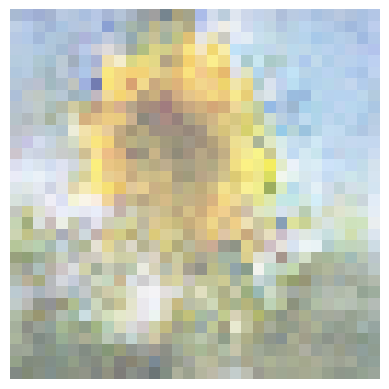

Epoch 2201/2500
Generator loss: 1.139575481414795, Discriminator loss: 1.0748590230941772
Epoch 2202/2500
Generator loss: 1.167670726776123, Discriminator loss: 1.0451263189315796
Epoch 2203/2500
Generator loss: 1.213634967803955, Discriminator loss: 1.0006468296051025
Epoch 2204/2500
Generator loss: 1.1571482419967651, Discriminator loss: 1.0802216529846191
Epoch 2205/2500
Generator loss: 1.1804935932159424, Discriminator loss: 1.0604221820831299
Epoch 2206/2500
Generator loss: 1.243104338645935, Discriminator loss: 1.004743218421936
Epoch 2207/2500
Generator loss: 1.1802383661270142, Discriminator loss: 1.126968502998352
Epoch 2208/2500
Generator loss: 1.162890911102295, Discriminator loss: 1.0797375440597534
Epoch 2209/2500
Generator loss: 1.1050347089767456, Discriminator loss: 1.117211937904358
Epoch 2210/2500
Generator loss: 1.1878063678741455, Discriminator loss: 1.0773414373397827


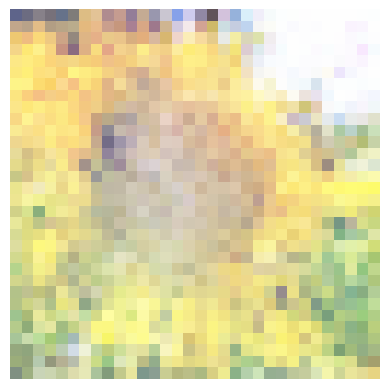

Epoch 2211/2500
Generator loss: 1.1760692596435547, Discriminator loss: 1.0349124670028687
Epoch 2212/2500
Generator loss: 1.167077898979187, Discriminator loss: 1.0079752206802368
Epoch 2213/2500
Generator loss: 1.1313371658325195, Discriminator loss: 1.0912506580352783
Epoch 2214/2500
Generator loss: 1.1799317598342896, Discriminator loss: 1.0560358762741089
Epoch 2215/2500
Generator loss: 1.222252368927002, Discriminator loss: 1.027918815612793
Epoch 2216/2500
Generator loss: 1.127922773361206, Discriminator loss: 1.073328971862793
Epoch 2217/2500
Generator loss: 1.1784217357635498, Discriminator loss: 1.028024673461914
Epoch 2218/2500
Generator loss: 1.0931960344314575, Discriminator loss: 1.1420716047286987
Epoch 2219/2500
Generator loss: 1.1993597745895386, Discriminator loss: 1.0138548612594604
Epoch 2220/2500
Generator loss: 1.1832680702209473, Discriminator loss: 1.051944613456726


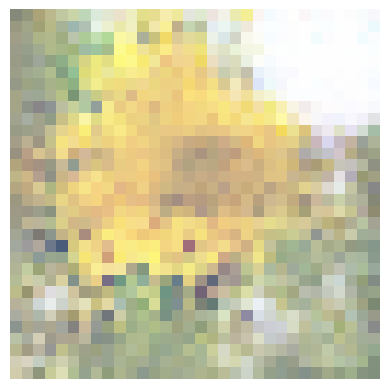

Epoch 2221/2500
Generator loss: 1.1268672943115234, Discriminator loss: 1.1112297773361206
Epoch 2222/2500
Generator loss: 1.1803780794143677, Discriminator loss: 1.0537519454956055
Epoch 2223/2500
Generator loss: 1.1917957067489624, Discriminator loss: 1.1084072589874268
Epoch 2224/2500
Generator loss: 1.167333960533142, Discriminator loss: 1.0613564252853394
Epoch 2225/2500
Generator loss: 1.2342720031738281, Discriminator loss: 0.987525463104248
Epoch 2226/2500
Generator loss: 1.1675978899002075, Discriminator loss: 1.0207105875015259
Epoch 2227/2500
Generator loss: 1.1483981609344482, Discriminator loss: 1.0945656299591064
Epoch 2228/2500
Generator loss: 1.2281659841537476, Discriminator loss: 1.0085140466690063
Epoch 2229/2500
Generator loss: 1.159737467765808, Discriminator loss: 1.087691307067871
Epoch 2230/2500
Generator loss: 1.1907157897949219, Discriminator loss: 1.0821690559387207


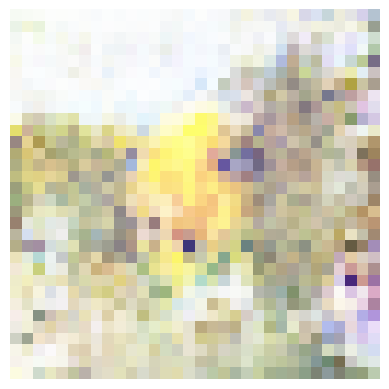

Epoch 2231/2500
Generator loss: 1.2546863555908203, Discriminator loss: 1.041070818901062
Epoch 2232/2500
Generator loss: 1.1640770435333252, Discriminator loss: 1.0630666017532349
Epoch 2233/2500
Generator loss: 1.1962778568267822, Discriminator loss: 1.0201977491378784
Epoch 2234/2500
Generator loss: 1.2557337284088135, Discriminator loss: 1.026362657546997
Epoch 2235/2500
Generator loss: 1.1190471649169922, Discriminator loss: 1.092774510383606
Epoch 2236/2500
Generator loss: 1.1683987379074097, Discriminator loss: 1.0251091718673706
Epoch 2237/2500
Generator loss: 1.1920862197875977, Discriminator loss: 1.0049973726272583
Epoch 2238/2500
Generator loss: 1.2431915998458862, Discriminator loss: 1.033072590827942
Epoch 2239/2500
Generator loss: 1.201934576034546, Discriminator loss: 1.04487943649292
Epoch 2240/2500
Generator loss: 1.168171763420105, Discriminator loss: 1.0800658464431763


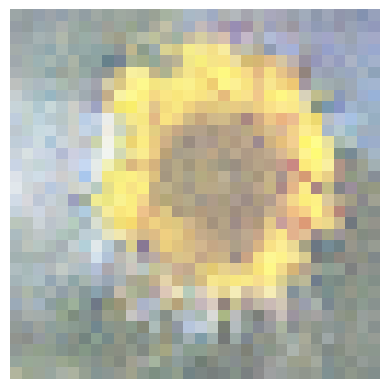

Epoch 2241/2500
Generator loss: 1.2067668437957764, Discriminator loss: 1.0934756994247437
Epoch 2242/2500
Generator loss: 1.2146424055099487, Discriminator loss: 0.9945080876350403
Epoch 2243/2500
Generator loss: 1.2062357664108276, Discriminator loss: 1.0502550601959229
Epoch 2244/2500
Generator loss: 1.159595012664795, Discriminator loss: 1.1100037097930908
Epoch 2245/2500
Generator loss: 1.1849393844604492, Discriminator loss: 1.0383154153823853
Epoch 2246/2500
Generator loss: 1.1652494668960571, Discriminator loss: 1.080857515335083
Epoch 2247/2500
Generator loss: 1.2352442741394043, Discriminator loss: 0.9888024926185608
Epoch 2248/2500
Generator loss: 1.2342568635940552, Discriminator loss: 1.1112204790115356
Epoch 2249/2500
Generator loss: 1.1855031251907349, Discriminator loss: 1.0675995349884033
Epoch 2250/2500
Generator loss: 1.1389964818954468, Discriminator loss: 1.0421055555343628


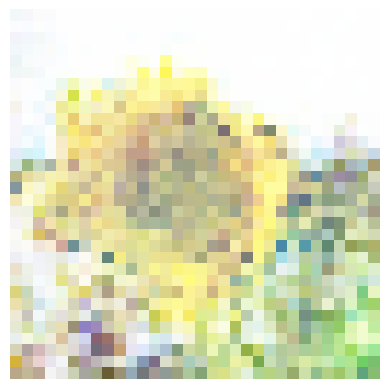

Epoch 2251/2500
Generator loss: 1.2167742252349854, Discriminator loss: 1.0255610942840576
Epoch 2252/2500
Generator loss: 1.2375335693359375, Discriminator loss: 0.9777118563652039
Epoch 2253/2500
Generator loss: 1.1529027223587036, Discriminator loss: 1.0600999593734741
Epoch 2254/2500
Generator loss: 1.1579632759094238, Discriminator loss: 1.05721116065979
Epoch 2255/2500
Generator loss: 1.206870675086975, Discriminator loss: 1.0367685556411743
Epoch 2256/2500
Generator loss: 1.2206100225448608, Discriminator loss: 1.0441956520080566
Epoch 2257/2500
Generator loss: 1.2594428062438965, Discriminator loss: 0.9808230400085449
Epoch 2258/2500
Generator loss: 1.1867244243621826, Discriminator loss: 1.089011311531067
Epoch 2259/2500
Generator loss: 1.2250453233718872, Discriminator loss: 1.07000732421875
Epoch 2260/2500
Generator loss: 1.1855144500732422, Discriminator loss: 1.0656378269195557


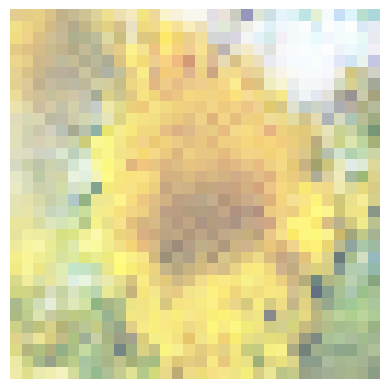

Epoch 2261/2500
Generator loss: 1.2145441770553589, Discriminator loss: 1.0471091270446777
Epoch 2262/2500
Generator loss: 1.2269231081008911, Discriminator loss: 1.0208882093429565
Epoch 2263/2500
Generator loss: 1.1350404024124146, Discriminator loss: 1.117108941078186
Epoch 2264/2500
Generator loss: 1.2734724283218384, Discriminator loss: 1.0534892082214355
Epoch 2265/2500
Generator loss: 1.2356724739074707, Discriminator loss: 0.9790210127830505
Epoch 2266/2500
Generator loss: 1.1985777616500854, Discriminator loss: 1.036258578300476
Epoch 2267/2500
Generator loss: 1.1713309288024902, Discriminator loss: 1.0668200254440308
Epoch 2268/2500
Generator loss: 1.2082805633544922, Discriminator loss: 1.015942931175232
Epoch 2269/2500
Generator loss: 1.22170090675354, Discriminator loss: 1.040110468864441
Epoch 2270/2500
Generator loss: 1.237335205078125, Discriminator loss: 1.0335478782653809


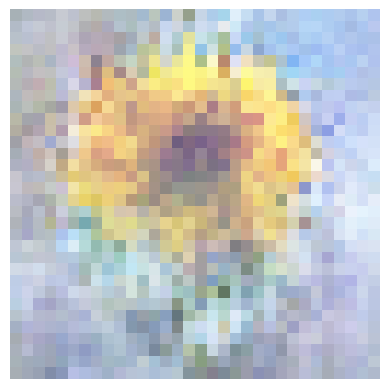

Epoch 2271/2500
Generator loss: 1.1759653091430664, Discriminator loss: 1.118282675743103
Epoch 2272/2500
Generator loss: 1.1266731023788452, Discriminator loss: 1.1166352033615112
Epoch 2273/2500
Generator loss: 1.1921956539154053, Discriminator loss: 1.0406575202941895
Epoch 2274/2500
Generator loss: 1.197707176208496, Discriminator loss: 1.0407785177230835
Epoch 2275/2500
Generator loss: 1.184041976928711, Discriminator loss: 1.0425093173980713
Epoch 2276/2500
Generator loss: 1.199853777885437, Discriminator loss: 1.0896315574645996
Epoch 2277/2500
Generator loss: 1.1971797943115234, Discriminator loss: 1.0796093940734863
Epoch 2278/2500
Generator loss: 1.227197527885437, Discriminator loss: 1.0407203435897827
Epoch 2279/2500
Generator loss: 1.1849461793899536, Discriminator loss: 1.0386648178100586
Epoch 2280/2500
Generator loss: 1.2235326766967773, Discriminator loss: 1.0436981916427612


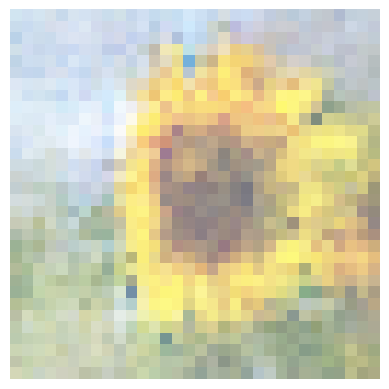

Epoch 2281/2500
Generator loss: 1.1456793546676636, Discriminator loss: 1.0782369375228882
Epoch 2282/2500
Generator loss: 1.2598298788070679, Discriminator loss: 1.0589618682861328
Epoch 2283/2500
Generator loss: 1.2091665267944336, Discriminator loss: 1.0454262495040894
Epoch 2284/2500
Generator loss: 1.1828632354736328, Discriminator loss: 1.0024499893188477
Epoch 2285/2500
Generator loss: 1.1433221101760864, Discriminator loss: 1.0808875560760498
Epoch 2286/2500
Generator loss: 1.2230945825576782, Discriminator loss: 1.032082200050354
Epoch 2287/2500
Generator loss: 1.1538290977478027, Discriminator loss: 1.046461582183838
Epoch 2288/2500
Generator loss: 1.1853400468826294, Discriminator loss: 1.0339661836624146
Epoch 2289/2500
Generator loss: 1.1924916505813599, Discriminator loss: 1.0378700494766235
Epoch 2290/2500
Generator loss: 1.1727055311203003, Discriminator loss: 1.0492067337036133


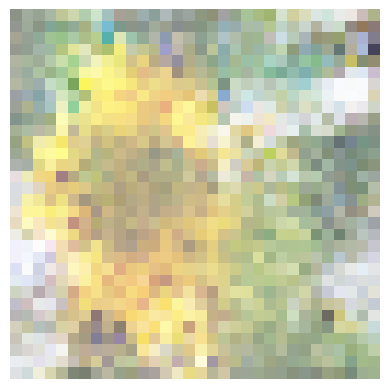

Epoch 2291/2500
Generator loss: 1.140879511833191, Discriminator loss: 1.0804848670959473
Epoch 2292/2500
Generator loss: 1.2040008306503296, Discriminator loss: 1.0698542594909668
Epoch 2293/2500
Generator loss: 1.1918163299560547, Discriminator loss: 1.0619089603424072
Epoch 2294/2500
Generator loss: 1.1830984354019165, Discriminator loss: 1.0564899444580078
Epoch 2295/2500
Generator loss: 1.217871904373169, Discriminator loss: 1.053208827972412
Epoch 2296/2500
Generator loss: 1.1732770204544067, Discriminator loss: 1.039788842201233
Epoch 2297/2500
Generator loss: 1.2105635404586792, Discriminator loss: 1.043030023574829
Epoch 2298/2500
Generator loss: 1.134878158569336, Discriminator loss: 1.0812956094741821
Epoch 2299/2500
Generator loss: 1.1912039518356323, Discriminator loss: 1.0314490795135498
Epoch 2300/2500
Generator loss: 1.2101234197616577, Discriminator loss: 1.0382084846496582


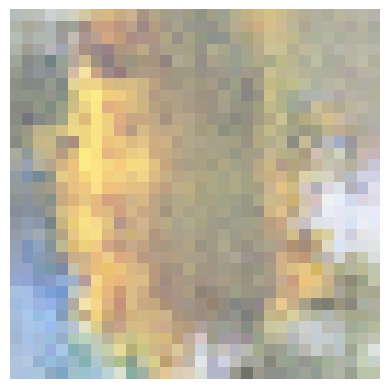

Epoch 2301/2500
Generator loss: 1.2517914772033691, Discriminator loss: 0.9825316667556763
Epoch 2302/2500
Generator loss: 1.2014731168746948, Discriminator loss: 1.0327789783477783
Epoch 2303/2500
Generator loss: 1.163467526435852, Discriminator loss: 1.0595051050186157
Epoch 2304/2500
Generator loss: 1.2539119720458984, Discriminator loss: 1.0114388465881348
Epoch 2305/2500
Generator loss: 1.1478278636932373, Discriminator loss: 1.1164177656173706
Epoch 2306/2500
Generator loss: 1.3150038719177246, Discriminator loss: 0.981209397315979
Epoch 2307/2500
Generator loss: 1.1456315517425537, Discriminator loss: 1.083739161491394
Epoch 2308/2500
Generator loss: 1.2920159101486206, Discriminator loss: 1.0088549852371216
Epoch 2309/2500
Generator loss: 1.1592342853546143, Discriminator loss: 1.105508804321289
Epoch 2310/2500
Generator loss: 1.2127848863601685, Discriminator loss: 1.0785292387008667


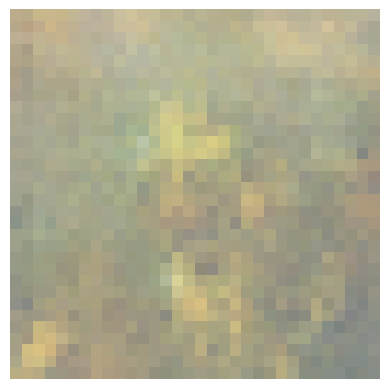

Epoch 2311/2500
Generator loss: 1.2122550010681152, Discriminator loss: 1.0409382581710815
Epoch 2312/2500
Generator loss: 1.130691409111023, Discriminator loss: 1.0743614435195923
Epoch 2313/2500
Generator loss: 1.1616966724395752, Discriminator loss: 1.0281307697296143
Epoch 2314/2500
Generator loss: 1.2149959802627563, Discriminator loss: 1.0566397905349731
Epoch 2315/2500
Generator loss: 1.180908203125, Discriminator loss: 1.0915122032165527
Epoch 2316/2500
Generator loss: 1.194070816040039, Discriminator loss: 1.0379890203475952
Epoch 2317/2500
Generator loss: 1.1599280834197998, Discriminator loss: 1.0452810525894165
Epoch 2318/2500
Generator loss: 1.1591689586639404, Discriminator loss: 1.0993316173553467
Epoch 2319/2500
Generator loss: 1.223004698753357, Discriminator loss: 0.9987930655479431
Epoch 2320/2500
Generator loss: 1.0914446115493774, Discriminator loss: 1.1571811437606812


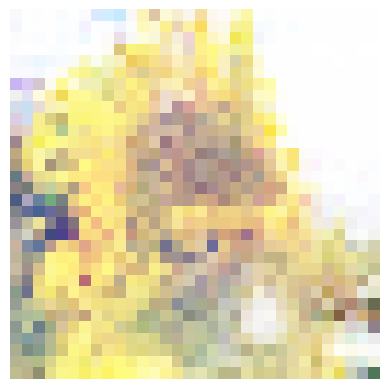

Epoch 2321/2500
Generator loss: 1.247664451599121, Discriminator loss: 0.9999608397483826
Epoch 2322/2500
Generator loss: 1.1568201780319214, Discriminator loss: 1.039005994796753
Epoch 2323/2500
Generator loss: 1.2359215021133423, Discriminator loss: 1.0126007795333862
Epoch 2324/2500
Generator loss: 1.1439684629440308, Discriminator loss: 1.0546563863754272
Epoch 2325/2500
Generator loss: 1.1661444902420044, Discriminator loss: 1.1269340515136719
Epoch 2326/2500
Generator loss: 1.2247014045715332, Discriminator loss: 1.000123381614685
Epoch 2327/2500
Generator loss: 1.2033108472824097, Discriminator loss: 1.0490156412124634
Epoch 2328/2500
Generator loss: 1.1665332317352295, Discriminator loss: 1.0924490690231323
Epoch 2329/2500
Generator loss: 1.170159935951233, Discriminator loss: 1.033495306968689
Epoch 2330/2500
Generator loss: 1.259564757347107, Discriminator loss: 0.9854177832603455


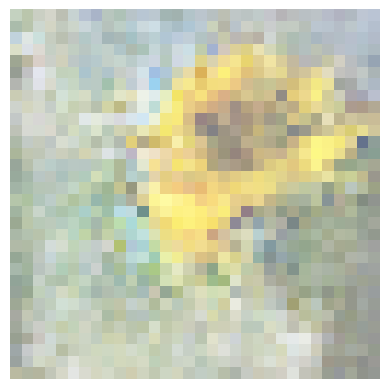

Epoch 2331/2500
Generator loss: 1.1387052536010742, Discriminator loss: 1.1044762134552002
Epoch 2332/2500
Generator loss: 1.239748239517212, Discriminator loss: 1.0130105018615723
Epoch 2333/2500
Generator loss: 1.1776154041290283, Discriminator loss: 1.0871927738189697
Epoch 2334/2500
Generator loss: 1.1756269931793213, Discriminator loss: 1.0929096937179565
Epoch 2335/2500
Generator loss: 1.2296030521392822, Discriminator loss: 1.001613736152649
Epoch 2336/2500
Generator loss: 1.2945712804794312, Discriminator loss: 1.0018912553787231
Epoch 2337/2500
Generator loss: 1.1601169109344482, Discriminator loss: 1.040604591369629
Epoch 2338/2500
Generator loss: 1.21982741355896, Discriminator loss: 1.0369527339935303
Epoch 2339/2500
Generator loss: 1.244287133216858, Discriminator loss: 0.9632295370101929
Epoch 2340/2500
Generator loss: 1.2061288356781006, Discriminator loss: 1.0241764783859253


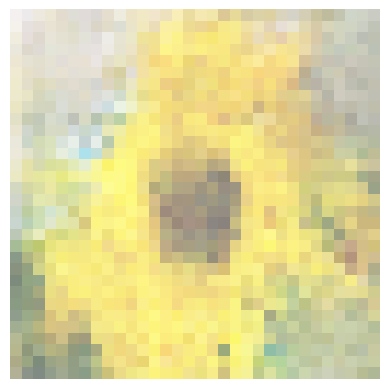

Epoch 2341/2500
Generator loss: 1.2297146320343018, Discriminator loss: 1.0139601230621338
Epoch 2342/2500
Generator loss: 1.2181518077850342, Discriminator loss: 1.0486997365951538
Epoch 2343/2500
Generator loss: 1.1994620561599731, Discriminator loss: 1.0407052040100098
Epoch 2344/2500
Generator loss: 1.241738200187683, Discriminator loss: 1.1312923431396484
Epoch 2345/2500
Generator loss: 1.2210252285003662, Discriminator loss: 1.0260810852050781
Epoch 2346/2500
Generator loss: 1.162182331085205, Discriminator loss: 1.1166269779205322
Epoch 2347/2500
Generator loss: 1.2630029916763306, Discriminator loss: 0.9978881478309631
Epoch 2348/2500
Generator loss: 1.2414745092391968, Discriminator loss: 1.0574322938919067
Epoch 2349/2500
Generator loss: 1.1918656826019287, Discriminator loss: 1.0245425701141357
Epoch 2350/2500
Generator loss: 1.1772242784500122, Discriminator loss: 1.03004789352417


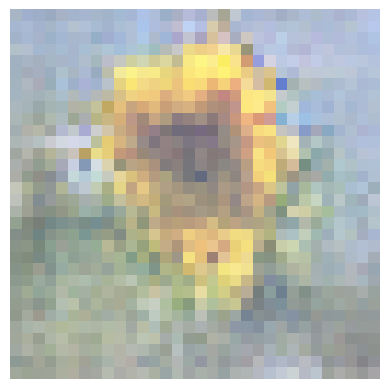

Epoch 2351/2500
Generator loss: 1.2586679458618164, Discriminator loss: 0.989529013633728
Epoch 2352/2500
Generator loss: 1.2248307466506958, Discriminator loss: 1.0347002744674683
Epoch 2353/2500
Generator loss: 1.2299728393554688, Discriminator loss: 1.0512731075286865
Epoch 2354/2500
Generator loss: 1.2966856956481934, Discriminator loss: 0.9395060539245605
Epoch 2355/2500
Generator loss: 1.1961405277252197, Discriminator loss: 1.0926029682159424
Epoch 2356/2500
Generator loss: 1.181339144706726, Discriminator loss: 1.083236575126648
Epoch 2357/2500
Generator loss: 1.2835880517959595, Discriminator loss: 0.990098774433136
Epoch 2358/2500
Generator loss: 1.2235124111175537, Discriminator loss: 1.048727035522461
Epoch 2359/2500
Generator loss: 1.2350788116455078, Discriminator loss: 1.0439099073410034
Epoch 2360/2500
Generator loss: 1.2287733554840088, Discriminator loss: 1.0166033506393433


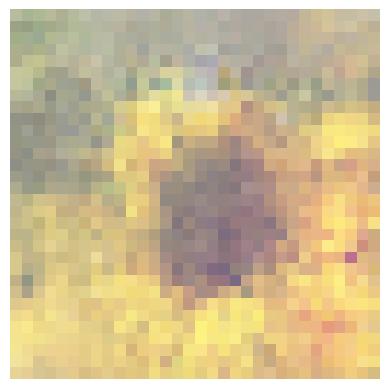

Epoch 2361/2500
Generator loss: 1.2609806060791016, Discriminator loss: 1.0676980018615723
Epoch 2362/2500
Generator loss: 1.1970032453536987, Discriminator loss: 1.0701968669891357
Epoch 2363/2500
Generator loss: 1.2774207592010498, Discriminator loss: 1.047126054763794
Epoch 2364/2500
Generator loss: 1.2260608673095703, Discriminator loss: 0.9676051139831543
Epoch 2365/2500
Generator loss: 1.189437747001648, Discriminator loss: 1.037939429283142
Epoch 2366/2500
Generator loss: 1.172984004020691, Discriminator loss: 1.0847970247268677
Epoch 2367/2500
Generator loss: 1.369170904159546, Discriminator loss: 1.0154194831848145
Epoch 2368/2500
Generator loss: 1.2649128437042236, Discriminator loss: 0.9998958706855774
Epoch 2369/2500
Generator loss: 1.2505688667297363, Discriminator loss: 1.0248421430587769
Epoch 2370/2500
Generator loss: 1.1579227447509766, Discriminator loss: 1.135028600692749


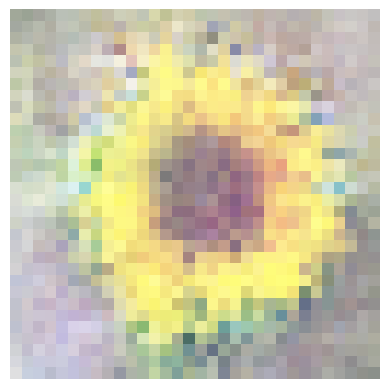

Epoch 2371/2500
Generator loss: 1.2891583442687988, Discriminator loss: 0.9770194292068481
Epoch 2372/2500
Generator loss: 1.1939070224761963, Discriminator loss: 1.0268776416778564
Epoch 2373/2500
Generator loss: 1.2249592542648315, Discriminator loss: 1.0472934246063232
Epoch 2374/2500
Generator loss: 1.2467118501663208, Discriminator loss: 1.0119380950927734
Epoch 2375/2500
Generator loss: 1.2369993925094604, Discriminator loss: 0.9588509202003479
Epoch 2376/2500
Generator loss: 1.2266710996627808, Discriminator loss: 1.0093801021575928
Epoch 2377/2500
Generator loss: 1.2401070594787598, Discriminator loss: 1.0005096197128296
Epoch 2378/2500
Generator loss: 1.2009913921356201, Discriminator loss: 1.1020632982254028
Epoch 2379/2500
Generator loss: 1.233547329902649, Discriminator loss: 1.0235326290130615
Epoch 2380/2500
Generator loss: 1.2179174423217773, Discriminator loss: 1.0665334463119507


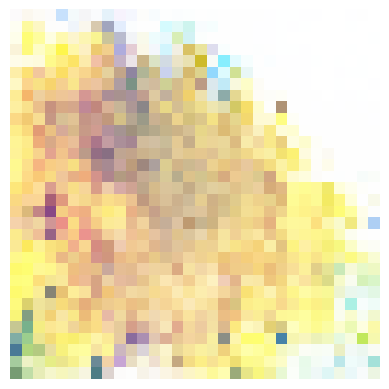

Epoch 2381/2500
Generator loss: 1.1965603828430176, Discriminator loss: 1.0205720663070679
Epoch 2382/2500
Generator loss: 1.2676655054092407, Discriminator loss: 1.0115511417388916
Epoch 2383/2500
Generator loss: 1.1881424188613892, Discriminator loss: 1.0609533786773682
Epoch 2384/2500
Generator loss: 1.2101367712020874, Discriminator loss: 1.046115517616272
Epoch 2385/2500
Generator loss: 1.2016096115112305, Discriminator loss: 1.0383836030960083
Epoch 2386/2500
Generator loss: 1.199238657951355, Discriminator loss: 0.9949975609779358
Epoch 2387/2500
Generator loss: 1.1888056993484497, Discriminator loss: 1.0401530265808105
Epoch 2388/2500
Generator loss: 1.1582776308059692, Discriminator loss: 1.049113154411316
Epoch 2389/2500
Generator loss: 1.2979328632354736, Discriminator loss: 0.9385597109794617
Epoch 2390/2500
Generator loss: 1.253926396369934, Discriminator loss: 1.0433088541030884


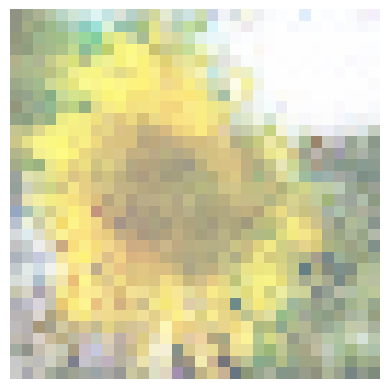

Epoch 2391/2500
Generator loss: 1.2090160846710205, Discriminator loss: 1.0523368120193481
Epoch 2392/2500
Generator loss: 1.2042649984359741, Discriminator loss: 1.0397452116012573
Epoch 2393/2500
Generator loss: 1.2947461605072021, Discriminator loss: 1.0369439125061035
Epoch 2394/2500
Generator loss: 1.215178370475769, Discriminator loss: 1.0629677772521973
Epoch 2395/2500
Generator loss: 1.1951277256011963, Discriminator loss: 1.053269386291504
Epoch 2396/2500
Generator loss: 1.2306914329528809, Discriminator loss: 0.9763574600219727
Epoch 2397/2500
Generator loss: 1.1926014423370361, Discriminator loss: 1.0419849157333374
Epoch 2398/2500
Generator loss: 1.173200249671936, Discriminator loss: 1.0998116731643677
Epoch 2399/2500
Generator loss: 1.2851980924606323, Discriminator loss: 1.008705973625183
Epoch 2400/2500
Generator loss: 1.174926519393921, Discriminator loss: 1.1007745265960693


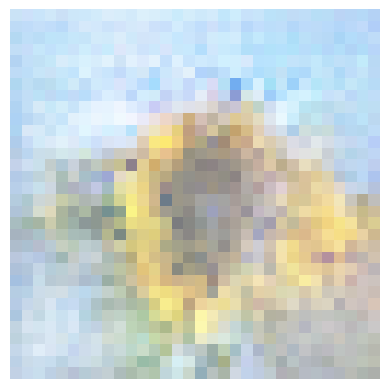

Epoch 2401/2500
Generator loss: 1.2496076822280884, Discriminator loss: 1.0507047176361084
Epoch 2402/2500
Generator loss: 1.124961256980896, Discriminator loss: 1.0983753204345703
Epoch 2403/2500
Generator loss: 1.2343448400497437, Discriminator loss: 1.0293163061141968
Epoch 2404/2500
Generator loss: 1.2107011079788208, Discriminator loss: 1.0345743894577026
Epoch 2405/2500
Generator loss: 1.2062684297561646, Discriminator loss: 1.1258448362350464
Epoch 2406/2500
Generator loss: 1.233073115348816, Discriminator loss: 0.9839265942573547
Epoch 2407/2500
Generator loss: 1.1698861122131348, Discriminator loss: 1.0543169975280762
Epoch 2408/2500
Generator loss: 1.271748423576355, Discriminator loss: 0.9952096939086914
Epoch 2409/2500
Generator loss: 1.1880096197128296, Discriminator loss: 1.0959110260009766
Epoch 2410/2500
Generator loss: 1.3229634761810303, Discriminator loss: 1.0317668914794922


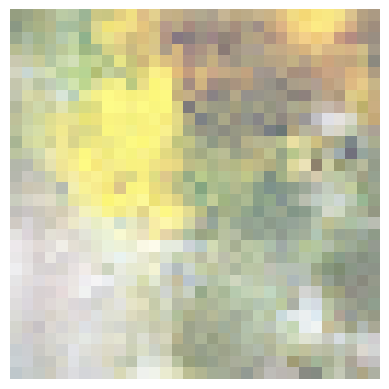

Epoch 2411/2500
Generator loss: 1.1543982028961182, Discriminator loss: 1.0667507648468018
Epoch 2412/2500
Generator loss: 1.2364434003829956, Discriminator loss: 0.996149480342865
Epoch 2413/2500
Generator loss: 1.2717514038085938, Discriminator loss: 0.9567098021507263
Epoch 2414/2500
Generator loss: 1.1851820945739746, Discriminator loss: 1.0894941091537476
Epoch 2415/2500
Generator loss: 1.218567132949829, Discriminator loss: 1.0239579677581787
Epoch 2416/2500
Generator loss: 1.1159288883209229, Discriminator loss: 1.1088454723358154
Epoch 2417/2500
Generator loss: 1.2580417394638062, Discriminator loss: 1.07651686668396
Epoch 2418/2500
Generator loss: 1.183527946472168, Discriminator loss: 1.054818868637085
Epoch 2419/2500
Generator loss: 1.204158067703247, Discriminator loss: 1.044655680656433
Epoch 2420/2500
Generator loss: 1.2120295763015747, Discriminator loss: 1.0004678964614868


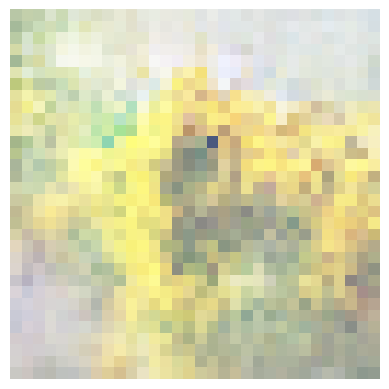

Epoch 2421/2500
Generator loss: 1.2637996673583984, Discriminator loss: 0.9760845303535461
Epoch 2422/2500
Generator loss: 1.2009823322296143, Discriminator loss: 1.0630263090133667
Epoch 2423/2500
Generator loss: 1.1865895986557007, Discriminator loss: 1.033287763595581
Epoch 2424/2500
Generator loss: 1.2264177799224854, Discriminator loss: 1.0484894514083862
Epoch 2425/2500
Generator loss: 1.2420368194580078, Discriminator loss: 1.0198572874069214
Epoch 2426/2500
Generator loss: 1.208553671836853, Discriminator loss: 1.0632195472717285
Epoch 2427/2500
Generator loss: 1.201696515083313, Discriminator loss: 1.0095837116241455
Epoch 2428/2500
Generator loss: 1.262474536895752, Discriminator loss: 1.0122545957565308
Epoch 2429/2500
Generator loss: 1.2358628511428833, Discriminator loss: 1.0544968843460083
Epoch 2430/2500
Generator loss: 1.2400898933410645, Discriminator loss: 1.0055018663406372


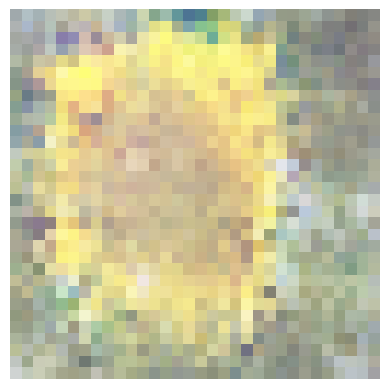

Epoch 2431/2500
Generator loss: 1.2033723592758179, Discriminator loss: 1.0530873537063599
Epoch 2432/2500
Generator loss: 1.2160130739212036, Discriminator loss: 0.9745131731033325
Epoch 2433/2500
Generator loss: 1.2674084901809692, Discriminator loss: 1.0205084085464478
Epoch 2434/2500
Generator loss: 1.2086753845214844, Discriminator loss: 1.0210052728652954
Epoch 2435/2500
Generator loss: 1.2031875848770142, Discriminator loss: 1.0324509143829346
Epoch 2436/2500
Generator loss: 1.171880841255188, Discriminator loss: 1.0638501644134521
Epoch 2437/2500
Generator loss: 1.293233871459961, Discriminator loss: 0.9771414995193481
Epoch 2438/2500
Generator loss: 1.1466397047042847, Discriminator loss: 1.141080617904663
Epoch 2439/2500
Generator loss: 1.2239010334014893, Discriminator loss: 0.9776093363761902
Epoch 2440/2500
Generator loss: 1.2118946313858032, Discriminator loss: 1.0136972665786743


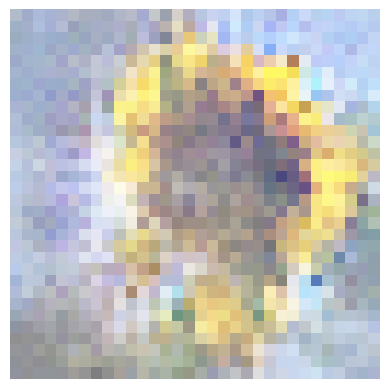

Epoch 2441/2500
Generator loss: 1.1950266361236572, Discriminator loss: 1.0635148286819458
Epoch 2442/2500
Generator loss: 1.2417548894882202, Discriminator loss: 0.9972091317176819
Epoch 2443/2500
Generator loss: 1.2242084741592407, Discriminator loss: 1.091435432434082
Epoch 2444/2500
Generator loss: 1.185573935508728, Discriminator loss: 1.0475404262542725
Epoch 2445/2500
Generator loss: 1.232979416847229, Discriminator loss: 1.0213475227355957
Epoch 2446/2500
Generator loss: 1.2209676504135132, Discriminator loss: 1.0065017938613892
Epoch 2447/2500
Generator loss: 1.267210841178894, Discriminator loss: 1.0759215354919434
Epoch 2448/2500
Generator loss: 1.2121646404266357, Discriminator loss: 1.0400660037994385
Epoch 2449/2500
Generator loss: 1.1969494819641113, Discriminator loss: 1.0577706098556519
Epoch 2450/2500
Generator loss: 1.2959768772125244, Discriminator loss: 0.9950966238975525


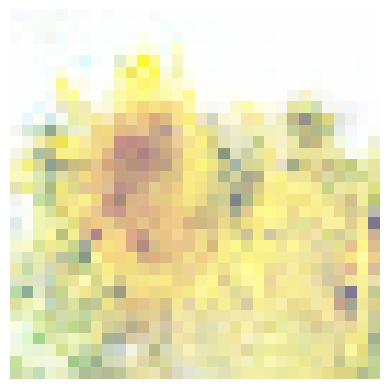

Epoch 2451/2500
Generator loss: 1.1988335847854614, Discriminator loss: 1.0706605911254883
Epoch 2452/2500
Generator loss: 1.241236925125122, Discriminator loss: 0.9998021125793457
Epoch 2453/2500
Generator loss: 1.198903203010559, Discriminator loss: 1.0481488704681396
Epoch 2454/2500
Generator loss: 1.1465498208999634, Discriminator loss: 1.1465238332748413
Epoch 2455/2500
Generator loss: 1.251940369606018, Discriminator loss: 1.00375235080719
Epoch 2456/2500
Generator loss: 1.2185832262039185, Discriminator loss: 0.984290361404419
Epoch 2457/2500
Generator loss: 1.1725889444351196, Discriminator loss: 1.0289349555969238
Epoch 2458/2500
Generator loss: 1.1780312061309814, Discriminator loss: 1.0805330276489258
Epoch 2459/2500
Generator loss: 1.2418025732040405, Discriminator loss: 1.0724323987960815
Epoch 2460/2500
Generator loss: 1.2545969486236572, Discriminator loss: 1.0129833221435547


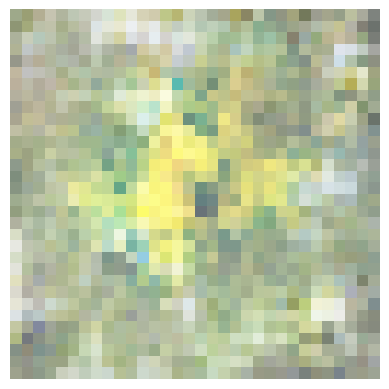

Epoch 2461/2500
Generator loss: 1.19867742061615, Discriminator loss: 1.0305304527282715
Epoch 2462/2500
Generator loss: 1.1962758302688599, Discriminator loss: 1.0598411560058594
Epoch 2463/2500
Generator loss: 1.1367448568344116, Discriminator loss: 1.0943176746368408
Epoch 2464/2500
Generator loss: 1.1654495000839233, Discriminator loss: 1.064131736755371
Epoch 2465/2500
Generator loss: 1.2277326583862305, Discriminator loss: 1.0707035064697266
Epoch 2466/2500
Generator loss: 1.2220937013626099, Discriminator loss: 1.0237176418304443
Epoch 2467/2500
Generator loss: 1.2124131917953491, Discriminator loss: 1.075913429260254
Epoch 2468/2500
Generator loss: 1.178740382194519, Discriminator loss: 1.044312834739685
Epoch 2469/2500
Generator loss: 1.2109326124191284, Discriminator loss: 1.0435162782669067
Epoch 2470/2500
Generator loss: 1.2639505863189697, Discriminator loss: 1.0050057172775269


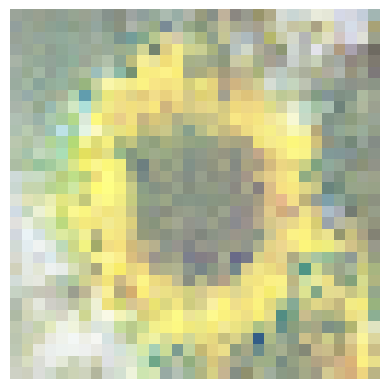

Epoch 2471/2500
Generator loss: 1.2440145015716553, Discriminator loss: 1.030121922492981
Epoch 2472/2500
Generator loss: 1.182796835899353, Discriminator loss: 1.0316121578216553
Epoch 2473/2500
Generator loss: 1.2310494184494019, Discriminator loss: 1.0421990156173706
Epoch 2474/2500
Generator loss: 1.1966526508331299, Discriminator loss: 1.0667024850845337
Epoch 2475/2500
Generator loss: 1.2107741832733154, Discriminator loss: 1.0348182916641235
Epoch 2476/2500
Generator loss: 1.2189562320709229, Discriminator loss: 1.0285522937774658
Epoch 2477/2500
Generator loss: 1.1698498725891113, Discriminator loss: 1.072011947631836
Epoch 2478/2500
Generator loss: 1.1466060876846313, Discriminator loss: 1.0624374151229858
Epoch 2479/2500
Generator loss: 1.255458950996399, Discriminator loss: 0.9980518221855164
Epoch 2480/2500
Generator loss: 1.264042854309082, Discriminator loss: 0.9946856498718262


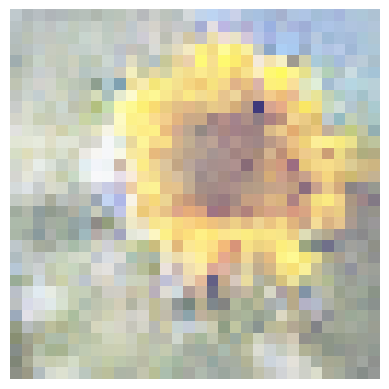

Epoch 2481/2500
Generator loss: 1.1681040525436401, Discriminator loss: 1.0751056671142578
Epoch 2482/2500
Generator loss: 1.2537685632705688, Discriminator loss: 0.9876871705055237
Epoch 2483/2500
Generator loss: 1.2182334661483765, Discriminator loss: 1.0446339845657349
Epoch 2484/2500
Generator loss: 1.1985517740249634, Discriminator loss: 1.0558291673660278
Epoch 2485/2500
Generator loss: 1.2709355354309082, Discriminator loss: 1.0188554525375366
Epoch 2486/2500
Generator loss: 1.1673310995101929, Discriminator loss: 1.056838035583496
Epoch 2487/2500
Generator loss: 1.247169852256775, Discriminator loss: 1.041441559791565
Epoch 2488/2500
Generator loss: 1.2716697454452515, Discriminator loss: 1.0010894536972046
Epoch 2489/2500
Generator loss: 1.2170597314834595, Discriminator loss: 1.020440936088562
Epoch 2490/2500
Generator loss: 1.1791168451309204, Discriminator loss: 1.0680254697799683


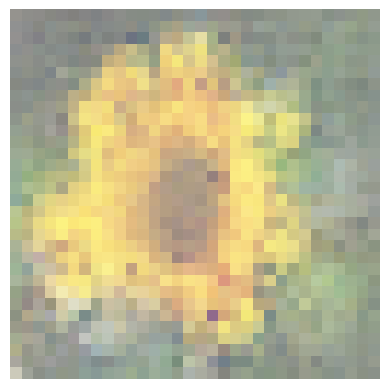

Epoch 2491/2500
Generator loss: 1.2323673963546753, Discriminator loss: 1.01923668384552
Epoch 2492/2500
Generator loss: 1.146372675895691, Discriminator loss: 1.1328983306884766
Epoch 2493/2500
Generator loss: 1.2696037292480469, Discriminator loss: 0.9567651748657227
Epoch 2494/2500
Generator loss: 1.2784305810928345, Discriminator loss: 1.0065093040466309
Epoch 2495/2500
Generator loss: 1.2615230083465576, Discriminator loss: 1.0453177690505981
Epoch 2496/2500
Generator loss: 1.2810386419296265, Discriminator loss: 1.0513111352920532
Epoch 2497/2500
Generator loss: 1.182227373123169, Discriminator loss: 1.0406690835952759
Epoch 2498/2500
Generator loss: 1.2072296142578125, Discriminator loss: 1.0341542959213257
Epoch 2499/2500
Generator loss: 1.2684144973754883, Discriminator loss: 0.9600427746772766
Epoch 2500/2500
Generator loss: 1.2398457527160645, Discriminator loss: 1.0018482208251953


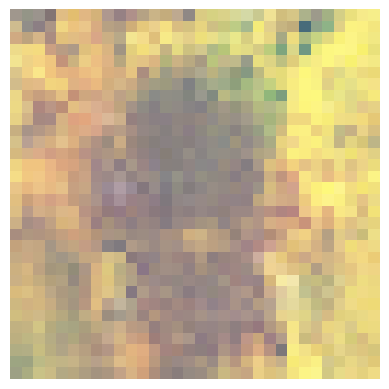

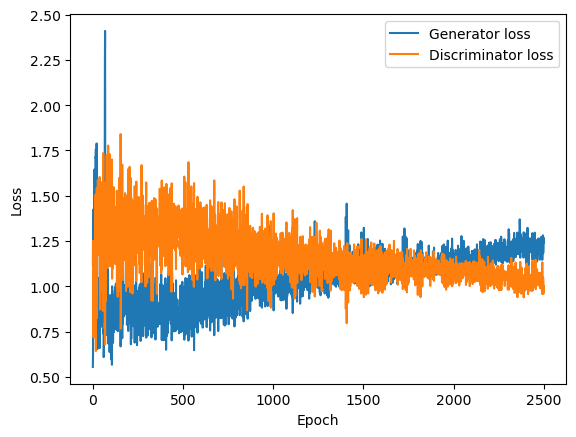

In [25]:
# 創建生成器和判別器
generator = make_generator_model(latent_dim=10)
discriminator = make_discriminator_model()

# 訓練模型
gen_loss_history, disc_loss_history = train(dataset, epochs=2500, generator=generator, discriminator=discriminator, latent_dim=10)

# 繪製訓練歷史
plt.plot(gen_loss_history, label='Generator loss')
plt.plot(disc_loss_history, label='Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

 #### task(2)
 * Change the latent_dim = 256 

In [242]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# 定義生成器
def make_generator_model(latent_dim):
    model = keras.Sequential()
    model.add(layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)

    return model

# 定義判別器
def make_discriminator_model():
    model = keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

# 定義損失函數
cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# 定義優化器
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

# 定義訓練步驟
@tf.function
def train_step(images, generator, discriminator, latent_dim):
    noise = tf.random.normal([images.shape[0], latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 定義訓練函數
def train(dataset, epochs, generator, discriminator, latent_dim):
    gen_loss_history = []
    disc_loss_history = []
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        gen_loss_sum = 0
        disc_loss_sum = 0
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch, generator, discriminator, latent_dim)
            gen_loss_sum += gen_loss
            disc_loss_sum += disc_loss
        gen_loss_history.append(gen_loss_sum / len(dataset))
        disc_loss_history.append(disc_loss_sum / len(dataset))
        print(f"Generator loss: {gen_loss_history[-1]}, Discriminator loss: {disc_loss_history[-1]}")
        # 每10個epoch顯示一次生成的圖片
        if (epoch + 1) % 10 == 0:
            display_image(generator, latent_dim)
    return gen_loss_history, disc_loss_history

# 定義顯示圖片的函數
def display_image(generator, latent_dim):
    noise = tf.random.normal(shape=(1, latent_dim), seed=1)
    generated_image = generator(noise, training=False)
    plt.imshow((generated_image[0, :, :, :] * 127.5 + 127.5) / 255.0)
    plt.axis('off')
    plt.show()

# 使用256的latent_dim
latent_dim = 256

# 創建生成器和判別器
generator = make_generator_model(latent_dim)
discriminator = make_discriminator_model()

# 訓練GAN
# train(dataset, epochs, generator, discriminator, latent_dim)


Epoch 1/100
Generator loss: 0.6806780099868774, Discriminator loss: 1.049375295639038
Epoch 2/100
Generator loss: 0.8543134331703186, Discriminator loss: 0.9289273023605347
Epoch 3/100
Generator loss: 1.182566523551941, Discriminator loss: 0.8126420974731445
Epoch 4/100
Generator loss: 1.670512318611145, Discriminator loss: 0.5510265827178955
Epoch 5/100
Generator loss: 1.535023808479309, Discriminator loss: 0.6678038239479065
Epoch 6/100
Generator loss: 1.5680444240570068, Discriminator loss: 0.572571337223053
Epoch 7/100
Generator loss: 1.4297621250152588, Discriminator loss: 0.7933892011642456
Epoch 8/100
Generator loss: 1.387418508529663, Discriminator loss: 0.9349178075790405
Epoch 9/100
Generator loss: 1.2466474771499634, Discriminator loss: 0.9431222677230835
Epoch 10/100
Generator loss: 1.8857076168060303, Discriminator loss: 0.5501028299331665


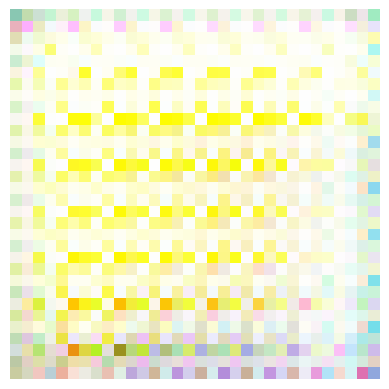

Epoch 11/100
Generator loss: 1.7651187181472778, Discriminator loss: 0.9592400789260864
Epoch 12/100
Generator loss: 2.755125045776367, Discriminator loss: 0.5387634038925171
Epoch 13/100
Generator loss: 2.141421318054199, Discriminator loss: 0.6020234823226929
Epoch 14/100
Generator loss: 2.3982276916503906, Discriminator loss: 0.7022994160652161
Epoch 15/100
Generator loss: 1.619357705116272, Discriminator loss: 0.7717057466506958
Epoch 16/100
Generator loss: 1.60335373878479, Discriminator loss: 0.7153021097183228
Epoch 17/100
Generator loss: 1.5834338665008545, Discriminator loss: 0.9499551653862
Epoch 18/100
Generator loss: 2.029111862182617, Discriminator loss: 0.7770697474479675
Epoch 19/100
Generator loss: 1.6044890880584717, Discriminator loss: 0.931740403175354
Epoch 20/100
Generator loss: 1.0908374786376953, Discriminator loss: 1.4477626085281372


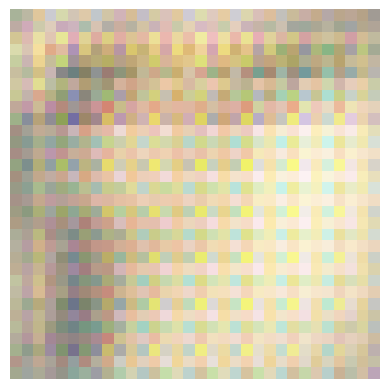

Epoch 21/100
Generator loss: 0.9908283352851868, Discriminator loss: 1.311126708984375
Epoch 22/100
Generator loss: 1.2056642770767212, Discriminator loss: 1.0332697629928589
Epoch 23/100
Generator loss: 0.9981576204299927, Discriminator loss: 1.2015286684036255
Epoch 24/100
Generator loss: 0.8143075704574585, Discriminator loss: 1.4125254154205322
Epoch 25/100
Generator loss: 0.8609181642532349, Discriminator loss: 1.1750431060791016
Epoch 26/100
Generator loss: 0.9011321663856506, Discriminator loss: 1.128495216369629
Epoch 27/100
Generator loss: 0.7247788310050964, Discriminator loss: 1.472037672996521
Epoch 28/100
Generator loss: 0.9045825600624084, Discriminator loss: 1.3599603176116943
Epoch 29/100
Generator loss: 0.8466618061065674, Discriminator loss: 1.362735629081726
Epoch 30/100
Generator loss: 1.2697834968566895, Discriminator loss: 0.8236395120620728


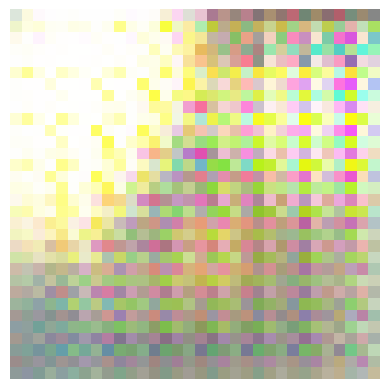

Epoch 31/100
Generator loss: 0.6384056210517883, Discriminator loss: 1.4632879495620728
Epoch 32/100
Generator loss: 0.828827440738678, Discriminator loss: 1.180060863494873
Epoch 33/100
Generator loss: 0.9612888693809509, Discriminator loss: 1.2084029912948608
Epoch 34/100
Generator loss: 0.9118159413337708, Discriminator loss: 1.348174810409546
Epoch 35/100
Generator loss: 0.8702254295349121, Discriminator loss: 1.4226062297821045
Epoch 36/100
Generator loss: 0.8874080777168274, Discriminator loss: 1.2145625352859497
Epoch 37/100
Generator loss: 0.8655509352684021, Discriminator loss: 1.0728533267974854
Epoch 38/100
Generator loss: 1.1029843091964722, Discriminator loss: 0.9150714874267578
Epoch 39/100
Generator loss: 0.7637393474578857, Discriminator loss: 1.3799794912338257
Epoch 40/100
Generator loss: 1.1078459024429321, Discriminator loss: 1.019466519355774


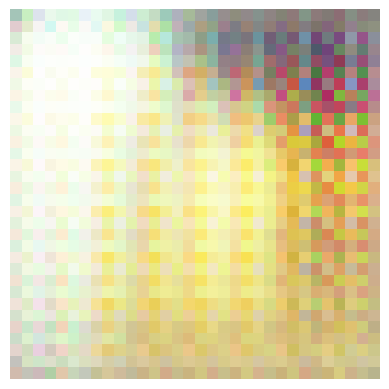

Epoch 41/100
Generator loss: 0.8724821209907532, Discriminator loss: 1.2693392038345337
Epoch 42/100
Generator loss: 1.037580966949463, Discriminator loss: 1.187493085861206
Epoch 43/100
Generator loss: 1.250357747077942, Discriminator loss: 1.1306757926940918
Epoch 44/100
Generator loss: 1.6461762189865112, Discriminator loss: 1.010253667831421
Epoch 45/100
Generator loss: 1.2581796646118164, Discriminator loss: 1.2767159938812256
Epoch 46/100
Generator loss: 1.2830477952957153, Discriminator loss: 0.8388282656669617
Epoch 47/100
Generator loss: 1.240438461303711, Discriminator loss: 0.8626399040222168
Epoch 48/100
Generator loss: 1.056886076927185, Discriminator loss: 1.13494074344635
Epoch 49/100
Generator loss: 1.2110555171966553, Discriminator loss: 1.1228270530700684
Epoch 50/100
Generator loss: 1.0879347324371338, Discriminator loss: 1.1434624195098877


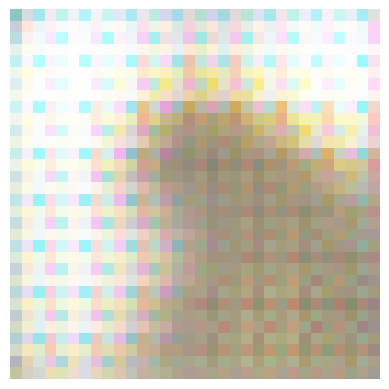

Epoch 51/100
Generator loss: 0.9473768472671509, Discriminator loss: 1.2713056802749634
Epoch 52/100
Generator loss: 1.3204903602600098, Discriminator loss: 0.9107080698013306
Epoch 53/100
Generator loss: 1.0484071969985962, Discriminator loss: 1.2357538938522339
Epoch 54/100
Generator loss: 1.1018880605697632, Discriminator loss: 1.1767561435699463
Epoch 55/100
Generator loss: 1.2844735383987427, Discriminator loss: 1.0593968629837036
Epoch 56/100
Generator loss: 1.2912077903747559, Discriminator loss: 1.0187574625015259
Epoch 57/100
Generator loss: 1.0068613290786743, Discriminator loss: 1.2752820253372192
Epoch 58/100
Generator loss: 1.221118688583374, Discriminator loss: 1.230359673500061
Epoch 59/100
Generator loss: 1.2122844457626343, Discriminator loss: 0.9394779801368713
Epoch 60/100
Generator loss: 1.0985254049301147, Discriminator loss: 1.1250447034835815


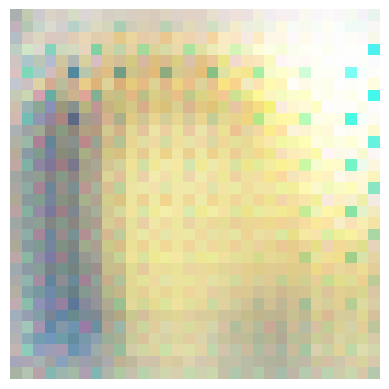

Epoch 61/100
Generator loss: 0.926173746585846, Discriminator loss: 1.3198758363723755
Epoch 62/100
Generator loss: 1.191399097442627, Discriminator loss: 1.1765613555908203
Epoch 63/100
Generator loss: 0.8897126913070679, Discriminator loss: 1.5319247245788574
Epoch 64/100
Generator loss: 1.0653188228607178, Discriminator loss: 1.2063350677490234
Epoch 65/100
Generator loss: 0.737886905670166, Discriminator loss: 1.5627264976501465
Epoch 66/100
Generator loss: 1.078163981437683, Discriminator loss: 1.0403084754943848
Epoch 67/100
Generator loss: 1.139417290687561, Discriminator loss: 1.0393401384353638
Epoch 68/100
Generator loss: 0.8032652139663696, Discriminator loss: 1.4192489385604858
Epoch 69/100
Generator loss: 1.0615978240966797, Discriminator loss: 1.1207841634750366
Epoch 70/100
Generator loss: 1.068727731704712, Discriminator loss: 1.1018685102462769


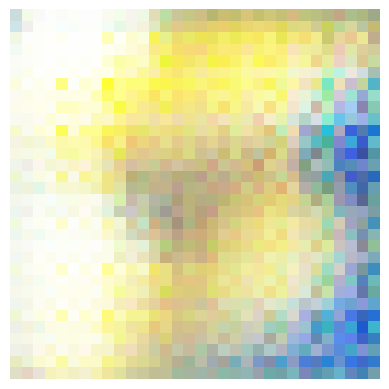

Epoch 71/100
Generator loss: 1.167540431022644, Discriminator loss: 1.0952980518341064
Epoch 72/100
Generator loss: 1.1428881883621216, Discriminator loss: 1.2015143632888794
Epoch 73/100
Generator loss: 0.9103062152862549, Discriminator loss: 1.490537405014038
Epoch 74/100
Generator loss: 1.0258424282073975, Discriminator loss: 1.1664643287658691
Epoch 75/100
Generator loss: 1.0875214338302612, Discriminator loss: 1.0204392671585083
Epoch 76/100
Generator loss: 0.9937481880187988, Discriminator loss: 1.0953853130340576
Epoch 77/100
Generator loss: 0.8631868958473206, Discriminator loss: 1.3177425861358643
Epoch 78/100
Generator loss: 1.1368097066879272, Discriminator loss: 0.9797556400299072
Epoch 79/100
Generator loss: 1.1226699352264404, Discriminator loss: 0.9986357092857361
Epoch 80/100
Generator loss: 1.1448355913162231, Discriminator loss: 1.1146175861358643


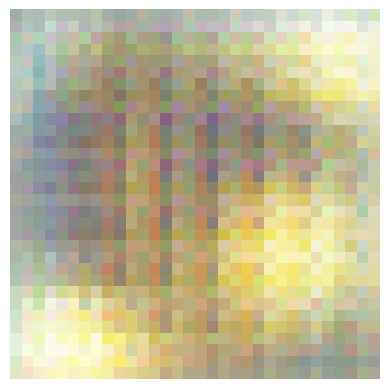

Epoch 81/100
Generator loss: 0.7803755402565002, Discriminator loss: 1.4593119621276855
Epoch 82/100
Generator loss: 0.9447640180587769, Discriminator loss: 1.1675950288772583
Epoch 83/100
Generator loss: 0.8861806392669678, Discriminator loss: 1.2238636016845703
Epoch 84/100
Generator loss: 1.4507815837860107, Discriminator loss: 1.179534673690796
Epoch 85/100
Generator loss: 1.5744000673294067, Discriminator loss: 0.9856470227241516
Epoch 86/100
Generator loss: 0.9091216325759888, Discriminator loss: 1.5378615856170654
Epoch 87/100
Generator loss: 0.8352084755897522, Discriminator loss: 1.3265668153762817
Epoch 88/100
Generator loss: 0.859406054019928, Discriminator loss: 1.2226626873016357
Epoch 89/100
Generator loss: 0.9438340067863464, Discriminator loss: 1.1344380378723145
Epoch 90/100
Generator loss: 1.05778968334198, Discriminator loss: 1.056416392326355


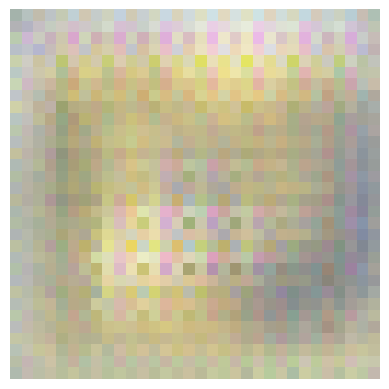

Epoch 91/100
Generator loss: 1.0375714302062988, Discriminator loss: 1.0909137725830078
Epoch 92/100
Generator loss: 1.0325533151626587, Discriminator loss: 1.2045421600341797
Epoch 93/100
Generator loss: 0.7040953040122986, Discriminator loss: 1.7051664590835571
Epoch 94/100
Generator loss: 1.0810980796813965, Discriminator loss: 1.1532779932022095
Epoch 95/100
Generator loss: 1.3083631992340088, Discriminator loss: 1.0360465049743652
Epoch 96/100
Generator loss: 0.9472248554229736, Discriminator loss: 1.3468636274337769
Epoch 97/100
Generator loss: 1.0043894052505493, Discriminator loss: 1.2016679048538208
Epoch 98/100
Generator loss: 0.9920862317085266, Discriminator loss: 1.1227997541427612
Epoch 99/100
Generator loss: 0.7863550186157227, Discriminator loss: 1.3463923931121826
Epoch 100/100
Generator loss: 0.8772525787353516, Discriminator loss: 1.1979098320007324


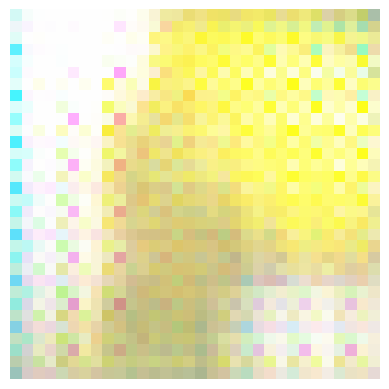

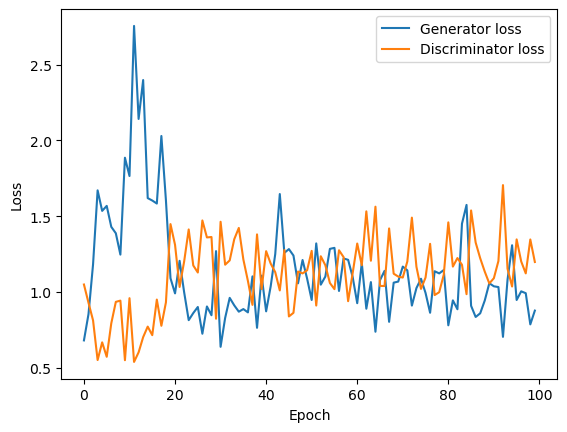

In [243]:

def train_step(images, generator, discriminator, latent_dim):
    noise = tf.random.normal([images.shape[0], latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 重新訓練模型
# gen_loss_history, disc_loss_history = train(dataset, epochs=100, generator=generator, discriminator=discriminator, latent_dim=256)


# 創建生成器和判別器
generator = make_generator_model(latent_dim=256)
discriminator = make_discriminator_model()

# 訓練模型
gen_loss_history, disc_loss_history = train(dataset, epochs=100, generator=generator, discriminator=discriminator, latent_dim=256)

# 繪製訓練歷史
plt.plot(gen_loss_history, label='Generator loss')
plt.plot(disc_loss_history, label='Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### task(3)
* generated higher resolution pictures (128, 128, 3), and show 4 figures at the end.

In [244]:
subfolders = glob.glob("./dataset/dataset_flowers/*/")
class_names = [folder.rstrip("/") for folder in subfolders]

figsize = 128

# 從文件夾中載入數據集
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "./dataset/dataset_flowers/sunflower", label_mode=None, seed=123, image_size=(figsize, figsize), batch_size=32,
    class_names=class_names
)

# 正規化數據
dataset = dataset.map(lambda x: x/255.0)


Found 1027 files belonging to 1 classes.


#### 試著輸出圖片

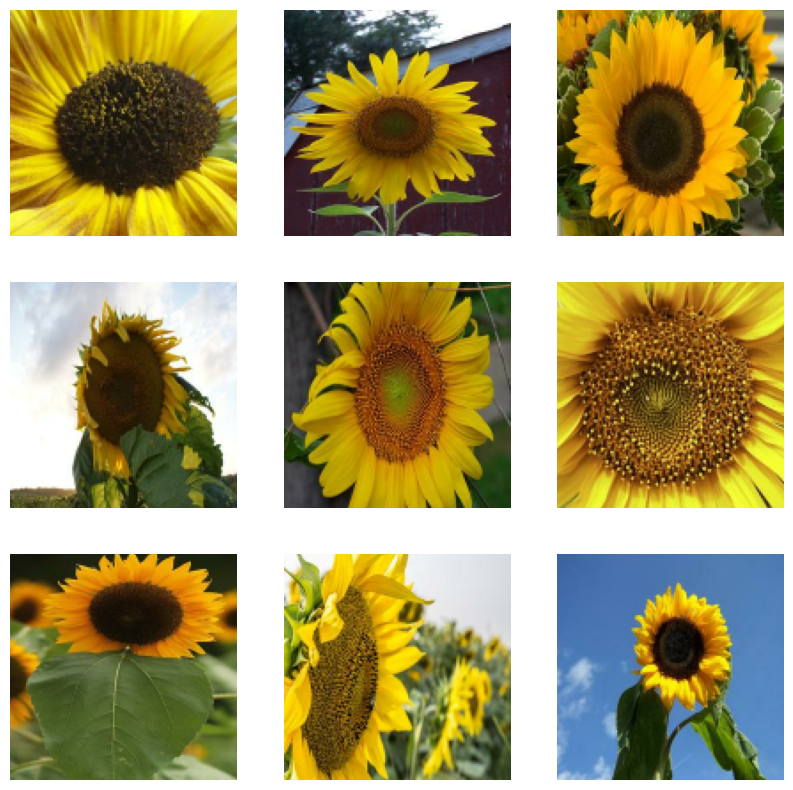

In [245]:
import matplotlib.pyplot as plt

# Load a batch of images from the dataset
for images_batch in dataset.take(1):
    # Display the images
    plt.figure(figsize=(10, 10))
    for i in range(9):  # Display the first 9 images in the batch
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images_batch[i].numpy())
        plt.axis("off")
    plt.show()


Found 1027 files belonging to 1 classes.
Epoch 1/30
Generator loss: 2.6437339782714844, Discriminator loss: 0.22720760107040405


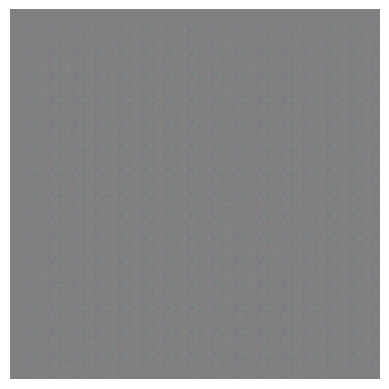

Epoch 2/30
Generator loss: 3.6748697757720947, Discriminator loss: 0.05516451969742775


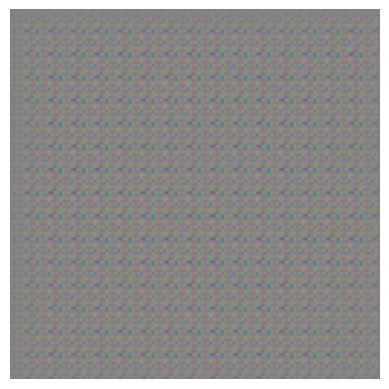

Epoch 3/30
Generator loss: 4.461073875427246, Discriminator loss: 0.028158871456980705


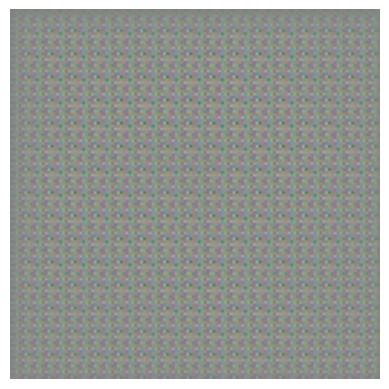

Epoch 4/30
Generator loss: 4.994683265686035, Discriminator loss: 0.01913587562739849


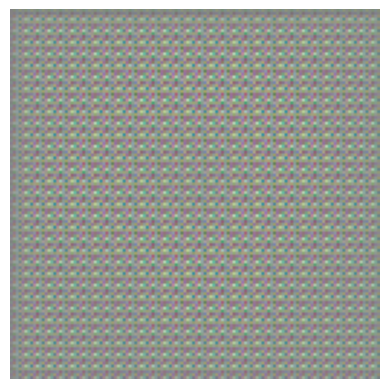

Epoch 5/30
Generator loss: 5.216167449951172, Discriminator loss: 0.018793301656842232


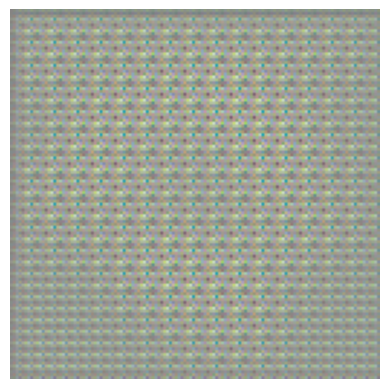

Epoch 6/30
Generator loss: 4.885558605194092, Discriminator loss: 0.09564617276191711


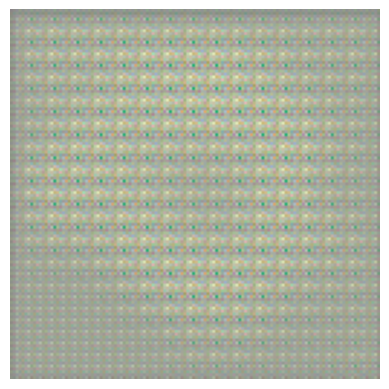

Epoch 7/30
Generator loss: 4.324394226074219, Discriminator loss: 0.11465621739625931


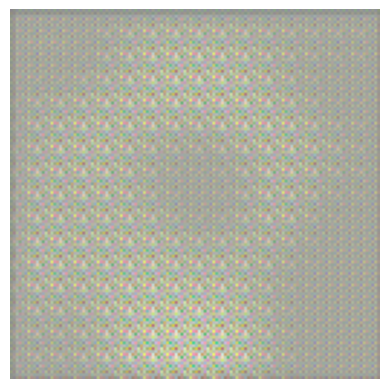

Epoch 8/30
Generator loss: 4.422380447387695, Discriminator loss: 0.22059036791324615


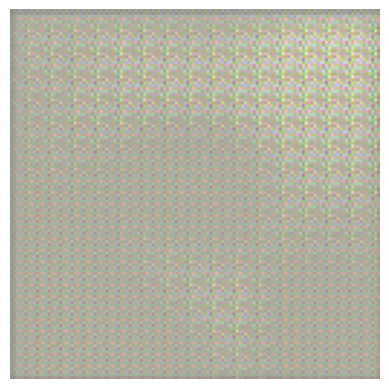

Epoch 9/30
Generator loss: 3.5666770935058594, Discriminator loss: 0.3415597081184387


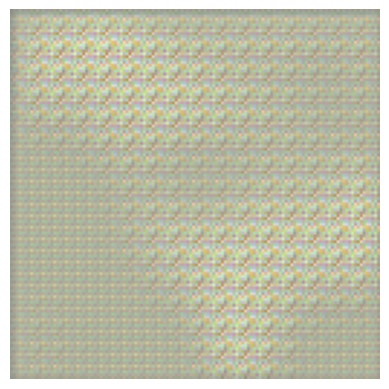

Epoch 10/30
Generator loss: 4.259817123413086, Discriminator loss: 0.34950071573257446


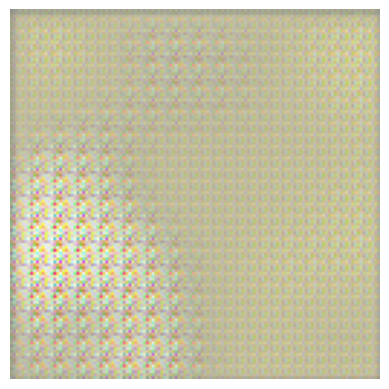

Epoch 11/30
Generator loss: 4.874046325683594, Discriminator loss: 0.4358695149421692


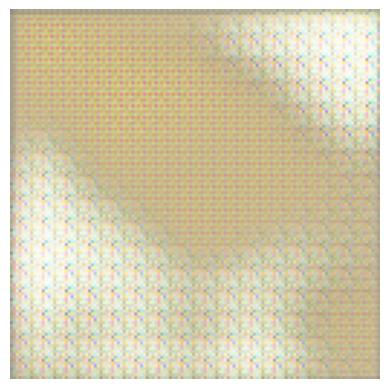

Epoch 12/30
Generator loss: 2.6494240760803223, Discriminator loss: 0.7312266230583191


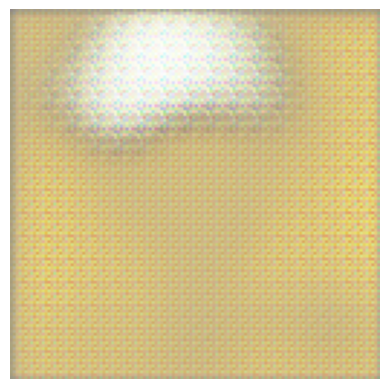

Epoch 13/30
Generator loss: 2.106260299682617, Discriminator loss: 0.7583580017089844


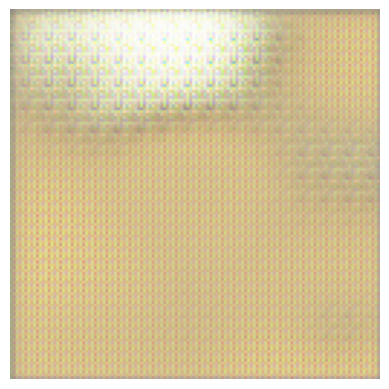

Epoch 14/30
Generator loss: 2.4055144786834717, Discriminator loss: 0.6128961443901062


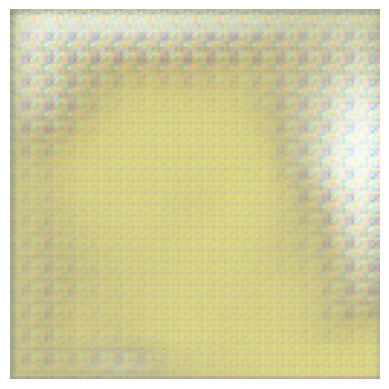

Epoch 15/30
Generator loss: 2.3178212642669678, Discriminator loss: 1.0437891483306885


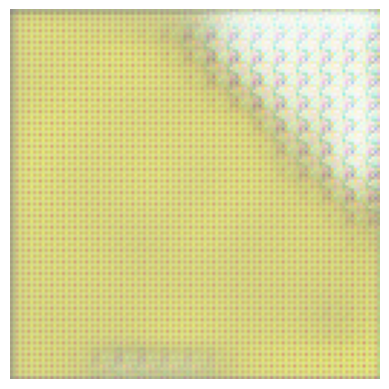

Epoch 16/30
Generator loss: 2.392679452896118, Discriminator loss: 0.47869643568992615


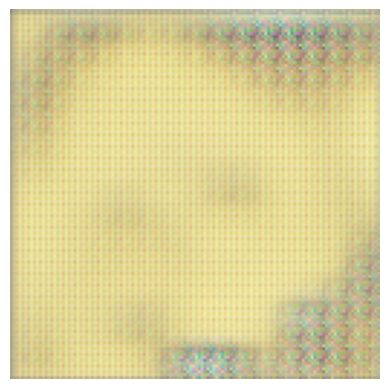

Epoch 17/30
Generator loss: 2.9813389778137207, Discriminator loss: 0.46029868721961975


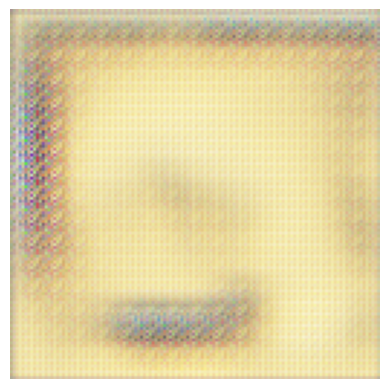

Epoch 18/30
Generator loss: 3.0537757873535156, Discriminator loss: 0.5704272985458374


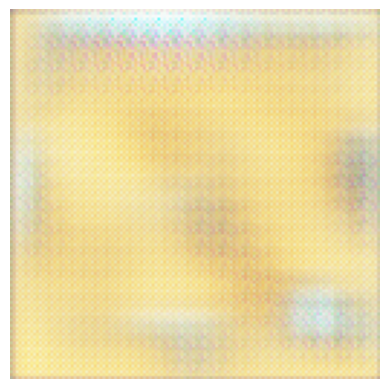

Epoch 19/30
Generator loss: 2.049682140350342, Discriminator loss: 0.9168581962585449


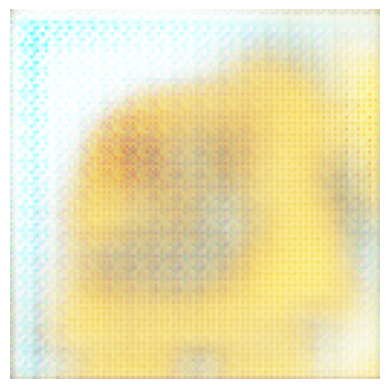

Epoch 20/30
Generator loss: 1.757576823234558, Discriminator loss: 1.1971981525421143


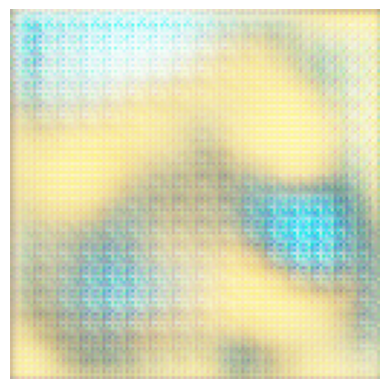

Epoch 21/30
Generator loss: 1.6812152862548828, Discriminator loss: 1.1535357236862183


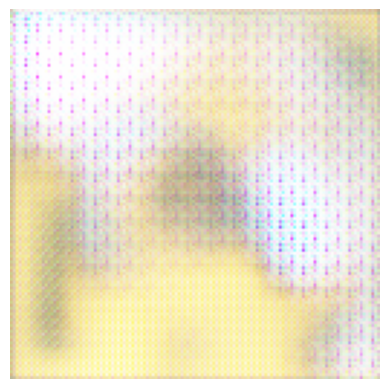

Epoch 22/30
Generator loss: 2.2396295070648193, Discriminator loss: 1.0390427112579346


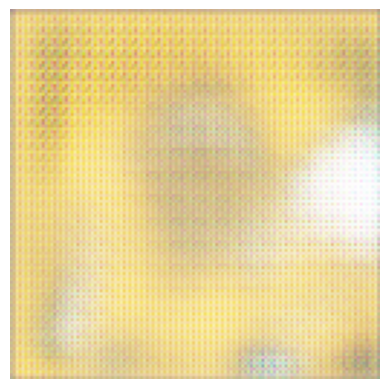

Epoch 23/30
Generator loss: 1.6066336631774902, Discriminator loss: 1.213881015777588


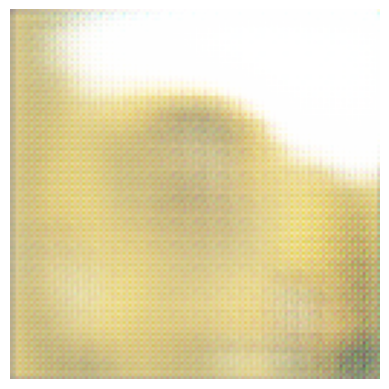

Epoch 24/30
Generator loss: 1.9083220958709717, Discriminator loss: 0.5369769930839539


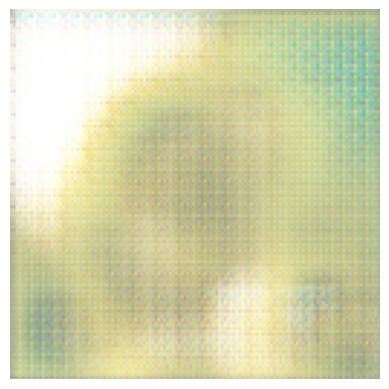

Epoch 25/30
Generator loss: 1.6234662532806396, Discriminator loss: 0.9504766464233398


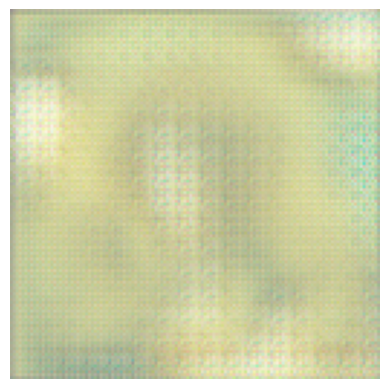

Epoch 26/30
Generator loss: 1.5217527151107788, Discriminator loss: 1.0826185941696167


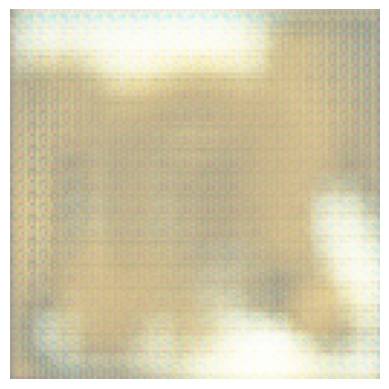

Epoch 27/30
Generator loss: 1.5697100162506104, Discriminator loss: 0.8026732206344604


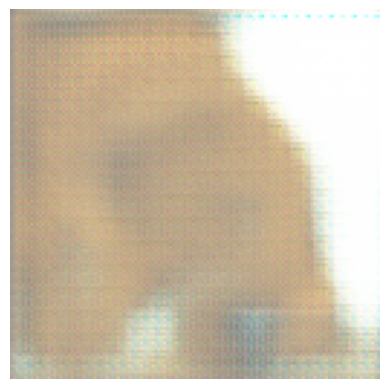

Epoch 28/30
Generator loss: 1.1712064743041992, Discriminator loss: 1.1527529954910278


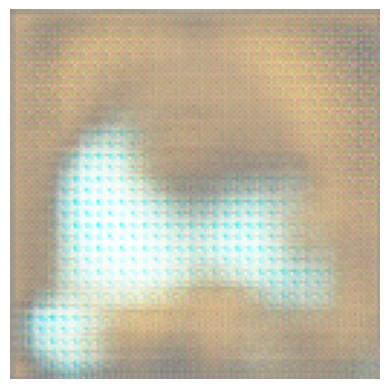

Epoch 29/30
Generator loss: 1.2021054029464722, Discriminator loss: 0.9737948775291443


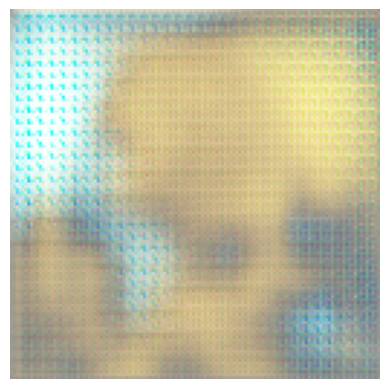

Epoch 30/30
Generator loss: 1.5224690437316895, Discriminator loss: 0.8799063563346863


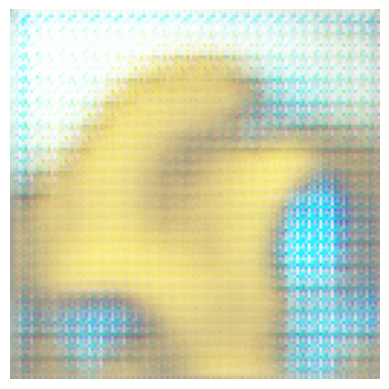

([<tf.Tensor: shape=(), dtype=float32, numpy=2.643734>,
  <tf.Tensor: shape=(), dtype=float32, numpy=3.6748698>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.461074>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.9946833>,
  <tf.Tensor: shape=(), dtype=float32, numpy=5.2161674>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.8855586>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.324394>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.4223804>,
  <tf.Tensor: shape=(), dtype=float32, numpy=3.566677>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.259817>,
  <tf.Tensor: shape=(), dtype=float32, numpy=4.8740463>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.649424>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.1062603>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.4055145>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.3178213>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.3926795>,
  <tf.Tensor: shape=(), dtype=float32, numpy=2.981339>,
  <tf.Tensor: shape=(), dtype=float32,

In [264]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# 定義生成器
def make_generator_model(latent_dim):
    model = keras.Sequential()
    model.add(layers.Dense(16 * 16 * 256, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((16, 16, 256)))
    assert model.output_shape == (None, 16, 16, 256)

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 128, 128, 3)

    return model

# 定義判別器
def make_discriminator_model():
    model = keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

# 定義優化器
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

# 定義訓練步驟
@tf.function
def train_step(images, generator, discriminator, latent_dim):
    noise = tf.random.normal([images.shape[0], latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 定義訓練函數
def train(dataset, epochs, generator, discriminator, latent_dim):
    gen_loss_history = []
    disc_loss_history = []
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        gen_loss_sum = 0
        disc_loss_sum = 0
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch, generator, discriminator, latent_dim)
            gen_loss_sum += gen_loss
            disc_loss_sum += disc_loss
        gen_loss_history.append(gen_loss_sum / len(dataset))
        disc_loss_history.append(disc_loss_sum / len(dataset))
        print(f"Generator loss: {gen_loss_history[-1]}, Discriminator loss: {disc_loss_history[-1]}")
        # 每10個epoch顯示一次生成的圖片
        if (epoch + 1) % 1 == 0:
            display_image(generator, latent_dim)
    return gen_loss_history, disc_loss_history

# 定義顯示圖片的函數
def display_image(generator, latent_dim):
    noise = tf.random.normal(shape=(1, latent_dim), seed=1)
    generated_image = generator(noise, training=False)
    plt.imshow((generated_image[0, :, :, :] * 127.5 + 127.5) / 255.0)
    plt.axis('off')
    plt.show()

# 使用256的latent_dim
latent_dim = 32

# 載入數據集
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "./dataset/dataset_flowers/sunflower", label_mode=None, seed=123, image_size=(128, 128), batch_size=32
)

# 正規化數據
dataset = dataset.map(lambda x: x/255.0)

# 創建生成器和判別器
generator = make_generator_model(latent_dim)
discriminator = make_discriminator_model()

# 訓練GAN
train(dataset, epochs=30, generator=generator, discriminator=discriminator, latent_dim=latent_dim)


In [26]:
generator.save('generator.h5')

C:\Users\KiwiLai\anaconda3\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [27]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

# Load the saved generator model
g = keras.models.load_model('generator.h5')

# Generate four images
latent_dim = 32
num_images = 10

for _ in range(num_images):
    noise = tf.random.normal(shape=(1, latent_dim))
    generated_image = g(noise, training=False)

    # Display the generated image
    plt.imshow((generated_image[0, :, :, :] * 127.5 + 127.5) / 255.0)
    plt.axis('off')
    plt.show()


ValueError: Input 0 of layer "sequential_22" is incompatible with the layer: expected shape=(None, 10), found shape=(1, 32)

---

# VAE 模型

#### loading dataset

In [126]:
# 從文件夾中載入數據集
figsize = 32
train_db = tf.keras.preprocessing.image_dataset_from_directory(
    "./dataset/dataset_flowers/sunflower", label_mode=None, seed=123, image_size=(figsize, figsize), batch_size=32
)

# 正規化數據
train_db = train_db.map(lambda x: x / 255.0)


Found 1027 files belonging to 1 classes.


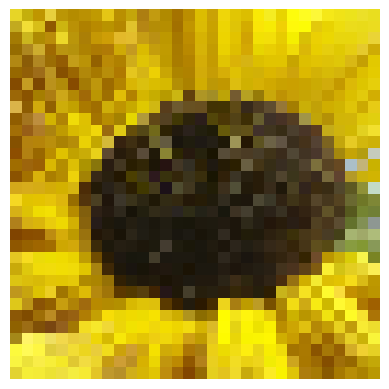

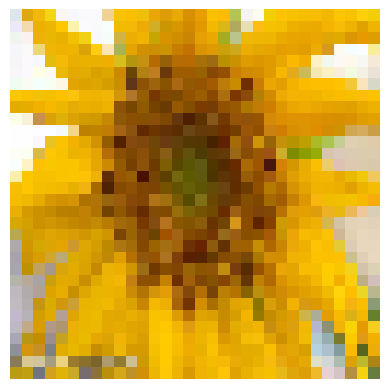

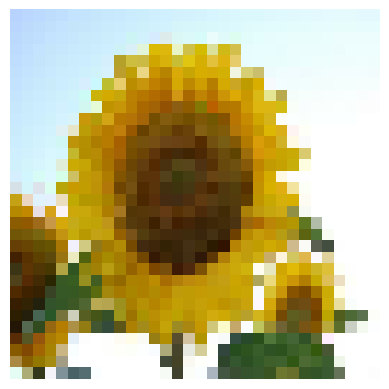

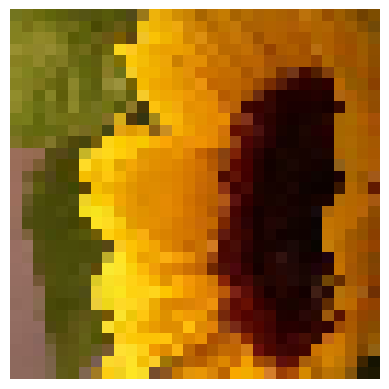

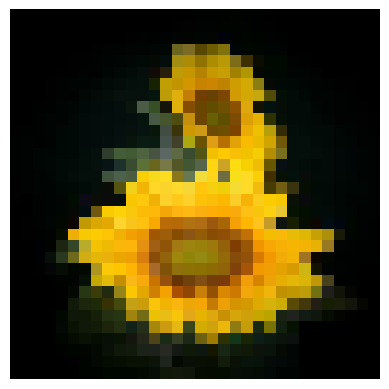

In [127]:
num_images_to_display = 5
for i, x in enumerate(train_db):
    plt.axis("off")
    plt.imshow((x.numpy() * 255).astype("int32")[0])
    plt.show()

    if i == num_images_to_display - 1:
        break

In [103]:
for batch in train_db:
    images = batch[0]
    print(images.shape)
    break  # 只需要一個批次

(32, 32, 3)


In [97]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, optimizers
lr = 1e-3

optimizer = optimizers.Adam(lr)
class VAE(keras.Model):
    def __init__(self, z_dim=10):
        super(VAE, self).__init__()
        self.fc1 = layers.Dense(128)
        self.fc2 = layers.Dense(z_dim)
        self.fc3 = layers.Dense(z_dim)
        self.fc4 = layers.Dense(128)
        self.fc5 = layers.Dense(784)
    def encoder(self, x):
        h = tf.nn.relu(self.fc1(x))
        mu = self.fc2(h)
        log_var = self.fc3(h)
        return mu, log_var
    def decoder(self, z):
        out = tf.nn.relu(self.fc4(z))
        x_hat = tf.nn.sigmoid(self.fc5(out))
        return x_hat
    def call(self, inputs, training = None):
        mu, log_var = self.encoder(inputs)
        z = self.reparameterize(mu, log_var)
        x_hat = self.decoder(z)
        return x_hat, mu, log_var
    def reparameterize(self, mu, log_var):
        eps = tf.random.normal(log_var.shape)
        std = tf.exp(0.5*log_var)
        z = mu + std * eps
        return z

In [ ]:
model = VAE()
model.build(input_shape=(4, 3072))

optimizer = optimizers.Adam(lr)

for epoch in range(100):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 784])
        with tf.GradientTape() as tape:
            x_rec_logits, mu, log_var = model(x)
            rec_loss = tf.nn.sigmoid_cross_entropy_with_logits(lables=x, logits=x_rec_logits)
            rec_loss = tf.reduce_sum(rec_loss)/x.shape[0]
            kl_div = -0.5 * (log_var + 1 - mu**2 - tf.exp(log_var))
            kl_div = tf.reduce_sum(kl.div)/x.shape[0]
            loss = rec_loss + 1.*kl_div

#### task(1)
* With latent_dim = 3, epochs = 100 show the training history

Epoch 1/100, Rec Loss: 2165.255126953125, KL Div: 7.668206691741943


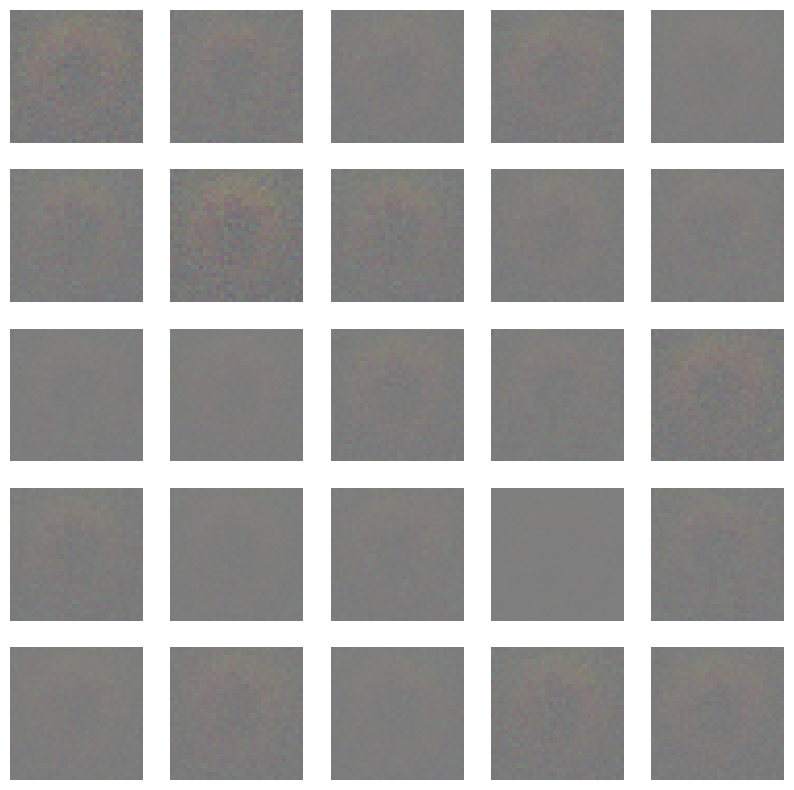

Epoch 2/100, Rec Loss: 2328.5751953125, KL Div: 12.432242393493652
Epoch 3/100, Rec Loss: 2115.248779296875, KL Div: 31.874923706054688
Epoch 4/100, Rec Loss: 2168.189453125, KL Div: 10.226375579833984
Epoch 5/100, Rec Loss: 2134.9970703125, KL Div: 21.039443969726562
Epoch 6/100, Rec Loss: 2148.317138671875, KL Div: 42.25815200805664
Epoch 7/100, Rec Loss: 2094.688232421875, KL Div: 25.939544677734375
Epoch 8/100, Rec Loss: 2145.721435546875, KL Div: 11.150077819824219
Epoch 9/100, Rec Loss: 1981.9219970703125, KL Div: 14.193490028381348
Epoch 10/100, Rec Loss: 2136.177978515625, KL Div: 18.183095932006836
Epoch 11/100, Rec Loss: 2137.742919921875, KL Div: 22.848867416381836


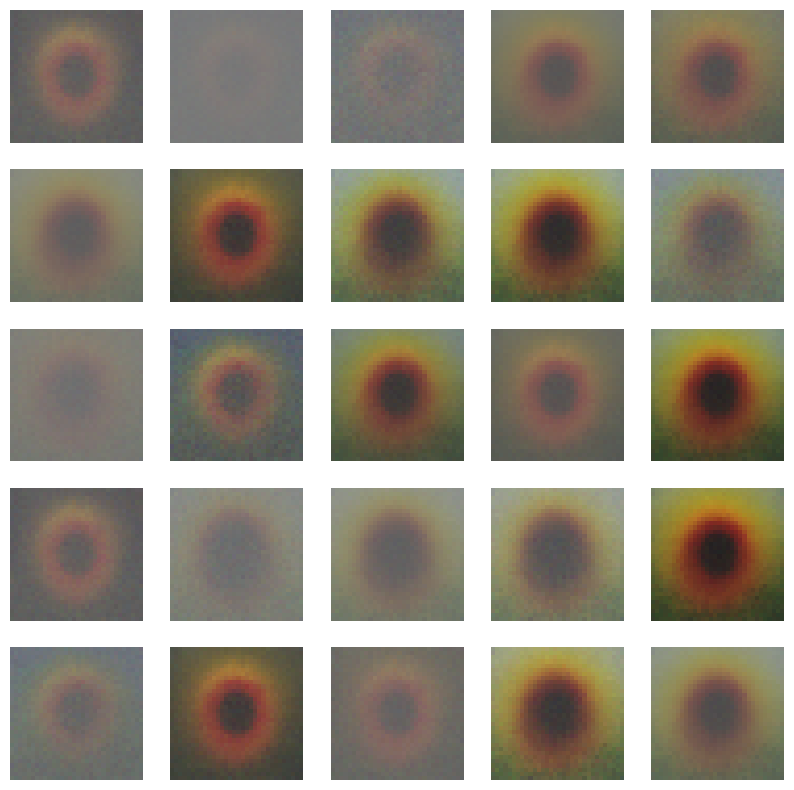

Epoch 12/100, Rec Loss: 2129.909912109375, KL Div: 19.966760635375977
Epoch 13/100, Rec Loss: 2187.919921875, KL Div: 8.490078926086426
Epoch 14/100, Rec Loss: 2073.317138671875, KL Div: 14.599334716796875
Epoch 15/100, Rec Loss: 1930.5059814453125, KL Div: 16.746471405029297
Epoch 16/100, Rec Loss: 2031.6715087890625, KL Div: 14.293604850769043
Epoch 17/100, Rec Loss: 2056.935791015625, KL Div: 6.999279022216797
Epoch 18/100, Rec Loss: 2029.8021240234375, KL Div: 14.16897201538086
Epoch 19/100, Rec Loss: 2025.1435546875, KL Div: 17.923051834106445
Epoch 20/100, Rec Loss: 1993.4713134765625, KL Div: 16.805437088012695
Epoch 21/100, Rec Loss: 2067.26708984375, KL Div: 7.5438055992126465


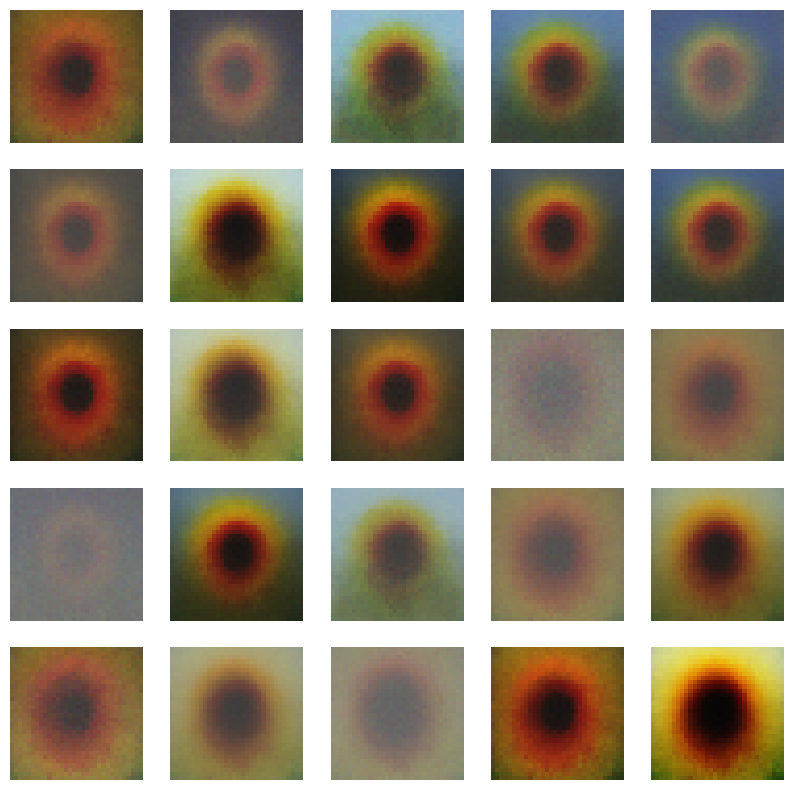

Epoch 22/100, Rec Loss: 2030.0205078125, KL Div: 15.424308776855469
Epoch 23/100, Rec Loss: 2034.361328125, KL Div: 10.351489067077637
Epoch 24/100, Rec Loss: 2064.0068359375, KL Div: 15.555493354797363
Epoch 25/100, Rec Loss: 2083.524658203125, KL Div: 7.580794811248779
Epoch 26/100, Rec Loss: 2080.397705078125, KL Div: 8.520951271057129
Epoch 27/100, Rec Loss: 2095.310791015625, KL Div: 10.918521881103516
Epoch 28/100, Rec Loss: 2020.0152587890625, KL Div: 10.593361854553223
Epoch 29/100, Rec Loss: 2037.9154052734375, KL Div: 11.378371238708496
Epoch 30/100, Rec Loss: 2014.6390380859375, KL Div: 6.9145636558532715
Epoch 31/100, Rec Loss: 2095.568603515625, KL Div: 8.175450325012207


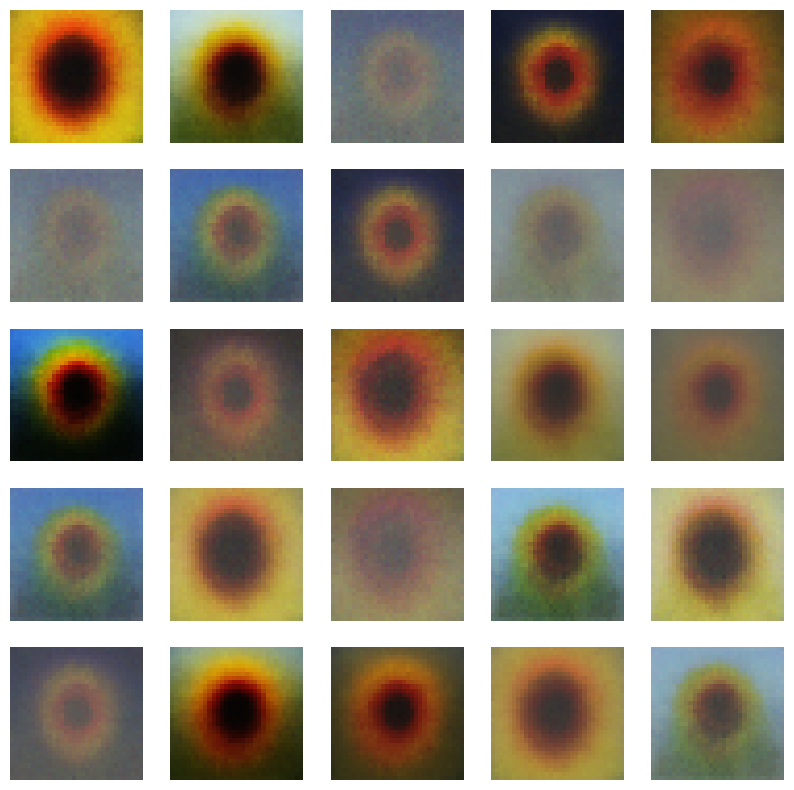

Epoch 32/100, Rec Loss: 2112.4892578125, KL Div: 8.093720436096191
Epoch 33/100, Rec Loss: 2124.841064453125, KL Div: 8.612747192382812
Epoch 34/100, Rec Loss: 2090.302001953125, KL Div: 6.353064060211182
Epoch 35/100, Rec Loss: 1968.353515625, KL Div: 10.410935401916504
Epoch 36/100, Rec Loss: 1990.8087158203125, KL Div: 10.206757545471191
Epoch 37/100, Rec Loss: 2024.0960693359375, KL Div: 13.097007751464844
Epoch 38/100, Rec Loss: 1976.1767578125, KL Div: 11.165522575378418
Epoch 39/100, Rec Loss: 1979.8480224609375, KL Div: 10.517977714538574
Epoch 40/100, Rec Loss: 1980.9202880859375, KL Div: 9.584929466247559
Epoch 41/100, Rec Loss: 2018.1051025390625, KL Div: 6.119678020477295


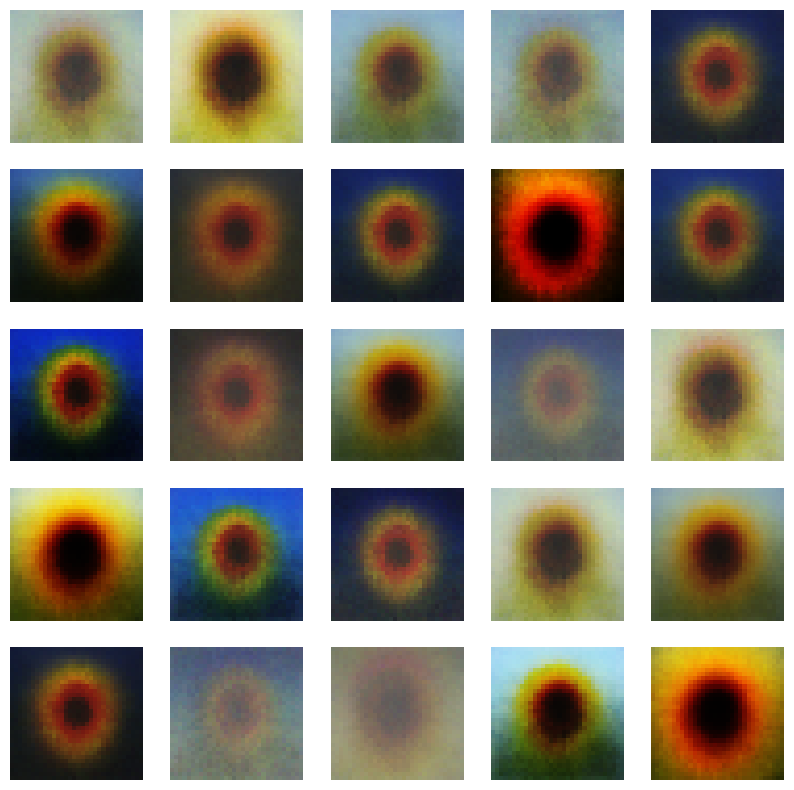

Epoch 42/100, Rec Loss: 2012.69970703125, KL Div: 12.120055198669434
Epoch 43/100, Rec Loss: 1961.3297119140625, KL Div: 10.619669914245605
Epoch 44/100, Rec Loss: 2026.8863525390625, KL Div: 8.480924606323242
Epoch 45/100, Rec Loss: 2016.61376953125, KL Div: 9.12623119354248
Epoch 46/100, Rec Loss: 2071.076904296875, KL Div: 8.569769859313965
Epoch 47/100, Rec Loss: 2042.2965087890625, KL Div: 7.120508193969727
Epoch 48/100, Rec Loss: 2101.208740234375, KL Div: 9.846714973449707
Epoch 49/100, Rec Loss: 2082.455078125, KL Div: 7.567288875579834
Epoch 50/100, Rec Loss: 1991.5673828125, KL Div: 7.9625678062438965
Epoch 51/100, Rec Loss: 2011.7864990234375, KL Div: 8.125577926635742


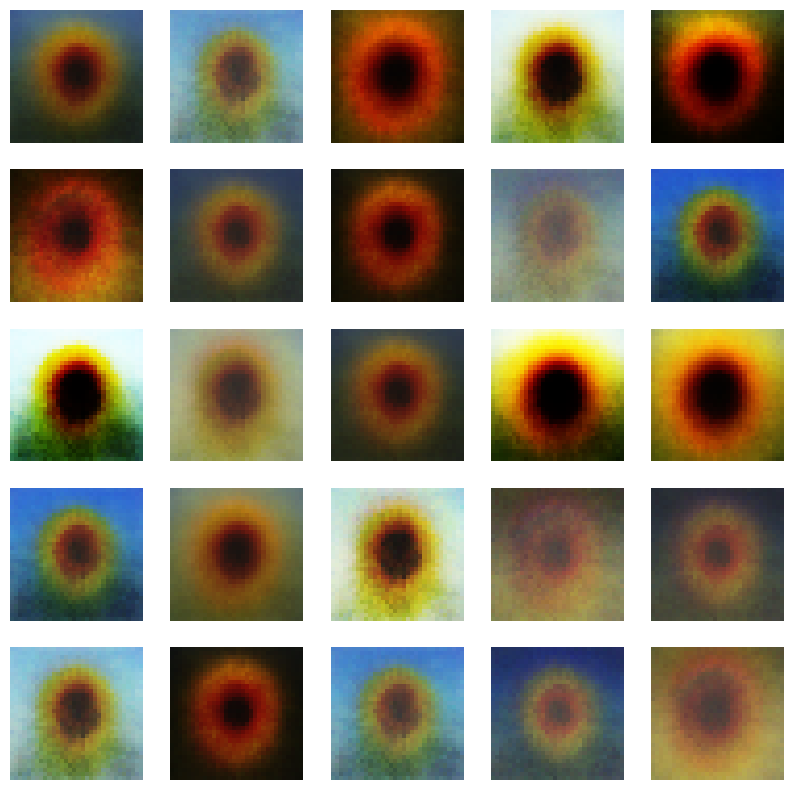

Epoch 52/100, Rec Loss: 2091.2763671875, KL Div: 9.576577186584473
Epoch 53/100, Rec Loss: 2106.296630859375, KL Div: 9.28220272064209
Epoch 54/100, Rec Loss: 2053.284423828125, KL Div: 8.450005531311035
Epoch 55/100, Rec Loss: 2005.05810546875, KL Div: 7.291707992553711
Epoch 56/100, Rec Loss: 2023.9163818359375, KL Div: 9.871111869812012
Epoch 57/100, Rec Loss: 2033.8853759765625, KL Div: 7.276423931121826
Epoch 58/100, Rec Loss: 2129.467529296875, KL Div: 5.333093643188477
Epoch 59/100, Rec Loss: 2048.2939453125, KL Div: 6.228850841522217
Epoch 60/100, Rec Loss: 2092.944091796875, KL Div: 8.160305976867676
Epoch 61/100, Rec Loss: 2121.837646484375, KL Div: 7.3550286293029785


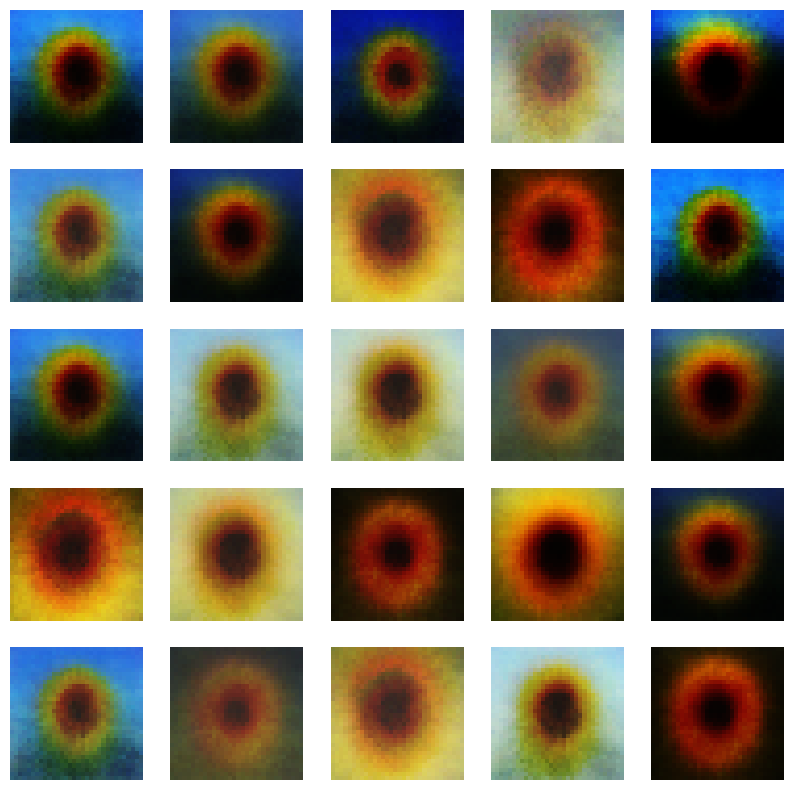

Epoch 62/100, Rec Loss: 1923.962890625, KL Div: 10.288479804992676
Epoch 63/100, Rec Loss: 1955.3233642578125, KL Div: 7.759204864501953
Epoch 64/100, Rec Loss: 2039.2064208984375, KL Div: 6.684681415557861
Epoch 65/100, Rec Loss: 2022.8909912109375, KL Div: 7.510911464691162
Epoch 66/100, Rec Loss: 1990.6207275390625, KL Div: 9.295817375183105
Epoch 67/100, Rec Loss: 2026.1522216796875, KL Div: 7.83749532699585
Epoch 68/100, Rec Loss: 2065.028076171875, KL Div: 6.305304050445557
Epoch 69/100, Rec Loss: 2110.476318359375, KL Div: 7.792945384979248
Epoch 70/100, Rec Loss: 2034.1612548828125, KL Div: 6.867923736572266
Epoch 71/100, Rec Loss: 2008.919921875, KL Div: 4.767700672149658


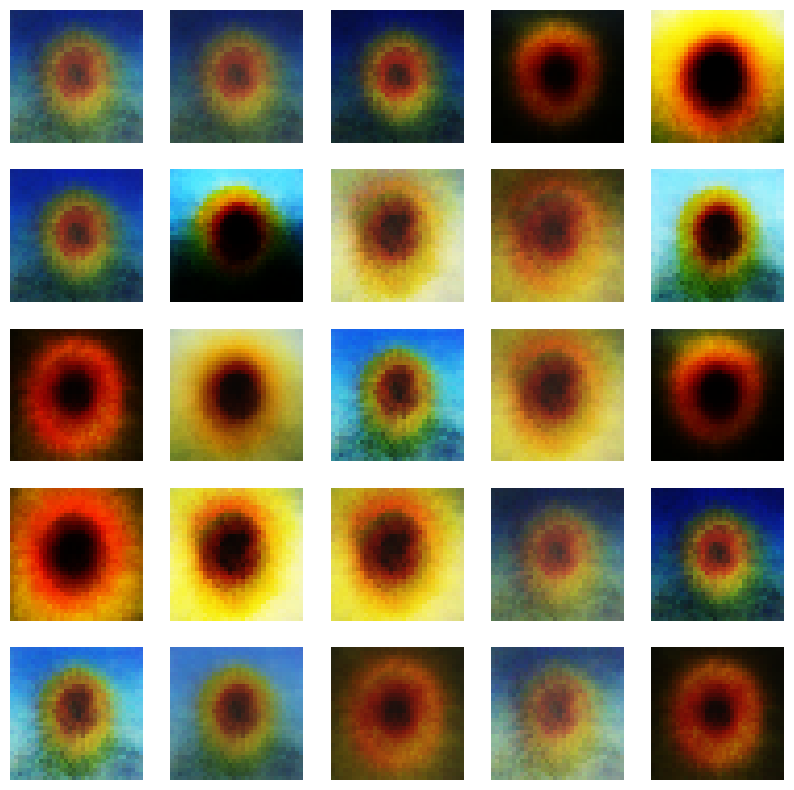

Epoch 72/100, Rec Loss: 2115.303466796875, KL Div: 4.8249640464782715
Epoch 73/100, Rec Loss: 1875.1839599609375, KL Div: 9.78244686126709
Epoch 74/100, Rec Loss: 2099.50537109375, KL Div: 7.182681560516357
Epoch 75/100, Rec Loss: 2023.0003662109375, KL Div: 10.410799980163574
Epoch 76/100, Rec Loss: 2016.5689697265625, KL Div: 6.967111110687256
Epoch 77/100, Rec Loss: 2112.739013671875, KL Div: 7.291207790374756
Epoch 78/100, Rec Loss: 2069.9755859375, KL Div: 7.512848377227783
Epoch 79/100, Rec Loss: 2031.2109375, KL Div: 7.559751033782959
Epoch 80/100, Rec Loss: 1944.9189453125, KL Div: 9.96863079071045
Epoch 81/100, Rec Loss: 1896.5966796875, KL Div: 9.706284523010254


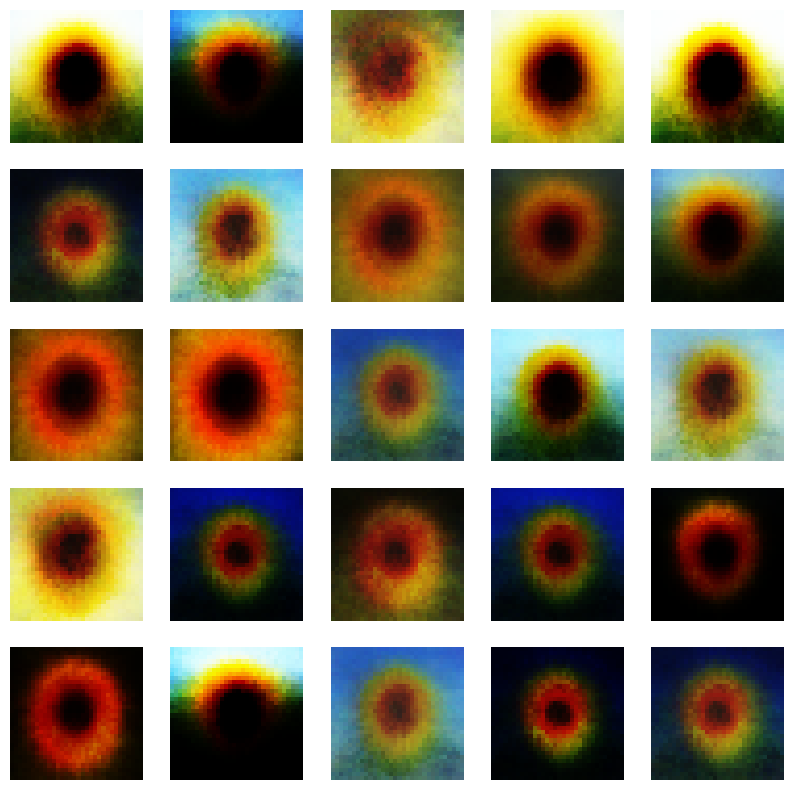

Epoch 82/100, Rec Loss: 2092.401123046875, KL Div: 6.675698757171631
Epoch 83/100, Rec Loss: 2047.4808349609375, KL Div: 6.599135875701904
Epoch 84/100, Rec Loss: 2102.709716796875, KL Div: 4.495166301727295
Epoch 85/100, Rec Loss: 2064.806884765625, KL Div: 7.6950249671936035
Epoch 86/100, Rec Loss: 2052.101318359375, KL Div: 7.169996738433838
Epoch 87/100, Rec Loss: 2035.5308837890625, KL Div: 6.867551803588867
Epoch 88/100, Rec Loss: 2052.730712890625, KL Div: 5.810653209686279
Epoch 89/100, Rec Loss: 2117.691650390625, KL Div: 5.954748630523682
Epoch 90/100, Rec Loss: 2066.2333984375, KL Div: 4.0685038566589355
Epoch 91/100, Rec Loss: 2069.357177734375, KL Div: 6.1606669425964355


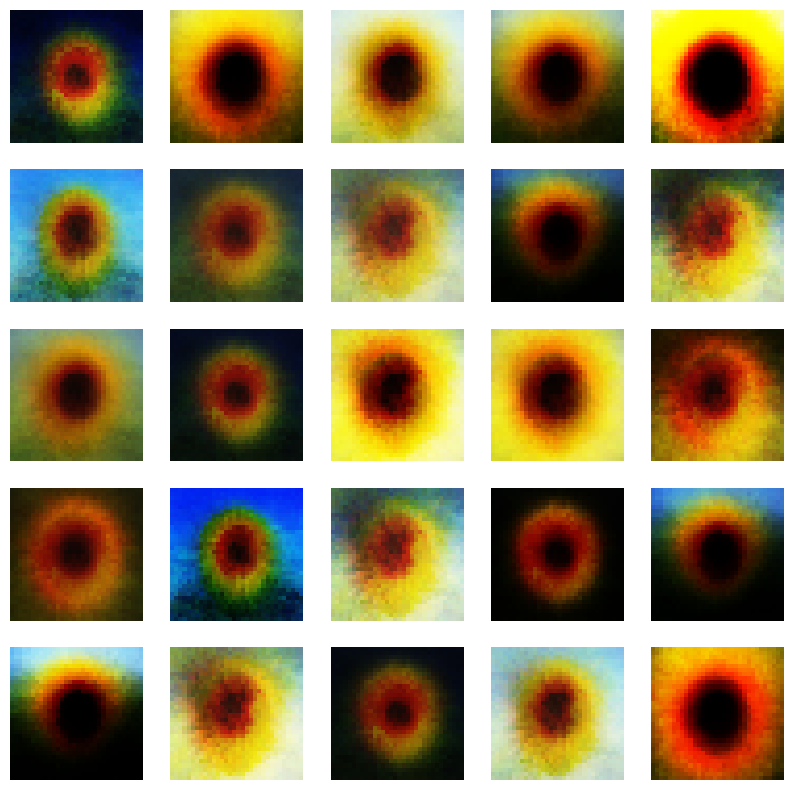

Epoch 92/100, Rec Loss: 1889.3563232421875, KL Div: 10.369956016540527
Epoch 93/100, Rec Loss: 2090.115234375, KL Div: 7.497705459594727
Epoch 94/100, Rec Loss: 2121.275634765625, KL Div: 6.032679080963135
Epoch 95/100, Rec Loss: 2003.5455322265625, KL Div: 6.19251823425293
Epoch 96/100, Rec Loss: 1960.9298095703125, KL Div: 7.79477071762085
Epoch 97/100, Rec Loss: 2079.612548828125, KL Div: 6.663839340209961
Epoch 98/100, Rec Loss: 2081.41015625, KL Div: 4.7340898513793945
Epoch 99/100, Rec Loss: 2015.1710205078125, KL Div: 7.92879056930542
Epoch 100/100, Rec Loss: 2011.9010009765625, KL Div: 5.246178150177002


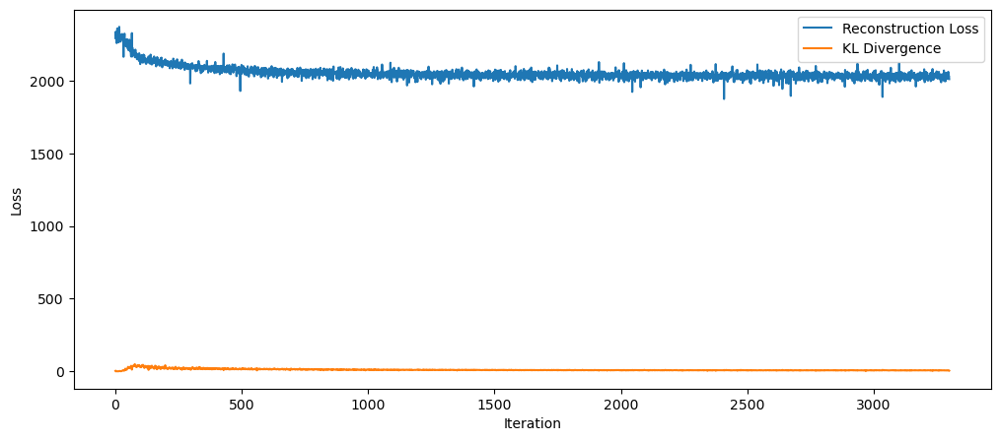

In [161]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, optimizers
import matplotlib.pyplot as plt
import numpy as np

# Assuming train_db is your training dataset

# Assuming your latent_dim is 3
latent_dim = 3

class VAE(keras.Model):
    def __init__(self, z_dim=latent_dim):
        super(VAE, self).__init__()
        self.fc1 = layers.Dense(512)
        self.fc2 = layers.Dense(z_dim)
        self.fc3 = layers.Dense(z_dim)
        self.fc4 = layers.Dense(512)
        self.fc5 = layers.Dense(3072)

    def encoder(self, x):
        h = tf.nn.relu(self.fc1(x))
        mu = self.fc2(h)
        log_var = self.fc3(h)
        return mu, log_var

    def decoder(self, z):
        out = tf.nn.relu(self.fc4(z))
        x_hat = tf.nn.sigmoid(self.fc5(out))
        return x_hat

    def call(self, inputs, training=None):
        mu, log_var = self.encoder(inputs)
        z = self.reparameterize(mu, log_var)
        x_hat = self.decoder(z)
        return x_hat, mu, log_var

    def reparameterize(self, mu, log_var):
        eps = tf.random.normal(log_var.shape)
        std = tf.exp(0.5 * log_var)
        z = mu + std * eps
        return z

# Instantiate the VAE model
vae = VAE()

# Build the model with a dummy input shape
vae.build(input_shape=(4, 3072))

# Set up the optimizer
lr = 1e-4
#lr = 0.0005
optimizer = optimizers.Adam(lr)

# Training loop
num_epochs = 100
history = {'rec_loss': [], 'kl_div': []}

for epoch in range(num_epochs):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 3072])
        with tf.GradientTape() as tape:
            x_rec_logits, mu, log_var = vae(x)
            rec_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=x, logits=x_rec_logits)
            rec_loss = tf.reduce_sum(rec_loss) / x.shape[0]
            kl_div = -0.5 * (log_var + 1 - mu**2 - tf.exp(log_var))
            kl_div = tf.reduce_sum(kl_div) / x.shape[0]
            loss = rec_loss + 1.0 * kl_div

        # Calculate gradients and update weights
        grads = tape.gradient(loss, vae.trainable_variables)
        optimizer.apply_gradients(zip(grads, vae.trainable_variables))

        # Save training history
        history['rec_loss'].append(rec_loss.numpy())
        history['kl_div'].append(kl_div.numpy())

    # Print training progress every 10 epochs
    #if epoch % 10 == 0:
    print(f"Epoch {epoch+1}/{num_epochs}, Rec Loss: {rec_loss.numpy()}, KL Div: {kl_div.numpy()}")

    # Generate and plot images every 10 epochs
    if epoch % 10 == 0:
        generated_images = vae.decoder(tf.random.normal(shape=(25, latent_dim)))
        generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
        plt.figure(figsize=(10, 10))
        for i in range(25):
            plt.subplot(5, 5, i+1)
            plt.imshow(generated_images[i].numpy())
            plt.axis('off')
        plt.show()

# Plot training history
plt.figure(figsize=(12, 5))
plt.plot(history['rec_loss'], label='Reconstruction Loss')
plt.plot(history['kl_div'], label='KL Divergence')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### Figure 2:

Epoch 1/100, Rec Loss: 2132.39453125, KL Div: 5.018383026123047


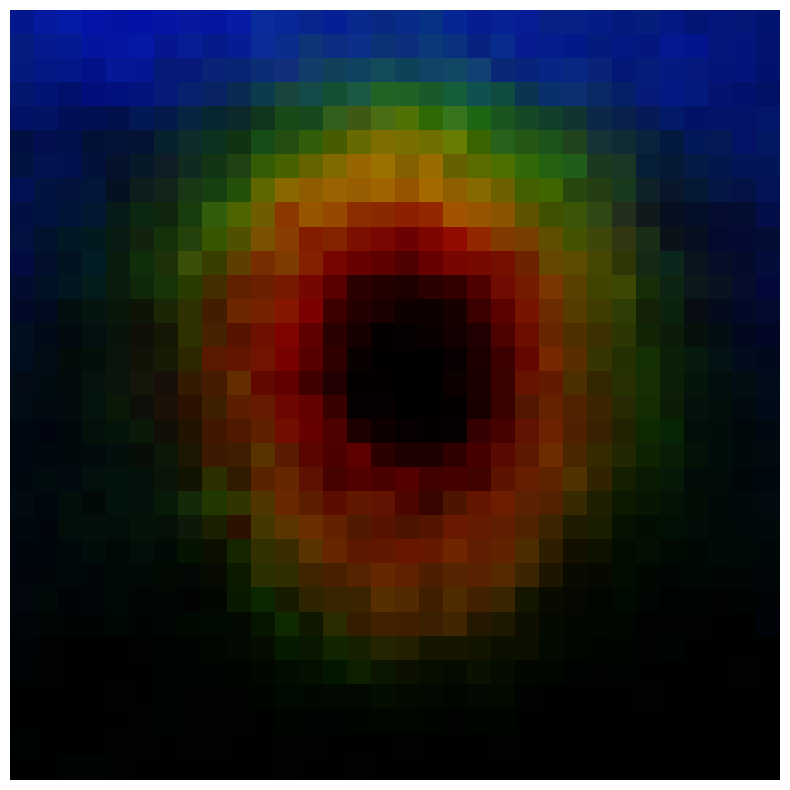

Epoch 2/100, Rec Loss: 2112.296142578125, KL Div: 5.384565830230713
Epoch 3/100, Rec Loss: 2058.4521484375, KL Div: 5.2006049156188965
Epoch 4/100, Rec Loss: 2053.44140625, KL Div: 6.118751049041748
Epoch 5/100, Rec Loss: 2067.833740234375, KL Div: 5.2673468589782715
Epoch 6/100, Rec Loss: 2116.811279296875, KL Div: 5.4172210693359375
Epoch 7/100, Rec Loss: 2081.877197265625, KL Div: 5.630287170410156
Epoch 8/100, Rec Loss: 1947.6270751953125, KL Div: 7.03973388671875
Epoch 9/100, Rec Loss: 2101.862548828125, KL Div: 4.612799167633057
Epoch 10/100, Rec Loss: 2048.689697265625, KL Div: 5.64631986618042
Epoch 11/100, Rec Loss: 1971.8616943359375, KL Div: 7.403268337249756


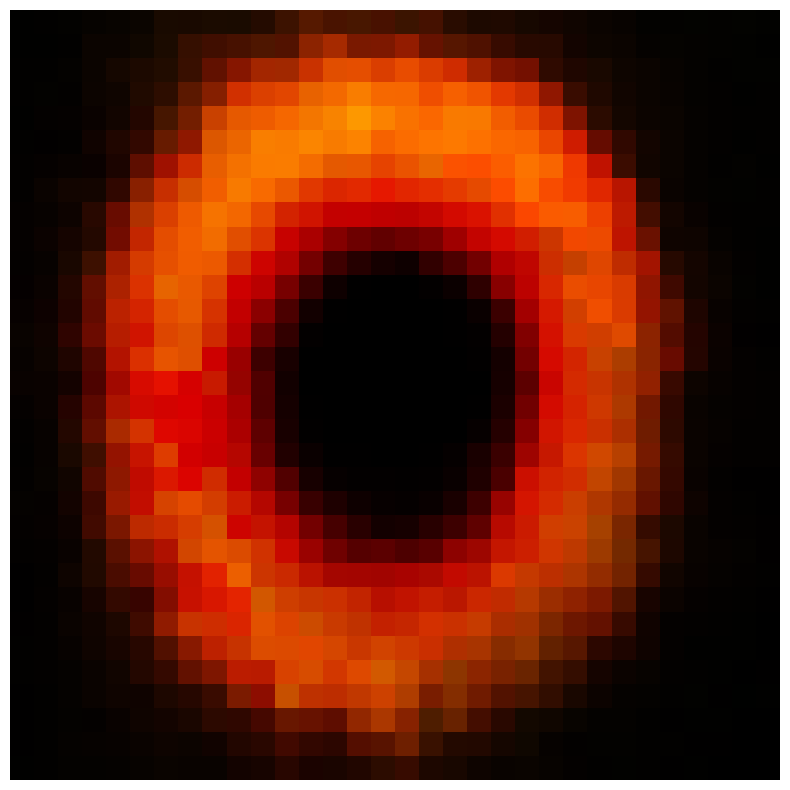

Epoch 12/100, Rec Loss: 2034.4586181640625, KL Div: 6.395596027374268
Epoch 13/100, Rec Loss: 2120.253662109375, KL Div: 4.493283748626709
Epoch 14/100, Rec Loss: 2110.622802734375, KL Div: 5.734311580657959
Epoch 15/100, Rec Loss: 1921.8101806640625, KL Div: 8.100428581237793
Epoch 16/100, Rec Loss: 2088.799560546875, KL Div: 5.138450622558594
Epoch 17/100, Rec Loss: 1993.3453369140625, KL Div: 7.369450092315674
Epoch 18/100, Rec Loss: 2008.201171875, KL Div: 7.32362174987793
Epoch 19/100, Rec Loss: 2060.810546875, KL Div: 5.152708530426025
Epoch 20/100, Rec Loss: 2090.6923828125, KL Div: 5.647613525390625
Epoch 21/100, Rec Loss: 2049.086669921875, KL Div: 5.977352619171143


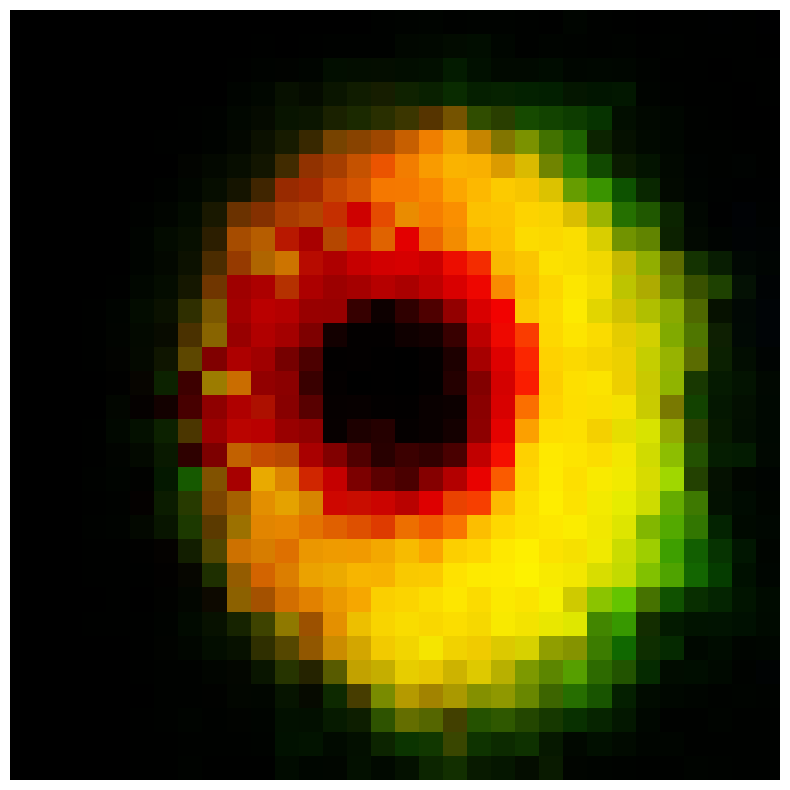

Epoch 22/100, Rec Loss: 2042.5302734375, KL Div: 5.994201183319092
Epoch 23/100, Rec Loss: 2107.37890625, KL Div: 6.281438827514648
Epoch 24/100, Rec Loss: 1996.2601318359375, KL Div: 5.556318759918213
Epoch 25/100, Rec Loss: 1987.6978759765625, KL Div: 8.473938941955566
Epoch 26/100, Rec Loss: 1968.4703369140625, KL Div: 7.515927791595459
Epoch 27/100, Rec Loss: 1984.7191162109375, KL Div: 6.543028354644775
Epoch 28/100, Rec Loss: 2022.8414306640625, KL Div: 6.3173370361328125
Epoch 29/100, Rec Loss: 1934.7392578125, KL Div: 7.751775741577148
Epoch 30/100, Rec Loss: 2001.37158203125, KL Div: 6.8410420417785645
Epoch 31/100, Rec Loss: 2076.2353515625, KL Div: 4.4947590827941895


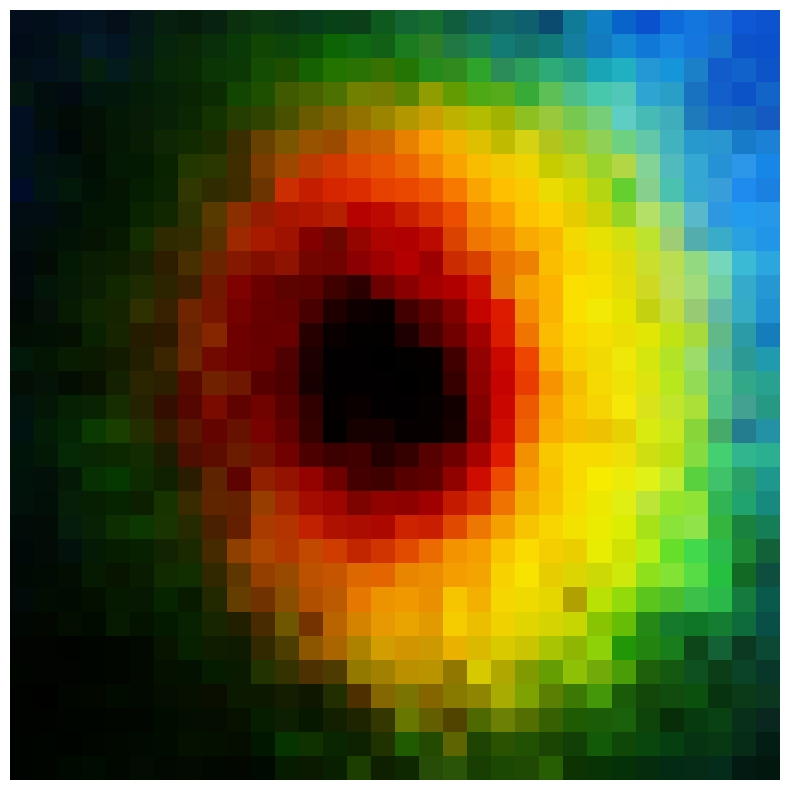

Epoch 32/100, Rec Loss: 2031.564453125, KL Div: 6.038854598999023
Epoch 33/100, Rec Loss: 1876.2410888671875, KL Div: 8.669112205505371
Epoch 34/100, Rec Loss: 2011.4559326171875, KL Div: 6.155666828155518
Epoch 35/100, Rec Loss: 2067.898193359375, KL Div: 7.861927509307861
Epoch 36/100, Rec Loss: 2076.581787109375, KL Div: 4.877340316772461
Epoch 37/100, Rec Loss: 2060.50341796875, KL Div: 7.350858688354492
Epoch 38/100, Rec Loss: 1928.7967529296875, KL Div: 8.770182609558105
Epoch 39/100, Rec Loss: 2067.82080078125, KL Div: 8.131226539611816
Epoch 40/100, Rec Loss: 1964.13427734375, KL Div: 8.600293159484863
Epoch 41/100, Rec Loss: 2088.568359375, KL Div: 5.446788787841797


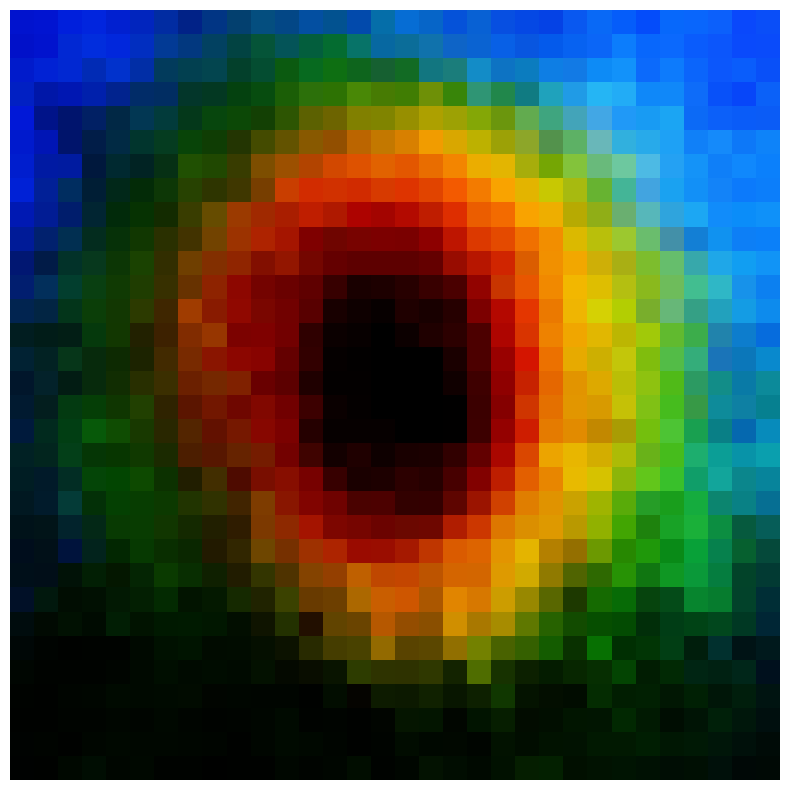

Epoch 42/100, Rec Loss: 2055.018310546875, KL Div: 6.65527868270874
Epoch 43/100, Rec Loss: 2053.0849609375, KL Div: 5.326995372772217
Epoch 44/100, Rec Loss: 1958.89501953125, KL Div: 7.734821319580078
Epoch 45/100, Rec Loss: 2045.1585693359375, KL Div: 5.636708736419678
Epoch 46/100, Rec Loss: 1991.1922607421875, KL Div: 6.516201496124268
Epoch 47/100, Rec Loss: 2033.0811767578125, KL Div: 5.809206485748291
Epoch 48/100, Rec Loss: 2039.8095703125, KL Div: 5.840495586395264
Epoch 49/100, Rec Loss: 2108.499267578125, KL Div: 5.60760498046875
Epoch 50/100, Rec Loss: 1987.8935546875, KL Div: 7.217614650726318
Epoch 51/100, Rec Loss: 2080.802978515625, KL Div: 5.774925708770752


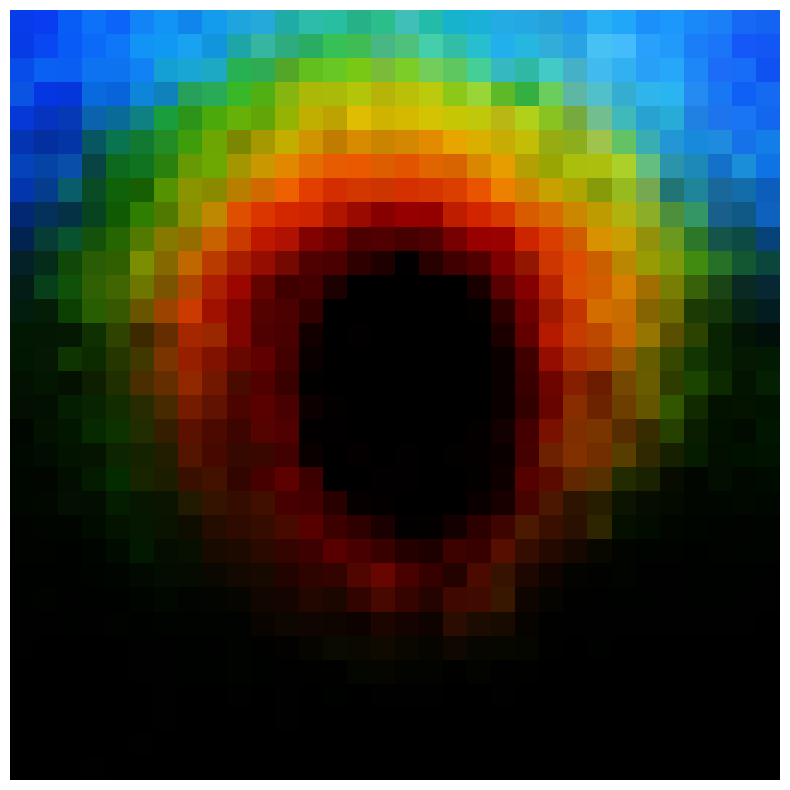

Epoch 52/100, Rec Loss: 1978.0550537109375, KL Div: 5.944087982177734
Epoch 53/100, Rec Loss: 1960.6683349609375, KL Div: 6.405374050140381
Epoch 54/100, Rec Loss: 2106.53271484375, KL Div: 5.546842098236084
Epoch 55/100, Rec Loss: 1994.2017822265625, KL Div: 7.294231414794922
Epoch 56/100, Rec Loss: 2020.4713134765625, KL Div: 7.021103382110596
Epoch 57/100, Rec Loss: 2052.7939453125, KL Div: 7.66184663772583
Epoch 58/100, Rec Loss: 1954.2227783203125, KL Div: 6.824856281280518
Epoch 59/100, Rec Loss: 2001.6051025390625, KL Div: 6.45934534072876
Epoch 60/100, Rec Loss: 1948.7017822265625, KL Div: 8.383038520812988
Epoch 61/100, Rec Loss: 2046.2994384765625, KL Div: 5.617650985717773


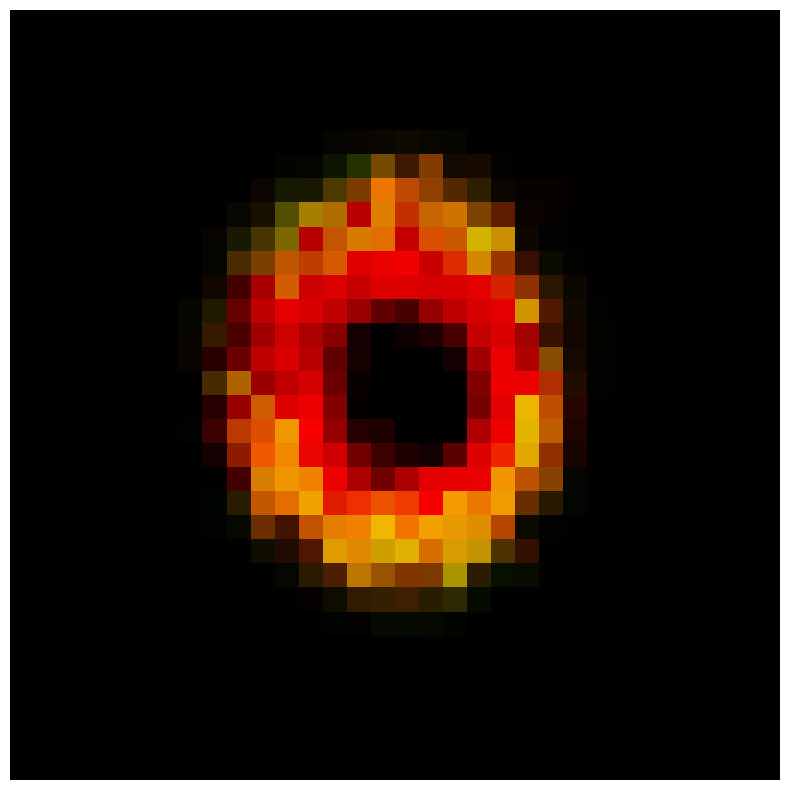

Epoch 62/100, Rec Loss: 2121.585205078125, KL Div: 4.2633514404296875
Epoch 63/100, Rec Loss: 2077.4248046875, KL Div: 5.351778507232666
Epoch 64/100, Rec Loss: 2068.167724609375, KL Div: 5.669471263885498
Epoch 65/100, Rec Loss: 2040.4075927734375, KL Div: 6.637975692749023
Epoch 66/100, Rec Loss: 2061.4736328125, KL Div: 7.654780864715576
Epoch 67/100, Rec Loss: 2089.463134765625, KL Div: 4.916096210479736
Epoch 68/100, Rec Loss: 2087.914794921875, KL Div: 7.110490798950195
Epoch 69/100, Rec Loss: 1918.4595947265625, KL Div: 7.472850799560547
Epoch 70/100, Rec Loss: 2047.4029541015625, KL Div: 4.956325531005859
Epoch 71/100, Rec Loss: 2083.0810546875, KL Div: 10.58581256866455


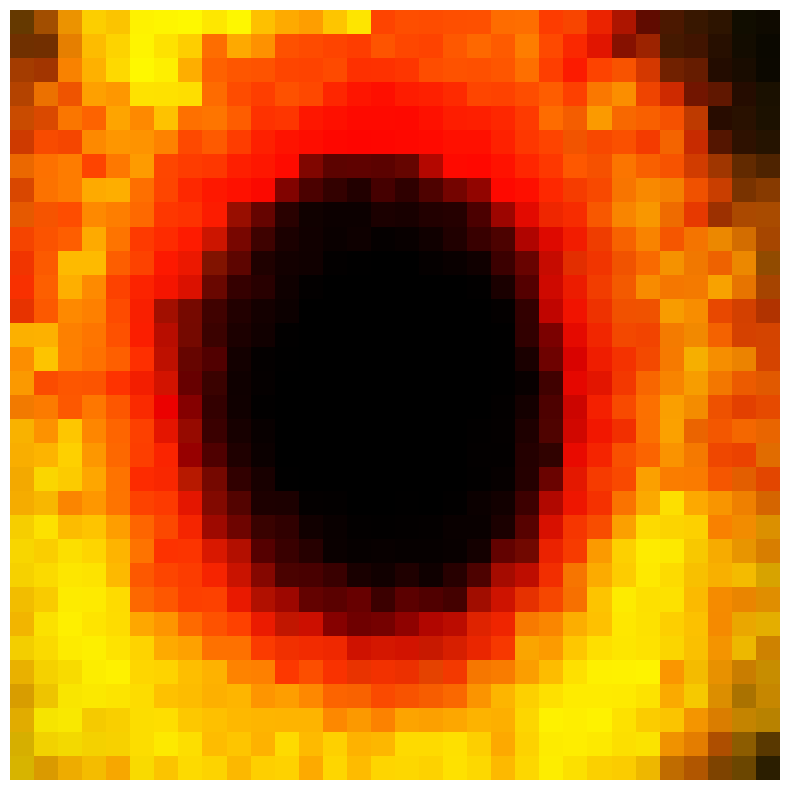

Epoch 72/100, Rec Loss: 2036.6214599609375, KL Div: 7.982626438140869
Epoch 73/100, Rec Loss: 2000.3743896484375, KL Div: 7.555619716644287
Epoch 74/100, Rec Loss: 2044.03515625, KL Div: 5.64432954788208
Epoch 75/100, Rec Loss: 2020.03125, KL Div: 13.058938026428223
Epoch 76/100, Rec Loss: 2007.9788818359375, KL Div: 6.3199944496154785
Epoch 77/100, Rec Loss: 2065.33203125, KL Div: 6.330341815948486
Epoch 78/100, Rec Loss: 2119.8857421875, KL Div: 4.857122421264648
Epoch 79/100, Rec Loss: 2056.8486328125, KL Div: 5.656062602996826
Epoch 80/100, Rec Loss: 2072.439208984375, KL Div: 6.192803859710693
Epoch 81/100, Rec Loss: 2026.4677734375, KL Div: 6.1966471672058105


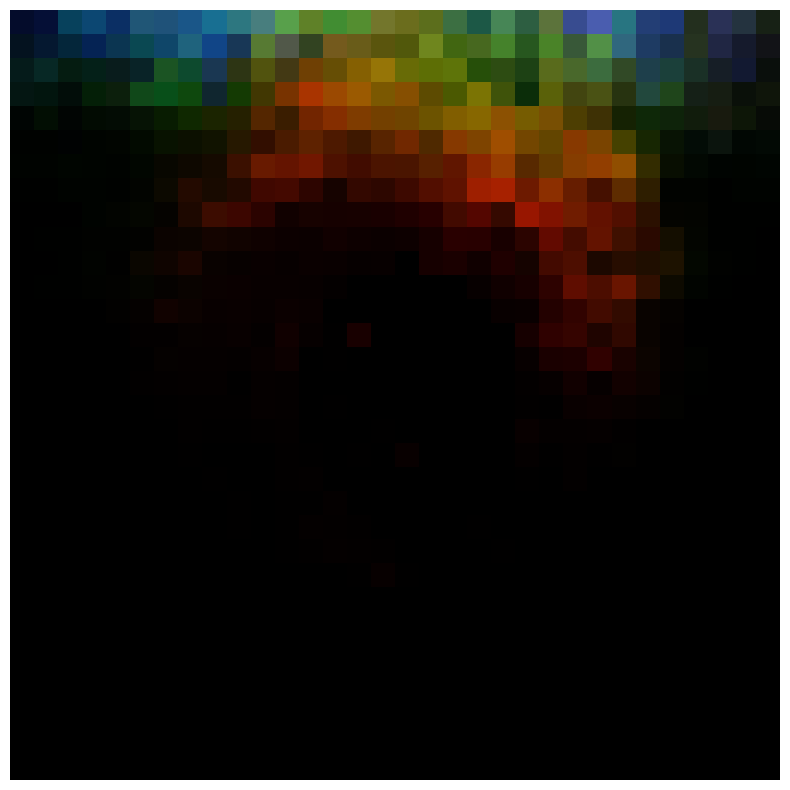

Epoch 82/100, Rec Loss: 2028.8717041015625, KL Div: 6.050760746002197
Epoch 83/100, Rec Loss: 2034.4029541015625, KL Div: 6.610142230987549
Epoch 84/100, Rec Loss: 2040.13623046875, KL Div: 5.779609203338623
Epoch 85/100, Rec Loss: 2072.37841796875, KL Div: 6.521594524383545
Epoch 86/100, Rec Loss: 2040.87841796875, KL Div: 5.637361526489258
Epoch 87/100, Rec Loss: 2045.2132568359375, KL Div: 6.079425811767578
Epoch 88/100, Rec Loss: 1938.7410888671875, KL Div: 7.0077805519104
Epoch 89/100, Rec Loss: 1980.1556396484375, KL Div: 7.1667799949646
Epoch 90/100, Rec Loss: 2074.224365234375, KL Div: 6.650222301483154
Epoch 91/100, Rec Loss: 1800.5518798828125, KL Div: 11.846495628356934


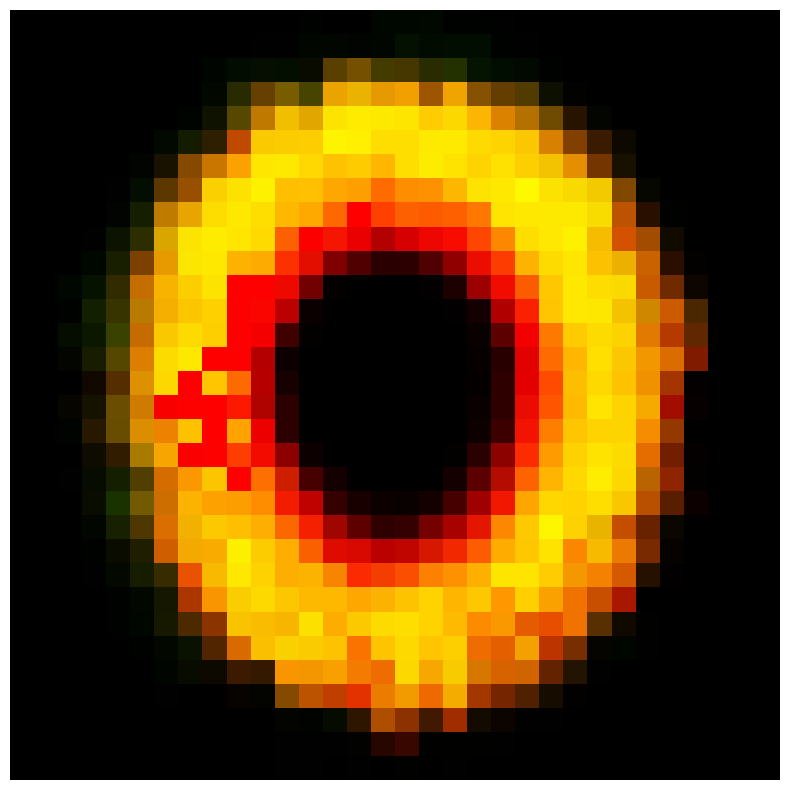

Epoch 92/100, Rec Loss: 2030.619140625, KL Div: 5.8134846687316895
Epoch 93/100, Rec Loss: 2122.525634765625, KL Div: 4.573676586151123
Epoch 94/100, Rec Loss: 1829.9100341796875, KL Div: 11.648316383361816
Epoch 95/100, Rec Loss: 1962.0941162109375, KL Div: 7.0718560218811035
Epoch 96/100, Rec Loss: 2028.1968994140625, KL Div: 6.609150409698486
Epoch 97/100, Rec Loss: 1979.2197265625, KL Div: 8.914660453796387
Epoch 98/100, Rec Loss: 2044.4091796875, KL Div: 5.777791976928711
Epoch 99/100, Rec Loss: 2017.3134765625, KL Div: 7.9155449867248535
Epoch 100/100, Rec Loss: 2113.45849609375, KL Div: 5.797921657562256


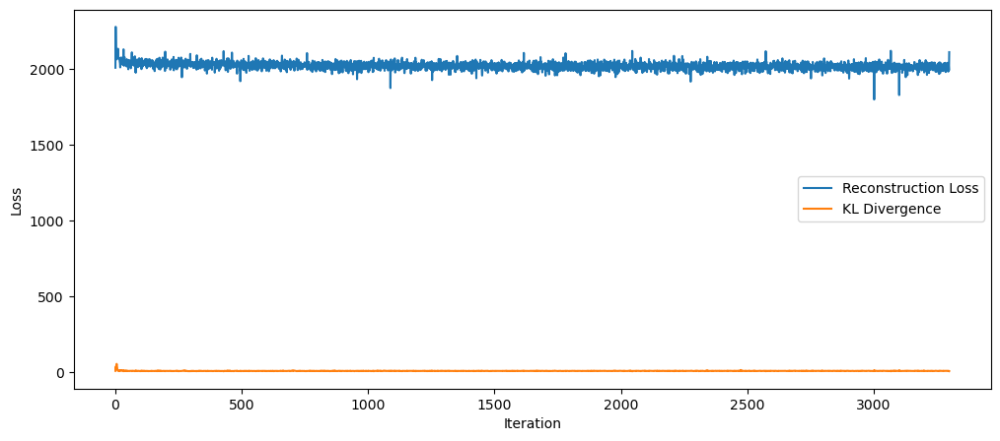

In [163]:
lr = 1e-3
#lr = 0.0005
optimizer = optimizers.Adam(lr)

# Training loop
num_epochs = 100
history = {'rec_loss': [], 'kl_div': []}

for epoch in range(num_epochs):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 3072])
        with tf.GradientTape() as tape:
            x_rec_logits, mu, log_var = vae(x)
            rec_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=x, logits=x_rec_logits)
            rec_loss = tf.reduce_sum(rec_loss) / x.shape[0]
            kl_div = -0.5 * (log_var + 1 - mu**2 - tf.exp(log_var))
            kl_div = tf.reduce_sum(kl_div) / x.shape[0]
            loss = rec_loss + 1.0 * kl_div

        # Calculate gradients and update weights
        grads = tape.gradient(loss, vae.trainable_variables)
        optimizer.apply_gradients(zip(grads, vae.trainable_variables))

        # Save training history
        history['rec_loss'].append(rec_loss.numpy())
        history['kl_div'].append(kl_div.numpy())

    # Print training progress every 10 epochs
    #if epoch % 10 == 0:
    print(f"Epoch {epoch+1}/{num_epochs}, Rec Loss: {rec_loss.numpy()}, KL Div: {kl_div.numpy()}")

    # Generate and plot images every 10 epochs
    if epoch % 10 == 0:
        generated_images = vae.decoder(tf.random.normal(shape=(25, latent_dim)))
        generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
        plt.figure(figsize=(10, 10))
        for i in range(1):
            plt.subplot(1, 1, i+1)
            plt.imshow(generated_images[i].numpy())
            plt.axis('off')
        plt.show()

# Plot training history
plt.figure(figsize=(12, 5))
plt.plot(history['rec_loss'], label='Reconstruction Loss')
plt.plot(history['kl_div'], label='KL Divergence')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [123]:
vae.summary()

Model: "vae_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_61 (Dense)             multiple                  393344    
_________________________________________________________________
dense_62 (Dense)             multiple                  1290      
_________________________________________________________________
dense_63 (Dense)             multiple                  1290      
_________________________________________________________________
dense_64 (Dense)             multiple                  1408      
_________________________________________________________________
dense_65 (Dense)             multiple                  396288    
Total params: 793,620
Trainable params: 793,620
Non-trainable params: 0
_________________________________________________________________


#### We choose sunflower

#### task(2)
* With latent_dim =  256

Epoch 1/100, Rec Loss: 2117.662353515625, KL Div: 8.804081916809082


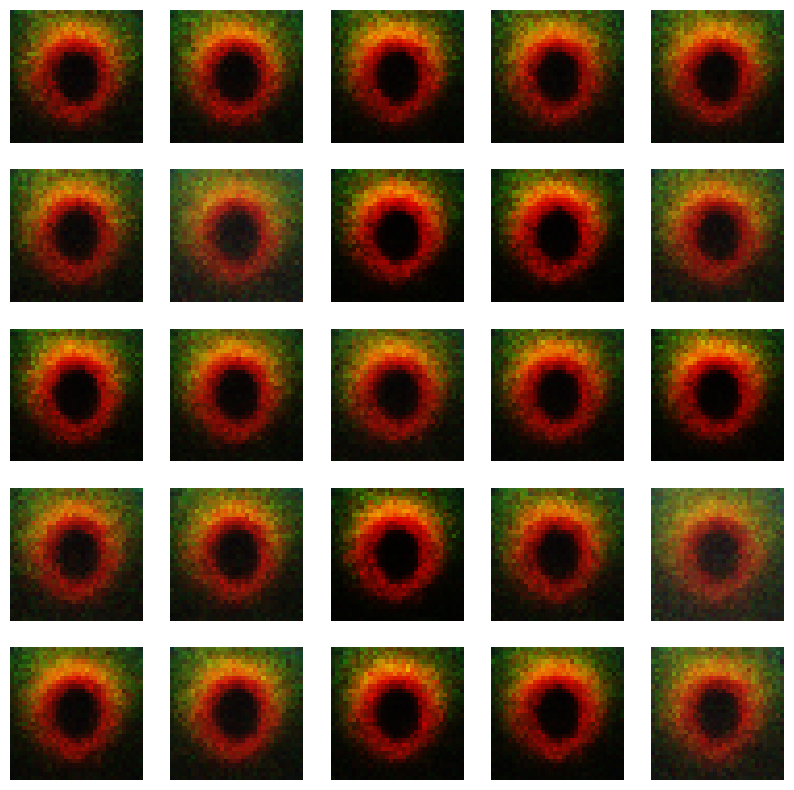

Epoch 2/100, Rec Loss: 2079.219970703125, KL Div: 1.1415809392929077
Epoch 3/100, Rec Loss: 2057.254150390625, KL Div: 1.7761645317077637
Epoch 4/100, Rec Loss: 2101.590087890625, KL Div: 7.0986809730529785
Epoch 5/100, Rec Loss: 1980.8782958984375, KL Div: 7.183407306671143
Epoch 6/100, Rec Loss: 2044.9693603515625, KL Div: 13.088753700256348
Epoch 7/100, Rec Loss: 2145.1015625, KL Div: 3.5740697383880615
Epoch 8/100, Rec Loss: 2045.8424072265625, KL Div: 2.9774134159088135
Epoch 9/100, Rec Loss: 2087.32568359375, KL Div: 2.5684382915496826
Epoch 10/100, Rec Loss: 2009.58935546875, KL Div: 0.6226639747619629
Epoch 11/100, Rec Loss: 2067.812744140625, KL Div: 0.8332430720329285


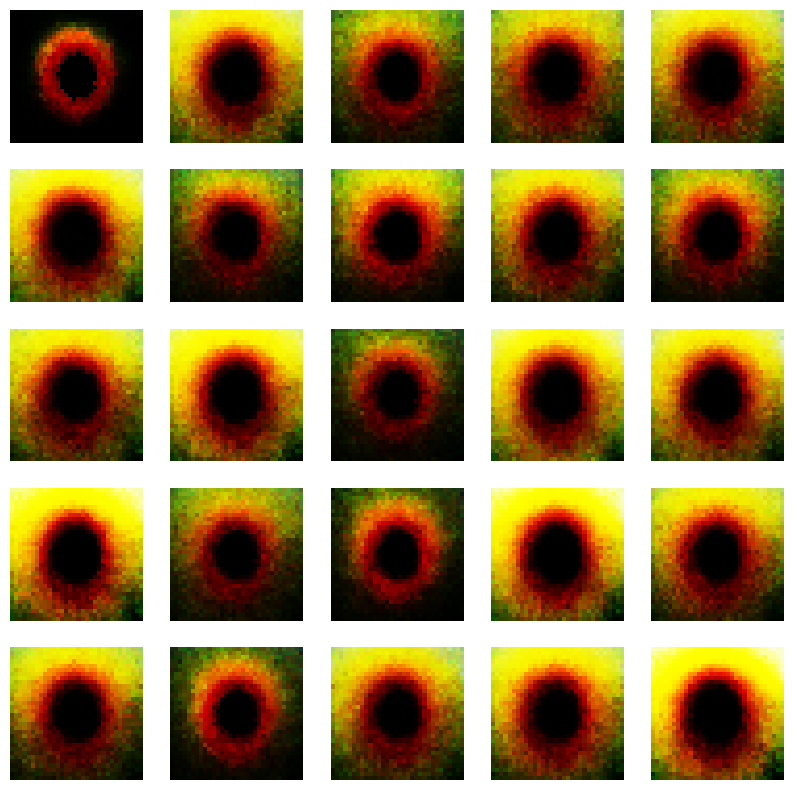

Epoch 12/100, Rec Loss: 2028.55859375, KL Div: 7.755105495452881
Epoch 13/100, Rec Loss: 2047.1334228515625, KL Div: 1.029448390007019
Epoch 14/100, Rec Loss: 2092.904296875, KL Div: 4.1444854736328125
Epoch 15/100, Rec Loss: 2093.611572265625, KL Div: 1.0347706079483032
Epoch 16/100, Rec Loss: 2150.672607421875, KL Div: 2.2415530681610107
Epoch 17/100, Rec Loss: 2110.853759765625, KL Div: 0.8123754858970642
Epoch 18/100, Rec Loss: 2053.769775390625, KL Div: 3.1956329345703125
Epoch 19/100, Rec Loss: 2058.42626953125, KL Div: 2.468297243118286
Epoch 20/100, Rec Loss: 2049.342529296875, KL Div: 2.306854486465454
Epoch 21/100, Rec Loss: 2106.622802734375, KL Div: 2.6006357669830322


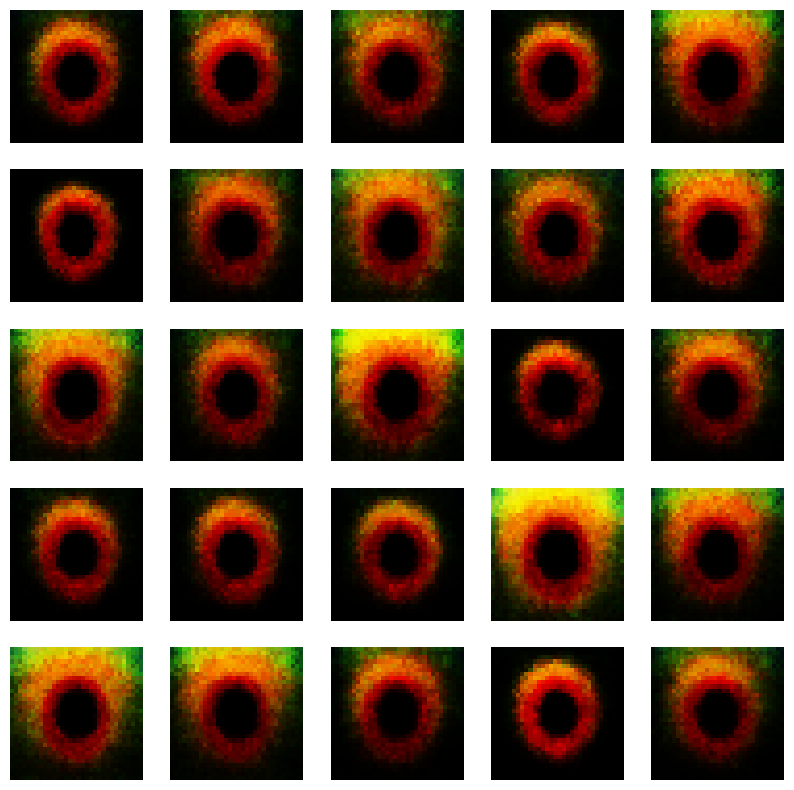

Epoch 22/100, Rec Loss: 2079.449951171875, KL Div: 0.6716670989990234
Epoch 23/100, Rec Loss: 2076.525634765625, KL Div: 9.379668235778809
Epoch 24/100, Rec Loss: 1993.8013916015625, KL Div: 2.3730552196502686
Epoch 25/100, Rec Loss: 2091.237548828125, KL Div: 5.831491470336914
Epoch 26/100, Rec Loss: 2035.44140625, KL Div: 1.499681830406189
Epoch 27/100, Rec Loss: 2136.660400390625, KL Div: 0.6697282791137695
Epoch 28/100, Rec Loss: 2126.7763671875, KL Div: 1.612664818763733
Epoch 29/100, Rec Loss: 2054.919921875, KL Div: 1.7385088205337524
Epoch 30/100, Rec Loss: 2061.4111328125, KL Div: 2.341662645339966
Epoch 31/100, Rec Loss: 2055.9052734375, KL Div: 1.7711848020553589


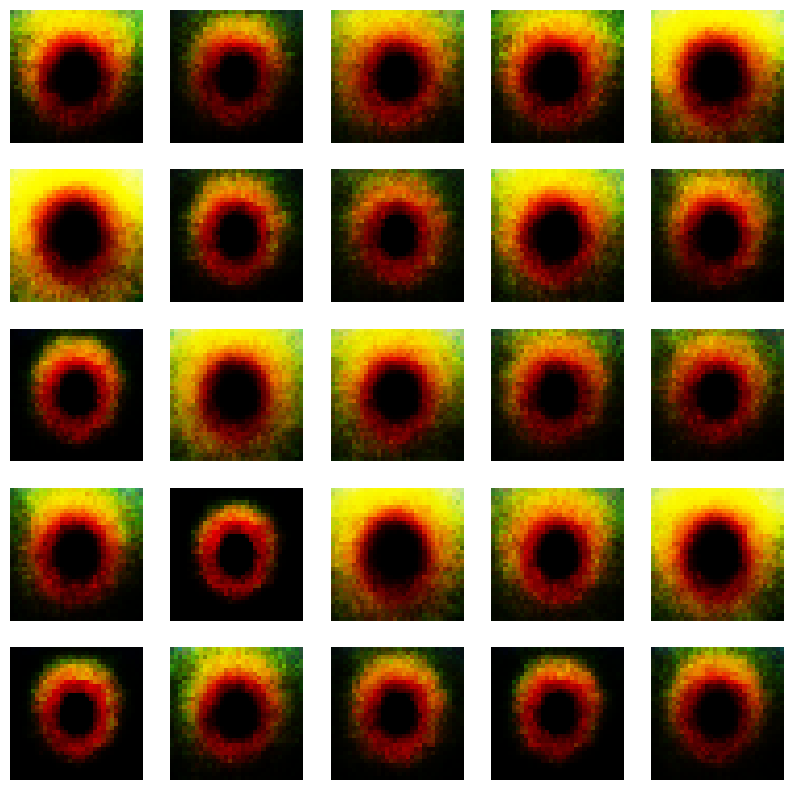

Epoch 32/100, Rec Loss: 2090.152587890625, KL Div: 1.834485411643982
Epoch 33/100, Rec Loss: 2101.738037109375, KL Div: 2.6779215335845947
Epoch 34/100, Rec Loss: 2145.0234375, KL Div: 1.0360361337661743
Epoch 35/100, Rec Loss: 2134.583740234375, KL Div: 0.9638938307762146
Epoch 36/100, Rec Loss: 2090.150146484375, KL Div: 1.2252064943313599
Epoch 37/100, Rec Loss: 2129.413330078125, KL Div: 1.7682682275772095
Epoch 38/100, Rec Loss: 2050.717529296875, KL Div: 1.7410472631454468
Epoch 39/100, Rec Loss: 2063.86865234375, KL Div: 1.9453922510147095
Epoch 40/100, Rec Loss: 1964.1361083984375, KL Div: 2.3755056858062744
Epoch 41/100, Rec Loss: 2013.1767578125, KL Div: 1.9167252779006958


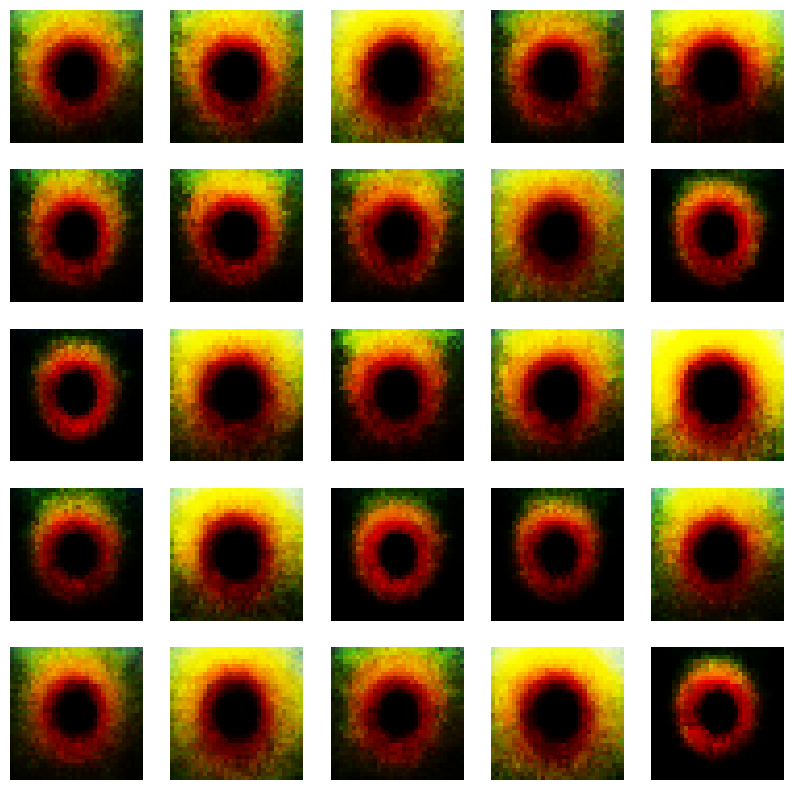

Epoch 42/100, Rec Loss: 2043.2467041015625, KL Div: 2.92699933052063
Epoch 43/100, Rec Loss: 2041.4453125, KL Div: 2.0940887928009033
Epoch 44/100, Rec Loss: 2131.281005859375, KL Div: 4.133235931396484
Epoch 45/100, Rec Loss: 2169.499755859375, KL Div: 1.4403891563415527
Epoch 46/100, Rec Loss: 2051.475341796875, KL Div: 2.9870150089263916
Epoch 47/100, Rec Loss: 2075.888671875, KL Div: 1.2170109748840332
Epoch 48/100, Rec Loss: 2173.711181640625, KL Div: 0.3737677037715912
Epoch 49/100, Rec Loss: 2120.232177734375, KL Div: 0.32307830452919006
Epoch 50/100, Rec Loss: 2051.699462890625, KL Div: 2.3444533348083496
Epoch 51/100, Rec Loss: 2054.537109375, KL Div: 4.814996719360352


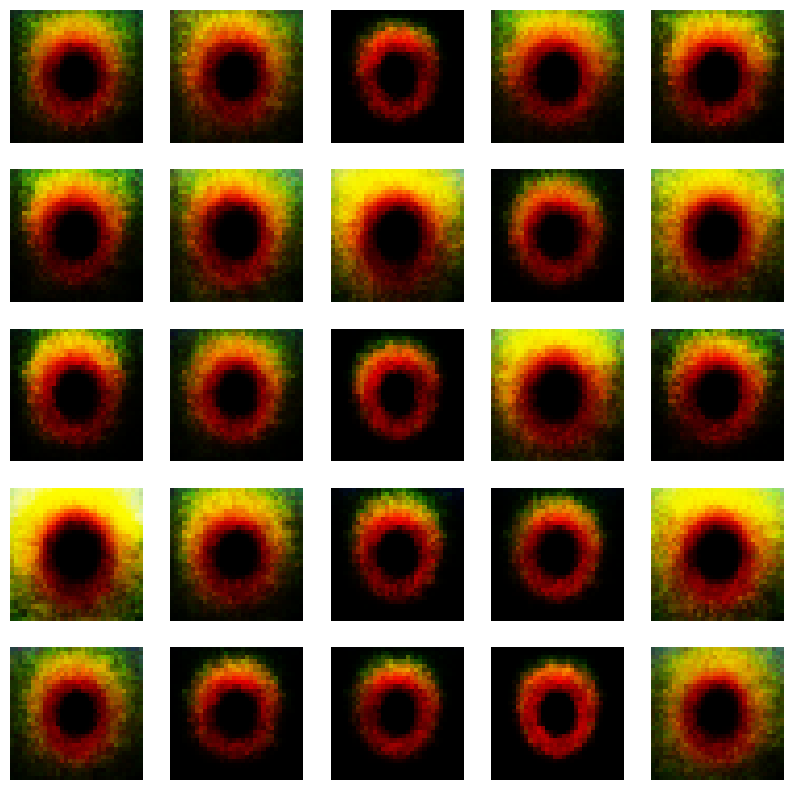

Epoch 52/100, Rec Loss: 2139.508056640625, KL Div: 0.754577100276947
Epoch 53/100, Rec Loss: 2092.752197265625, KL Div: 3.6237494945526123
Epoch 54/100, Rec Loss: 2054.93701171875, KL Div: 4.758101940155029
Epoch 55/100, Rec Loss: 2107.049560546875, KL Div: 7.008905410766602
Epoch 56/100, Rec Loss: 2072.498291015625, KL Div: 5.408727169036865
Epoch 57/100, Rec Loss: 2012.6195068359375, KL Div: 2.9677579402923584
Epoch 58/100, Rec Loss: 2060.583740234375, KL Div: 2.2862632274627686
Epoch 59/100, Rec Loss: 2062.75439453125, KL Div: 4.185115337371826
Epoch 60/100, Rec Loss: 2046.4595947265625, KL Div: 3.633066415786743
Epoch 61/100, Rec Loss: 2095.551513671875, KL Div: 1.7427459955215454


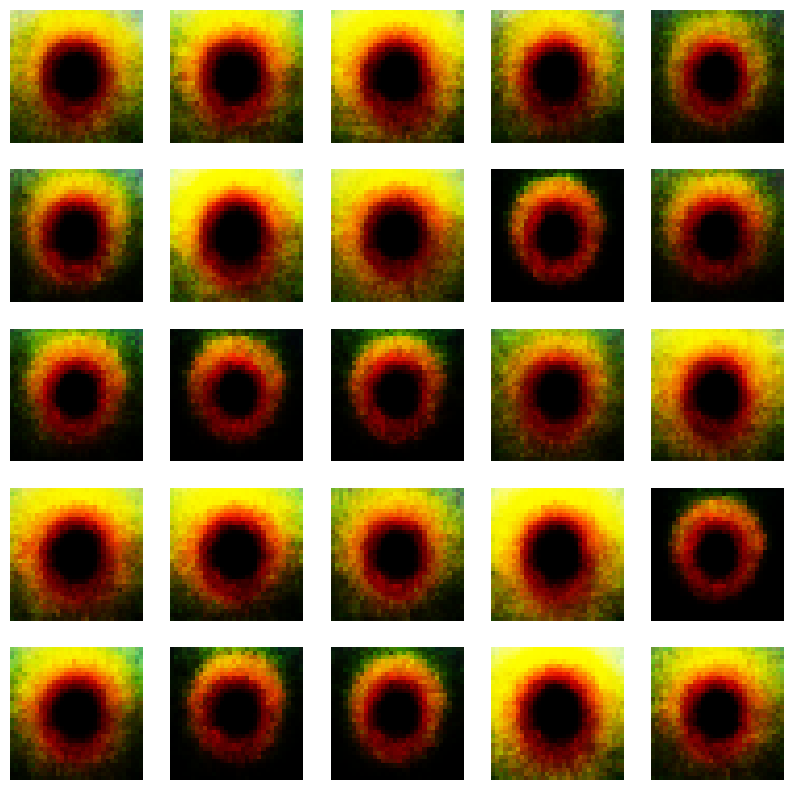

Epoch 62/100, Rec Loss: 2007.9361572265625, KL Div: 1.0980451107025146
Epoch 63/100, Rec Loss: 1979.2813720703125, KL Div: 2.1014976501464844
Epoch 64/100, Rec Loss: 2114.100830078125, KL Div: 3.1381232738494873
Epoch 65/100, Rec Loss: 2114.097900390625, KL Div: 2.726728677749634
Epoch 66/100, Rec Loss: 2081.664794921875, KL Div: 1.0703392028808594
Epoch 67/100, Rec Loss: 2046.8782958984375, KL Div: 2.6198673248291016
Epoch 68/100, Rec Loss: 2074.599853515625, KL Div: 2.47420597076416
Epoch 69/100, Rec Loss: 2024.6761474609375, KL Div: 2.9239470958709717
Epoch 70/100, Rec Loss: 2036.5716552734375, KL Div: 2.927157402038574
Epoch 71/100, Rec Loss: 2088.90087890625, KL Div: 2.8266351222991943


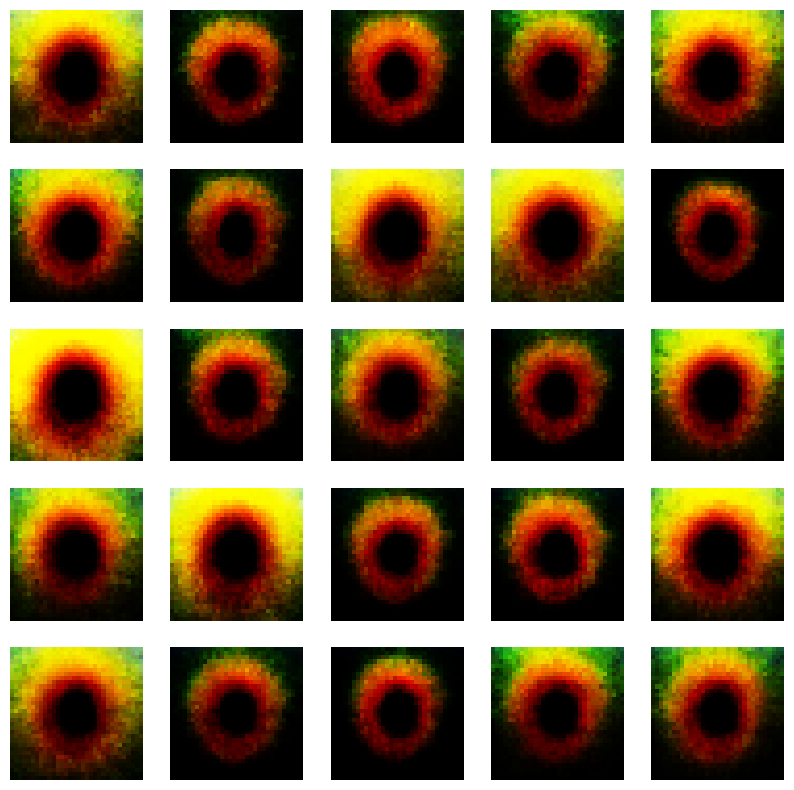

Epoch 72/100, Rec Loss: 2055.142333984375, KL Div: 8.844975471496582
Epoch 73/100, Rec Loss: 2059.530517578125, KL Div: 2.1643598079681396
Epoch 74/100, Rec Loss: 2122.178955078125, KL Div: 3.682286262512207
Epoch 75/100, Rec Loss: 2105.1015625, KL Div: 3.8101966381073
Epoch 76/100, Rec Loss: 2067.80126953125, KL Div: 3.210646867752075
Epoch 77/100, Rec Loss: 2162.978759765625, KL Div: 1.0746088027954102
Epoch 78/100, Rec Loss: 2116.910400390625, KL Div: 2.39432692527771
Epoch 79/100, Rec Loss: 2095.7099609375, KL Div: 1.6987967491149902
Epoch 80/100, Rec Loss: 2035.4896240234375, KL Div: 2.608818292617798
Epoch 81/100, Rec Loss: 1989.3443603515625, KL Div: 4.590517520904541


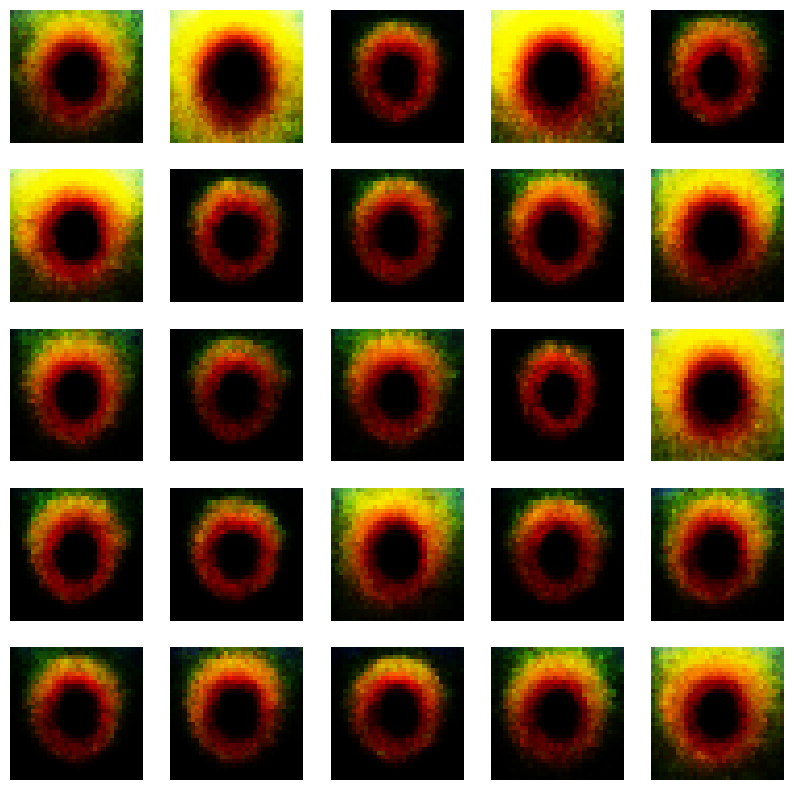

Epoch 82/100, Rec Loss: 1929.38427734375, KL Div: 3.662581205368042
Epoch 83/100, Rec Loss: 2116.25146484375, KL Div: 7.83761739730835
Epoch 84/100, Rec Loss: 2086.694580078125, KL Div: 1.9811049699783325
Epoch 85/100, Rec Loss: 2048.287841796875, KL Div: 2.1639535427093506
Epoch 86/100, Rec Loss: 2128.986328125, KL Div: 2.1583497524261475
Epoch 87/100, Rec Loss: 2069.289794921875, KL Div: 3.04455828666687
Epoch 88/100, Rec Loss: 2054.520751953125, KL Div: 2.486222743988037
Epoch 89/100, Rec Loss: 2098.055419921875, KL Div: 2.721061944961548
Epoch 90/100, Rec Loss: 2063.331298828125, KL Div: 4.7601823806762695
Epoch 91/100, Rec Loss: 2085.9892578125, KL Div: 1.7005401849746704


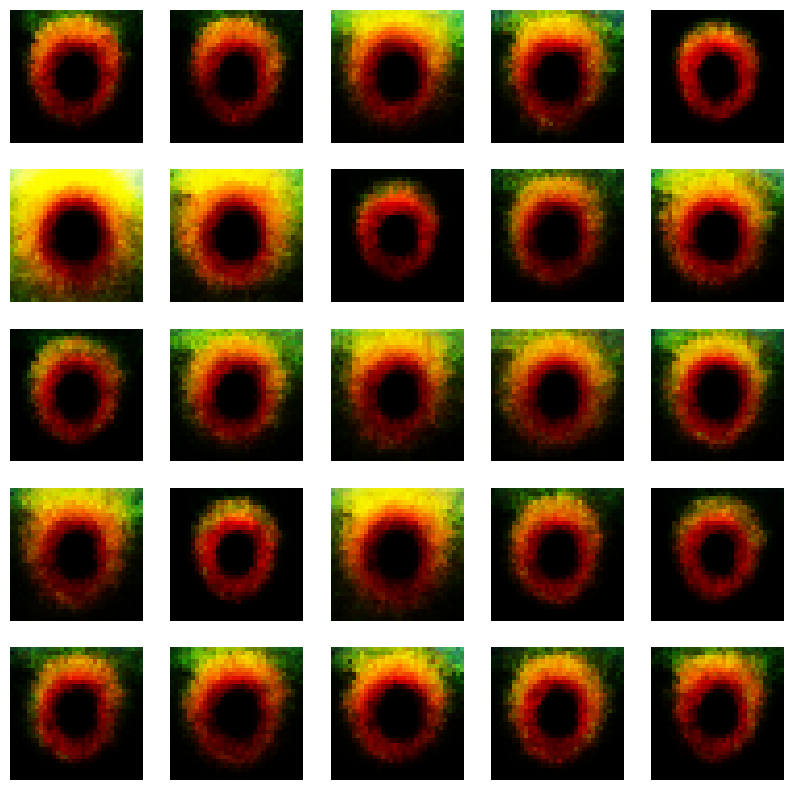

Epoch 92/100, Rec Loss: 2130.872802734375, KL Div: 2.235440254211426
Epoch 93/100, Rec Loss: 2056.638916015625, KL Div: 3.5779287815093994
Epoch 94/100, Rec Loss: 2084.89794921875, KL Div: 4.39664888381958
Epoch 95/100, Rec Loss: 2088.570068359375, KL Div: 1.7351655960083008
Epoch 96/100, Rec Loss: 2100.717529296875, KL Div: 3.1453959941864014
Epoch 97/100, Rec Loss: 2054.919921875, KL Div: 2.8435633182525635
Epoch 98/100, Rec Loss: 1997.693359375, KL Div: 3.5045626163482666
Epoch 99/100, Rec Loss: 2147.620849609375, KL Div: 3.4201252460479736
Epoch 100/100, Rec Loss: 2160.075927734375, KL Div: 2.7265090942382812


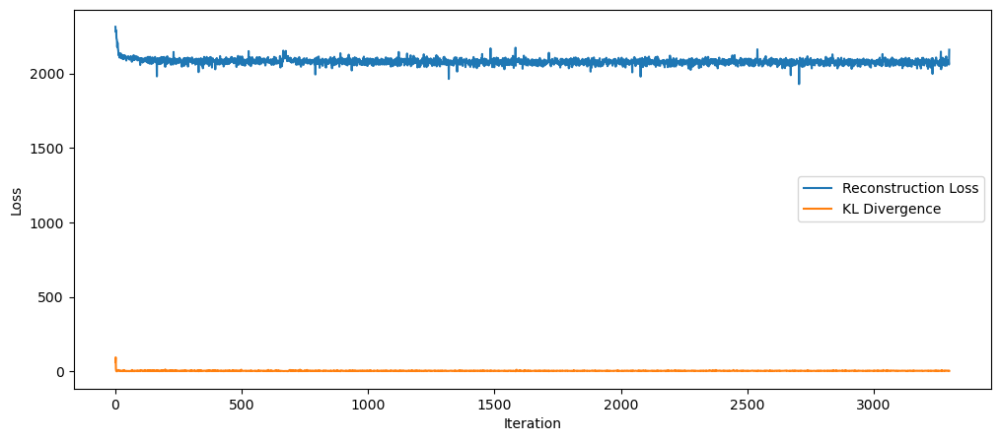

In [167]:
latent_dim = 256
class VAE(keras.Model):
    def __init__(self, z_dim=latent_dim):
        super(VAE, self).__init__()
        self.fc1 = layers.Dense(512)
        self.fc2 = layers.Dense(z_dim)
        self.fc3 = layers.Dense(z_dim)
        self.fc4 = layers.Dense(512)
        self.fc5 = layers.Dense(3072)

    def encoder(self, x):
        h = tf.nn.relu(self.fc1(x))
        mu = self.fc2(h)
        log_var = self.fc3(h)
        return mu, log_var

    def decoder(self, z):
        out = tf.nn.relu(self.fc4(z))
        x_hat = tf.nn.sigmoid(self.fc5(out))
        return x_hat

    def call(self, inputs, training=None):
        mu, log_var = self.encoder(inputs)
        z = self.reparameterize(mu, log_var)
        x_hat = self.decoder(z)
        return x_hat, mu, log_var

    def reparameterize(self, mu, log_var):
        eps = tf.random.normal(log_var.shape)
        std = tf.exp(0.5 * log_var)
        z = mu + std * eps
        return z

vae = VAE(z_dim=latent_dim)
# Build the model with a dummy input shape
vae.build(input_shape=(4, 3072))
lr = 1e-3
#lr = 0.0005
optimizer = optimizers.Adam(lr)

# Training loop
num_epochs = 100
history = {'rec_loss': [], 'kl_div': []}

for epoch in range(num_epochs):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 3072])
        with tf.GradientTape() as tape:
            x_rec_logits, mu, log_var = vae(x)
            rec_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=x, logits=x_rec_logits)
            rec_loss = tf.reduce_sum(rec_loss) / x.shape[0]
            kl_div = -0.5 * (log_var + 1 - mu**2 - tf.exp(log_var))
            kl_div = tf.reduce_sum(kl_div) / x.shape[0]
            loss = rec_loss + 1.0 * kl_div

        # Calculate gradients and update weights
        grads = tape.gradient(loss, vae.trainable_variables)
        optimizer.apply_gradients(zip(grads, vae.trainable_variables))

        # Save training history
        history['rec_loss'].append(rec_loss.numpy())
        history['kl_div'].append(kl_div.numpy())

    # Print training progress every 10 epochs
    #if epoch % 10 == 0:
    print(f"Epoch {epoch+1}/{num_epochs}, Rec Loss: {rec_loss.numpy()}, KL Div: {kl_div.numpy()}")

    # Generate and plot images every 10 epochs
    if epoch % 10 == 0:
        generated_images = vae.decoder(tf.random.normal(shape=(25, latent_dim)))
        generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
        plt.figure(figsize=(10, 10))
        for i in range(25):
            plt.subplot(5, 5, i+1)
            plt.imshow(generated_images[i].numpy())
            plt.axis('off')
        plt.show()

# Plot training history
plt.figure(figsize=(12, 5))
plt.plot(history['rec_loss'], label='Reconstruction Loss')
plt.plot(history['kl_div'], label='KL Divergence')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()


Epoch 1/100, Rec Loss: 1972.3948974609375, KL Div: 6.685469150543213


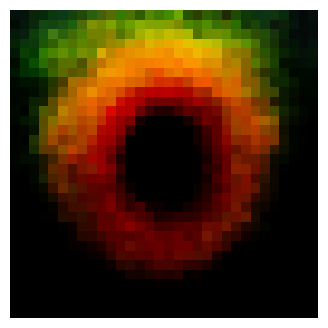

Epoch 2/100, Rec Loss: 2060.326904296875, KL Div: 7.6599202156066895
Epoch 3/100, Rec Loss: 2035.6644287109375, KL Div: 7.8656005859375
Epoch 4/100, Rec Loss: 2085.92822265625, KL Div: 3.4429776668548584
Epoch 5/100, Rec Loss: 2052.668701171875, KL Div: 1.1128422021865845
Epoch 6/100, Rec Loss: 2087.116943359375, KL Div: 2.834803342819214
Epoch 7/100, Rec Loss: 2127.776123046875, KL Div: 3.997346878051758
Epoch 8/100, Rec Loss: 2126.312744140625, KL Div: 0.5986836552619934
Epoch 9/100, Rec Loss: 2086.268310546875, KL Div: 3.9132156372070312
Epoch 10/100, Rec Loss: 2097.660888671875, KL Div: 3.1537959575653076
Epoch 11/100, Rec Loss: 2052.3173828125, KL Div: 4.312015533447266


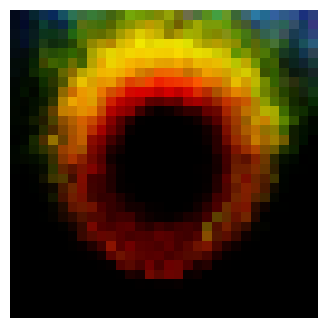

Epoch 12/100, Rec Loss: 2111.359130859375, KL Div: 5.498409271240234
Epoch 13/100, Rec Loss: 2134.989013671875, KL Div: 1.6592378616333008
Epoch 14/100, Rec Loss: 2127.26953125, KL Div: 4.121896266937256
Epoch 15/100, Rec Loss: 2073.85791015625, KL Div: 4.495357990264893
Epoch 16/100, Rec Loss: 2034.0576171875, KL Div: 2.608919382095337
Epoch 17/100, Rec Loss: 2109.091064453125, KL Div: 2.3659160137176514
Epoch 18/100, Rec Loss: 2086.669921875, KL Div: 1.6613324880599976
Epoch 19/100, Rec Loss: 2088.712158203125, KL Div: 3.4908742904663086
Epoch 20/100, Rec Loss: 2095.04052734375, KL Div: 2.148244619369507
Epoch 21/100, Rec Loss: 2049.873046875, KL Div: 4.667903423309326


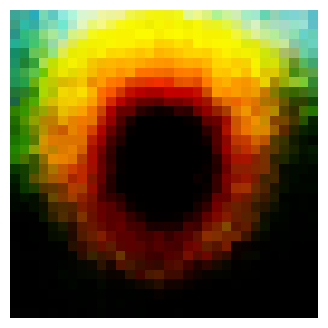

Epoch 22/100, Rec Loss: 2020.4388427734375, KL Div: 5.737245559692383
Epoch 23/100, Rec Loss: 2122.0693359375, KL Div: 1.925258994102478
Epoch 24/100, Rec Loss: 2075.694091796875, KL Div: 5.691468715667725
Epoch 25/100, Rec Loss: 2098.287353515625, KL Div: 3.150724172592163
Epoch 26/100, Rec Loss: 2100.05224609375, KL Div: 3.6065330505371094
Epoch 27/100, Rec Loss: 2027.2542724609375, KL Div: 5.7553558349609375
Epoch 28/100, Rec Loss: 1997.3726806640625, KL Div: 3.344073534011841
Epoch 29/100, Rec Loss: 2019.7723388671875, KL Div: 2.2050487995147705
Epoch 30/100, Rec Loss: 2020.5399169921875, KL Div: 3.5022056102752686
Epoch 31/100, Rec Loss: 2039.3731689453125, KL Div: 1.4595794677734375


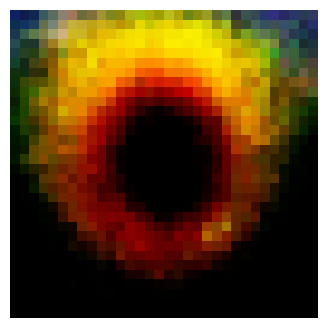

Epoch 32/100, Rec Loss: 2043.3040771484375, KL Div: 3.746953248977661
Epoch 33/100, Rec Loss: 2119.8349609375, KL Div: 2.7424354553222656
Epoch 34/100, Rec Loss: 2101.056884765625, KL Div: 0.9137049317359924
Epoch 35/100, Rec Loss: 2120.0966796875, KL Div: 0.7985646724700928
Epoch 36/100, Rec Loss: 2040.2662353515625, KL Div: 5.9937310218811035
Epoch 37/100, Rec Loss: 2042.5491943359375, KL Div: 5.157759189605713
Epoch 38/100, Rec Loss: 2064.70849609375, KL Div: 5.220376491546631
Epoch 39/100, Rec Loss: 2111.632080078125, KL Div: 3.291818618774414
Epoch 40/100, Rec Loss: 1995.5543212890625, KL Div: 3.347198724746704
Epoch 41/100, Rec Loss: 2071.585693359375, KL Div: 2.2316482067108154


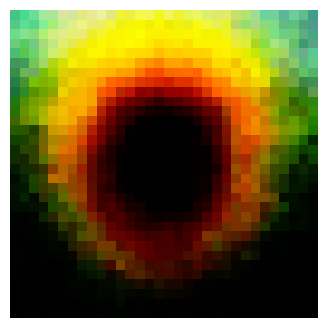

Epoch 42/100, Rec Loss: 2046.0770263671875, KL Div: 2.8824405670166016
Epoch 43/100, Rec Loss: 2004.6656494140625, KL Div: 6.069362640380859
Epoch 44/100, Rec Loss: 2051.80322265625, KL Div: 4.023046970367432
Epoch 45/100, Rec Loss: 2086.2890625, KL Div: 3.771212339401245
Epoch 46/100, Rec Loss: 2010.3424072265625, KL Div: 1.1572169065475464
Epoch 47/100, Rec Loss: 2095.27294921875, KL Div: 1.9268079996109009
Epoch 48/100, Rec Loss: 2130.82275390625, KL Div: 3.18957257270813
Epoch 49/100, Rec Loss: 2077.81689453125, KL Div: 1.9841281175613403
Epoch 50/100, Rec Loss: 2109.247314453125, KL Div: 3.5562946796417236
Epoch 51/100, Rec Loss: 2122.940673828125, KL Div: 5.6347479820251465


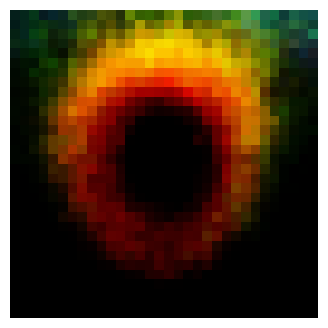

Epoch 52/100, Rec Loss: 2114.1533203125, KL Div: 4.786455154418945
Epoch 53/100, Rec Loss: 1908.9326171875, KL Div: 6.209728717803955
Epoch 54/100, Rec Loss: 2104.372802734375, KL Div: 3.9100494384765625
Epoch 55/100, Rec Loss: 2131.73876953125, KL Div: 4.2650604248046875
Epoch 56/100, Rec Loss: 2122.5048828125, KL Div: 3.6024014949798584
Epoch 57/100, Rec Loss: 2037.0166015625, KL Div: 1.666300892829895
Epoch 58/100, Rec Loss: 2051.49609375, KL Div: 2.69020676612854
Epoch 59/100, Rec Loss: 2097.860595703125, KL Div: 4.280045032501221
Epoch 60/100, Rec Loss: 2055.917236328125, KL Div: 3.9321422576904297
Epoch 61/100, Rec Loss: 2108.898681640625, KL Div: 2.9685792922973633


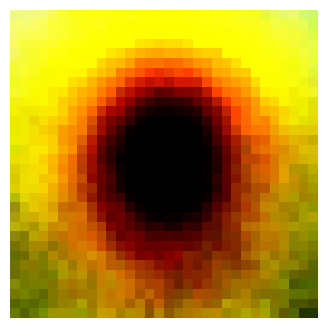

Epoch 62/100, Rec Loss: 2032.11572265625, KL Div: 5.729547023773193
Epoch 63/100, Rec Loss: 1948.900390625, KL Div: 4.871610164642334
Epoch 64/100, Rec Loss: 2139.406005859375, KL Div: 0.9611418843269348
Epoch 65/100, Rec Loss: 2035.1552734375, KL Div: 1.8511558771133423
Epoch 66/100, Rec Loss: 2079.025146484375, KL Div: 1.9820715188980103
Epoch 67/100, Rec Loss: 2136.969970703125, KL Div: 3.4347684383392334
Epoch 68/100, Rec Loss: 2121.248291015625, KL Div: 3.234320640563965
Epoch 69/100, Rec Loss: 2121.414794921875, KL Div: 4.857408046722412
Epoch 70/100, Rec Loss: 1985.5296630859375, KL Div: 4.44317102432251
Epoch 71/100, Rec Loss: 2111.520751953125, KL Div: 4.0368170738220215


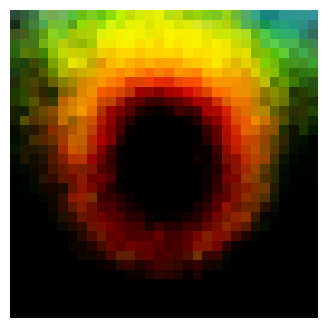

Epoch 72/100, Rec Loss: 2105.775146484375, KL Div: 2.114459991455078
Epoch 73/100, Rec Loss: 2001.1898193359375, KL Div: 8.790095329284668
Epoch 74/100, Rec Loss: 2138.151123046875, KL Div: 2.5379483699798584
Epoch 75/100, Rec Loss: 2066.6103515625, KL Div: 3.0841639041900635
Epoch 76/100, Rec Loss: 2063.214599609375, KL Div: 0.9263346791267395
Epoch 77/100, Rec Loss: 2085.51806640625, KL Div: 4.087184429168701
Epoch 78/100, Rec Loss: 2074.615966796875, KL Div: 3.8763034343719482
Epoch 79/100, Rec Loss: 2123.32666015625, KL Div: 4.0853142738342285
Epoch 80/100, Rec Loss: 2055.496826171875, KL Div: 4.307247638702393
Epoch 81/100, Rec Loss: 2025.5003662109375, KL Div: 4.909937381744385


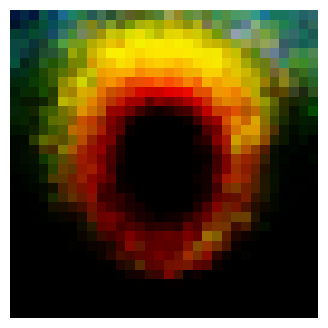

Epoch 82/100, Rec Loss: 2114.445068359375, KL Div: 3.511084794998169
Epoch 83/100, Rec Loss: 2114.7451171875, KL Div: 1.7212258577346802
Epoch 84/100, Rec Loss: 2065.043701171875, KL Div: 4.557499408721924
Epoch 85/100, Rec Loss: 2072.5087890625, KL Div: 1.804499626159668
Epoch 86/100, Rec Loss: 1952.1256103515625, KL Div: 4.712189197540283
Epoch 87/100, Rec Loss: 2091.52734375, KL Div: 1.949806571006775
Epoch 88/100, Rec Loss: 2124.2060546875, KL Div: 6.536719799041748
Epoch 89/100, Rec Loss: 2066.099365234375, KL Div: 7.097576141357422
Epoch 90/100, Rec Loss: 2035.9525146484375, KL Div: 0.5408149361610413
Epoch 91/100, Rec Loss: 2036.7750244140625, KL Div: 3.191419839859009


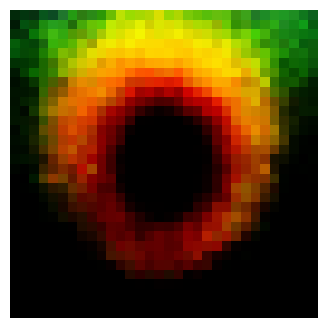

Epoch 92/100, Rec Loss: 1989.6923828125, KL Div: 4.759225368499756
Epoch 93/100, Rec Loss: 2064.124755859375, KL Div: 4.847812175750732
Epoch 94/100, Rec Loss: 2092.824951171875, KL Div: 4.091633319854736
Epoch 95/100, Rec Loss: 2056.518798828125, KL Div: 4.148961544036865
Epoch 96/100, Rec Loss: 2057.450439453125, KL Div: 4.675461769104004
Epoch 97/100, Rec Loss: 1996.7891845703125, KL Div: 1.7901710271835327
Epoch 98/100, Rec Loss: 2069.461669921875, KL Div: 2.122281074523926
Epoch 99/100, Rec Loss: 2141.265869140625, KL Div: 3.365546226501465
Epoch 100/100, Rec Loss: 2084.888916015625, KL Div: 4.588538646697998


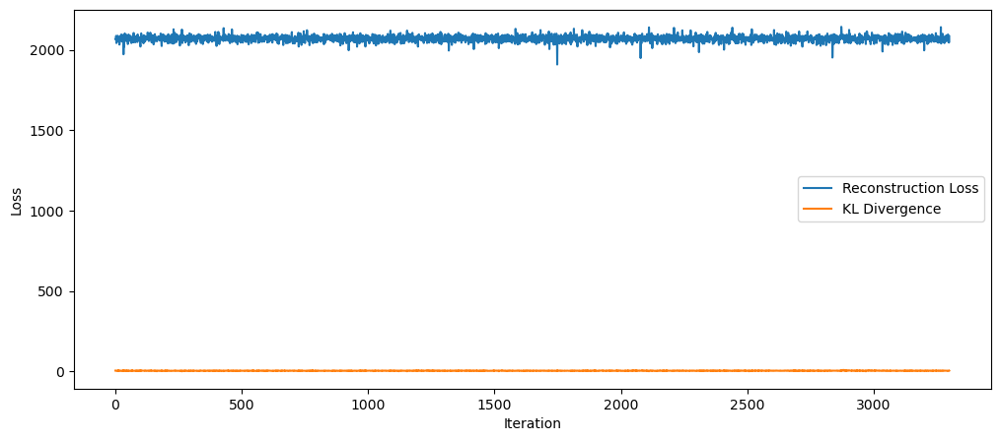

In [172]:
history = {'rec_loss': [], 'kl_div': []}

for epoch in range(num_epochs):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 3072])
        with tf.GradientTape() as tape:
            x_rec_logits, mu, log_var = vae(x)
            rec_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=x, logits=x_rec_logits)
            rec_loss = tf.reduce_sum(rec_loss) / x.shape[0]
            kl_div = -0.5 * (log_var + 1 - mu**2 - tf.exp(log_var))
            kl_div = tf.reduce_sum(kl_div) / x.shape[0]
            loss = rec_loss + 1.0 * kl_div

        # Calculate gradients and update weights
        grads = tape.gradient(loss, vae.trainable_variables)
        optimizer.apply_gradients(zip(grads, vae.trainable_variables))

        # Save training history
        history['rec_loss'].append(rec_loss.numpy())
        history['kl_div'].append(kl_div.numpy())

    # Print training progress every 10 epochs
    #if epoch % 10 == 0:
    print(f"Epoch {epoch+1}/{num_epochs}, Rec Loss: {rec_loss.numpy()}, KL Div: {kl_div.numpy()}")

    # Generate and plot images every 10 epochs
    if epoch % 10 == 0:
        generated_images = vae.decoder(tf.random.normal(shape=(1, latent_dim)))
        generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
        plt.figure(figsize=(4, 4))
        for i in range(1):
            plt.subplot(1, 1, i+1)
            plt.imshow(generated_images[i].numpy())
            plt.axis('off')
        plt.show()

# Plot training history
plt.figure(figsize=(12, 5))
plt.plot(history['rec_loss'], label='Reconstruction Loss')
plt.plot(history['kl_div'], label='KL Divergence')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()

---

# VAE-GAN

Epoch 1/100, Total Loss: 0.06702519953250885, Rec Loss: 0.057228267192840576, Adv Loss: 0.009796933270990849
Epoch 11/100, Total Loss: 0.04645480215549469, Rec Loss: 0.04554123803973198, Adv Loss: 0.0009135630098171532
Epoch 21/100, Total Loss: 0.03939162567257881, Rec Loss: 0.03924103453755379, Adv Loss: 0.0001505926193203777
Epoch 31/100, Total Loss: 0.029572246596217155, Rec Loss: 0.029494592919945717, Adv Loss: 7.765391637803987e-05
Epoch 41/100, Total Loss: 0.019007893279194832, Rec Loss: 0.018850626423954964, Adv Loss: 0.0001572659966768697
Epoch 51/100, Total Loss: 0.030481381341814995, Rec Loss: 0.03031706064939499, Adv Loss: 0.00016432133270427585
Epoch 61/100, Total Loss: 0.02435077540576458, Rec Loss: 0.02432706393301487, Adv Loss: 2.3711980247753672e-05
Epoch 71/100, Total Loss: 0.0280451662838459, Rec Loss: 0.02804163098335266, Adv Loss: 3.5347927678230917e-06
Epoch 81/100, Total Loss: 0.0225346852093935, Rec Loss: 0.022526299580931664, Adv Loss: 8.384856300835963e-06
Epoc

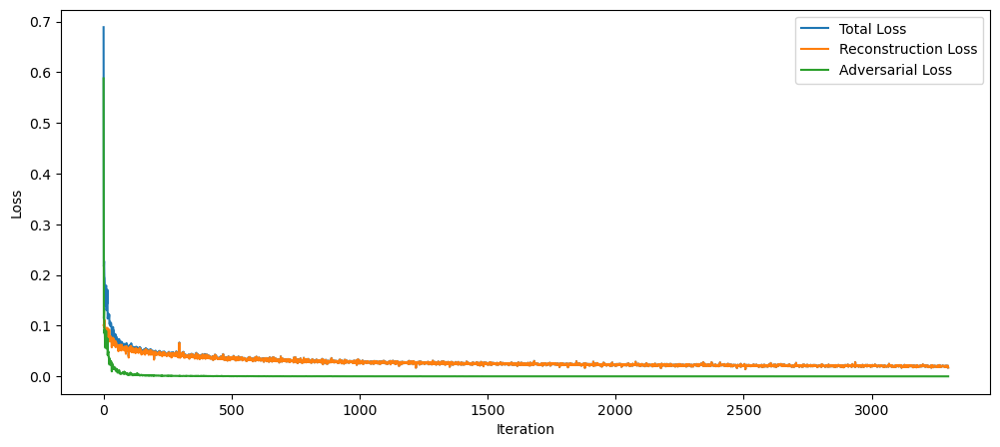

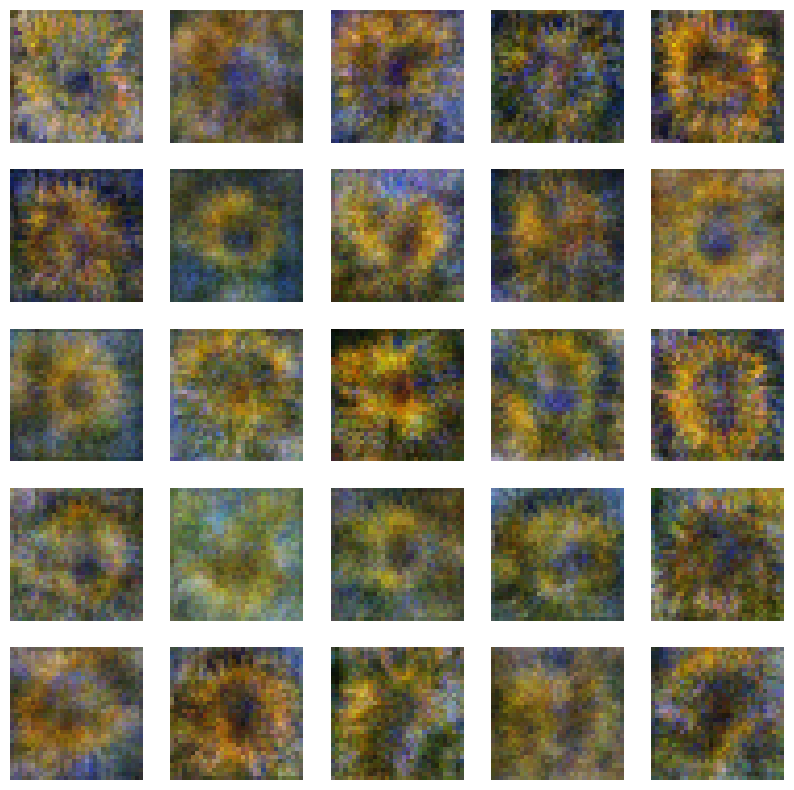

In [173]:
import tensorflow as tf
from tensorflow.keras import layers, optimizers, losses
import matplotlib.pyplot as plt

class AAE(tf.keras.Model):
    def __init__(self, latent_dim=10):
        super(AAE, self).__init__()
        self.latent_dim = latent_dim

        # Encoder
        self.encoder = tf.keras.Sequential([
            layers.InputLayer(input_shape=(3072,)),  # Assuming input size is 32x32x3
            layers.Dense(128, activation='relu'),
            layers.Dense(latent_dim)  # Output layer for mean of the latent space
        ])

        # Decoder
        self.decoder = tf.keras.Sequential([
            layers.InputLayer(input_shape=(latent_dim,)),
            layers.Dense(128, activation='relu'),
            layers.Dense(3072, activation='sigmoid')  # Output layer for reconstruction
        ])

        # Discriminator
        self.discriminator = tf.keras.Sequential([
            layers.InputLayer(input_shape=(latent_dim,)),
            layers.Dense(128, activation='relu'),
            layers.Dense(1, activation='sigmoid')  # Output layer for real/fake classification
        ])

    def encode(self, x):
        return self.encoder(x)

    def decode(self, z):
        return self.decoder(z)

    def discriminate(self, z):
        return self.discriminator(z)

    def call(self, x, training=None):
        z = self.encode(x)
        x_reconstructed = self.decode(z)
        return x_reconstructed, z

# 創建 AAE 模型
latent_dim = 256  # 可以根據需要調整 latent_dim 的大小
aae = AAE(latent_dim=latent_dim)

# 指定優化器
lr = 1e-3
optimizer = optimizers.Adam(lr)

# 指定 reconstruction loss 和 adversarial loss
reconstruction_loss = losses.MeanSquaredError()
adversarial_loss = losses.BinaryCrossentropy()

# 定義一個訓練步驟
def train_step(x):
    with tf.GradientTape(persistent=True) as tape:
        # Forward pass
        x_reconstructed, z = aae(x)

        # Reconstruction loss
        rec_loss = reconstruction_loss(x, x_reconstructed)

        # Adversarial loss
        fake_labels = tf.zeros((x.shape[0], 1))  # Label for generated samples
        real_labels = tf.ones((x.shape[0], 1))   # Label for real samples

        fake_loss = adversarial_loss(fake_labels, aae.discriminate(z))
        real_loss = adversarial_loss(real_labels, aae.discriminate(tf.random.normal(shape=(x.shape[0], latent_dim))))

        adv_loss = (fake_loss + real_loss) / 2.0  # Average of fake and real loss

        # Total loss
        total_loss = rec_loss + adv_loss

    # Compute gradients and update weights
    gradients = tape.gradient(total_loss, aae.trainable_variables)
    optimizer.apply_gradients(zip(gradients, aae.trainable_variables))

    return total_loss, rec_loss, adv_loss

# 訓練模型
num_epochs = 100
history = {'total_loss': [], 'rec_loss': [], 'adv_loss': []}

for epoch in range(num_epochs):
    for step, x in enumerate(train_db):
        x = tf.reshape(x, [-1, 3072])
        total_loss, rec_loss, adv_loss = train_step(x)

        # Save training history
        history['total_loss'].append(total_loss.numpy())
        history['rec_loss'].append(rec_loss.numpy())
        history['adv_loss'].append(adv_loss.numpy())

    # Print training progress every 10 epochs
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Total Loss: {total_loss.numpy()}, "
              f"Rec Loss: {rec_loss.numpy()}, Adv Loss: {adv_loss.numpy()}")

# Plot training history
plt.figure(figsize=(12, 5))
plt.plot(history['total_loss'], label='Total Loss')
plt.plot(history['rec_loss'], label='Reconstruction Loss')
plt.plot(history['adv_loss'], label='Adversarial Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Generate and plot images
generated_images = aae.decode(tf.random.normal(shape=(25, latent_dim)))
generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(generated_images[i].numpy())
    plt.axis('off')
plt.show()


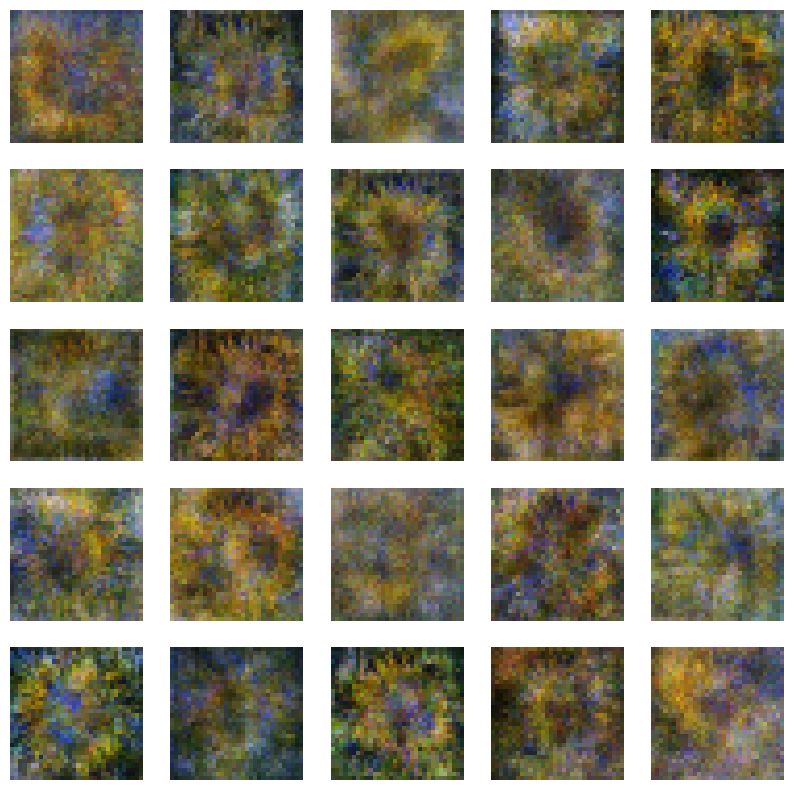

In [177]:
generated_images = aae.decode(tf.random.normal(shape=(25, latent_dim)))
generated_images = tf.reshape(generated_images, [-1, 32, 32, 3])
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(generated_images[i].numpy())
    plt.axis('off')
plt.show()